### Check whether the pre-processed data has been de-meaned

In [4]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [5]:
data_dir = '/vols/Data/HCP/Phase2/group1200/node_timeseries/3T_HCP1200_MSMAll_d15_ts2/'
data = np.loadtxt(f"{data_dir}100206.txt")
print(data.shape)

(4800, 15)


In [14]:
print(np.std(data[:1200,5]))
print(np.std(data[1200:2400,5]))
print(np.std(data[2400:3600,5]))
print(np.std(data[3600:4800,5]))

73.97078169525533
71.50405805815484
59.740868684702896
60.80229374610422


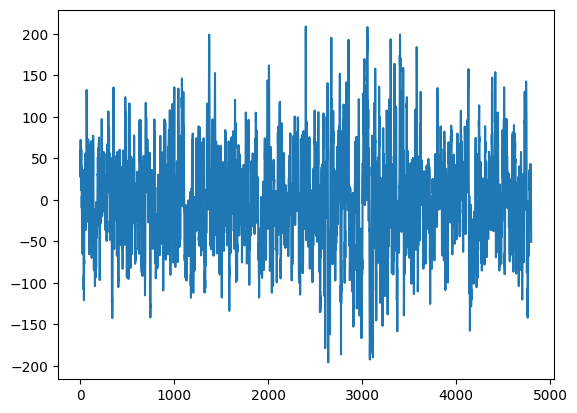

In [7]:
plt.plot(np.squeeze(data[:,0]))

So we need to z-score each session (1200 time points). Let's write a function for this!

In [72]:
def z_score(data:np.ndarray,n_session:int = 1):
    """
    z_score the input data.
    If n_session = 1, then z_score directly
    If n_session > 1, then divide the data into different sessions,
    z-score separately, and then concatenate back.
    
    Parameters:
    data (np.ndarray): (n_timepoints,n_channel)
    n_session (int): the number of sessions
    
    Returns
    np.ndarray: z-scored data
    """
    import scipy.stats as stats
    
    if n_session == 1:
        return stats.zscore(data,axis=0)
    else:
        if len(data) % n_session > 0:
            raise ValueError('Number of time points is not divisible by n_session!')
        n_timepoint, n_channel = data.shape
        
        #  Split to n sessions
        data = np.reshape(data,(n_session,-1,n_channel))
        
        # z-score
        data = stats.zscore(data,axis=1)
        
        # Concatenate and reshape
        return np.reshape(data,(n_timepoint,n_channel))
        
        

In [79]:
def test_z_score():
    import numpy as np
    import numpy.testing as npt
    
    # Example 1: one session
    x = np.array([[0.5,1.5,2.5],[-2.0,-1.0,0.0]]).T
    y = z_score(x)
    npt.assert_equal(y[:,0], y[:,1])
    
    # Example 2: two sessions
    np.random.seed(42)
    x1 = np.random.normal(loc=100.0,scale=100.0,size=(100,2))
    x2 = np.random.normal(loc=0.0,scale=2.0,size=(100,2))
    x = np.concatenate([x1,x2])
    y = z_score(x,n_session=2)
    
    # Check the data are z-scored
    npt.assert_almost_equal(np.mean(y[:100,:]),0.0,decimal=3)
    npt.assert_almost_equal(np.std(y[:100,:]),1.0,decimal=3)
    npt.assert_almost_equal(np.mean(y[100:,:]),0.0,decimal=3)
    npt.assert_almost_equal(np.std(y[100:,:]),1.0,decimal=3)
    

In [80]:
test_z_score()

### Write a function to load data

In [81]:
import pathlib
from osl_dynamics.data import Data
class PrepareData():
    def __init__(self,data_dir:pathlib.Path,n_session:int=4):
        self.data_dir = data_dir
        self.n_session = n_session
        
    def load(self,):
        '''
        Load data from specified directories
        Returns:
        tuple: A tuple containing the following
            - subjs (list): A list of read-in subjects
            - dataset (osl_dynamics.data.Data): the wrappeed dataset
        '''
        subjs = []
        data_list = []
        for file in self.data_dir.glob('*.txt'):
            subjs.append(file.stem)
            data_list.append(z_score(np.loadtxt(file),self.n_session))
        
        print('Read from directory: ',self.data_dir)
        print('Number of subjects: ',len(subjs))
        
        return subjs, Data(data_list)

/home/fs0/lmh182/.conda/envs/osld/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [83]:
import pathlib
data_dir = pathlib.Path('/vols/Data/HCP/Phase2/group1200/node_timeseries/3T_HCP1200_MSMAll_d15_ts2/')
prepare_data = PrepareData(data_dir)
subjs, dataset = prepare_data.load()

Read from directory:  /vols/Data/HCP/Phase2/group1200/node_timeseries/3T_HCP1200_MSMAll_d15_ts2
Number of subjects:  1003


Loading files: 100%|██████| 1003/1003 [00:13<00:00, 76.75it/s]


In [84]:
print(len(subjs))

1003


Attention: We need to sort the input files otherwise something would go wrong. Let's give it a try here!

In [90]:
data_dir = pathlib.Path('/vols/Data/HCP/Phase2/group1200/node_timeseries/3T_HCP1200_MSMAll_d15_ts2/')

In [91]:
print(data_dir.glob('*.txt'))

<generator object Path.glob at 0x7f3ce767b120>


In [93]:
for file in sorted(data_dir.glob('*.txt')):
    print(file)

/vols/Data/HCP/Phase2/group1200/node_timeseries/3T_HCP1200_MSMAll_d15_ts2/100206.txt
/vols/Data/HCP/Phase2/group1200/node_timeseries/3T_HCP1200_MSMAll_d15_ts2/100307.txt
/vols/Data/HCP/Phase2/group1200/node_timeseries/3T_HCP1200_MSMAll_d15_ts2/100408.txt
/vols/Data/HCP/Phase2/group1200/node_timeseries/3T_HCP1200_MSMAll_d15_ts2/100610.txt
/vols/Data/HCP/Phase2/group1200/node_timeseries/3T_HCP1200_MSMAll_d15_ts2/101006.txt
/vols/Data/HCP/Phase2/group1200/node_timeseries/3T_HCP1200_MSMAll_d15_ts2/101107.txt
/vols/Data/HCP/Phase2/group1200/node_timeseries/3T_HCP1200_MSMAll_d15_ts2/101309.txt
/vols/Data/HCP/Phase2/group1200/node_timeseries/3T_HCP1200_MSMAll_d15_ts2/101915.txt
/vols/Data/HCP/Phase2/group1200/node_timeseries/3T_HCP1200_MSMAll_d15_ts2/102008.txt
/vols/Data/HCP/Phase2/group1200/node_timeseries/3T_HCP1200_MSMAll_d15_ts2/102109.txt
/vols/Data/HCP/Phase2/group1200/node_timeseries/3T_HCP1200_MSMAll_d15_ts2/102311.txt
/vols/Data/HCP/Phase2/group1200/node_timeseries/3T_HCP1200_MSMAll

In [94]:
1118 / 4

279.5

In [99]:
x = np.reshape(np.arange(24),(6,4))
print(x)
print('####################')
y = np.split(x,3)
print(y)

[[ 0  1  2  3]
 [ 4  5  6  7]
 [ 8  9 10 11]
 [12 13 14 15]
 [16 17 18 19]
 [20 21 22 23]]
####################
[array([[0, 1, 2, 3],
       [4, 5, 6, 7]]), array([[ 8,  9, 10, 11],
       [12, 13, 14, 15]]), array([[16, 17, 18, 19],
       [20, 21, 22, 23]])]


In [3]:
stats.zscore(np.array([-1,1]))

NameError: name 'stats' is not defined

In [10]:
import numpy as np
import numpy.testing as npt

def test_prepare_data():
    import shutil, os
    import pathlib
    from rotation.preprocessing import PrepareData
    temp_dir = './test_temp/'
    # Create the directory if not exists
    if not os.path.exists(temp_dir):
        print(f'Create the temporary directory {temp_dir}')
        os.makedirs(temp_dir)
    
    # Create a subject
    subj_name = '10001'
    data = np.array([[-1,1,-1,1],[1,-1,1,-1]]).T
    np.savetxt(f'{temp_dir}{subj_name}.txt', data)
    
    # Use the PrepareData class
    prepare_data = PrepareData(pathlib.Path(temp_dir),2)
    subj,result = prepare_data.load()
    npt.assert_equal(subj[0],'10001')
    npt.assert_equal(result[0],np.array([[-1,1],[1,-1]]))
    npt.assert_equal(result[1],np.array([[-1,1],[1,-1]]))
    
    # Delete the directory
    if os.path.exists(temp_dir):
        shutil.rmtree(temp_dir)
        print(f'Delete temporary directory {temp_dir}')

In [11]:
test_prepare_data()

Create the temporary directory ./test_temp/
Read from directory:  test_temp
Number of subjects:  1
Delete temporary directory ./test_temp/


In [14]:
4800 * 300 * 1003

1444320000

In [15]:
4000 * 300 * 300 * 1200

432000000000

### training on HMM

In [ ]:
def HMM_training(dataset,n_states,n_channels,save_dir):
    from osl_dynamics.models.hmm import Config, Model
    # Create a config object
    config = Config(
        n_states=n_states,
        n_channels=n_channels,
        sequence_length=600,
        learn_means=True,
        learn_covariances=True,
        batch_size=32,
        learning_rate=1e-3,
        n_epochs=40,
    )
    
    # Initiate a Model class and print a summary
    model = Model(config)
    model.summary()
    
    # Initialization
    init_history = model.random_state_time_course_initialization(training_data, n_epochs=1, n_init=3)
    
    # Full training
    history = model.fit(training_data)
    model.save(save_dir)

## Post-training analysis

### Question: What does the model look like?

In [5]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import seaborn
%matplotlib inline

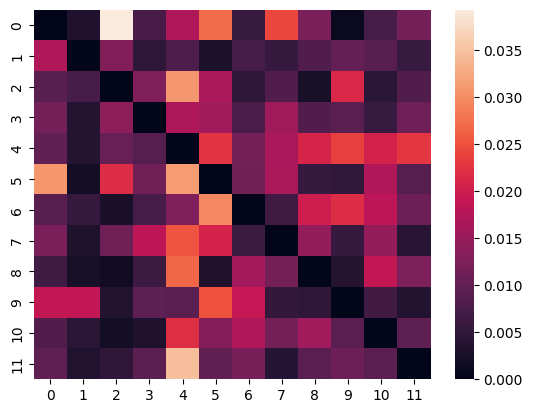

In [21]:
result_dir = './results/'
result_1_dir = f'{result_dir}HMM_ICA_15_state_12/'
trans_prob = np.load(f'{result_1_dir}trans_prob.npy')
np.fill_diagonal(trans_prob,0)
seaborn.heatmap(trans_prob)
plt.show()

In [22]:
import yaml
with open(f'{result_1_dir}config.yml','r') as file:
    config = yaml.safe_load(file)
    
print(config)

{'batch_size': 32, 'covariances_epsilon': 1e-06, 'covariances_regularizer': None, 'diagonal_covariances': False, 'gradient_clip': None, 'initial_covariances': None, 'initial_means': None, 'initial_trans_prob': None, 'learn_covariances': True, 'learn_means': True, 'learn_trans_prob': True, 'learning_rate': 0.001, 'means_regularizer': None, 'model_name': 'HMM', 'multi_gpu': False, 'multiple_dynamics': False, 'n_channels': 15, 'n_epochs': 40, 'n_modes': None, 'n_states': 12, 'observation_update_decay': 0.1, 'optimizer': 'adam', 'sequence_length': 600, 'state_probs_t0': None, 'strategy': None, 'trans_prob_update_delay': 5, 'trans_prob_update_forget': 0.7}


### Question: how to load the model and infer the hidden states?

In [23]:
from osl_dynamics.models import load

model = load(result_1_dir)

2023-07-10 14:49:54 INFO osl-dynamics [mod_base.py:485:load]: Loading model: ./results/HMM_ICA_15_state_12/


In [24]:
import pathlib
from rotation.preprocessing import PrepareData
n_channels = 15
data_dir = pathlib.Path(f'/vols/Data/HCP/Phase2/group1200/node_timeseries/3T_HCP1200_MSMAll_d{n_channels}_ts2/')
prepare_data = PrepareData(data_dir)
subj,dataset = prepare_data.load()
    
alpha = model.get_alpha(dataset)

Read from directory:  /vols/Data/HCP/Phase2/group1200/node_timeseries/3T_HCP1200_MSMAll_d15_ts2
Number of subjects:  1003


Loading files: 100%|█████| 4012/4012 [00:29<00:00, 136.52it/s]
2023-07-10 14:50:57 INFO osl-dynamics [hmm.py:1093:get_alpha]: Getting alpha
2023-07-10 14:50:57.301349: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:51:03 INFO numba.core.transforms [transforms.py:58:_extract_loop_lifting_candidates]: finding looplift candidates
2023-07-10 14:51:05.718853: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:51:05.971241: I tensorflow

2023-07-10 14:51:16.227648: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:51:16.857340: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:51:17.421342: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:51:28.035225: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:51:28.372031: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:51:28.610290: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:51:39.814941: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:51:40.366794: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:51:41.028605: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:51:52.982565: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:51:53.365637: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:51:53.864192: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:52:05.623308: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:52:06.129105: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:52:06.540725: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:52:16.955174: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:52:17.629527: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:52:18.191423: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:52:27.870218: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:52:28.284571: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:52:28.622601: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:52:36.543952: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:52:37.114423: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:52:37.627824: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:52:45.414560: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:52:45.655916: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:52:45.895600: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:52:53.659843: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:52:54.238366: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:52:54.911754: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:53:04.422015: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:53:04.659115: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:53:04.894723: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:53:14.128828: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:53:14.728812: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:53:15.335146: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:53:22.737688: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:53:22.987227: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:53:23.309887: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:53:30.619117: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:53:30.882907: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:53:31.148365: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:53:39.063680: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:53:39.509478: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:53:39.880748: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:53:50.073229: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:53:50.697802: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:53:51.360161: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:54:02.121476: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:54:02.429683: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:54:02.728643: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:54:13.173047: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:54:13.702200: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:54:13.952903: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:54:22.843552: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:54:23.502980: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:54:24.130020: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:54:35.192506: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:54:35.445920: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:54:35.707039: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:54:46.330705: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:54:47.018921: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:54:47.610421: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:54:57.435497: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:54:57.685069: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:54:57.926999: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:55:07.953815: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:55:08.210921: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:55:08.841260: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:55:18.909897: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:55:19.220937: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:55:19.478259: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:55:31.232387: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:55:31.477754: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:55:32.058577: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:55:40.329653: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:55:40.585091: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:55:41.094621: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:55:49.197203: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:55:49.455436: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:55:49.721055: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:56:01.472225: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:56:01.870994: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:56:02.632931: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:56:11.618003: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:56:12.100868: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:56:12.535209: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:56:23.958863: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:56:24.357158: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:56:24.708329: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:56:33.528099: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:56:34.216005: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:56:34.882885: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:56:45.905320: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:56:46.476400: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:56:47.133962: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:56:57.231367: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:56:57.870271: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:56:58.352148: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:57:09.162260: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:57:09.592389: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:57:09.959155: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:57:18.362865: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:57:19.034060: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:57:19.603894: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:57:29.208222: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:57:29.796459: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:57:30.272675: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:57:40.123238: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:57:40.576599: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:57:40.958105: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:57:50.365974: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:57:51.005923: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:57:51.569306: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:58:00.996527: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:58:01.424300: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:58:02.115866: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:58:09.366426: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:58:09.620271: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:58:10.193879: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:58:16.228036: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:58:16.469089: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:58:16.709533: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:58:25.088989: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:58:25.594226: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:58:26.007576: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:58:35.963652: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:58:36.343538: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:58:36.676928: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:58:44.721583: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:58:45.022620: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:58:45.299158: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:58:52.165535: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:58:52.418520: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:58:52.661227: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:59:02.640380: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:59:03.199823: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:59:03.439790: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:59:10.558340: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:59:11.003149: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:59:11.381182: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:59:19.219041: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:59:19.839524: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:59:20.329550: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:59:29.477262: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:59:29.939076: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:59:30.321974: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:59:36.223833: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:59:36.859683: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:59:37.425096: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:59:47.650796: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:59:47.908042: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:59:48.149407: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 14:59:56.011716: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:59:56.672016: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 14:59:57.196891: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:00:03.729750: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:00:03.972191: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:00:04.239918: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:00:14.135438: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:00:14.713188: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:00:14.971259: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:00:22.408532: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:00:22.648391: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:00:23.219484: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:00:32.177278: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:00:32.418977: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:00:32.662840: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:00:44.605389: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:00:45.262178: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:00:45.801596: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:00:56.183445: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:00:56.435956: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:00:56.684767: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:01:08.005268: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:01:08.357219: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:01:09.043570: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:01:20.735159: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:01:20.982843: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:01:21.232959: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:01:30.020542: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:01:30.421027: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:01:31.095214: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:01:40.642190: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:01:41.226036: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:01:41.471694: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:01:50.445971: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:01:50.740616: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:01:50.994344: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:01:59.224348: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:01:59.472542: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:01:59.719825: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:02:10.369353: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:02:11.033152: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:02:11.696241: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:02:18.930768: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:02:19.178071: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:02:19.423079: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:02:27.165234: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:02:27.733184: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:02:27.981381: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:02:36.719682: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:02:36.978493: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:02:37.230622: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:02:47.651505: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:02:48.097776: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:02:48.512431: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:02:57.890490: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:02:58.378402: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:02:59.032197: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:03:07.642078: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:03:07.890586: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:03:08.135112: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:03:19.198941: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:03:19.454770: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:03:20.149610: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:03:29.457198: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:03:29.738497: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:03:30.431297: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:03:39.451684: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:03:39.718065: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:03:40.399374: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:03:50.519799: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:03:50.889213: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:03:51.214905: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:03:59.964132: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:04:00.210022: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:04:00.461947: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:04:10.449597: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:04:10.696370: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:04:11.252190: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:04:20.449169: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:04:20.693073: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:04:20.935353: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:04:30.415988: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:04:30.783677: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:04:31.029002: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:04:38.834696: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:04:39.090181: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:04:39.333001: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:04:48.532462: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:04:48.991371: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:04:49.382095: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:04:58.682554: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:04:59.243775: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:04:59.490190: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:05:08.349296: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:05:08.964917: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:05:09.584546: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:05:17.870459: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:05:18.561432: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:05:19.234729: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:05:27.464789: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:05:27.710283: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:05:27.955686: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:05:36.059934: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:05:36.433298: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:05:36.853932: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:05:48.315233: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:05:48.576861: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:05:48.832852: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:05:56.480904: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:05:56.724077: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:05:56.967805: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:06:05.703808: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:06:05.943687: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:06:06.187642: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:06:15.582939: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:06:16.205122: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:06:16.446138: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:06:24.884520: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:06:25.274817: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:06:25.887774: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:06:34.086398: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:06:34.332026: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:06:34.575091: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:06:42.544314: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:06:43.203974: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:06:43.456450: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:06:51.485773: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:06:51.751699: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:06:51.992600: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:07:03.738690: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:07:04.083595: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:07:04.655524: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:07:13.704355: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:07:13.952188: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:07:14.200104: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:07:23.935991: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:07:24.627332: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:07:25.232828: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:07:35.495509: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:07:36.181649: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:07:36.433976: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:07:45.681489: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:07:46.133655: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:07:46.712674: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:07:53.902335: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:07:54.153501: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:07:54.397037: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:08:02.628992: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:08:02.874417: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:08:03.114121: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:08:10.481392: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:08:10.717654: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:08:10.961311: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:08:19.682395: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:08:20.248880: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:08:20.492248: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:08:28.794657: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:08:29.062780: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:08:29.317046: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:08:37.444309: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:08:38.053805: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:08:38.703626: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:08:49.023136: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:08:49.571783: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:08:50.145338: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:08:59.725285: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:09:00.366138: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:09:01.047873: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:09:09.611015: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:09:10.155384: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:09:10.581180: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:09:20.347532: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:09:20.610653: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:09:20.856165: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:09:29.969161: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:09:30.213889: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:09:30.456012: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:09:40.973989: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:09:41.338347: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:09:41.583174: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:09:50.263994: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:09:50.500493: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:09:50.744599: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:09:59.667911: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:10:00.205209: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:10:00.455867: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:10:09.595611: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:10:09.980348: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:10:10.458263: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:10:18.624367: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:10:19.063036: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:10:19.528282: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:10:26.148091: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:10:26.805954: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:10:27.407330: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:10:34.164482: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:10:34.417653: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:10:34.662006: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:10:42.570757: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:10:43.212960: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:10:43.458788: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:10:49.246555: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:10:49.506362: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:10:49.757207: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:10:58.886221: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:10:59.523612: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:10:59.862971: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:11:07.426467: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:11:08.102523: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:11:08.732284: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:11:17.737702: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:11:17.988266: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:11:18.239306: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:11:25.152203: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:11:25.394283: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:11:25.634498: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:11:34.139439: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:11:34.422518: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:11:34.671649: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:11:42.692829: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:11:42.951731: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:11:43.198993: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:11:52.062718: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:11:52.374167: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:11:52.657442: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:12:00.716899: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:12:00.960611: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:12:01.202883: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:12:09.259908: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:12:09.500363: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:12:09.828031: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:12:19.438809: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:12:19.704343: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:12:20.276242: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:12:26.699241: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:12:26.951905: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:12:27.648071: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:12:37.731887: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:12:37.984518: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:12:38.277092: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:12:48.212677: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:12:48.906218: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:12:49.592504: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:12:58.927515: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:12:59.436398: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:13:00.028178: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:13:11.161343: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:13:11.441978: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:13:11.737252: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:13:20.616672: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:13:21.160534: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:13:21.721540: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:13:30.535428: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:13:30.995744: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:13:31.372437: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:13:40.207637: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:13:40.457671: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:13:40.704122: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:13:48.457189: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:13:48.705261: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:13:48.948216: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:13:57.750721: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:13:58.377776: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:13:58.870801: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:14:07.213369: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:14:07.463868: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:14:07.717513: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:14:16.980954: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:14:17.586784: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:14:18.219947: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:14:25.942300: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:14:26.187549: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:14:26.430539: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:14:34.103461: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:14:34.727212: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:14:34.967345: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:14:46.075381: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:14:46.718572: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:14:46.966629: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:14:57.356947: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:14:57.854644: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:14:58.264150: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:15:05.965512: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:15:06.294818: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:15:06.577819: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:15:17.214728: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:15:17.861222: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:15:18.491336: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:15:27.229111: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:15:27.864793: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:15:28.298241: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:15:38.847947: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:15:39.427412: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:15:40.056939: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:15:46.702683: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:15:46.941621: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:15:47.186901: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:15:57.128903: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:15:57.672191: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:15:58.088442: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:16:09.021593: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:16:09.431166: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:16:10.087511: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:16:17.192837: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:16:17.720609: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:16:17.962321: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:16:27.407406: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:16:28.008666: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:16:28.585126: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:16:37.253200: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:16:37.516146: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:16:37.905446: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:16:46.854933: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:16:47.243147: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:16:47.554808: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:16:56.277931: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:16:56.670153: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:16:57.255382: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:17:06.610389: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:17:07.059521: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:17:07.644783: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:17:16.665390: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:17:17.088333: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:17:17.442406: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:17:26.226873: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:17:26.468889: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:17:26.737041: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:17:36.760850: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:17:37.014957: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:17:37.684082: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:17:47.637713: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:17:48.207087: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:17:48.753875: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:18:01.607604: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:18:02.239867: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:18:02.495684: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:18:13.310917: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:18:13.798786: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:18:14.202952: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:18:23.728489: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:18:24.058890: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:18:24.717492: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:18:32.674840: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:18:33.298403: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:18:33.935601: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

2023-07-10 15:18:44.460900: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:18:45.079574: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1200,15]
	 [[{{node Placeholder/_0}}]]
2023-07-10 15:18:45.758030: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype float and shape [1

In [25]:
type(alpha)

list

In [26]:
type(alpha[0])

numpy.ndarray

In [27]:
alpha[0].shape

(1200, 12)

In [28]:
len(alpha)

4012

In [29]:
import pickle
pickle.dump(alpha, open(f'{result_1_dir}alpha.pkl', "wb"))

In [30]:
alpha[0]

array([[2.9256483e-04, 2.1780960e-03, 6.2531843e-03, ..., 2.4948446e-03,
        7.9063408e-04, 3.1569682e-04],
       [1.4581109e-05, 8.3765259e-04, 5.9707104e-03, ..., 1.4968008e-03,
        1.6649136e-03, 1.2321266e-05],
       [1.1396520e-05, 6.6842531e-06, 7.3152315e-04, ..., 8.4383806e-05,
        7.1660667e-03, 5.6155511e-07],
       ...,
       [7.1074951e-01, 4.1825572e-08, 3.1663360e-05, ..., 4.8747900e-04,
        1.8685320e-09, 5.9881685e-08],
       [8.2679802e-01, 7.4637230e-09, 2.7055499e-05, ..., 8.5863030e-07,
        2.5648489e-10, 2.9916586e-10],
       [9.1423517e-01, 7.6308275e-08, 4.1581033e-04, ..., 2.3310297e-06,
        1.9075143e-08, 2.3776222e-07]], dtype=float32)

In [35]:
alpha[0][300,:]

array([2.2677984e-10, 1.9777464e-07, 3.3698305e-07, 1.0830148e-06,
       9.6019214e-08, 5.5629685e-06, 9.5552868e-01, 1.8513897e-06,
       2.0398751e-08, 4.4461805e-02, 1.4254192e-08, 3.5274979e-07],
      dtype=float32)

### Understanding summary statistics

In [36]:
print(type(alpha))

<class 'list'>


(<Figure size 1200x250 with 2 Axes>, [<Axes: xlabel='Sample'>])

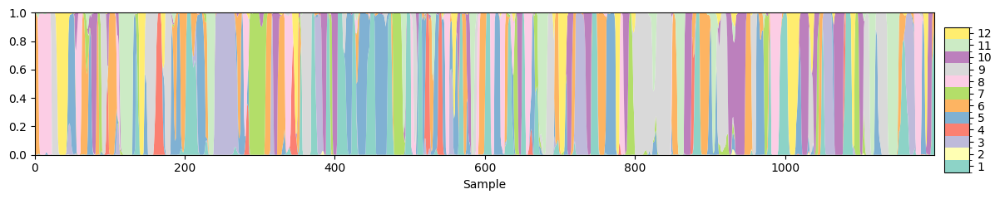

In [37]:
from osl_dynamics.utils import plotting

# Plot the state probability time course for the first subject
plotting.plot_alpha(alpha[0],n_samples=1200)

(<Figure size 1200x250 with 2 Axes>, [<Axes: xlabel='Sample'>])

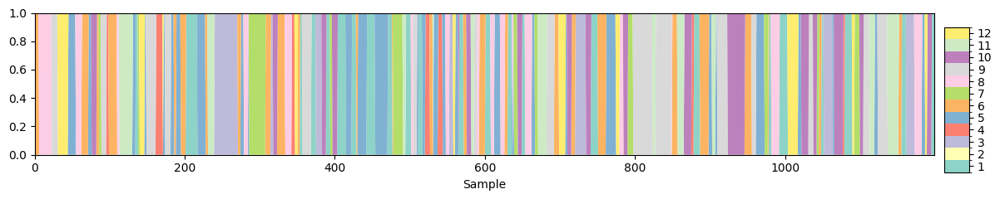

In [38]:
from osl_dynamics.inference import modes

# Hard classify the state probabilities
stc = modes.argmax_time_courses(alpha)
plotting.plot_alpha(stc[0],n_samples=1200)

### Fractional occupancy

In [39]:
# Calculate fractional occupancies
fo = modes.fractional_occupancies(stc)
print(fo.shape)

(4012, 12)


In [40]:
import numpy as np
print(np.mean(fo,axis=0))

[0.07360523 0.06035041 0.08186378 0.06777231 0.11493582 0.09527522
 0.07094965 0.07823488 0.09277812 0.0869288  0.09690512 0.08040067]


(<Figure size 700x400 with 1 Axes>, <Axes: xlabel='State', ylabel='FO'>)

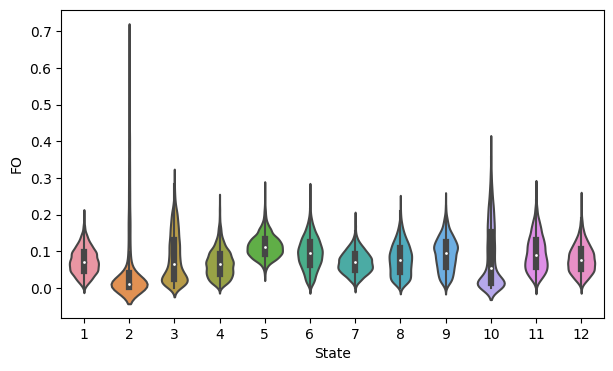

In [41]:
# Plot the distribution of fractional occupancy (FO) across subjects
plotting.plot_violin(fo.T, x_label="State", y_label="FO")

### Mean Lifetime

[4.67132269 4.79102603 5.32466506 6.06323505 4.45195085 4.54564241
 5.22813657 5.37935488 6.70049335 4.94312067 6.28557787 6.32329685]


(<Figure size 700x400 with 1 Axes>,
 <Axes: xlabel='State', ylabel='Mean Lifetime (s)'>)

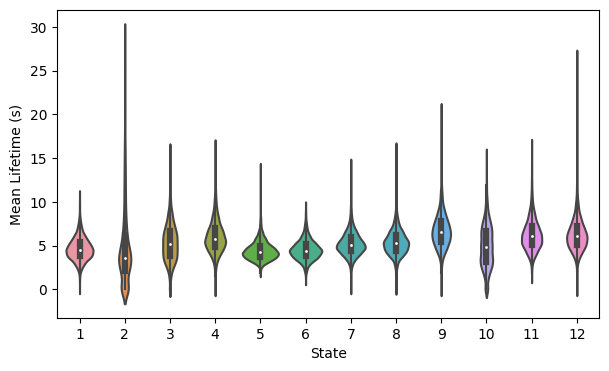

In [42]:
# Calculate mean lifetimes (in seconds)
mlt = modes.mean_lifetimes(stc, sampling_frequency=1/0.72)

# Convert to ms
#mlt *= 1000

# Print the group average
print(np.mean(mlt, axis=0))

# Plot distribution across subjects
plotting.plot_violin(mlt.T, x_label="State", y_label="Mean Lifetime (s)")

### Mean Interval


[65.76852283 95.07600701 92.34632847 98.83552669 35.05508174 52.21079136
 73.15320108 80.92260451 77.35193795 89.73243718 69.88843844 81.15131273]


(<Figure size 700x400 with 1 Axes>,
 <Axes: xlabel='State', ylabel='Mean Interval (s)'>)

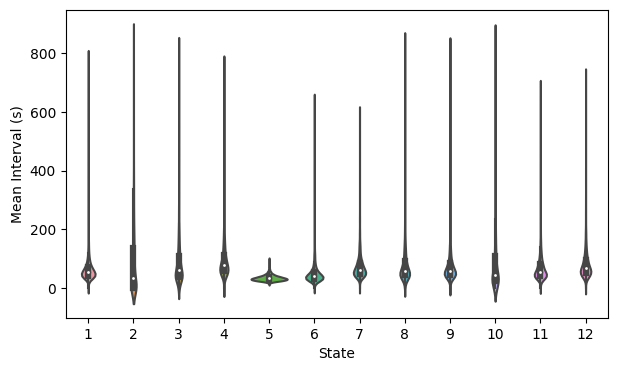

In [43]:
# Calculate mean intervals (in seconds)
mintv = modes.mean_intervals(stc, sampling_frequency=1/0.72)

# Print the group average
print(np.mean(mintv, axis=0))

# Plot distribution across subjects
plotting.plot_violin(mintv.T, x_label="State", y_label="Mean Interval (s)")

In [44]:
50 * 50 *126 * 405

127575000

In [45]:
4012 * 300 * 300 * 1116

402965280000

In [46]:
50 * 49 / 2

1225.0

The partition is:  {0: 0, 1: 0, 2: 0, 3: 0, 4: 2, 5: 2, 6: 2, 7: 0, 8: 1, 9: 1, 10: 2, 11: 0, 12: 0, 13: 0, 14: 1, 15: 1, 16: 2, 17: 0, 18: 1, 19: 0, 20: 1, 21: 0, 22: 1, 23: 3, 24: 3, 25: 3, 26: 1, 27: 3, 28: 3, 29: 1, 30: 1, 31: 3, 32: 1, 33: 1}


/tmp/slurm-22854570/ipykernel_336595/3638768981.py:17: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)


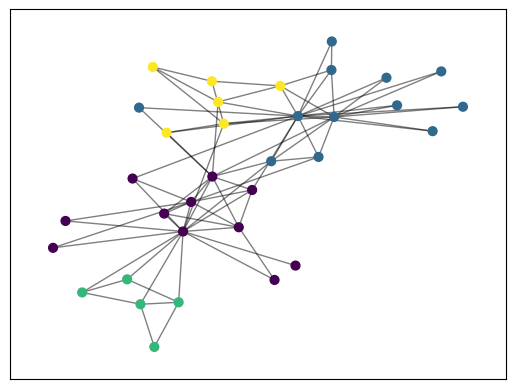

In [1]:
from community import community_louvain
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import networkx as nx
%matplotlib inline

# load the karate club graph
G = nx.karate_club_graph()

# compute the best partition
partition = community_louvain.best_partition(G)

print('The partition is: ',partition)
# draw the graph
pos = nx.spring_layout(G)
# color the nodes according to their partition
cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
nx.draw_networkx_nodes(G, pos, partition.keys(), node_size=40,
                       cmap=cmap, node_color=list(partition.values()))
nx.draw_networkx_edges(G, pos, alpha=0.5)
plt.show()

In [2]:
import numpy as np
data_dir = './results/HMM_ICA_100_state_12/'
tpm = np.load(f'{data_dir}trans_prob.npy')
print(tpm)

[[8.49689927e-01 2.15284653e-02 1.19195069e-02 1.54485338e-05
  2.77014542e-12 1.37034552e-02 2.02857930e-02 2.61173983e-02
  1.73635491e-02 6.59600873e-03 1.27933011e-02 1.99871467e-02]
 [4.79083359e-02 8.55376697e-01 1.15627801e-02 5.28669526e-04
  6.66584300e-03 4.93814862e-03 2.43874492e-02 9.30345589e-03
  1.21323045e-02 6.77407477e-03 8.57175995e-03 1.18504817e-02]
 [1.41233283e-02 1.05032523e-02 8.93749375e-01 2.29123417e-04
  1.10931641e-03 1.79559309e-02 1.45212626e-02 3.50934095e-03
  2.47075221e-02 5.19086912e-05 4.80684142e-03 1.47327976e-02]
 [1.57715744e-04 1.53065570e-03 2.94738585e-04 9.41656736e-01
  3.34574605e-02 1.69650598e-03 4.35216258e-04 9.58674644e-04
  4.30217763e-04 1.86982730e-02 3.41186259e-05 6.49687266e-04]
 [1.06665419e-35 1.02306734e-02 2.93840760e-03 2.77247536e-02
  8.50642440e-01 1.25564639e-02 2.22954519e-03 3.92910590e-03
  2.33229645e-03 6.23344522e-02 2.32952751e-02 1.78658685e-03]
 [1.65657802e-02 4.95731722e-03 1.57759241e-02 1.20766136e-03
  7

In [6]:
# For directed weighted graph
G = nx.DiGraph()

for i in range(len(tpm)):
    G.add_node(i)  # Add nodes to the graph

    for j in range(i + 1, len(tpm)):
        weight = tpm[i][j]

        if weight > 0:
            G.add_edge(i, j, weight=weight)  # Add edge with weight to the graph

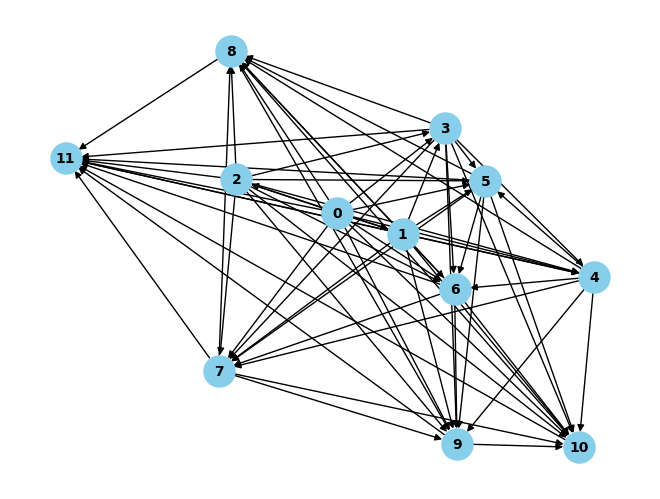

In [8]:
import matplotlib.pyplot as plt

# Draw the graph
pos = nx.spring_layout(G, seed=42)
nx.draw(G, pos, with_labels=True, node_size=500, node_color='skyblue', font_size=10, font_weight='bold')
labels = nx.get_edge_attributes(G, 'weight')
#nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)

plt.show()

In [10]:
nx.community.louvain_communities(G, seed=123)

[{0, 1, 6, 7}, {3, 4, 5, 9, 10}, {2, 8, 11}]

## Learn how to use Keras and tensorflow

In [1]:
import tensorflow as tf
fashion_mnist = tf.keras.datasets.fashion_mnist.load_data()

2023-11-04 12:58:01.765041: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-11-04 12:58:02.256567: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2023-11-04 12:58:02.256603: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


In [2]:
(X_train_full,y_train_full),(X_test,y_test)=fashion_mnist

In [3]:
X_train_full.shape

(60000, 28, 28)

In [4]:
X_train,y_train = X_train_full[:-5000],y_train_full[:-5000]

In [5]:
X_train.shape

(55000, 28, 28)

In [6]:
X_valid, y_valid = X_train_full[-5000:],y_train_full[-5000:]

In [7]:
X_valid.shape

(5000, 28, 28)

In [8]:
X_train.dtype

dtype('uint8')

In [9]:
X_train,X_valid,X_test = X_train/255.,X_valid/255., X_test/255.

In [11]:
X_train.dtype

dtype('float64')

### Build a model

In [12]:
tf.random.set_seed(42)

In [13]:
model = tf.keras.Sequential()

2023-11-04 13:07:37.706983: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory
2023-11-04 13:07:37.707082: W tensorflow/stream_executor/cuda/cuda_driver.cc:269] failed call to cuInit: UNKNOWN ERROR (303)
2023-11-04 13:07:37.707117: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (win002.hpc.in.bmrc.ox.ac.uk): /proc/driver/nvidia/version does not exist
2023-11-04 13:07:37.708268: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [15]:
model

In [16]:
model.add(tf.keras.layers.Input(shape=[28,28]))
model.add(tf.keras.layers.Flatten())
model.add(tf.keras.layers.Dense(300,activation="relu"))
model.add(tf.keras.layers.Dense(100,activation="relu"))
model.add(tf.keras.layers.Dense(10,activation="softmax"))

In [17]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten (Flatten)           (None, 784)               0         
                                                                 
 dense (Dense)               (None, 300)               235500    
                                                                 
 dense_1 (Dense)             (None, 100)               30100     
                                                                 
 dense_2 (Dense)             (None, 10)                1010      
                                                                 
Total params: 266,610
Trainable params: 266,610
Non-trainable params: 0
_________________________________________________________________


In [18]:
model.layers

In [23]:
hidden1 = model.layers[1]

In [24]:
hidden1.name

'dense'

In [25]:
model.get_layer('dense')

In [27]:
weights,biases = hidden1.get_weights()

In [28]:
type(weights)

numpy.ndarray

In [29]:
weights.shape

(784, 300)

In [30]:
model.compile(loss='sparse_categorical_crossentropy',optimizer='sgd',metrics=['accuracy'])

In [31]:
history = model.fit(X_train,y_train,epochs=30,validation_data=(X_valid,y_valid))

Epoch 1/30
1719/1719 [==============================] - 8s 4ms/step - loss: 0.7220 - accuracy: 0.7649 - val_loss: 0.4959 - val_accuracy: 0.8332
Epoch 2/30
1719/1719 [==============================] - 8s 5ms/step - loss: 0.4825 - accuracy: 0.8331 - val_loss: 0.4561 - val_accuracy: 0.8384
Epoch 3/30
1719/1719 [==============================] - 6s 4ms/step - loss: 0.4369 - accuracy: 0.8478 - val_loss: 0.4233 - val_accuracy: 0.8556
Epoch 4/30
1719/1719 [==============================] - 5s 3ms/step - loss: 0.4121 - accuracy: 0.8562 - val_loss: 0.3964 - val_accuracy: 0.8620
Epoch 5/30
1719/1719 [==============================] - 6s 4ms/step - loss: 0.3911 - accuracy: 0.8629 - val_loss: 0.3884 - val_accuracy: 0.8618
Epoch 6/30
1719/1719 [==============================] - 10s 6ms/step - loss: 0.3751 - accuracy: 0.8691 - val_loss: 0.3906 - val_accuracy: 0.8612
Epoch 7/30
1719/1719 [==============================] - 9s 5ms/step - loss: 0.3629 - accuracy: 0.8713 - val_loss: 0.3705 - val_accuracy

In [32]:
type(history)

keras.callbacks.History

In [33]:
history.params

{'verbose': 1, 'epochs': 30, 'steps': 1719}

In [34]:
history.epoch

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29]

In [35]:
history.history

{'loss': [0.7220436930656433,
  0.4824713170528412,
  0.43688449263572693,
  0.41214630007743835,
  0.39105069637298584,
  0.37510666251182556,
  0.36293289065361023,
  0.3515531122684479,
  0.34076106548309326,
  0.3307875990867615,
  0.32248005270957947,
  0.3145117163658142,
  0.3071031868457794,
  0.30024799704551697,
  0.29380178451538086,
  0.28680941462516785,
  0.2825373113155365,
  0.27591708302497864,
  0.27105581760406494,
  0.26641565561294556,
  0.26140710711479187,
  0.25638970732688904,
  0.25194916129112244,
  0.24683190882205963,
  0.2427404671907425,
  0.23913021385669708,
  0.23387159407138824,
  0.23126818239688873,
  0.22658641636371613,
  0.2233859747648239],
 'accuracy': [0.7648727297782898,
  0.8331454396247864,
  0.8478000164031982,
  0.856218159198761,
  0.8629090785980225,
  0.8691090941429138,
  0.871254563331604,
  0.8755818009376526,
  0.8791818022727966,
  0.8815454840660095,
  0.885345458984375,
  0.887218177318573,
  0.8906000256538391,
  0.892309069633

In [37]:
import matplotlib.pyplot as plt
import pandas as pd
%matplotlib inline

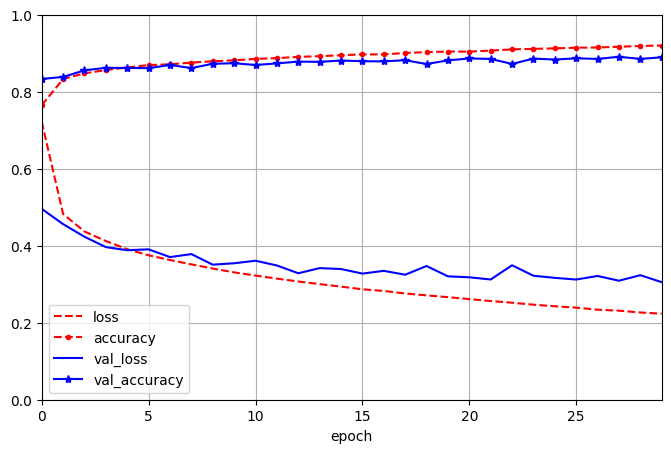

In [38]:
pd.DataFrame(history.history).plot(figsize=(8,5),xlim=[0,29],ylim=[0,1],grid=True,xlabel='epoch',style=['r--','r--.','b-','b-*'])
plt.show()

In [39]:
model.evaluate(X_test,y_test)

313/313 [==============================] - 2s 6ms/step - loss: 0.3251 - accuracy: 0.8856


[0.3251431882381439, 0.8855999708175659]

In [40]:
X_new = X_test[:3]

In [41]:
y_proba = model.predict(X_new)

y_proba.round(2)

1/1 [==============================] - 0s 219ms/step


array([[0.  , 0.  , 0.  , 0.  , 0.  , 0.01, 0.  , 0.02, 0.  , 0.97],
       [0.  , 0.  , 0.99, 0.  , 0.01, 0.  , 0.  , 0.  , 0.  , 0.  ],
       [0.  , 1.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ]],
      dtype=float32)

In [42]:
y_pred = y_proba.argmax(axis=-1)

In [43]:
y_pred

array([9, 2, 1])

### Build Complex Models Using the Functional API

In [45]:
normalization_layer = tf.keras.layers.Normalization()
hidden_layer1 = tf.keras.layers.Dense(30,activation="relu")
hidden_layer2 = tf.keras.layers.Dense(30,activation="relu")
concat_layer = tf.keras.layers.Concatenate()
output_layer = tf.keras.layers.Dense(1)

input_ = tf.keras.layers.Input(shape=X_train.shape[1:])
normalized = normalization_layer(input_)
hidden1 = hidden_layer1(normalized)
hidden2 = hidden_layer2(hidden1)
concat = concat_layer([normalized,hidden2])
output = output_layer(concat)

model = tf.keras.Model(inputs=[input_],outputs=[output])

In [46]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 28, 28)]     0           []                               
                                                                                                  
 normalization (Normalization)  (None, 28, 28)       57          ['input_2[0][0]']                
                                                                                                  
 dense_3 (Dense)                (None, 28, 30)       870         ['normalization[0][0]']          
                                                                                                  
 dense_4 (Dense)                (None, 28, 30)       930         ['dense_3[0][0]']                
                                                                                              

### Subclassing API

In [47]:
class WideAndDeepModel(tf.keras.Model):
    def __init__(self,units=30,activation="relu",**kwargs):
        super().__init__(**kwargs)
        self.norm_layer_wide = tf.keras.layers.Normalization()
        self.norm_layer_deep = tf.keras.layers.Normalization()
        self.hidden1 = tf.keras.layers.Dense(units,activation=activation)
        self.hidden2 = tf.keras.layers.Dense(units,activation=activation)
        self.main_output = tf.keras.layers.Dense(1)
        self.aux_output = tf.keras.layers.Dense(1)
        
    def call(self,inputs):
        input_wide, input_deep = inputs
        norm_wide = self.norm_layer_wide(input_wide)
        norm_deep = self.norm_layer_deep(input_deep)
        hidden1 = self.hidden1(norm_deep)
        hidden2 = self.hidden2(hidden1)
        concat = tf.keras.layers.concatenate([norm_wide,hidden2])
        output = self.main_otput(concat)
        aux_output = self.aux_output(hidden2)
        return output, aux_output
    
model = WideAndDeepModel(30,activation="relu",name="my_cool_model")

### On tensorflow dataloader

In [7]:
import tensorflow as tf
X = tf.range(10)
print(X)
dataset = tf.data.Dataset.from_tensor_slices(X)
print(dataset)

tf.Tensor([0 1 2 3 4 5 6 7 8 9], shape=(10,), dtype=int32)
<TensorSliceDataset element_spec=TensorSpec(shape=(), dtype=tf.int32, name=None)>


In [3]:
for item in dataset:
    print(item)

tf.Tensor(0, shape=(), dtype=int32)
tf.Tensor(1, shape=(), dtype=int32)
tf.Tensor(2, shape=(), dtype=int32)
tf.Tensor(3, shape=(), dtype=int32)
tf.Tensor(4, shape=(), dtype=int32)
tf.Tensor(5, shape=(), dtype=int32)
tf.Tensor(6, shape=(), dtype=int32)
tf.Tensor(7, shape=(), dtype=int32)
tf.Tensor(8, shape=(), dtype=int32)
tf.Tensor(9, shape=(), dtype=int32)


In [4]:
X_nested = {"a":([1,2,3],[4,5,6]),"b":[7,8,9]}
dataset = tf.data.Dataset.from_tensor_slices(X_nested)
for item in dataset:
    print(item)

{'a': (<tf.Tensor: shape=(), dtype=int32, numpy=1>, <tf.Tensor: shape=(), dtype=int32, numpy=4>), 'b': <tf.Tensor: shape=(), dtype=int32, numpy=7>}
{'a': (<tf.Tensor: shape=(), dtype=int32, numpy=2>, <tf.Tensor: shape=(), dtype=int32, numpy=5>), 'b': <tf.Tensor: shape=(), dtype=int32, numpy=8>}
{'a': (<tf.Tensor: shape=(), dtype=int32, numpy=3>, <tf.Tensor: shape=(), dtype=int32, numpy=6>), 'b': <tf.Tensor: shape=(), dtype=int32, numpy=9>}


2023-11-06 11:17:59.769306: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


In [6]:
type(dataset)

tensorflow.python.data.ops.dataset_ops.TensorSliceDataset

In [4]:
dataset = tf.data.Dataset.from_tensor_slices(tf.range(10))
dataset = dataset.repeat(3).batch(7)
for item in dataset:
    print(item)

tf.Tensor([0 1 2 3 4 5 6], shape=(7,), dtype=int32)
tf.Tensor([7 8 9 0 1 2 3], shape=(7,), dtype=int32)
tf.Tensor([4 5 6 7 8 9 0], shape=(7,), dtype=int32)
tf.Tensor([1 2 3 4 5 6 7], shape=(7,), dtype=int32)
tf.Tensor([8 9], shape=(2,), dtype=int32)


2023-11-06 17:21:52.917276: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


In [5]:
dataset = dataset.map(lambda x:x * 2)
for item in dataset:
    print(item)

tf.Tensor([ 0  2  4  6  8 10 12], shape=(7,), dtype=int32)
tf.Tensor([14 16 18  0  2  4  6], shape=(7,), dtype=int32)
tf.Tensor([ 8 10 12 14 16 18  0], shape=(7,), dtype=int32)
tf.Tensor([ 2  4  6  8 10 12 14], shape=(7,), dtype=int32)
tf.Tensor([16 18], shape=(2,), dtype=int32)


#### About shuffling the data

In [6]:
dataset = tf.data.Dataset.range(10).repeat(2)
for item in dataset:
    print(item)
print('################')
dataset = dataset.shuffle(buffer_size=4,seed=42).batch(7)
for item in dataset:
    print(item)

tf.Tensor(0, shape=(), dtype=int64)
tf.Tensor(1, shape=(), dtype=int64)
tf.Tensor(2, shape=(), dtype=int64)
tf.Tensor(3, shape=(), dtype=int64)
tf.Tensor(4, shape=(), dtype=int64)
tf.Tensor(5, shape=(), dtype=int64)
tf.Tensor(6, shape=(), dtype=int64)
tf.Tensor(7, shape=(), dtype=int64)
tf.Tensor(8, shape=(), dtype=int64)
tf.Tensor(9, shape=(), dtype=int64)
tf.Tensor(0, shape=(), dtype=int64)
tf.Tensor(1, shape=(), dtype=int64)
tf.Tensor(2, shape=(), dtype=int64)
tf.Tensor(3, shape=(), dtype=int64)
tf.Tensor(4, shape=(), dtype=int64)
tf.Tensor(5, shape=(), dtype=int64)
tf.Tensor(6, shape=(), dtype=int64)
tf.Tensor(7, shape=(), dtype=int64)
tf.Tensor(8, shape=(), dtype=int64)
tf.Tensor(9, shape=(), dtype=int64)
################
tf.Tensor([1 4 2 3 5 0 6], shape=(7,), dtype=int64)
tf.Tensor([9 8 2 0 3 1 4], shape=(7,), dtype=int64)
tf.Tensor([5 7 9 6 7 8], shape=(6,), dtype=int64)


2023-11-06 17:27:54.715713: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2023-11-06 17:27:54.722487: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


### Shuffling the Data

In [11]:
dataset = tf.data.Dataset.range(10).repeat(2)
dataset = dataset.shuffle(buffer_size=4,seed=43).batch(7)
for item in dataset:
    print(item)

tf.Tensor([3 2 1 6 4 7 8], shape=(7,), dtype=int64)
tf.Tensor([0 5 9 2 0 3 6], shape=(7,), dtype=int64)
tf.Tensor([1 7 8 5 4 9], shape=(6,), dtype=int64)


2023-11-10 11:07:06.402865: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


### Understand how Rukuang generated the simulation data

Let's use Rukuang's code.

In [28]:
print(len(time_series))
print(time_series[0].shape)


10
(25600, 40)


In [27]:
import os
import numpy as np
from osl_dynamics import data, simulation
from osl_dynamics.inference import tf_ops
from osl_dynamics.models.hmm import Config, Model
from osl_dynamics.utils import plotting
from sklearn.model_selection import KFold
from matplotlib import pyplot as plt

train = False
n_subjects = 10
n_states_list = np.array([2, 3, 4, 5, 6, 7])
n_folds = 5
#results_dir = "/well/woolrich/users/tjo747/python/sehmm/results/n_modes/hmm_vs_hmm"
#os.makedirs(results_dir, exist_ok=True)

tf_ops.gpu_growth()


time_series = []
for i in range(n_subjects):
    sim = simulation.HMM_MVN(
        n_samples=25600,
        n_states=4,
        n_channels=40,
        trans_prob="sequence",
        stay_prob=0.9,
        means="zero",
        covariances="random",
        random_seed=123,
    )
    time_series.append(sim.time_series)

training_data = data.Data(time_series,load_memmaps=True)

Loading files: 100%|████████████████████████████| 10/10 [00:00<00:00, 57.04it/s]


In [29]:
print(type((training_data.arrays)[0]))

<class 'numpy.memmap'>


### Now it's time to understand sklearn cross validation.

In [37]:
from sklearn.model_selection import KFold
kf = KFold(shuffle=True,random_state=42)

In [38]:
for i, (train_index, test_index) in enumerate(kf.split(range(20))):
    print(f"Fold {i}:")
    print(f"  Train: index={train_index}")
    print(f"  Test:  index={test_index}")


Fold 0:
  Train: index=[ 2  3  4  5  6  7  8  9 10 11 12 13 14 16 18 19]
  Test:  index=[ 0  1 15 17]
Fold 1:
  Train: index=[ 0  1  2  4  6  7  9 10 12 13 14 15 16 17 18 19]
  Test:  index=[ 3  5  8 11]
Fold 2:
  Train: index=[ 0  1  3  4  5  6  7  8  9 10 11 12 14 15 17 19]
  Test:  index=[ 2 13 16 18]
Fold 3:
  Train: index=[ 0  1  2  3  5  6  7  8 10 11 13 14 15 16 17 18]
  Test:  index=[ 4  9 12 19]
Fold 4:
  Train: index=[ 0  1  2  3  4  5  8  9 11 12 13 15 16 17 18 19]
  Test:  index=[ 6  7 10 14]


### Understand the relationship between "true" states and inferred states

This is really important. We have generated the data using ground truth with 4 states. Our model has states as many as 11. So how will these states look like?

In [30]:
import numpy as np
true_dir = './results_HCP_202311_no_mean/HMM_ICA_50_state_4/'
true_means = np.load(f'{true_dir}state_means.npy')
true_correlations = np.load(f'{true_dir}state_correlations.npy')
print(true_means.shape)
print(true_correlations.shape)

Object `like` not found.


In [10]:
n_states = 11
fit_dir = f'./results_simulation_202311_no_mean/HMM_ICA_50_state_{n_states}/'
fit_means = np.load(f'{fit_dir}state_means.npy')
fit_correlations = np.load(f'{fit_dir}state_correlations.npy')
print(fit_means.shape)
print(fit_correlations.shape)

(11, 50)
(11, 50, 50)


In [11]:
from rotation.utils import twopair_riemannian_distance, twopair_vector_correlation

In [12]:
import seaborn as sns

/well/win-fmrib-analysis/users/uap971/conda/skylake/envs/osld/lib/python3.10/site-packages/numpy/lib/function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/well/win-fmrib-analysis/users/uap971/conda/skylake/envs/osld/lib/python3.10/site-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/well/win-fmrib-analysis/users/uap971/conda/skylake/envs/osld/lib/python3.10/site-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


<Axes: >

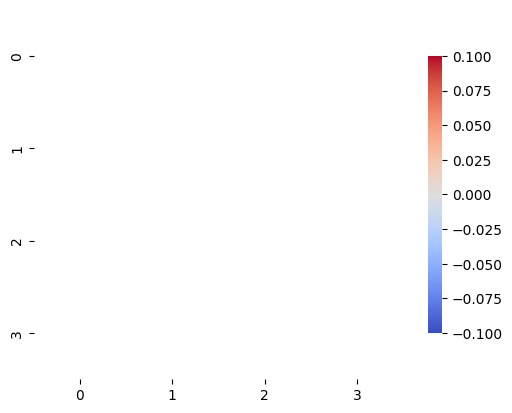

In [13]:
true_mean_correlation = twopair_vector_correlation(true_means,true_means)
sns.heatmap(true_mean_correlation, cmap="coolwarm", square=True,
                linewidths=.5, cbar_kws={"shrink": 0.75}, annot=True, fmt=".2f")

<Axes: >

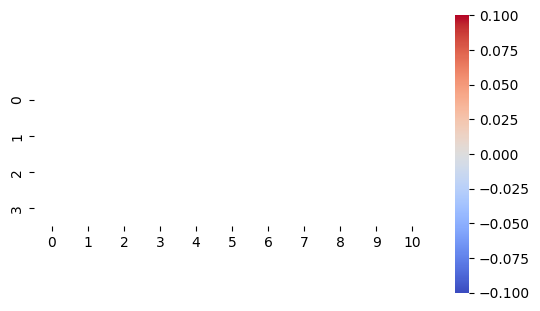

In [14]:
mean_correlation = twopair_vector_correlation(true_means,fit_means)
sns.heatmap(mean_correlation, cmap="coolwarm", square=True,
                linewidths=.5, cbar_kws={"shrink": 0.75}, annot=True, fmt=".2f")

Computing Riemannian distances: 100%|████████████| 4/4 [00:00<00:00, 361.48it/s]


<Axes: >

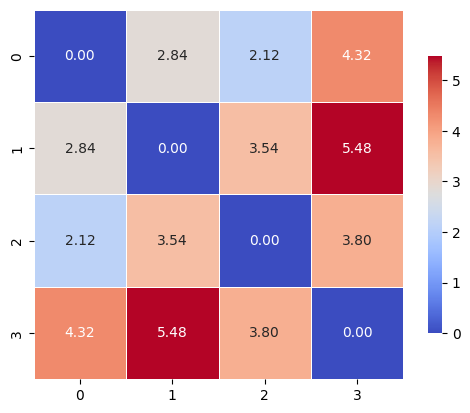

In [15]:
true_correlation_distance = twopair_riemannian_distance(true_correlations,true_correlations)
sns.heatmap(true_correlation_distance, cmap="coolwarm", square=True,
                linewidths=.5, cbar_kws={"shrink": 0.75}, annot=True, fmt=".2f")

Computing Riemannian distances: 100%|████████████| 4/4 [00:00<00:00, 203.96it/s]


<Axes: >

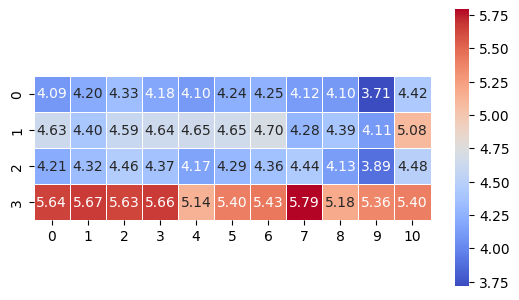

In [16]:
correlation_distance = twopair_riemannian_distance(true_correlations,fit_correlations)
sns.heatmap(correlation_distance, cmap="coolwarm", square=True,
                linewidths=.5, cbar_kws={"shrink": 0.75}, annot=True, fmt=".2f")

### Calculate the free energy

In [1]:
from rotation.analysis import comparison_analysis
models = ['HMM']
list_channels = [50,200,300]
list_states = [2,3,4,5,6,7,8,10,11]
result_dir = './results_simulation_202311_no_mean/'
save_dir = f'{result_dir}comparison/'
comparison_analysis(models,list_channels,list_states,result_dir,save_dir)

/well/win-fmrib-analysis/users/uap971/conda/skylake/envs/osld/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [18]:
for n_state in n_states:
    

SyntaxError: incomplete input (390902673.py, line 2)

### Calculate the fractional occupancy across different number of states

In [9]:
import numpy as np

def fo_correlation(fo:np.ndarray):
    # Calculate the fractional occupancy of different fo vectors
    # Assuming 'data' is your numpy array with shape (N, M) N vectors with length M

    # Calculate the correlation matrix
    correlation_matrix = np.corrcoef(fo.T, rowvar=False)

    # Exclude the diagonal elements (self-correlations) and get the upper triangular part
    upper_triangle = np.triu(correlation_matrix, k=1)

    # Count the number of non-zero elements in the upper triangle
    num_pairs = np.count_nonzero(upper_triangle)
 
    # Calculate the sum of all pairwise correlations
    sum_of_correlations = np.sum(upper_triangle)

    # Calculate the average pairwise correlation
    return sum_of_correlations / num_pairs

In [12]:
states = [2,3,4,5,6,7,8,9,10,11]
fo_correlations = np.zeros((10,5))
for i in range(len(states)):
    print(f'i={i}')
    for j in range(5):
        fo = np.load(f'./results_simulation_202311_toy_2/HMM_ICA_2_state_{states[i]}/cross_validation_{j}/validation/fo.npy')
        print(fo_correlation(fo))
        fo_correlations[i,j] = fo_correlation(fo)
print(np.mean(fo_correlations,axis=1))

i=0
0.042105263157894736
0.21052631578947367
-0.042105263157894736
0.8
nan
i=1
0.9183370386832441
0.9463488740095206
0.9411147483720742
0.9479281312823751
0.9556415158536743
i=2
0.9511191383429114
0.9556662976776074
0.948607280170677
0.9669538225835946
0.9240976070927012
i=3
0.9375842311066614
0.9525775952206605
0.9699362796469595
0.9542083909222998
0.9135600820495006
i=4
0.9111264550715703
0.9491493528236157
0.9634356466876499
0.9713298524011053
0.9367415043867453
i=5
0.9340361617828553
0.9626198044627088
0.9641395686266944
0.9551746258113176
0.9526132969356207
i=6
0.949777726880377
0.9595423443698502
0.9631031288761055
0.9696107537292914
0.9202475966719372
i=7
0.9410888269148104
0.9568535377496098
0.9708032262313706
0.9375470465690332
0.9574928518485503
i=8
0.949532571760413
0.9371033825853317
0.9615600972648601
0.9694784170409859
0.9110265025318101
i=9
0.9541858315465755
0.957618093117654
0.9626041581868663
0.9713708376961047
0.9536545075497675
[       nan 0.94187406 0.94928883 0.94

In [10]:
test_fo = np.array([[0.3,0.5,0.2],[0.31,0.49,0.2]])
print(fo_correlation(test_fo))

0.9986660732168026


In [3]:
import numpy as np
import json
states = [2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]
free_energy = np.zeros((15,5))
for i in range(len(states)):
    print(f'i={i}')
    for j in range(5):
        with open(f'./results_simulation_202311_toy_5/HMM_ICA_25_state_{states[i]}/cross_validation_{j}/metrics.json', 'r') as file:
        # Load the JSON data from the file
            data = json.load(file)
        print(data['free_energy'])
        free_energy[i,j] = data ['free_energy']
print(np.mean(free_energy,axis=1))

i=0
18820.51122430424
18782.153813231864
18780.841405648996
18775.62434233668
18767.98849251772
i=1
18724.1065514451
18733.49469636096
18738.084964307363
18715.404912188344
18718.402158949175
i=2
18722.885068781037
18696.135788137897
18705.13166627112
18693.672438870202
18678.349688922415
i=3
18668.82389817432
18679.142361001654
18683.204304575465
18671.608178990136
18674.836264112902
i=4
18671.705090399613
18689.503478831884
18680.233481246483
18670.97798611928
18677.027130241506
i=5
18689.107597432627
18671.14019175027
18668.723368922827
18667.38634036229
18659.258738979228
i=6
18662.602186571345
18669.79750533006
18676.8635364364
18663.506920928776
18655.42425720338
i=7
18664.66346765958
18702.333462930077
18669.004252332907
18673.91737320727
18651.488141422025
i=8
18658.82845534392
18666.882401369206
18664.032669724565
18662.826929013587
18647.9126888127
i=9
18655.47791142228
18659.068787866043
18665.929507294004
18676.623428440722
18647.32099139024
i=10
18660.02333126184
18655.658

In [7]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

# Calculate mean and standard deviation along axis 1 (across the 5 repetitions)
mean_free_energy = np.mean(free_energy, axis=1)
std_dev_free_energy = np.std(free_energy, axis=1)

# Number of states (assuming it ranges from 2 to 16)
num_states = np.arange(2, 17)

# Plotting the mean free energy with error bars
plt.errorbar(num_states, mean_free_energy, yerr=std_dev_free_energy, fmt='o-', label='Free Energy')

# Customize the plot
plt.title('Free Energy vs Number of States')
plt.xlabel('Number of States')
plt.ylabel('Free Energy')
plt.grid(True)
plt.legend()
plt.savefig('./temp_plot_20231121/free_energy.pdf')
plt.savefig('./temp_plot_20231121/free_energy.jpg')
plt.close()



### Plot the reproducibility analysis for new data

In [10]:
import os
import numpy as np
import matplotlib.pyplot as plt

# Directory path
base_directory = './results_simulation_202311_toy_5/'

# Number of states range
num_states_range = np.arange(2, 17)

# List to store average diagonal values
average_diagonal_values = []

# Loop through different numbers of states
for n_state in num_states_range:
    # File path
    file_path = os.path.join(base_directory, f'HMM_ICA_25_state_{n_state}/reproduce_analysis/FCs_fisher_correlation_reorder_split_1.npy')
    
    # Check if the file exists
    if os.path.exists(file_path):
        # Load the 2D numpy array from the file
        data = np.load(file_path)
        
        # Calculate the average value of diagonals and append to the list
        average_diagonal = np.mean(np.diagonal(data))
        average_diagonal_values.append(average_diagonal)
    else:
        print(f"File not found for {n_state} states.")

# Plotting the average diagonal values against the number of states
plt.plot(num_states_range, average_diagonal_values, 'o-')

# Customize the plot
plt.title('Average Diagonal vs Number of States')
plt.xlabel('Number of States')
plt.ylabel('Average Diagonal Value')
plt.grid(True)
plt.savefig('./temp_plot_20231121/reproduce_analysis.pdf')
plt.savefig('./temp_plot_20231121/reproduce_analysis.jpg')
plt.close()

In [14]:
from osl_dynamics.analysis.modes import calc_trans_prob_matrix

/well/win-fmrib-analysis/users/uap971/conda/skylake/envs/osld/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [16]:
import pickle
with open('./results_simulation_202311_toy_2/HMM_ICA_2_state_5/cross_validation_0/validation/alpha.pkl','rb') as file:
    alpha = pickle.load(file)


(1200, 5)


In [17]:
alpha[0]

array([[0.20776352, 0.19857886, 0.23280662, 0.17427129, 0.1865797 ],
       [0.21297948, 0.1951258 , 0.2378353 , 0.16826051, 0.1857989 ],
       [0.2206108 , 0.19000335, 0.24536414, 0.161661  , 0.18236071],
       ...,
       [0.17803954, 0.21357319, 0.1828571 , 0.17252667, 0.2530035 ],
       [0.1780189 , 0.21357313, 0.18247892, 0.17248656, 0.2534425 ],
       [0.1794829 , 0.21233372, 0.18231668, 0.17321044, 0.25265625]],
      dtype=float32)

In [18]:
calc_trans_prob_matrix(alpha[0])

array([[0.94789579, 0.        , 0.02204409, 0.        , 0.03006012],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.0625    , 0.        , 0.9       , 0.        , 0.0375    ],
       [0.5       , 0.        , 0.        , 0.5       , 0.        ],
       [0.02788104, 0.        , 0.00743494, 0.00185874, 0.96282528]])

In [19]:
calc_trans_prob_matrix(alpha[1])

array([[0.97667638, 0.        , 0.00874636, 0.        , 0.01457726],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.05839416, 0.        , 0.9270073 , 0.        , 0.01459854],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.0212766 , 0.        , 0.0106383 , 0.        , 0.96808511]])

In [20]:
calc_trans_prob_matrix(alpha[2])

array([[0.96174863, 0.        , 0.0136612 , 0.        , 0.02459016],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.03333333, 0.        , 0.88333333, 0.        , 0.08333333],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.01423027, 0.        , 0.00258732, 0.        , 0.98318241]])

In [21]:
calc_trans_prob_matrix(alpha[3])

array([[0.9673913 , 0.        , 0.01086957, 0.        , 0.02173913],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.04724409, 0.        , 0.93700787, 0.        , 0.01574803],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.01470588, 0.        , 0.00326797, 0.        , 0.98202614]])

### Calculate the Fractional Occupancy across scans in the same subject in real data

In [26]:
save_dir = './results_202309/'
N_channels = [15,25,50,100]
N_states = [4,8,12,16,20]
fo_correlation = np.zeros((4,5))
for i in range(len(N_channels)):
    for j in range(len(N_states)):
        fo = np.load(f'{save_dir}HMM_ICA_{N_channels[i]}_state_{N_states[j]}/fo.npy')
        temp = np.zeros(1003)
        for k in range(1003):
            temp[k] = np.corrcoef(fo[4*k+1,:],fo[4*k+2,:])[0,1]
        fo_correlation[i,j] = np.mean(temp[k])

print(fo_correlation)

[[0.97950602 0.95918963 0.93670589 0.86264682 0.53929757]
 [0.99130442 0.9369285  0.88698215 0.8225825  0.75641117]
 [0.97339019 0.98070914 0.93987138 0.89433092 0.88025788]
 [0.952394   0.95726558 0.92490503 0.8963217  0.9219986 ]]


In [27]:
save_dir = './results_simulation_202311_no_mean/'
N_states = [2,3,4,5,6,7,8,9,10,11]
for N_state in N_states:
    print(f'Number of states: {N_state}')
    for i in range(5):
        state_covariances = np.load(f'{save_dir}HMM_ICA_2_state_{N_state}/cross_validation_{i}/state_covariances.npy')
        print(state_covariances)

Number of states: 2
[[[1.08675    0.79293466]
  [0.79293466 0.9776847 ]]

 [[0.9148042  0.8080214 ]
  [0.8080214  1.0383565 ]]]
[[[1.0810381  0.8155787 ]
  [0.8155787  1.0047741 ]]

 [[0.92099375 0.7886471 ]
  [0.7886471  1.0076351 ]]]
[[[0.93030304 0.77806693]
  [0.77806693 0.9832886 ]]

 [[1.0721947  0.8260784 ]
  [0.8260784  1.0260663 ]]]
[[[1.0838544  0.784845  ]
  [0.784845   0.95867985]]

 [[0.9233475  0.81727713]
  [0.81727713 1.0550208 ]]]
[[[1.095637   0.81208014]
  [0.81208014 0.99377495]]

 [[0.90951    0.7931748 ]
  [0.7931748  1.0220174 ]]]
Number of states: 3
[[[1.1032157  0.7987267 ]
  [0.7987267  0.9879487 ]]

 [[0.8952596  0.79460204]
  [0.79460204 1.0230927 ]]

 [[1.0007254  0.8182104 ]
  [0.8182104  1.0128049 ]]]
[[[1.0669298  0.82418317]
  [0.82418317 1.0236919 ]]

 [[1.0958679  0.81990016]
  [0.81990016 1.0085359 ]]

 [[0.8995982  0.7878066 ]
  [0.7878066  1.0147293 ]]]
[[[1.0885408  0.80925983]
  [0.80925983 1.0021284 ]]

 [[0.9954629  0.8204736 ]
  [0.8204736  1.

FileNotFoundError: [Errno 2] No such file or directory: './results_simulation_202311_no_mean/HMM_ICA_2_state_11/cross_validation_1/state_covariances.npy'

In [29]:
save_dir = './results_simulation_202311_toy_2/'
N_states = [2,3,4,5,6,7,8,9,10,11]
for N_state in N_states:
    print(f'Number of states: {N_state}')
    for i in range(5):
        state_correlations = np.load(f'{save_dir}HMM_ICA_2_state_{N_state}/cross_validation_{i}/state_correlations.npy')
        print(state_correlations[:,0,1])

Number of states: 2
[ 0.05378785 -0.05817798]
[ 0.03055509 -0.03699611]
[ 0.03142449 -0.053673  ]
[ 0.00698425 -0.01987016]
[-0.07265587  0.05860319]
Number of states: 3
[ 0.0032953   0.02264835 -0.03192652]
[ 0.00457314  0.04954706 -0.05906602]
[ 0.06761466 -0.0995445   0.03209297]
[-0.03605026  0.0521932  -0.05851068]
[-0.06545039 -0.05777635  0.07059249]
Number of states: 4
[-0.04064161  0.06690485  0.07405905 -0.08863751]
[ 0.02542547  0.02809798  0.0671682  -0.08260437]
[ 0.05866564  0.05036159 -0.0081642  -0.09026714]
[ 0.04701238 -0.07437423 -0.06356851  0.05871381]
[-0.05338547 -0.07001888  0.03161782  0.05346838]
Number of states: 5
[-0.08420586  0.06099431 -0.08054513  0.04679568  0.08057624]
[ 0.07587091 -0.0709579  -0.05981565 -0.06444271  0.06637251]
[-0.0656861   0.06845136 -0.05104404  0.04163178 -0.07282606]
[ 0.07013366 -0.09021921 -0.03429725 -0.06053928  0.05789986]
[ 0.02650632 -0.07583283  0.06019732 -0.0878945   0.06101407]
Number of states: 6
[ 0.06913672 -0.0744

In [31]:
save_dir = './results_simulation_202311_toy_4/'
N_states = [7,8,9,10,11]
for N_state in N_states:
    print(f'Number of states: {N_state}')
    for i in range(5):
        state_correlations = np.load(f'{save_dir}HMM_ICA_2_state_{N_state}/cross_validation_{i}/state_correlations.npy')
        print(state_correlations[:,0,1])

Number of states: 7
[ 0.00977522 -0.00216067 -0.04186209 -0.00309481 -0.01425217  0.00180625
 -0.00749647]
[ 0.00697951 -0.02204215 -0.01073844 -0.00860576 -0.00532291 -0.0174249
 -0.00679664]
[ 0.00836213 -0.01460998  0.02311867  0.01421786 -0.02223931  0.00256739
 -0.03726145]
[ 0.00063448 -0.04301171 -0.01582496 -0.00191165 -0.02111614  0.01215602
  0.01461784]
[-0.0091382  -0.01258997 -0.02721128 -0.01043992  0.00412478 -0.003901
  0.00160206]
Number of states: 8
[ 0.02120858  0.00138292 -0.00860462 -0.04425818 -0.02230405 -0.01213971
  0.01356055 -0.01442865]
[-0.00314609 -0.0276848  -0.02269739 -0.01341339  0.00860837 -0.0143698
  0.00391661 -0.00491389]
[ 0.00709645 -0.00814363  0.00938956 -0.00922521 -0.01709046  0.00981777
 -0.01093454 -0.01117289]
[-3.04418802e-03 -1.06103225e-02  1.50493262e-02 -5.17292414e-03
 -5.50436052e-05 -2.81314943e-02 -1.07052019e-02 -1.92632992e-02]
[ 0.01360544 -0.03258251  0.00748951 -0.02245267 -0.02273977  0.01826198
 -0.01254019 -0.01618685]
Nu

### Generate some real time series

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
data_dir ='./data/node_timeseries/3T_HCP1200_MSMAll_d15_ts2/100307.txt'
data = np.loadtxt(data_dir)
save_dir = './temp_plot_202311_grey/'
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

In [3]:
print(data.shape)

(4800, 15)


In [4]:
T, N_channels = data.shape

In [5]:
for i in range(N_channels):
    plt.plot(data[:1000,i],color='grey')
    plt.savefig(f'{save_dir}time_series_{i}.pdf')
    plt.close()

In [9]:
import seaborn as sns
swc_dir = './results_202309/SWC_ICA_50/cor_swc.npy'
data = np.load(swc_dir)
cmap = sns.color_palette("RdBu_r",as_cmap=True)
for subject in range(2):
    for i in range(9):
        seaborn.heatmap(data[subject,i,:,:],vmin=-1.0,vmax=1.0,square=True,cmap=cmap,xticklabels=False,yticklabels=False,cbar=False)
        plt.savefig(f'{save_dir}swc_cor_subject_{subject}_index_{i}.pdf')
        plt.close()

### Look at your data! Check the ground truth

In [17]:
import numpy as np
import seaborn
import matplotlib.pyplot as plt
%matplotlib inline

In [10]:
covariances = np.load('./results_HCP_202311_no_mean/HMM_ICA_25_state_8/state_covariances.npy')
correlations = np.load('./results_HCP_202311_no_mean/HMM_ICA_25_state_8/state_correlations.npy')

In [11]:
covariances.shape

(8, 25, 25)

In [12]:
from rotation.utils import pairwise_fisher_z_correlations
fisher_z = pairwise_fisher_z_correlations(correlations)


Compute Fisher-z transformated correlation: 100%|█| 8/8 [00:00<00:00, 942.62it/s


In [13]:
fisher_z.shape

(8, 8)

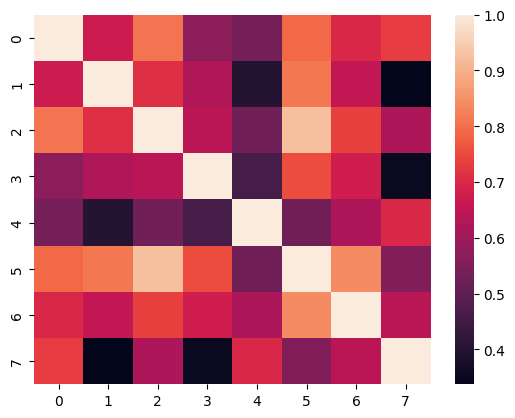

In [18]:
seaborn.heatmap(fisher_z)
plt.show()

In [22]:
correlations_fit = np.load('./results_simulation_202311_toy_5/HMM_ICA_25_state_8/state_correlations.npy')

In [23]:
correlations_fit.shape

(8, 25, 25)

Compute Fisher-z transformated correlation: 100%|█| 8/8 [00:00<00:00, 979.92it/s


<Axes: >

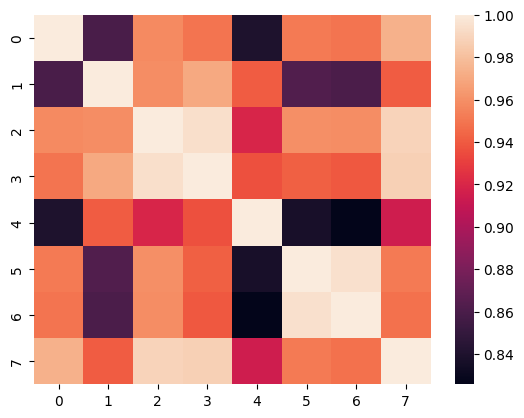

In [24]:
fisher_z_fit = pairwise_fisher_z_correlations(correlations_fit)
seaborn.heatmap(fisher_z_fit)

Compute twopair Fisher-z transformated correlation: 100%|█| 8/8 [00:00<00:00, 46


Text(50.722222222222214, 0.5, 'Truth')

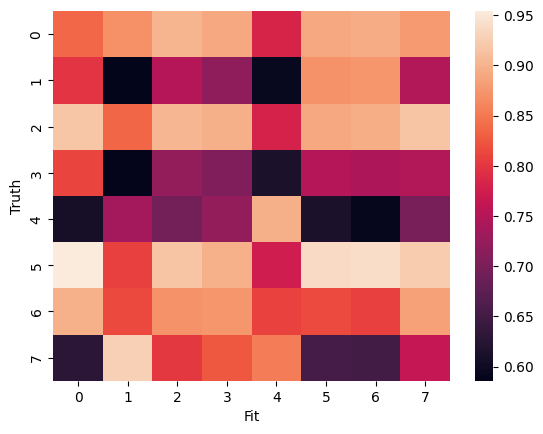

In [29]:
from rotation.utils import twopair_fisher_z_transformed_correlation
correlation_truth_fit = twopair_fisher_z_transformed_correlation(correlations,correlations_fit)
seaborn.heatmap(correlation_truth_fit)
plt.xlabel('Fit')
plt.ylabel('Truth')

In [27]:
correlation_truth_fit

array([[0.83624251, 0.87012094, 0.90166191, 0.89066245, 0.78281659,
        0.89151127, 0.89456208, 0.87908712],
       [0.79781565, 0.5858404 , 0.75091116, 0.71923662, 0.59430407,
        0.87088876, 0.87367178, 0.74740529],
       [0.91702652, 0.83562061, 0.90244091, 0.89670103, 0.78085487,
        0.89063369, 0.89573097, 0.91516119],
       [0.8103752 , 0.58814984, 0.72152761, 0.70510112, 0.61213004,
        0.7483853 , 0.74353096, 0.74833301],
       [0.6085179 , 0.73552822, 0.69491321, 0.72115188, 0.89684871,
        0.61288534, 0.59125805, 0.69913748],
       [0.95398829, 0.80609457, 0.91538969, 0.89929312, 0.77331355,
        0.93748001, 0.94056036, 0.92279008],
       [0.89885839, 0.81364203, 0.87124894, 0.87434477, 0.80985473,
        0.8150764 , 0.8061176 , 0.88355588],
       [0.6283374 , 0.92686738, 0.80095794, 0.82506889, 0.85472505,
        0.65338245, 0.65070348, 0.76353957]])

### Test with Riemannian distance

In [31]:
from rotation.utils import twopair_riemannian_distance
covariances_fit = np.load('./results_simulation_202311_toy_5/HMM_ICA_25_state_8/state_covariances.npy')

In [32]:
riemann_truth = twopair_riemannian_distance(covariances,covariances)
riemann_fit = twopair_riemannian_distance(covariances_fit,covariances_fit)
riemann_truth_fit = twopair_riemannian_distance(covariances,covariances_fit)

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 464.47it/s]


<Axes: >

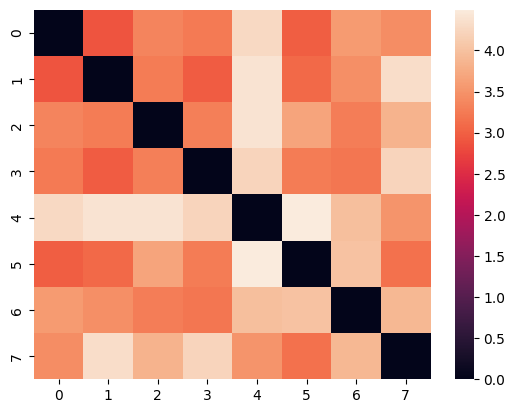

In [33]:
seaborn.heatmap(riemann_truth)

<Axes: >

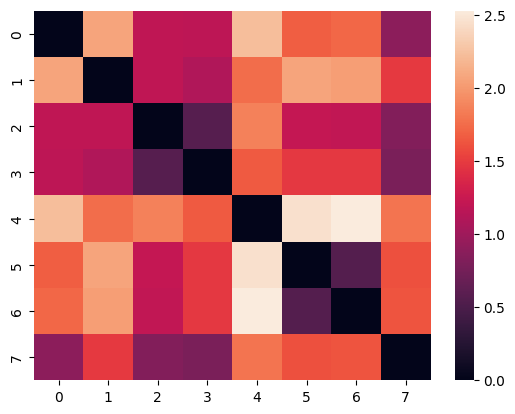

In [34]:
seaborn.heatmap(riemann_fit)

<Axes: >

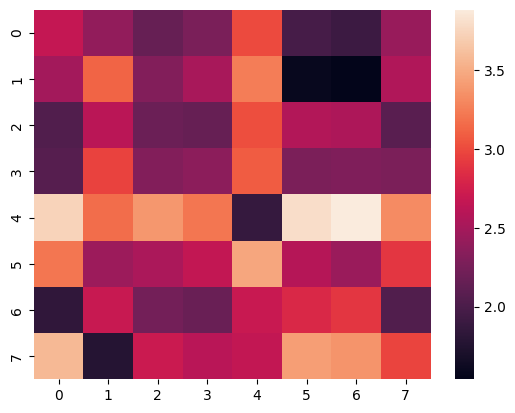

In [35]:
seaborn.heatmap(riemann_truth_fit)

In [21]:
from rotation.utils import hungarian_pair

In [38]:
fisher_indices, fisher_reordered = hungarian_pair(correlation_truth_fit)

<Axes: >

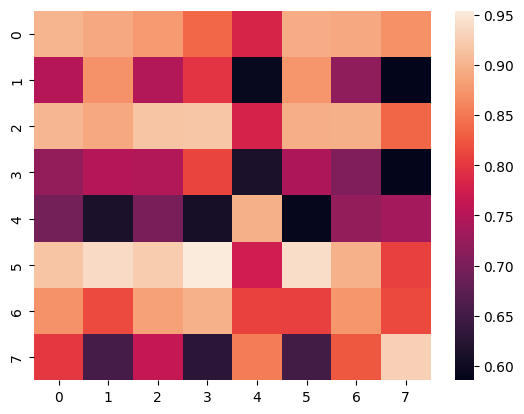

In [39]:
seaborn.heatmap(fisher_reordered)

### Check the effect of z_score

In [3]:
import pathlib
import numpy as np
from rotation.preprocessing import PrepareData
original_data = np.loadtxt('data/node_timeseries/simulation_toy_5/10001.txt')


In [4]:
original_data.shape

(120000, 25)

In [12]:
data_dir = pathlib.Path('data/node_timeseries/simulation_toy_5/')
prepare_data = PrepareData(data_dir)
subj,dataset = prepare_data.load(z_score_data=True)


Read from directory:  data/node_timeseries/simulation_toy_5
Number of subjects:  1


Loading files: 100%|███████████████████████| 100/100 [00:00<00:00, 10272.86it/s]


In [13]:
subj

['10001']

In [14]:
dataset

In [15]:
np.sum(dataset[0]!=original_data[:1200,:])

30000

In [16]:
covariances_no_z_score = np.load('./results_simulation_playground/no_z_score/HMM_ICA_25_state_8/state_covariances.npy')

In [17]:
correlations_no_z_score = np.load('./results_simulation_playground/no_z_score/HMM_ICA_25_state_8/state_correlations.npy')

Compute Fisher-z transformated correlation: 100%|█| 8/8 [00:00<00:00, 58.45it/s]


<Axes: >

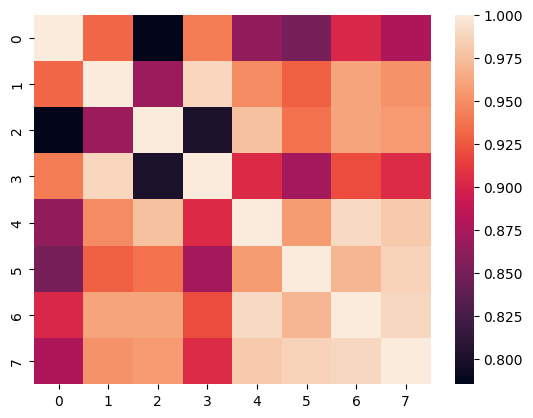

In [20]:
import seaborn
from rotation.utils import pairwise_fisher_z_correlations
seaborn.heatmap(pairwise_fisher_z_correlations(correlations_no_z_score))

In [22]:
from rotation.utils import twopair_riemannian_distance
covariances = np.load('./results_HCP_202311_no_mean/HMM_ICA_25_state_8/state_covariances.npy')
covariances_no_z_score_truth = twopair_riemannian_distance(covariances_no_z_score,covariances)

Computing Riemannian distances: 100%|█████████████| 8/8 [00:00<00:00, 50.33it/s]


<Axes: >

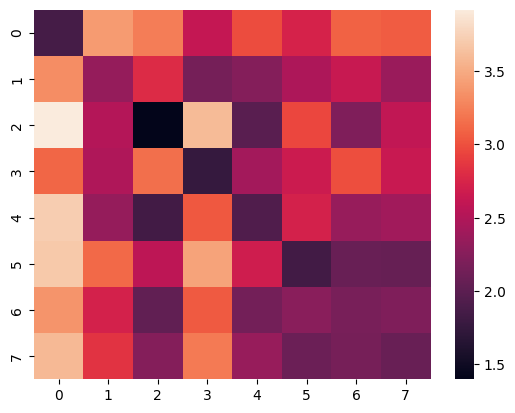

In [23]:
fisher_indices, fisher_reordered = hungarian_pair(covariances_no_z_score_truth,distance=True)
seaborn.heatmap(fisher_reordered)

### Update 29th November 2023: Using Sliding window correlation to check model simulation

#### Step 1: read in the ground-truth correlations and covariances.

In [1]:
import numpy as np
correlations_truth = np.load('./results_HCP_202311_no_mean/HMM_ICA_25_state_8/state_correlations.npy')
covariances_truth = np.load('./results_HCP_202311_no_mean/HMM_ICA_25_state_8/state_covariances.npy')

#### Step 2: read in the sliding window correlations and covariances.

In [2]:
correlations_SWC = np.load('./results_simulation_202311_toy_6/SWC_ICA_25_state_8/state_correlations.npy')
covariances_SWC = np.load('./results_simulation_202311_toy_6/SWC_ICA_25_state_8/state_covariances.npy')

In [3]:
from rotation.utils import twopair_riemannian_distance, twopair_fisher_z_transformed_correlation, hungarian_pair

/well/win-fmrib-analysis/users/uap971/conda/skylake/envs/osld/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
### Riemannian distance of ground truth correlations/covariances
riemannian_cor_truth = twopair_riemannian_distance(correlations_truth,correlations_truth)
riemannian_cov_truth = twopair_riemannian_distance(covariances_truth,covariances_truth)
riemannian_cor_SWC = twopair_riemannian_distance(correlations_SWC,correlations_SWC)
riemannian_cov_SWC = twopair_riemannian_distance(covariances_SWC,covariances_SWC)
riemannian_cor_truth_SWC = twopair_riemannian_distance(correlations_truth,correlations_SWC)
riemannian_cov_truth_SWC = twopair_riemannian_distance(covariances_truth,covariances_SWC)

Computing Riemannian distances:   0%|                     | 0/8 [00:00<?, ?it/s]
/gpfs3/well/win-fmrib-analysis/users/uap971/osl-dynamics/rotation/utils.py:427: UserWarning: Calculation of Riemannian distance failed for eps=0
  warnings.warn(f'Calculation of Riemannian distance failed for eps={eps}')
Computing Riemannian distances:   0%|                     | 0/8 [00:00<?, ?it/s]
/gpfs3/well/win-fmrib-analysis/users/uap971/osl-dynamics/rotation/utils.py:427: UserWarning: Calculation of Riemannian distance failed for eps=1e-09
  warnings.warn(f'Calculation of Riemannian distance failed for eps={eps}')
Computing Riemannian distances:   0%|                     | 0/8 [00:00<?, ?it/s]
/gpfs3/well/win-fmrib-analysis/users/uap971/osl-dynamics/rotation/utils.py:427: UserWarning: Calculation of Riemannian distance failed for eps=1e-08
  warnings.warn(f'Calculation of Riemannian distance failed for eps={eps}')
Computing Riemannian distances:   0%|                     | 0/8 [00:00<?, ?it/s]
/gpfs

ValueError: Riemannian distance failed for all eps values!

In [6]:
### Fisher-z transformed of ground truth correlations/covariances
fisher_cor_truth = twopair_fisher_z_transformed_correlation(correlations_truth,correlations_truth)
fisher_cor_SWC = twopair_fisher_z_transformed_correlation(correlations_SWC,correlations_SWC)
fisher_cor_truth_SWC = twopair_fisher_z_transformed_correlation(correlations_truth,correlations_SWC)

Compute twopair Fisher-z transformated correlation: 100%|█| 8/8 [00:00<00:00, 43
Compute twopair Fisher-z transformated correlation: 100%|█| 8/8 [00:00<00:00, 27
Compute twopair Fisher-z transformated correlation: 100%|█| 8/8 [00:00<00:00, 44


<Axes: >

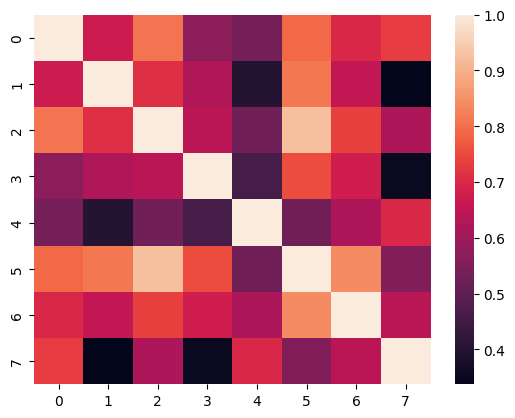

In [7]:
import seaborn
seaborn.heatmap(fisher_cor_truth)

<Axes: >

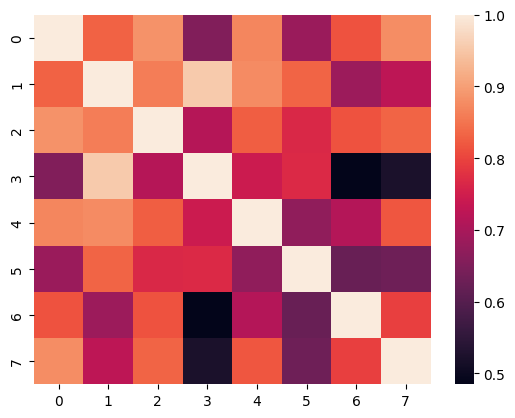

In [8]:
seaborn.heatmap(fisher_cor_SWC)

In [11]:
indices, fisher_cor_truth_SWC_reordered = hungarian_pair(fisher_cor_truth_SWC)

<Axes: >

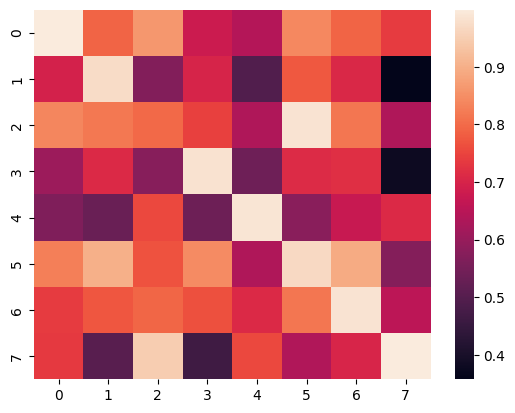

In [12]:
seaborn.heatmap(fisher_cor_truth_SWC_reordered)

In [13]:
fisher_cor_truth_SWC_reordered

array([[0.99665347, 0.79065424, 0.86175603, 0.67923163, 0.64137114,
        0.83951469, 0.79072613, 0.73808677],
       [0.69531901, 0.97180593, 0.56825185, 0.69969413, 0.49478473,
        0.77561   , 0.70770739, 0.35748703],
       [0.83670896, 0.81624049, 0.79788602, 0.74443762, 0.63394945,
        0.98448696, 0.81566564, 0.63466101],
       [0.606599  , 0.70847455, 0.57585796, 0.98390002, 0.53809844,
        0.71286777, 0.71860203, 0.37846639],
       [0.56450886, 0.531393  , 0.75437802, 0.53637612, 0.98684594,
        0.57883474, 0.67088507, 0.71001059],
       [0.82633156, 0.89953065, 0.76747896, 0.84420265, 0.63545595,
        0.96842436, 0.89347347, 0.57129213],
       [0.73816928, 0.77253745, 0.79246946, 0.76510963, 0.71058002,
        0.81414476, 0.98449903, 0.65564675],
       [0.73440623, 0.50396578, 0.94752085, 0.462748  , 0.75510815,
        0.63700018, 0.70084349, 0.99896867]])

#### Step 3: read in the HMM states 

In [20]:
correlations_HMM = np.load('./results_simulation_202311_toy_6/HMM_ICA_25_state_8/state_correlations.npy')
covariances_HMM = np.load('./results_simulation_202311_toy_6/HMM_ICA_25_state_8/state_covariances.npy')

In [21]:
fisher_cor_HMM = twopair_fisher_z_transformed_correlation(correlations_HMM,correlations_HMM)
fisher_cor_truth_HMM = twopair_fisher_z_transformed_correlation(correlations_truth,correlations_HMM)

Compute twopair Fisher-z transformated correlation: 100%|█| 8/8 [00:00<00:00, 42
Compute twopair Fisher-z transformated correlation: 100%|█| 8/8 [00:00<00:00, 46


In [22]:
indices, fisher_cor_truth_HMM_reordered = hungarian_pair(fisher_cor_truth_HMM)

<Axes: >

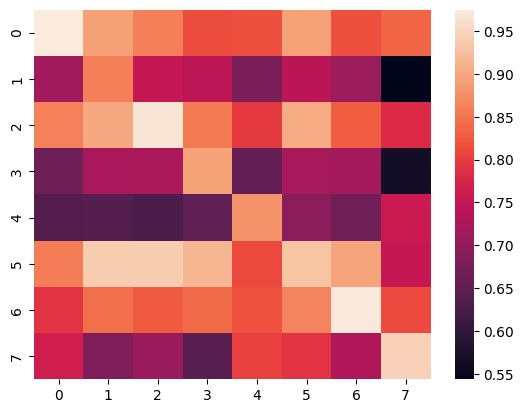

In [23]:
seaborn.heatmap(fisher_cor_truth_HMM_reordered)

<Axes: >

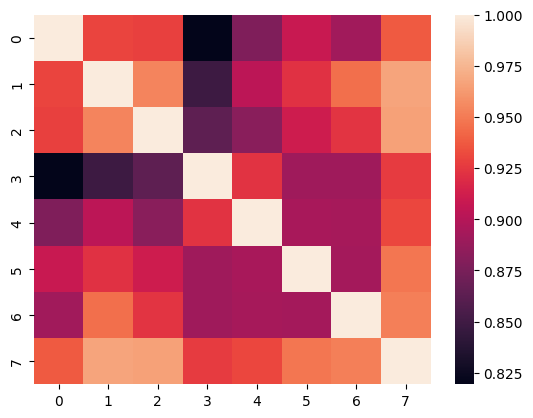

In [24]:
seaborn.heatmap(fisher_cor_HMM)

### Update 1st Dec 2023

As suggested by Chet, now let's check whether the osl-dynamics HMM inference is correct. First, check the non-trainable case.

In [13]:
import numpy as np
import seaborn
from rotation.utils import twopair_riemannian_distance, hungarian_pair

In [14]:
state_covariance_fit = np.load('./results_simulation_202311_toy_6/HMM_ICA_25_state_8_final/state_covariances.npy')
state_correlation_fit = np.load('./results_simulation_202311_toy_6/HMM_ICA_25_state_8_final/state_correlations.npy')
state_covariance_truth = np.load('./results_HCP_202311_no_mean/HMM_ICA_25_state_8/state_covariances.npy')
state_correlation_truth = np.load('./results_HCP_202311_no_mean/HMM_ICA_25_state_8/state_correlations.npy')

In [15]:
riemannian_fit_truth = twopair_riemannian_distance(state_covariance_fit,state_covariance_truth)

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 703.06it/s]


[[3.40165214 4.30717011 3.84038278 4.20373658 3.51038735 3.12401759
  3.87697419 0.2220812 ]
 [3.52225279 3.43193624 3.2468047  3.18809499 3.97682885 3.94893485
  0.27046988 3.8413184 ]
 [3.34266174 3.25839884 0.22693022 3.28144366 4.3971542  3.68080528
  3.27287083 3.84530398]
 [2.99361127 3.09763207 3.6748324  3.28287213 4.49290185 0.2408669
  4.00648284 3.13329171]
 [4.28933351 4.40521676 4.40702048 4.23416973 0.23888105 4.52361696
  3.96486466 3.53856864]
 [2.91095785 0.24518114 3.26954234 2.98285989 4.41633575 3.08779298
  3.48844738 4.34197844]
 [3.27353471 2.99365311 3.3194696  0.23079059 4.24406806 3.27762597
  3.23906169 4.25418187]
 [0.18944531 2.91233698 3.35909665 3.24848635 4.30739919 2.99555427
  3.6033023  3.45915863]]


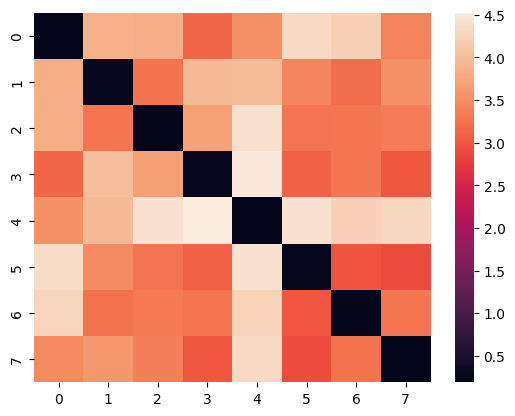

In [16]:
_, riemannian_fit_truth_reordered = hungarian_pair(riemannian_fit_truth,distance=True)
seaborn.heatmap(riemannian_fit_truth_reordered)
print(riemannian_fit_truth)

Compute Fisher-z transformated correlation: 100%|█| 8/8 [00:00<00:00, 1076.43it/


<Axes: >

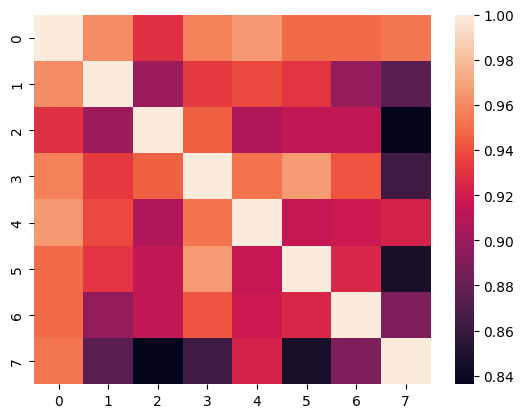

In [13]:
from rotation.utils import pairwise_fisher_z_correlations
seaborn.heatmap(pairwise_fisher_z_correlations(state_correlation_fit))

Compute Fisher-z transformated correlation: 100%|█| 8/8 [00:00<00:00, 1026.95it/


<Axes: >

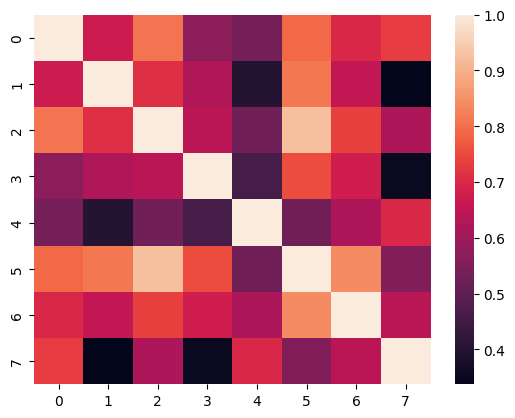

In [6]:
seaborn.heatmap(pairwise_fisher_z_correlations(state_correlation_truth))

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 675.18it/s]


<Axes: >

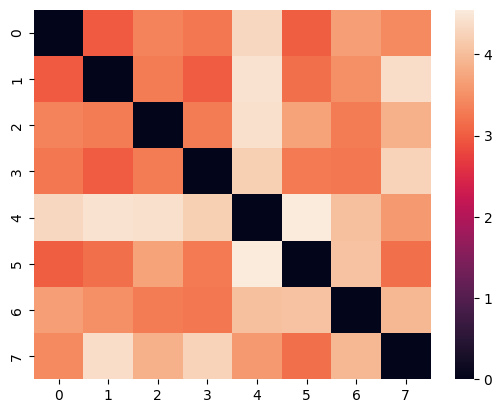

In [7]:
seaborn.heatmap(twopair_riemannian_distance(state_covariance_fit,state_covariance_fit))

In [12]:
import pickle

In [13]:
with open('./results_simulation_202311_toy_6/HMM_ICA_25_state_8/alpha.pkl','rb') as file:
    posterior = pickle.load(file)

In [48]:
posterior_hard = np.argmax(posterior[7],axis=1)
print(posterior_hard.shape)

(1200,)


In [22]:
truth = np.load('data/node_timeseries/simulation_toy_6/10001_state_time_course.npy')

In [51]:
truth_0 = np.argmax(truth[8400:9600,:],axis=1)

In [52]:
np.sum(truth_0!=posterior_hard)

1000

In [53]:
for i in range(100):
    posterior_hard = np.argmax(posterior[i],axis=1)
    truth_0 = np.argmax(truth[i*1200:i*1200+1200,:],axis=1)
    print(np.sum(truth_0!=posterior_hard))

13
4
5
13
13
5
68
14
17
18
26
12
22
19
23
10
3
10
15
5
10
14
2
10
13
17
16
3
27
11
13
18
10
6
26
23
21
17
17
31
16
20
8
43
13
18
19
17
6
18
11
25
11
20
18
10
10
25
20
16
36
12
17
21
5
14
10
5
22
36
18
18
9
10
20
14
18
12
12
17
22
11
13
10
6
13
25
12
15
13
16
35
6
8
7
25
9
12
18
18


### Understand the different training configurations and loss function

In [54]:
sequence_lengths = [600,400,200,100,50,25]
batch_sizes = [1024,512,256,128,64,32]
learning_rates = [0.0005,0.001,0.005,0.01]

In [56]:
import os
import numpy as np

In [57]:
for sequence_length in sequence_lengths:
    for batch_size in batch_sizes:
        for learning_rate in learning_rates:
            if not os.path.exists(f'./results_training_config/sl_{sequence_length}_bs_{batch_size}_lr_{learning_rate}/trans_prob.npy'):
                print(f'sequence_length_{sequence_length}_batch_size_{batch_size}_learning_rate_{learning_rate}')

sequence_length_25_batch_size_32_learning_rate_0.0005
sequence_length_25_batch_size_32_learning_rate_0.001
sequence_length_25_batch_size_32_learning_rate_0.005
sequence_length_25_batch_size_32_learning_rate_0.01


### Update the state covariances after initialised training

In [7]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn
%matplotlib inline
from rotation.utils import cov2stdcor, pairwise_fisher_z_correlations, twopair_riemannian_distance

Compute Fisher-z transformated correlation: 100%|█| 8/8 [00:00<00:00, 862.83it/s


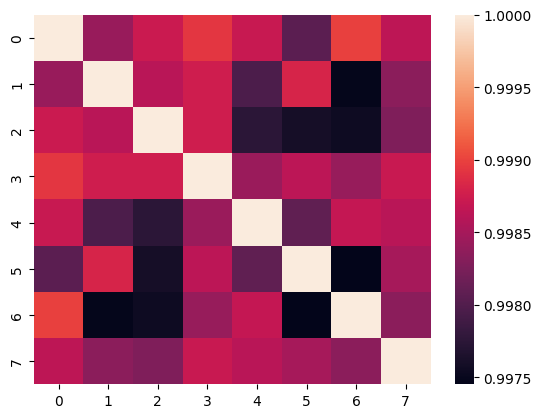

In [20]:
save_dir = './results_simulation_202311_toy_6/HMM_ICA_25_state_8_miscellaneous_real/'
n_init = 10
for i in range(1,2):
    covariances = np.load(f'{save_dir}covariances_{i}.npy')
    _, correlations = cov2stdcor(covariances)
    seaborn.heatmap(pairwise_fisher_z_correlations(correlations))
    plt.show()

### Check Chet's simulation - What these covariance matrices look like

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn
%matplotlib inline
from rotation.utils import twopair_riemannian_distance, pairwise_fisher_z_correlations, cov2stdcor

/well/win-fmrib-analysis/users/uap971/conda/skylake/envs/osld/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
covariances = np.load('./data/node_timeseries/simulation_toy_8/10001_state_covariances.npy')

In [3]:
_,correlations = cov2stdcor(covariances)

Computing Riemannian distances: 100%|█████████████| 5/5 [00:00<00:00, 28.93it/s]


<Axes: >

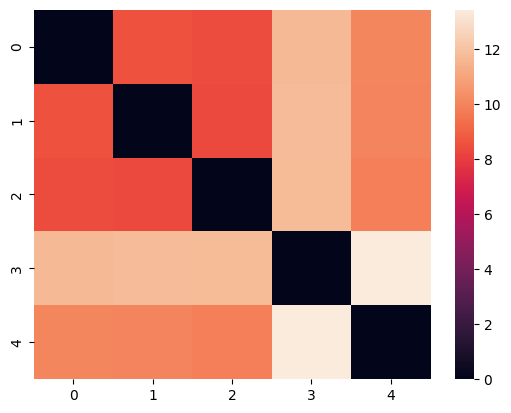

In [4]:
seaborn.heatmap(twopair_riemannian_distance(covariances, covariances))

Compute Fisher-z transformated correlation: 100%|█| 5/5 [00:00<00:00, 1758.47it/


<Axes: >

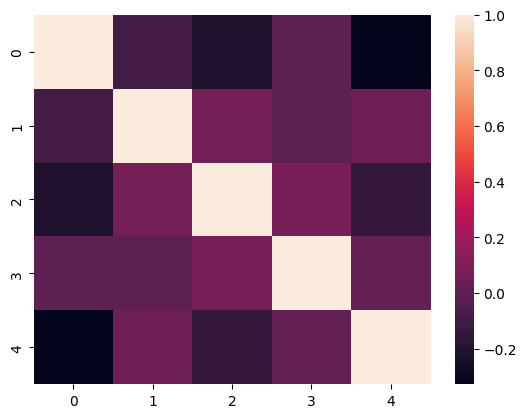

In [5]:
seaborn.heatmap(pairwise_fisher_z_correlations(correlations))

Compute Fisher-z transformated correlation: 100%|█| 5/5 [00:00<00:00, 1686.36it/


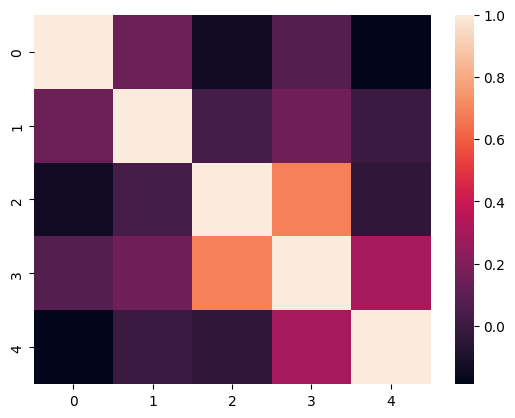

Compute Fisher-z transformated correlation: 100%|█| 5/5 [00:00<00:00, 2539.85it/


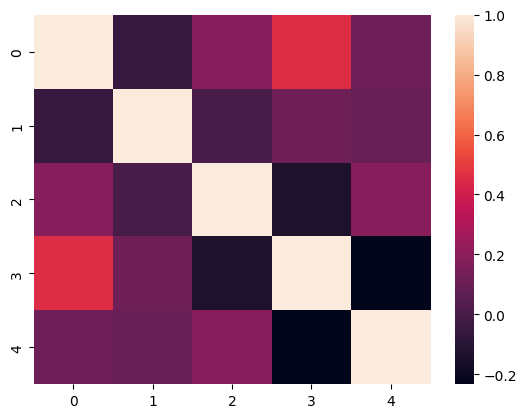

Compute Fisher-z transformated correlation: 100%|█| 5/5 [00:00<00:00, 1579.30it/


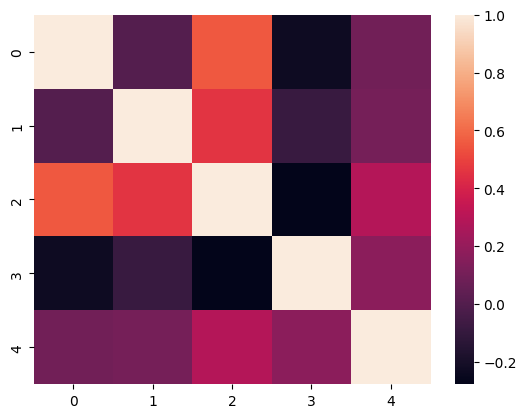

Compute Fisher-z transformated correlation: 100%|█| 5/5 [00:00<00:00, 1889.84it/


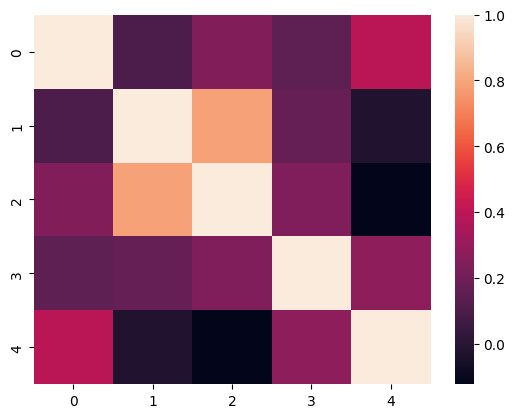

Compute Fisher-z transformated correlation: 100%|█| 5/5 [00:00<00:00, 1555.17it/


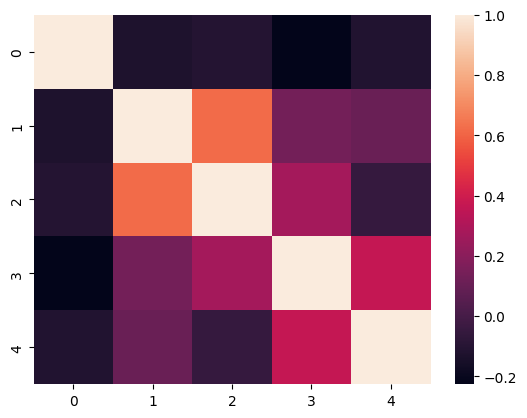

Compute Fisher-z transformated correlation: 100%|█| 5/5 [00:00<00:00, 1830.77it/


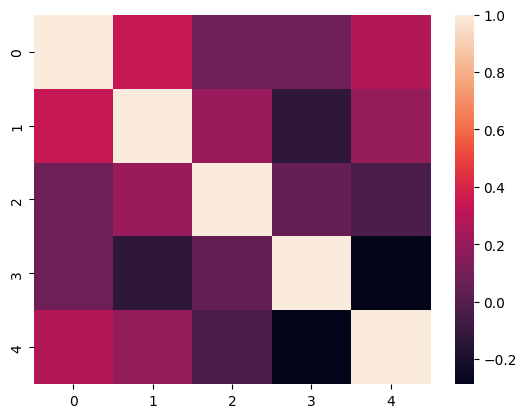

Compute Fisher-z transformated correlation: 100%|█| 5/5 [00:00<00:00, 1892.22it/


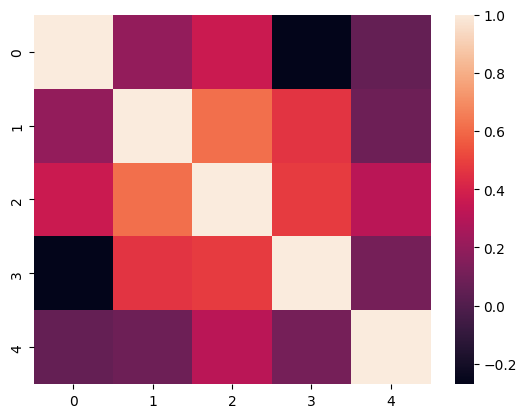

Compute Fisher-z transformated correlation: 100%|█| 5/5 [00:00<00:00, 1795.35it/


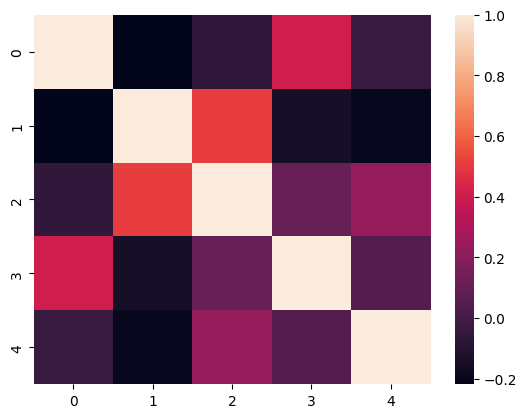

Compute Fisher-z transformated correlation: 100%|█| 5/5 [00:00<00:00, 1858.52it/


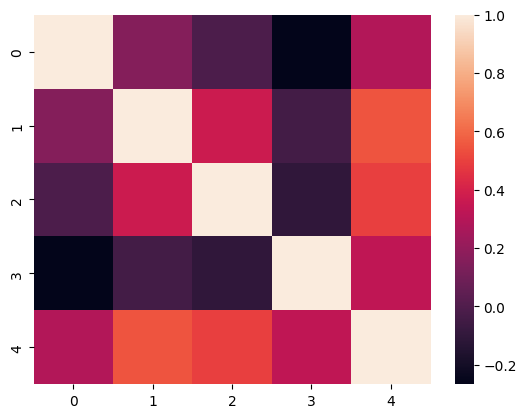

Compute Fisher-z transformated correlation: 100%|█| 5/5 [00:00<00:00, 1958.67it/


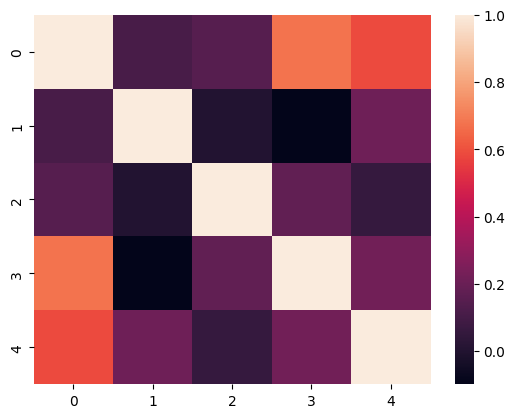

In [6]:
save_dir = './results_simulation_202311_toy_8/'
n_init = 10
for i in range(n_init):
    covariances = np.load(f'{save_dir}covariances_{i}.npy')
    _, correlations = cov2stdcor(covariances)
    seaborn.heatmap(pairwise_fisher_z_correlations(correlations))
    plt.show()

Computing Riemannian distances: 100%|███████████| 5/5 [00:00<00:00, 1592.37it/s]


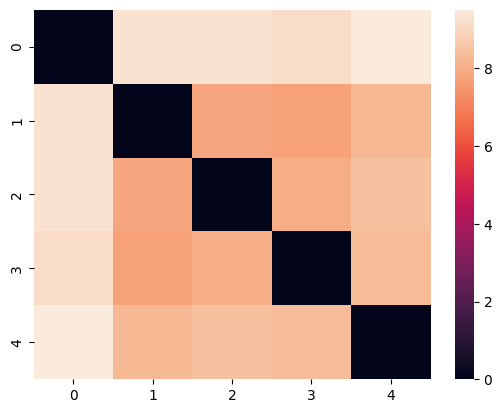

In [7]:
results_covariance = np.load(f'{save_dir}HMM_ICA_11_state_5/state_covariances.npy')
seaborn.heatmap(twopair_riemannian_distance(results_covariance,results_covariance))
plt.show()

Computing Riemannian distances: 100%|███████████| 5/5 [00:00<00:00, 1654.17it/s]


[[7.48701844 6.75399839 7.17971632 7.91314317 7.60459501]
 [5.89449839 6.6039659  6.08214241 6.20640782 3.83590764]
 [5.71553436 6.57674421 6.36538851 4.12601537 6.65066772]
 [5.14404274 6.70249356 4.57809857 6.55693776 6.41183871]
 [6.37435824 5.69786049 6.67285536 6.69623953 6.98998333]]


AttributeError: QuadMesh.set() got an unexpected keyword argument 'distance'

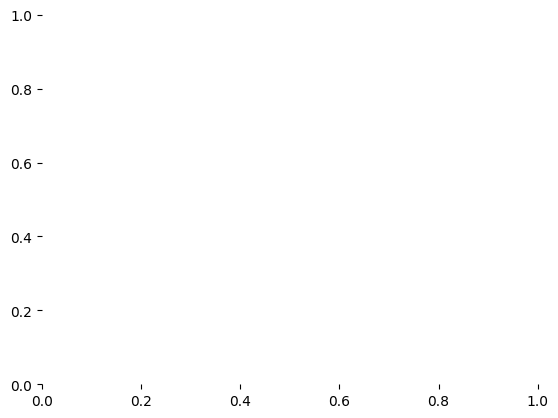

In [12]:
from rotation.utils import hungarian_pair
riem = twopair_riemannian_distance(results_covariance,covariances)
_, riem_reordered = hungarian_pair(riem)
print(riem_reordered)
seaborn.heatmap(riem_reordered,distance=True)
plt.show()

Now we have finished the training. Just look at your data!

In [14]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn
from rotation.utils import twopair_riemannian_distance, twopair_fisher_z_transformed_correlation, cov2stdcor,hungarian_pair

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 517.44it/s]


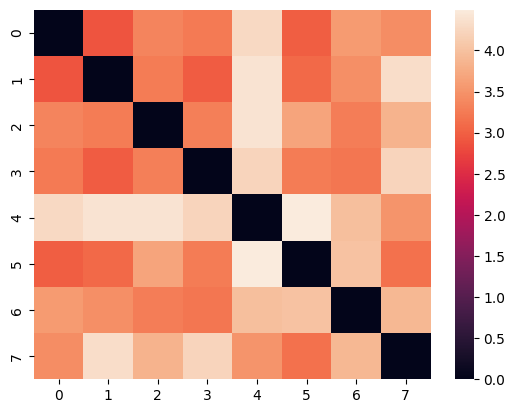

Compute twopair Fisher-z transformated correlation: 100%|█| 8/8 [00:00<00:00, 56


<Axes: >

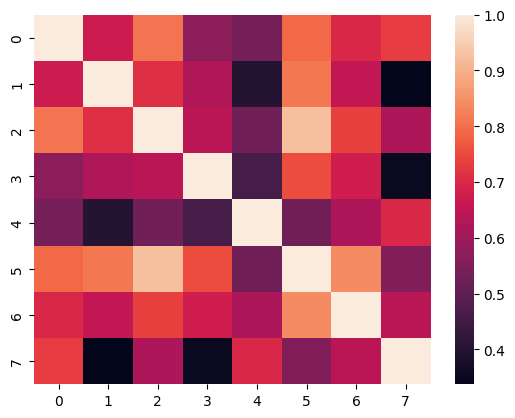

In [17]:
ground_truth_dir = './results_HCP_202311_no_mean/'
covariances_ground_truth = np.load(f'{ground_truth_dir}HMM_ICA_25_state_8/state_covariances.npy')
correlations_ground_truth = np.load(f'{ground_truth_dir}HMM_ICA_25_state_8/state_correlations.npy')
seaborn.heatmap(twopair_riemannian_distance(covariances_ground_truth,covariances_ground_truth))
plt.show()
seaborn.heatmap(twopair_fisher_z_transformed_correlation(correlations_ground_truth,correlations_ground_truth))

Computing Riemannian distances: 100%|██████████| 16/16 [00:00<00:00, 292.92it/s]


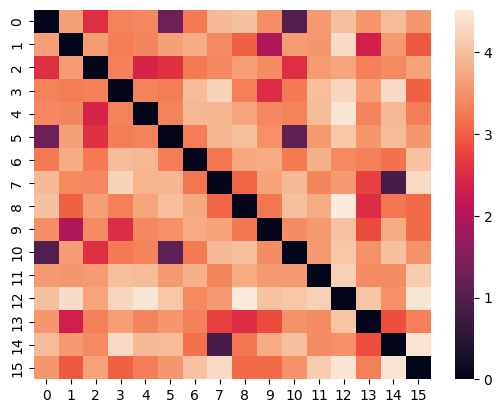

Compute twopair Fisher-z transformated correlation: 100%|█| 16/16 [00:00<00:00, 


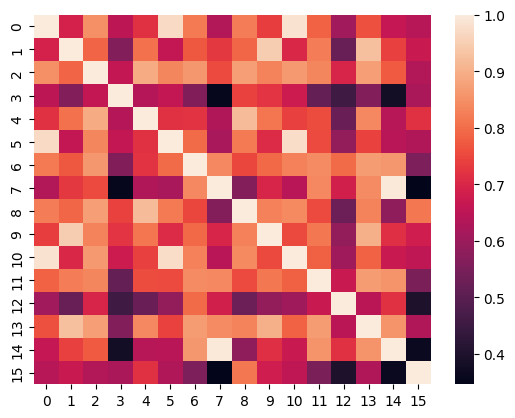

Computing Riemannian distances: 100%|██████████| 16/16 [00:00<00:00, 787.76it/s]


<Axes: >

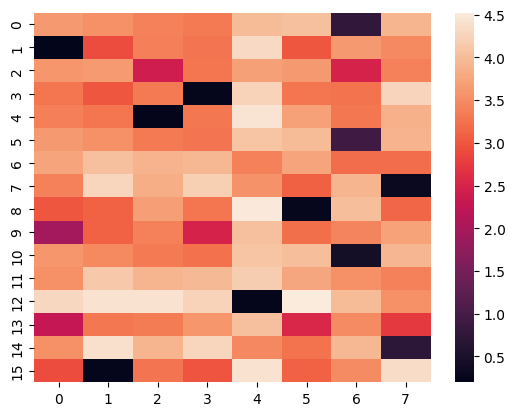

In [36]:
save_dir = './results_simulation_202311_toy_6/'
n_states = [2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]
covariances = np.load(f'{save_dir}HMM_ICA_25_state_16/state_covariances.npy')
correlations = np.load(f'{save_dir}HMM_ICA_25_state_16/state_correlations.npy')
seaborn.heatmap(twopair_riemannian_distance(covariances,covariances))
plt.show()
seaborn.heatmap(twopair_fisher_z_transformed_correlation(correlations,correlations))
plt.show()
covariance_fit_truth = twopair_riemannian_distance(covariances,covariances_ground_truth)
seaborn.heatmap(covariance_fit_truth)

check the fractional occupancy when the states are very large

In [39]:
fo = np.load(f'{save_dir}HMM_ICA_25_state_16/fo.npy')
print(np.mean(fo,axis=0))

[0.02820833 0.17531667 0.00204167 0.12139167 0.111325   0.02111667
 0.00235833 0.10115    0.10949167 0.00215833 0.07358333 0.00185
 0.10640833 0.00259167 0.03178333 0.109225  ]


### Check the results of all training configurations

In [8]:
import numpy as np
import json
import os
import matplotlib.pyplot as plt
%matplotlib inline

In [10]:
sequence_lengths = [25,50,100,200,400,600]
batch_sizes = [32,64,128,256,512,1024]
#learning_rates = [0.0005,0.001,0.005,0.01]
learning_rates = [0.001]

Check whether the training has finished

In [7]:
save_dir = './results_training_config/'
for sequence_length in sequence_lengths:
    for batch_size in batch_sizes:
        for learning_rate in learning_rates:
            if not os.path.isfile(f'{save_dir}sl_{sequence_length}_bs_{batch_size}_lr_{learning_rate}/time.json'):
                print(f'sl_{sequence_length}_bs_{batch_size}_lr_{learning_rate}')

sl_25_bs_32_lr_0.0005
sl_25_bs_32_lr_0.001
sl_25_bs_32_lr_0.005
sl_25_bs_32_lr_0.01


/tmp/slurm-39097824/ipykernel_37046/3657015509.py:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(configurations, rotation=45, ha='right')


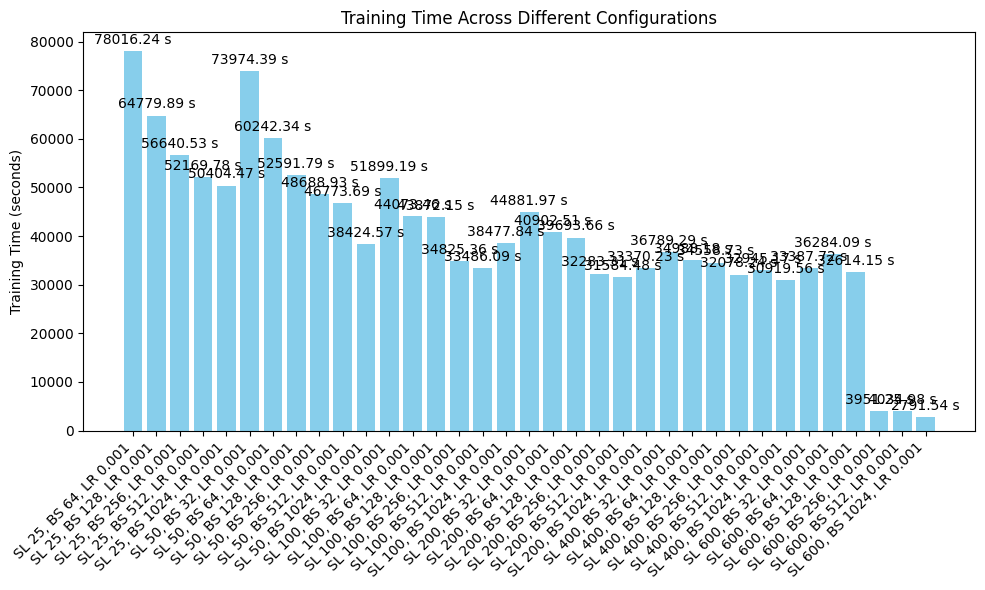

In [11]:
# Initialize lists to store data
configurations = []
durations = []

# Loop through configurations and read JSON files
for sequence_length in sequence_lengths:
    for batch_size in batch_sizes:
        for learning_rate in learning_rates:
            # Skip the missing file
            if sequence_length == 25 and batch_size == 32:
                continue
            
            # Construct the file path
            file_path = f'./results_training_config/sl_{sequence_length}_bs_{batch_size}_lr_{learning_rate}/time.json'
            
            # Check if the file exists
            if os.path.exists(file_path):
                # Read the JSON file
                with open(file_path, 'r') as json_file:
                    data = json.load(json_file)
                    duration = data['duration']
                    
                    # Append data to lists
                    configurations.append(f'SL {sequence_length}, BS {batch_size}, LR {learning_rate}')
                    durations.append(duration)

# Create a bar plot
fig, ax = plt.subplots(figsize=(10, 6))
bars = ax.bar(configurations, durations, color='skyblue')
ax.set_ylabel('Training Time (seconds)')
ax.set_title('Training Time Across Different Configurations')
ax.set_xticklabels(configurations, rotation=45, ha='right')

# Add data labels
for bar, duration in zip(bars, durations):
    height = bar.get_height()
    ax.annotate(f'{duration:.2f} s', xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, 3),  # 3 points vertical offset
                textcoords="offset points",
                ha='center', va='bottom')

plt.tight_layout()
plt.show()


## Update 8th Dec 2023

### Step 1: Show our current training model is successful

Method: use the ground-truth HMM model obtained from HCP (results_HCP_202311_no_mean), generate some simulation data (results_simulation_202311_toy_6), and then compare the fitted states with respect to the ground truth.

In [168]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn
from rotation.utils import *

first read through the ground truth

covariances ground truth shape: (8, 25, 25)
correlations_truth shape: (8, 25, 25)


Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 695.04it/s]
Compute twopair Fisher-z transformated correlation: 100%|█| 8/8 [00:00<00:00, 46


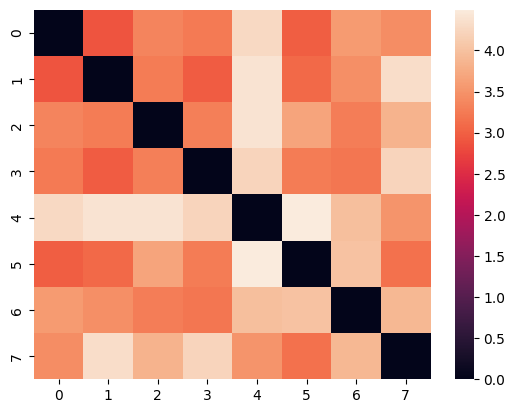

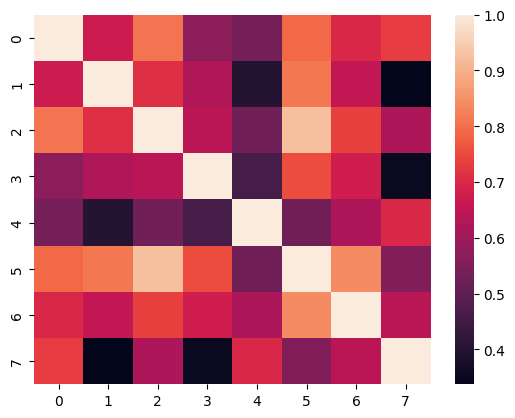

In [169]:
save_dir_truth = './results_HCP_202311_no_mean/HMM_ICA_25_state_8/'
covariances_truth = np.load(f'{save_dir_truth}state_covariances.npy')
correlations_truth = np.load(f'{save_dir_truth}state_correlations.npy')
print(f'covariances ground truth shape: {covariances_truth.shape}')
print(f'correlations_truth shape: {correlations_truth.shape}')
riemannian_truth = twopair_riemannian_distance(covariances_truth,covariances_truth)
fisher_z_truth = twopair_fisher_z_transformed_correlation(correlations_truth,correlations_truth)
seaborn.heatmap(riemannian_truth)
plt.show()
seaborn.heatmap(fisher_z_truth)
plt.show()

then read the model fitting (HMM_ICA_25_state_8)

In [170]:
save_dir_fit ='./results_simulation_202311_toy_9/HMM_ICA_25_state_8/'

covariances fit shape: (8, 25, 25)
correlations fit shape: (8, 25, 25)


Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 681.72it/s]
Compute twopair Fisher-z transformated correlation: 100%|█| 8/8 [00:00<00:00, 50


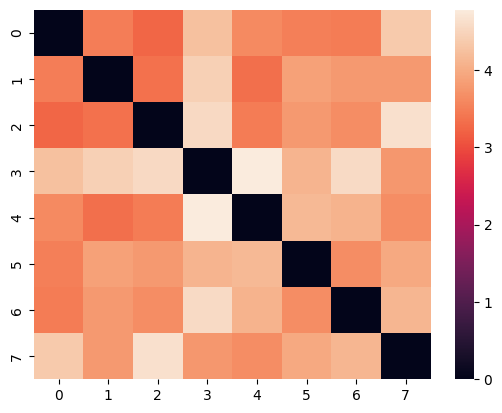

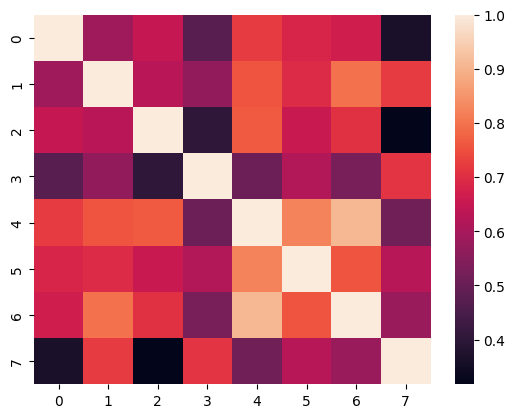

In [171]:
covariances_fit = np.load(f'{save_dir_fit}state_covariances.npy')
correlations_fit = np.load(f'{save_dir_fit}state_correlations.npy')
print(f'covariances fit shape: {covariances_fit.shape}')
print(f'correlations fit shape: {correlations_fit.shape}')
riemannian_fit = twopair_riemannian_distance(covariances_fit,covariances_fit)
fisher_z_fit = twopair_fisher_z_transformed_correlation(correlations_fit,correlations_fit)
seaborn.heatmap(riemannian_fit)
plt.show()
seaborn.heatmap(fisher_z_fit)
plt.show()

At least, the within-model distance/similarity distribution are similar.
Now try to pair them!

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 720.35it/s]


[[1.163 3.347 3.119 4.247 3.421 3.345 3.327 4.34 ]
 [3.356 1.226 3.121 4.355 3.152 3.706 3.545 3.588]
 [3.081 3.12  1.264 4.543 3.225 3.639 3.523 4.51 ]
 [4.222 4.341 4.39  1.298 4.625 3.869 4.339 3.702]
 [3.485 3.201 3.378 4.678 1.366 4.053 3.962 3.515]
 [3.327 3.76  3.614 4.184 4.12  1.155 3.413 4.052]
 [3.42  3.607 3.412 4.615 3.867 3.519 1.252 4.134]
 [4.27  3.691 4.459 3.622 3.385 3.847 3.892 1.439]]


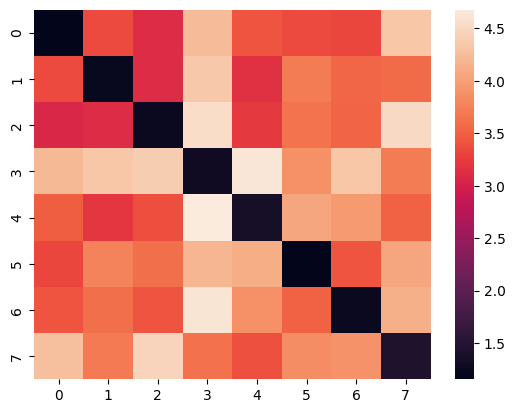

In [172]:
riemannian_fit_truth = twopair_riemannian_distance(covariances_fit,covariances_truth)
_,riemannian_fit_truth_reorder = hungarian_pair(riemannian_fit_truth,distance=True)
print(riemannian_fit_truth_reorder)
seaborn.heatmap(riemannian_fit_truth_reorder)
plt.show()

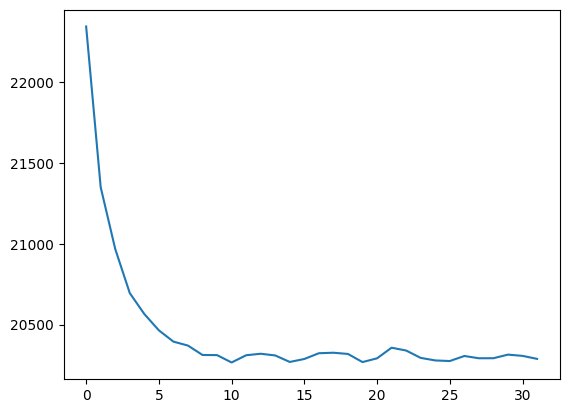

In [141]:
loss_history = np.load(f'{save_dir_fit}loss_history.npy')
plt.plot(loss_history)

I should say the model recover the majority of states quite well! So we can confirm that the model training on simulation is successful.

### Step 2: Compare across different number of states

#### Question 1: Has training converged?

In [165]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

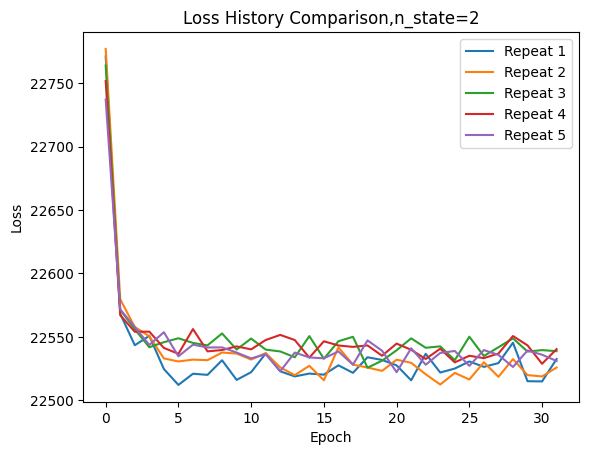

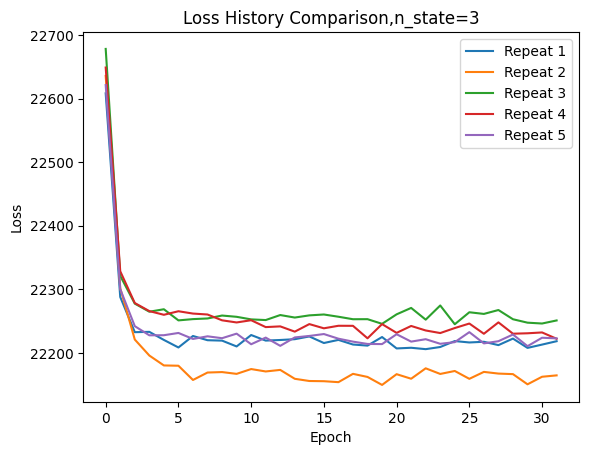

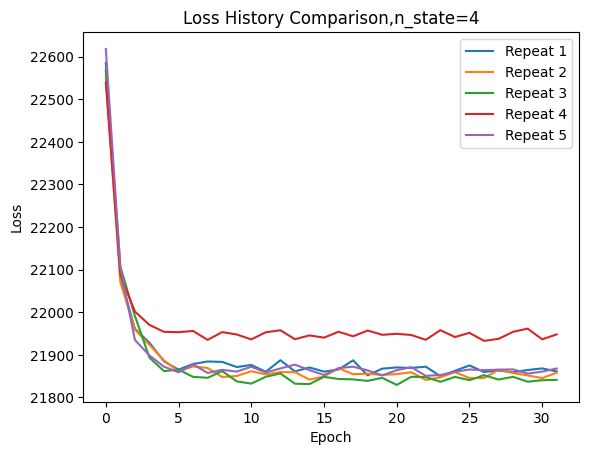

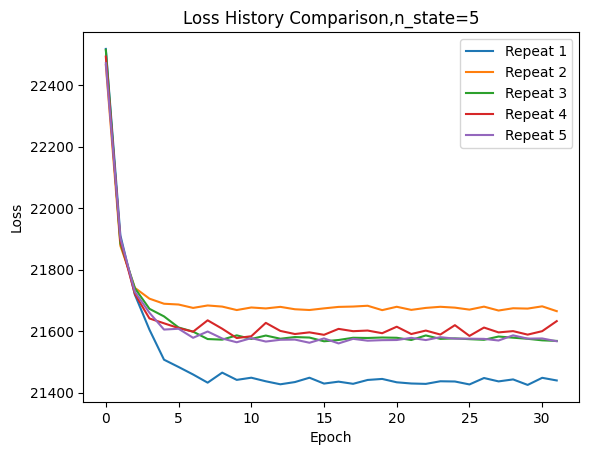

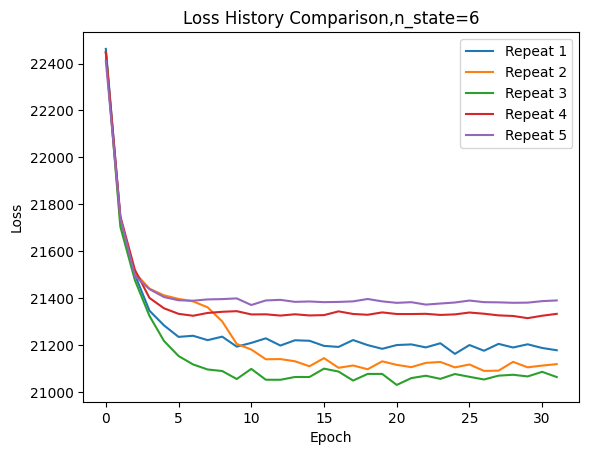

...

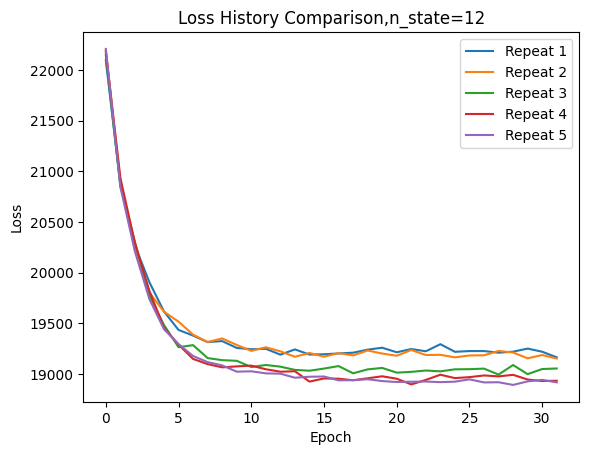

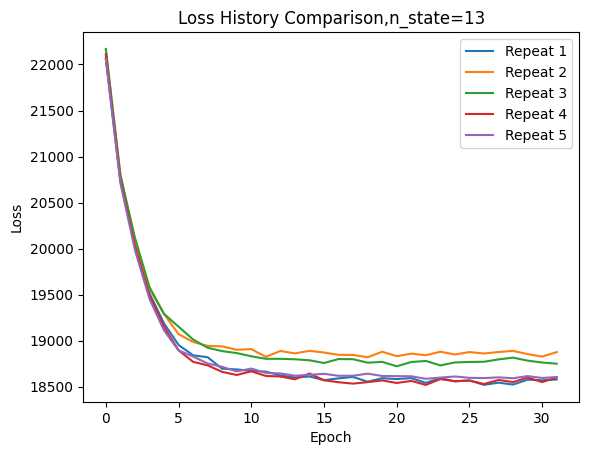

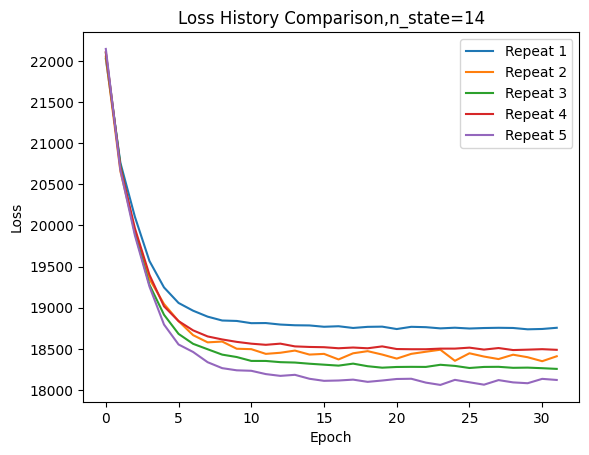

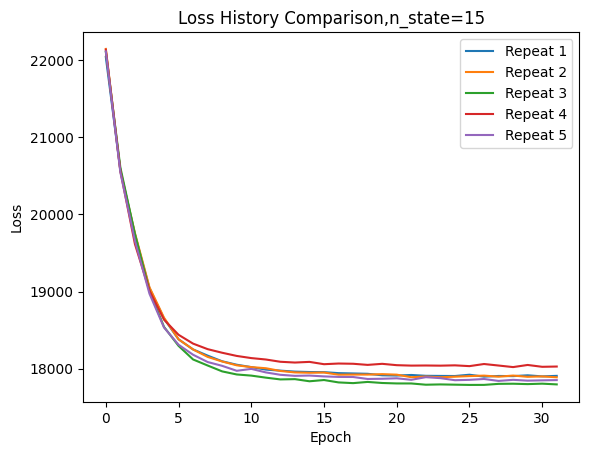

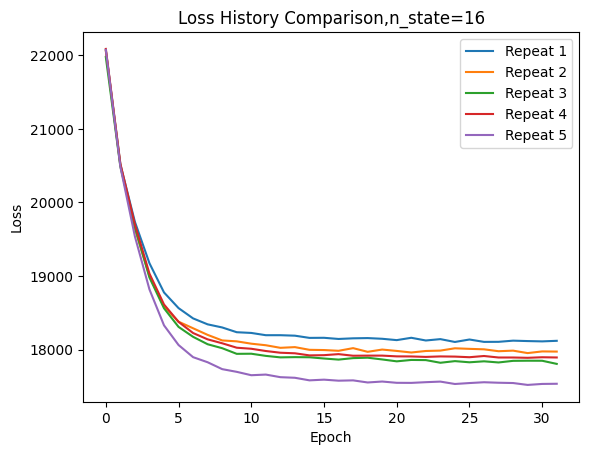

In [167]:
save_dir = './results_simulation_202311_toy_12/'
n_states = [2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]
for n_state in n_states:
    for i in range(1, 6):
        # Load the numpy array from each file
        file_path = f"repeat_{i}/loss_history.npy"
        loss_history = np.load(f'{save_dir}HMM_ICA_25_state_{n_state}/repeat_{i}/loss_history.npy')

        # Plot the loss history
        plt.plot(loss_history, label=f'Repeat {i}')

    # Add labels and title
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title(f'Loss History Comparison,n_state={n_state}')
    plt.legend()  # Add legend to differentiate between repeat runs

    # Show the plot
    plt.show()

#### Question 2: Do these states all look very similar to each other?

Note here we should make use of the original './results_simulation_202311_toy_6'

In [147]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn
from rotation.utils import twopair_fisher_z_transformed_correlation, twopair_riemannian_distance

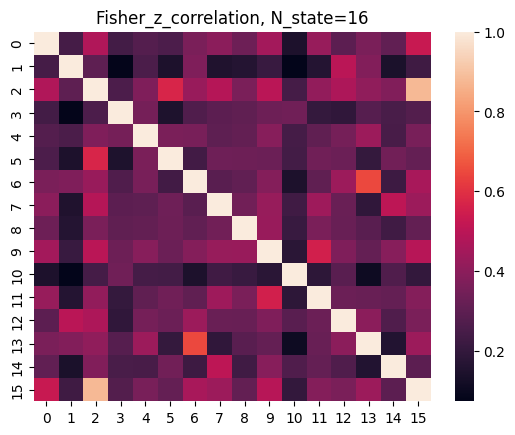

In [149]:
save_dir = './results_simulation_202311_toy_12/'
n_states = [16]#[2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]
for n_state in n_states:
    fisher_z_correlation_cor = np.load(f'{save_dir}HMM_ICA_25_state_{n_state}/distance/fisher_z_correlation_cor.npy')
    seaborn.heatmap(fisher_z_correlation_cor)
    plt.title(f'Fisher_z_correlation, N_state={n_state}')
    plt.show()

Conclusion: These states do not look similar to each other. The model training across all n_states is successful.

#### Question 3: How does free energy change with respect to training data? (No validation involved).

In [150]:
from rotation.analysis import comparison_analysis

In [174]:
models = ['HMM']
list_channels = [25,100,200]
list_states = [2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]
result_dir = './results_HCP_202312_no_mean/'
save_dir = './results_HCP_202312_no_mean/comparison/'
comparison_analysis(models,list_channels,list_states,result_dir,save_dir)

FileNotFoundError: [Errno 2] No such file or directory: './results_HCP_202312_no_mean/HMM_ICA_25_state_2/cross_validation_0/validation/metrics.json'

#### Step 9: Simulate a slightly more complicated case.

There are two subjects '10001.txt','10002.txt'. Their covariances are perturbation from the ground truth './results_HCP_202311_no_mean'. We aim to generate these two subjects first and compare their state covariances.

Ask ChatGPT how to do some perturbation on the covariance matrices first

In [163]:
import numpy as np

# Assuming cov_matrix is your original covariance matrix
cov_matrix = np.array([[1.0, 0.5, 0.3],
                      [0.5, 2.0, 0.2],
                      [0.3, 0.2, 0.8]])

# Define a small perturbation factor (adjust as needed)
perturbation_factor = 0.01

# Generate a random perturbation matrix
perturbation_matrix = np.random.normal(0, perturbation_factor, cov_matrix.shape)

# Add the perturbation to the original covariance matrix
perturbed_cov_matrix = cov_matrix + perturbation_matrix

# Ensure the resulting matrix is still positive definite (optional)
perturbed_cov_matrix = np.dot(perturbed_cov_matrix, perturbed_cov_matrix.T) 

print("Original Covariance Matrix:")
print(cov_matrix)
print("\nPerturbed Covariance Matrix:")
print(perturbed_cov_matrix)


Original Covariance Matrix:
[[1.  0.5 0.3]
 [0.5 2.  0.2]
 [0.3 0.2 0.8]]

Perturbed Covariance Matrix:
[[1.348 1.557 0.635]
 [1.557 4.272 0.738]
 [0.635 0.738 0.772]]


In [158]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn
from rotation.utils import cov2stdcor, twopair_riemannian_distance, twopair_fisher_z_transformed_correlation

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 426.60it/s]


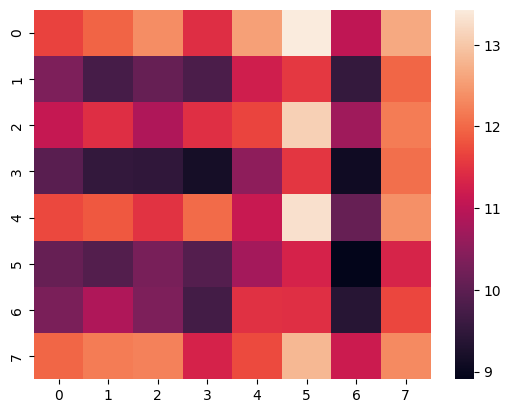

In [164]:
data_dir = './data/node_timeseries/simulation_toy_12/'
covariances = np.load('./results_HCP_202311_no_mean/HMM_ICA_25_state_8/state_covariances.npy')
covariances_1 = np.load(f'{data_dir}10001_state_covariances.npy')
covariances_2 = np.load(f'{data_dir}10002_state_covariances.npy')

#seaborn.heatmap(twopair_riemannian_distance(covariances,covariances))
#plt.show()
#seaborn.heatmap(twopair_riemannian_distance(covariances_1,covariances_1))
#plt.show()
#seaborn.heatmap(twopair_riemannian_distance(covariances_2,covariances_2))
#plt.show()
seaborn.heatmap(twopair_riemannian_distance(covariances_1,covariances_2))
plt.show()
#print(twopair_riemannian_distance(covariances_1,covariances_2))
#stds_1, correlations_1 = cov2stdcor(covariances_1)
#stds_2, correlations_2 = cov2stdcor(covariances_2)
#seaborn.heatmap(twopair_fisher_z_transformed_correlation(correlations_1,correlations_2))
#plt.show()
#print(f'stds_1: {stds_1}')
#print(f'stds_2: {stds_2}')

#### Step 6: Understand different components of free energy 

In [3]:
import pathlib
from osl_dynamics.models import load
from rotation.preprocessing import PrepareData
model = load('./results_simulation_202311_toy_6/HMM_ICA_25_state_2')
data_dir = pathlib.Path('./data/node_timeseries/simulation_toy_6/')
prepare_data = PrepareData(data_dir)
subj, dataset = prepare_data.load(z_score_data=False)
free_energy = model.free_energy(dataset)
evidence = model.evidence(dataset)
print(f'free energy: {free_energy}, evidence: {evidence}')

2023-12-12 17:41:09 INFO osl-dynamics [mod_base.py:589:load]: Loading model: ./results_simulation_202311_toy_6/HMM_ICA_25_state_2


Read from directory:  data/node_timeseries/simulation_toy_6
Number of subjects:  1


Loading files: 100%|███████████████████████| 100/100 [00:00<00:00, 19400.11it/s]
2023-12-12 17:41:11 INFO osl-dynamics [hmm.py:1105:free_energy]: Getting free energy


batch size: 64
log likelihood: -1204573.6141823456
entropy: -3398.9551675731
prior: -7956.800133308694
batch size: 64
log likelihood: -1211393.6685237056
entropy: -3685.379136066971
prior: -8470.877153165018
batch size: 64
log likelihood: -1225209.2512716432
entropy: -3676.6515730986484
prior: -8587.43910372143


2023-12-12 17:41:12 INFO osl-dynamics [hmm.py:1155:evidence]: Getting model evidence


batch size: 8
log likelihood: -152295.15767775595
entropy: -441.871216345985
prior: -1039.9540452404765
Batch 1/4
600/600 [==============================] - 14s 24ms/step
Batch 2/4
600/600 [==============================] - 13s 22ms/step
Batch 3/4
600/600 [==============================] - 13s 22ms/step
Batch 4/4
600/600 [==============================] - 13s 22ms/step
free energy: 19056.939799001382, evidence: -19055.842126217503


This result is important because it tells us the main component of free energy should be log-likelihood. At least empirically.

In [2]:
10000 / 1166990

0.008569053719397767

#### Step 3: Understand the intuitive relationship between free energy, temporal_dynamics and n_states

Let's have a look at HMM_ICA_25_state_16 from './results_simulation_202311_toy_6', which have the largest number of states, smallest free energy and not very good split-half reproducibility.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn
from rotation.utils import *

/well/win-fmrib-analysis/users/uap971/conda/skylake/envs/osld/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
save_dir_truth = './results_HCP_202311_no_mean/HMM_ICA_25_state_8/'
save_dir_1 = './results_simulation_202311_toy_6/HMM_ICA_25_state_8/'
save_dir_2 = './results_simulation_202311_toy_6/HMM_ICA_25_state_16/'

Question 1: Does the split-half models recover the underlying ground truth successfully?

In [5]:
covariances_truth = np.load(f'{save_dir_truth}state_covariances.npy')

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 527.17it/s]


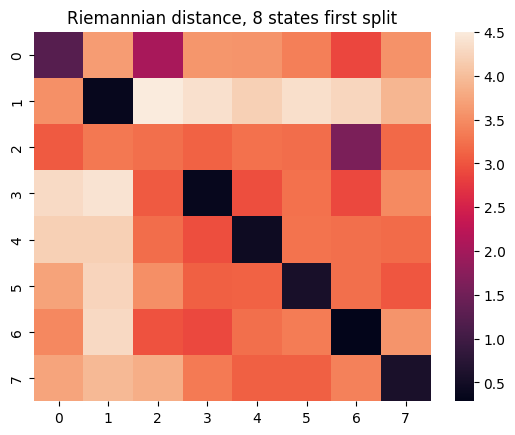

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 734.46it/s]


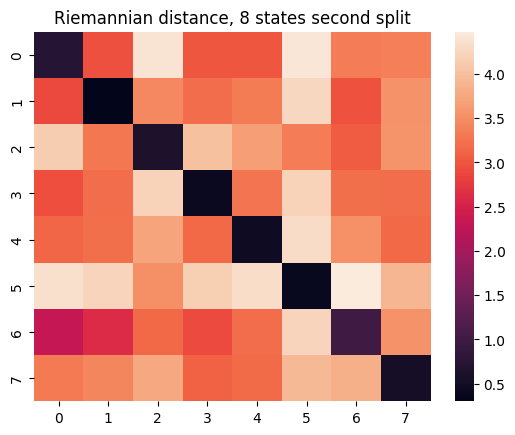

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 675.36it/s]


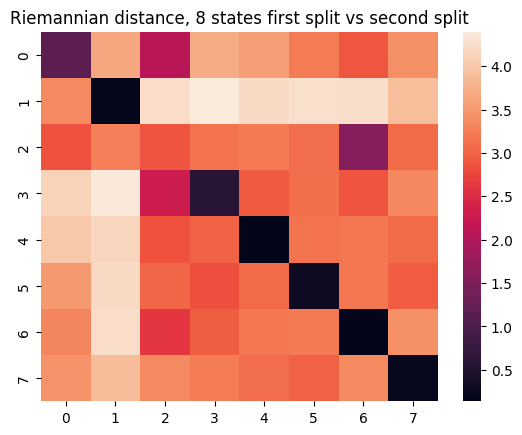

In [12]:
covariances_fit_1_first_half = np.load(f'{save_dir_1}split_1_first_half/state_covariances.npy')
covariances_fit_1_second_half = np.load(f'{save_dir_1}split_1_second_half/state_covariances.npy')

riem_fit_1_first = twopair_riemannian_distance(covariances_truth, covariances_fit_1_first_half)
index_fit_1_first, riem_fit_1_first_reorder = hungarian_pair(riem_fit_1_first,distance=True)
seaborn.heatmap(riem_fit_1_first_reorder)
plt.title('Riemannian distance, 8 states first split')
plt.show()

riem_fit_1_second = twopair_riemannian_distance(covariances_truth, covariances_fit_1_second_half)
index_fit_1_second, riem_fit_1_second_reorder = hungarian_pair(riem_fit_1_second,distance=True)
seaborn.heatmap(riem_fit_1_second_reorder)
plt.title('Riemannian distance, 8 states second split')
plt.show()

riem_fit_1_first_second = twopair_riemannian_distance(covariances_fit_1_first_half, covariances_fit_1_second_half)
index_fit_1_first_second, riem_fit_1_first_second_reorder = hungarian_pair(riem_fit_1_first_second,distance=True)
seaborn.heatmap(riem_fit_1_first_second_reorder)
plt.title('Riemannian distance, 8 states first split vs second split')
plt.show()

Conclusion: For HMM_ICA_25_state_8, 7/8 states are recovered in split 1, 8/8 states are recovered in split 1, which gives us further confidence that these states are recovered very successfully

The second question: what about state = 16 case?

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 313.70it/s]


riem_fit_2_first shape: (8, 16)
index fit_2_first: {'row': [0, 1, 2, 3, 4, 5, 6, 7], 'col': [7, 8, 13, 11, 9, 0, 10, 4]}
riem_fit_2_first_reorder_shape: (8, 8)


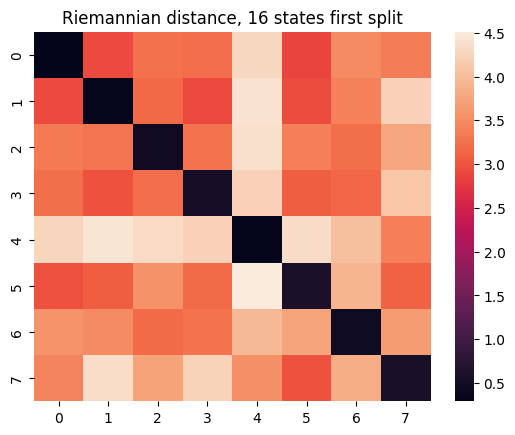

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 370.96it/s]


{'row': [0, 1, 2, 3, 4, 5, 6, 7], 'col': [4, 5, 8, 13, 10, 11, 6, 1]}


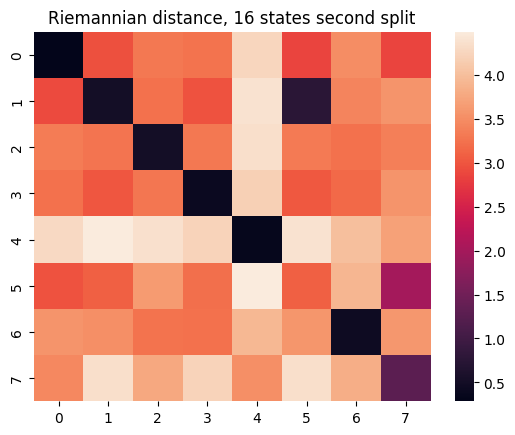

Computing Riemannian distances: 100%|██████████| 16/16 [00:00<00:00, 316.14it/s]


index_fit_2_first_second: {'row': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15], 'col': [1, 0, 7, 3, 14, 2, 9, 4, 5, 10, 6, 13, 15, 8, 11, 12]}


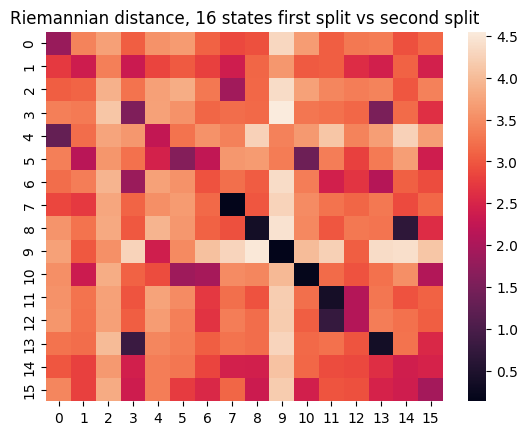

In [18]:
covariances_fit_2_first_half = np.load(f'{save_dir_2}split_1_first_half/state_covariances.npy')
covariances_fit_2_second_half = np.load(f'{save_dir_2}split_1_second_half/state_covariances.npy')

riem_fit_2_first = twopair_riemannian_distance(covariances_truth, covariances_fit_2_first_half)
print(f'riem_fit_2_first shape: {riem_fit_2_first.shape}')
index_fit_2_first, riem_fit_2_first_reorder = hungarian_pair(riem_fit_2_first,distance=True)
print(f'index fit_2_first: {index_fit_2_first}')
print(f'riem_fit_2_first_reorder_shape: {riem_fit_2_first_reorder.shape}')
seaborn.heatmap(riem_fit_2_first_reorder)
plt.title('Riemannian distance, 16 states first split')
plt.show()

riem_fit_2_second = twopair_riemannian_distance(covariances_truth, covariances_fit_2_second_half)
index_fit_2_second, riem_fit_2_second_reorder = hungarian_pair(riem_fit_2_second,distance=True)
print(index_fit_2_second)
seaborn.heatmap(riem_fit_2_second_reorder)
plt.title('Riemannian distance, 16 states second split')
plt.show()

riem_fit_2_first_second = twopair_riemannian_distance(covariances_fit_2_first_half, covariances_fit_2_second_half)
index_fit_2_first_second, riem_fit_2_first_second_reorder = hungarian_pair(riem_fit_2_first_second,distance=True)
print(f'index_fit_2_first_second: {index_fit_2_first_second}')
seaborn.heatmap(riem_fit_2_first_second_reorder)
plt.title('Riemannian distance, 16 states first split vs second split')
plt.show()

Conclusion: When n_state = 16. It seems that these the original 8 states are recovered very successfully.
OK, please take a note on the state indexes:
HMM_ICA_25_state_16: first split (7,8,13,11,9,0,10,4)
HMM_ICA_25_state_16: second split (4,5,8,13,10,11,6,1)

Question 2: temporal dynamics on these states?
Hypothesis: only the states "matched" well with ground truth should be activated.

In [20]:
fo_fit_2_first_half = np.load(f'{save_dir_2}split_1_first_half/fo.npy')
fo_fit_2_second_half = np.load(f'{save_dir_2}split_1_second_half/fo.npy')

In [23]:
np.mean(fo_fit_2_first_half,axis=0)

array([0.11555   , 0.00206667, 0.0066    , 0.0091    , 0.11955   ,
       0.00991667, 0.00348333, 0.17053333, 0.1189    , 0.12525   ,
       0.11045   , 0.07183333, 0.03326667, 0.10001667, 0.0017    ,
       0.00178333])

In [26]:
np.set_printoptions(suppress=True,precision=3)
np.mean(fo_fit_2_second_half,axis=0)

array([0.001, 0.245, 0.001, 0.011, 0.18 , 0.076, 0.132, 0.   , 0.1  ,
       0.   , 0.089, 0.022, 0.   , 0.139, 0.003, 0.   ])

Conclusion: states not paired well are not utilised. But please note that they contribute to the overall calculation of free energy even if they are not used.

Question -1: How do we implement cross-validation?
We can "pair" these states and pretend that our paired states are the same!

In [31]:
import pathlib
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn
from rotation.preprocessing import PrepareData
from osl_dynamics.models import load

2023-12-13 15:41:03.150356: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-12-13 15:41:04.347466: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2023-12-13 15:41:04.347495: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


In [30]:
data_dir = pathlib.Path('./data/node_timeseries/simulation_toy_6/')
prepare_data = PrepareData(data_dir)
subj, dataset_1, dataset_2 = prepare_data.load(z_score_data=False,split_strategy='1')

Read from directory:  data/node_timeseries/simulation_toy_6
Number of subjects:  1


Loading files: 100%|█████████████████████████| 50/50 [00:00<00:00, 14672.58it/s]


In [33]:
model_1_first_half = load(f'{save_dir_1}split_1_first_half/')
model_1_second_half = load(f'{save_dir_1}split_1_second_half/')

2023-12-13 15:44:15 INFO osl-dynamics [mod_base.py:607:load]: Loading model: ./results_simulation_202311_toy_6/HMM_ICA_25_state_8/split_1_first_half/
2023-12-13 15:44:17.886558: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory
2023-12-13 15:44:17.886614: W tensorflow/stream_executor/cuda/cuda_driver.cc:269] failed call to cuInit: UNKNOWN ERROR (303)
2023-12-13 15:44:17.886637: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (win002.hpc.in.bmrc.ox.ac.uk): /proc/driver/nvidia/version does not exist
2023-12-13 15:44:17.975773: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in

In [36]:
np.sum(covariances_fit_1_first_half!=model_1_first_half.get_covariances())

0

In [37]:
print(index_fit_1_first_second)

{'row': [0, 1, 2, 3, 4, 5, 6, 7], 'col': [2, 5, 6, 0, 3, 4, 1, 7]}


In [41]:
covariances_fit_1_second_half_pair = covariances_fit_1_second_half[index_fit_1_first_second['col']]

In [43]:
print(model_1_first_half.free_energy(dataset_1))
print(model_1_first_half.free_energy(dataset_1,covariances=covariances_fit_1_second_half_pair))

2023-12-13 15:55:30 INFO osl-dynamics [hmm.py:1109:free_energy]: Getting free energy
2023-12-13 15:55:34 INFO numba.core.transforms [transforms.py:58:_extract_loop_lifting_candidates]: finding looplift candidates
2023-12-13 15:55:38 INFO osl-dynamics [hmm.py:1109:free_energy]: Getting free energy


18470.062918814518
18532.93638736665


Maybe work on the model with more number of states?

In [44]:
model_2_first_half = load(f'{save_dir_2}split_1_first_half/')
model_2_second_half = load(f'{save_dir_2}split_1_second_half/')
covariances_fit_2_second_half_pair = covariances_fit_2_second_half[index_fit_2_first_second['col']]
print(model_2_first_half.free_energy(dataset_1))
print(model_2_first_half.free_energy(dataset_1,covariances=covariances_fit_2_second_half_pair))

2023-12-13 15:58:04 INFO osl-dynamics [mod_base.py:607:load]: Loading model: ./results_simulation_202311_toy_6/HMM_ICA_25_state_16/split_1_first_half/
2023-12-13 15:58:05 INFO osl-dynamics [mod_base.py:607:load]: Loading model: ./results_simulation_202311_toy_6/HMM_ICA_25_state_16/split_1_second_half/
2023-12-13 15:58:06 INFO osl-dynamics [hmm.py:1109:free_energy]: Getting free energy
2023-12-13 15:58:09 INFO osl-dynamics [hmm.py:1109:free_energy]: Getting free energy


18389.61165836891
18594.25057721719


In [50]:
save_dir_3 = './results_simulation_202311_toy_6/HMM_ICA_25_state_14/'
model_3_first_half = load(f'{save_dir_3}split_1_first_half/')
model_3_second_half = load(f'{save_dir_3}split_1_second_half/')
covariances_fit_3_first_half = np.load(f'{save_dir_3}split_1_first_half/state_covariances.npy')
covariances_fit_3_second_half = np.load(f'{save_dir_3}split_1_second_half/state_covariances.npy')
riem_fit_3_first_second = twopair_riemannian_distance(covariances_fit_3_first_half, covariances_fit_3_second_half)
index_fit_3_first_second, riem_fit_3_first_second_reorder = hungarian_pair(riem_fit_3_first_second,distance=True)


covariances_fit_3_second_half_pair = covariances_fit_3_second_half[index_fit_3_first_second['col']]
print(model_3_first_half.free_energy(dataset_1))
print(model_3_first_half.free_energy(dataset_1,covariances=covariances_fit_3_second_half_pair))

2023-12-13 16:31:11 INFO osl-dynamics [mod_base.py:607:load]: Loading model: ./results_simulation_202311_toy_6/HMM_ICA_25_state_14/split_1_first_half/
2023-12-13 16:31:12 INFO osl-dynamics [mod_base.py:607:load]: Loading model: ./results_simulation_202311_toy_6/HMM_ICA_25_state_14/split_1_second_half/
Computing Riemannian distances: 100%|██████████| 14/14 [00:00<00:00, 461.67it/s]
2023-12-13 16:31:13 INFO osl-dynamics [hmm.py:1109:free_energy]: Getting free energy
2023-12-13 16:31:16 INFO osl-dynamics [hmm.py:1109:free_energy]: Getting free energy


18391.97746429379
18453.210000027982


### Update 14th Dec 2023

### Task: visualisation of spatial maps (Using CIFTI data)

First of all, have a try on Chet's code.

In [70]:
!mkdir visualisation

In [79]:
!pip install osfclient

^C
ERROR: Operation cancelled by user


In [75]:
import os
from osl_dynamics.analysis import power, workbench

In [76]:
def get_data(name, output_dir):
    if os.path.exists(output_dir):
        print(f"{output_dir} already downloaded. Skipping..")
        return
    os.system(f"osf -p by2tc fetch trained_models/{name}.zip")
    os.system(f"unzip -o {name}.zip -d {output_dir}")
    os.remove(f"{name}.zip")
    print(f"Data downloaded to: {output_dir}")

In [78]:
get_data("ae-hmm_notts_rest_55_subj", output_dir='visualisation/MEG')

sh: osf: command not found
unzip:  cannot find or open ae-hmm_notts_rest_55_subj.zip, ae-hmm_notts_rest_55_subj.zip.zip or ae-hmm_notts_rest_55_subj.zip.ZIP.


FileNotFoundError: [Errno 2] No such file or directory: 'ae-hmm_notts_rest_55_subj.zip'

### Update 18th Dec 2023

In this part, we try direct rendering of volume-based results.

In [8]:
!module load ConnectomeWorkbench

In [1]:
import os
from osl_dynamics.analysis.workbench import render


/well/win-fmrib-analysis/users/uap971/conda/skylake/envs/osld/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [9]:
print(os.environ["PATH"])

/apps/eb/2020b/skylake/software/Anaconda3/2022.05:/apps/eb/2020b/skylake/software/Anaconda3/2022.05/sbin:/well/win-fmrib-analysis/users/uap971/conda/skylake/envs/osld/bin:/well/win/software/packages/fsl/5.0.11/bin:/mgmt/uge/8.6.8/bin/lx-amd64:/opt/TurboVNC/bin:/apps/eb/2020b/skylake/software/Anaconda3/2022.05/condabin:/mgmt/uge/8.6.8/bin/lx-amd64:/usr/local/bin:/bin:/usr/bin:/usr/local/sbin:/usr/sbin:/usr/lpp/mmfs/bin:/opt/ibutils/bin:/users/win-fmrib-analysis/uap971/.local/bin:/users/win-fmrib-analysis/uap971/bin:/usr/lpp/mmfs/bin:/users/win-fmrib-analysis/uap971/.local/bin:/users/win-fmrib-analysis/uap971/bin


In [10]:
import subprocess
process = subprocess.Popen("module load ConnectomeWorkbench", shell=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE)

In [11]:
print(os.environ["PATH"])

/apps/eb/2020b/skylake/software/Anaconda3/2022.05:/apps/eb/2020b/skylake/software/Anaconda3/2022.05/sbin:/well/win-fmrib-analysis/users/uap971/conda/skylake/envs/osld/bin:/well/win/software/packages/fsl/5.0.11/bin:/mgmt/uge/8.6.8/bin/lx-amd64:/opt/TurboVNC/bin:/apps/eb/2020b/skylake/software/Anaconda3/2022.05/condabin:/mgmt/uge/8.6.8/bin/lx-amd64:/usr/local/bin:/bin:/usr/bin:/usr/local/sbin:/usr/sbin:/usr/lpp/mmfs/bin:/opt/ibutils/bin:/users/win-fmrib-analysis/uap971/.local/bin:/users/win-fmrib-analysis/uap971/bin:/usr/lpp/mmfs/bin:/users/win-fmrib-analysis/uap971/.local/bin:/users/win-fmrib-analysis/uap971/bin


In [3]:
nii = './results_HCP_202311_no_mean/HMM_ICA_25_state_8/FC_map.nii.gz'
save_dir = './visualisation_1/'
render(nii,save_dir,gui=False,inflation=0,image_name='./visualisation_1/mid_thickness')
render(nii,save_dir,gui=False,inflation=1,image_name='./visualisation_1/inflated')
render(nii,save_dir,gui=False,inflation=2,image_name='./visualisation_1/very_inflated')

Saving images: 100%|██████████████████████████████| 8/8 [00:09<00:00,  1.16s/it]


In [4]:
nii = './results_HCP_202311_no_mean/HMM_ICA_25_state_8/FC_surface_map.dscalar.nii'
save_dir = './visualisation_2/'
render(nii,save_dir,gui=False,inflation=0,image_name='./visualisation_2/mid_thickness',input_cifti=True)
render(nii,save_dir,gui=False,inflation=1,image_name='./visualisation_2/inflated',input_cifti=True)
render(nii,save_dir,gui=False,inflation=1,image_name='./visualisation_2/very_inflated',input_cifti=True)

Saving images: 100%|██████████████████████████████| 8/8 [00:09<00:00,  1.20s/it]


## Update 20th January 2024

This week we implement ten runs of ten subjects with different subject variability level $\sigma = \{0.025,0.05,0.075,0.1\}$. This would require a substantial amount of work! To start with, look at your data! i.e. do we have the expected subject variability level?

In [7]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn
%matplotlib inline
from rotation.utils import twopair_riemannian_distance

So first import the original unperturbed ground-truth Riemannian distance.

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 498.17it/s]


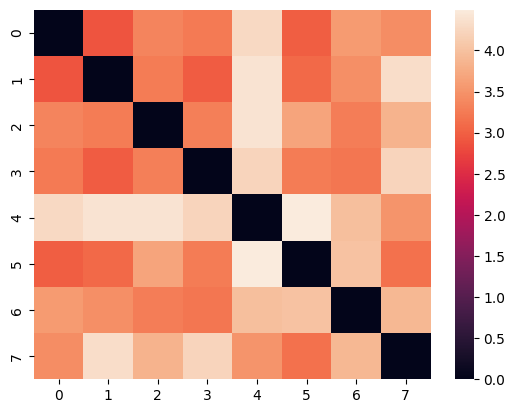

In [5]:
true_covariance = np.load('./results_HCP_202311_no_mean/HMM_ICA_25_state_8/state_covariances.npy')
seaborn.heatmap(twopair_riemannian_distance(true_covariance,true_covariance))
plt.show()

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 523.18it/s]


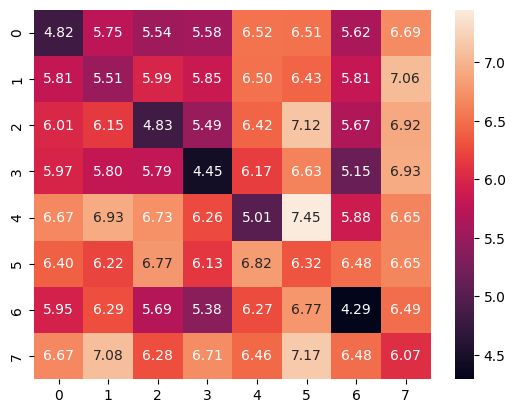

In [11]:
data_dir = './data/node_timeseries/simulation_202401/sigma_0.1/run_1/'
for i in range(10001,10002):
    for j in range(i+1,10003):
        covariance_1 = np.load(f'{data_dir}{i}_state_covariances.npy')
        covariance_2 = np.load(f'{data_dir}{j}_state_covariances.npy')
        riem = twopair_riemannian_distance(covariance_1,covariance_2)
        seaborn.heatmap(riem,annot=True,fmt='.2f')
        plt.show()

Now the second step is to see whether only run_1 works. So with run_1, have a look at the split-half reproducibility and goodness of fit. (Just to run comparison analysis)

In [1]:
from rotation.analysis import comparison_analysis

/well/win-fmrib-analysis/users/uap971/conda/skylake/envs/osld/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [6]:
models =['HMM']
list_channels = [25,200,300]
list_states = [2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]
result_dir = './results_simulation_202401/sigma_0.05/run_4/'
save_dir = f'{result_dir}/plot/'
comparison_analysis(models,list_channels,list_states,result_dir, save_dir)

Now we write the code to average across five runs (also add error bars).

In [25]:
import json
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import os

save_dir = './results_simulation_202401/'
plot_dir = f'{save_dir}summary_plot/'
if not os.path.exists(plot_dir):
    os.makedirs(plot_dir)
    
list_states = [2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]
sigma = 0.1
split_half_correlation = {}
split_half_riem = {}
for state in list_states:
    split_half_correlation[f'state_{state}'] = []
    split_half_riem[f'state_{state}'] = []
    for i in range(1,6):
        correlation = np.load(f'{save_dir}sigma_{sigma}/run_{i}/HMM_ICA_25_state_{state}/reproduce_analysis/FCs_fisher_correlation_reorder_split_1.npy')
        riem = np.load(f'{save_dir}sigma_{sigma}/run_{i}/HMM_ICA_25_state_{state}/reproduce_analysis/FCs_distance_reorder_split_1.npy')
        split_half_correlation[f'state_{state}'].append(np.mean(np.diagonal(correlation)))
        split_half_riem[f'state_{state}'].append(np.mean(np.diagonal(riem)))

plt.figure(figsize=(10, 6))

bar_width = 0.15
colors = plt.cm.viridis(np.linspace(0, 1, len(list_states)))

means = [np.mean(split_half_correlation[f'state_{state}']) for state in range(2, 17)]
stds = [np.std(split_half_correlation[f'state_{state}']) for state in range(2, 17)]
plt.bar(list_states, means, yerr=stds, capsize=5, align='center', alpha=0.7)
plt.xticks(list_states,fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('Number of states',fontsize=20)
plt.ylabel('Mean Split-Half Correlation',fontsize=20)
plt.title(f'Split-half correlation,sigma_{sigma}',fontsize=25)
plt.tight_layout()
plt.savefig(f'{plot_dir}/sigma_{sigma}_Fisher_z_transformed_correlation_average.jpg')
plt.savefig(f'{plot_dir}/sigma_{sigma}_Fisher_z_transformed_correlation_average.pdf')
plt.close()

plt.figure(figsize=(10, 6))
bar_width = 0.15
colors = plt.cm.viridis(np.linspace(0, 1, len(list_states)))

means = [np.mean(split_half_riem[f'state_{state}']) for state in range(2, 17)]
stds = [np.std(split_half_riem[f'state_{state}']) for state in range(2, 17)]
plt.bar(list_states, means, yerr=stds, capsize=5, align='center', alpha=0.7)
plt.xticks(list_states,fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('Number of states',fontsize=20)
plt.ylabel('Mean Split-Half Riemannian distance',fontsize=20)
plt.title(f'Split-half Riemannian_distance,sigma_{sigma}',fontsize=25)
plt.tight_layout()
plt.savefig(f'{plot_dir}/sigma_{sigma}_Riemannian_distance_average.jpg')
plt.savefig(f'{plot_dir}/sigma_{sigma}_Riemannian_distance_average.pdf')
plt.close()

#plt.title(f'Comparison of {metric_name} by N_channels and N_states', fontsize=20)
#plt.xticks(np.arange(len(channel_keys)) + bar_width * (len(list_states) - 1) / 2,
#            [str(N_channels) for N_channels in list_channels], fontsize=15)
#plt.yticks(fontsize=15)
#plt.legend(prop={'size': 15})

#plt.savefig(f'{save_dir}{model_name}_{metric_name}_comparison.jpg')
#plt.savefig(f'{save_dir}{model_name}_{metric_name}_comparison.pdf')
#plt.close()

# Look at your data!

So first look at these states obtained from split_1 and split_2, and then compare against the ground truth. We start from sigma=0.025, and run_1. We should expect only 8 states.

In [11]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn
%matplotlib inline
from rotation.utils import *

In [12]:
ground_truth_dir = './results_HCP_202311_no_mean/HMM_ICA_25_state_8/'
ground_truth_FC = np.load(f'{ground_truth_dir}state_correlations.npy')

In [13]:
ground_truth_FC.shape

(8, 25, 25)

In [38]:
fit_dir = './results_simulation_202401/sigma_0.025/run_1/'
N_states = [2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]
fit_FC = np.load(f'{fit_dir}HMM_ICA_25_state_{N_states[1]}/state_correlations.npy')

In [39]:
print(fit_FC.shape)

(3, 25, 25)


In [40]:
fit_FC_first = np.load(f'{fit_dir}HMM_ICA_25_state_{N_states[1]}/split_1_first_half/state_correlations.npy')
fit_FC_second = np.load(f'{fit_dir}HMM_ICA_25_state_{N_states[1]}/split_1_second_half/state_correlations.npy')

Compute twopair Fisher-z transformated correlation: 100%|█| 3/3 [00:00<00:00, 11


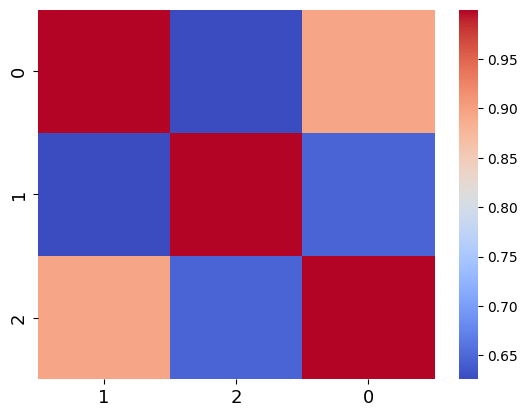

[0.99998476 0.99999353 0.99998682]


In [41]:
# Fisher-z transformated correlation
fit_FC_first_second = twopair_fisher_z_transformed_correlation(fit_FC_first,fit_FC_second)
FC_first_second_indices, fit_FC_first_second_reordered = hungarian_pair(fit_FC_first_second)
seaborn.heatmap(fit_FC_first_second_reordered, cmap="coolwarm")
plt.xticks(np.arange(len(FC_first_second_indices['col'])) + 0.5, FC_first_second_indices['col'], fontsize=13)
plt.yticks(np.arange(len(FC_first_second_indices['row'])) + 0.5, FC_first_second_indices['row'], fontsize=13)
plt.show()
print(np.diagonal(fit_FC_first_second_reordered))

Compute twopair Fisher-z transformated correlation: 100%|█| 8/8 [00:00<00:00, 47
Compute twopair Fisher-z transformated correlation: 100%|█| 8/8 [00:00<00:00, 29


[2 7 1 6 4 5 3 0]


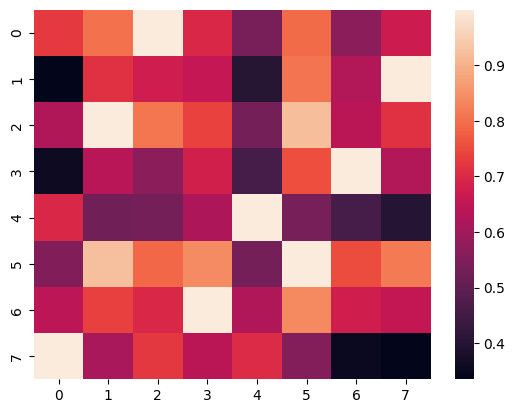

In [15]:
seaborn.heatmap(twopair_fisher_z_transformed_correlation(ground_truth_FC,fit_FC_second))
print(np.argmax(twopair_fisher_z_transformed_correlation(ground_truth_FC,fit_FC_second),axis=1))

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 698.58it/s]


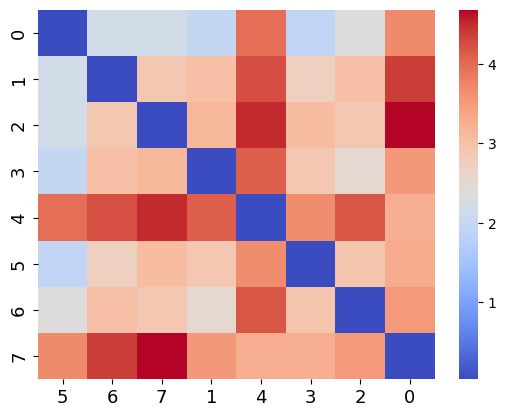

0.03947350199527376


In [16]:
# Riemannian distance
fit_riem_first_second = twopair_riemannian_distance(fit_FC_first,fit_FC_second)
riem_first_second_indices, fit_riem_first_second_reordered = hungarian_pair(fit_riem_first_second,distance=True)
seaborn.heatmap(fit_riem_first_second_reordered, cmap="coolwarm")
plt.xticks(np.arange(len(riem_first_second_indices['col'])) + 0.5, riem_first_second_indices['col'], fontsize=13)
plt.yticks(np.arange(len(riem_first_second_indices['row'])) + 0.5, riem_first_second_indices['row'], fontsize=13)
plt.show()
print(np.mean(np.diagonal(fit_riem_first_second_reordered)))

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 746.90it/s]


[2 7 1 6 4 5 3 0]


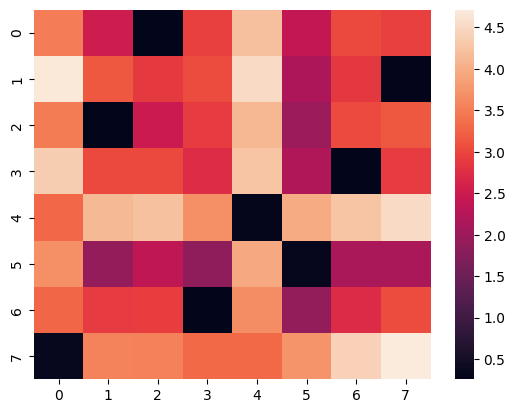

In [17]:
seaborn.heatmap(twopair_riemannian_distance(ground_truth_FC,fit_FC_second))
print(np.argmin(twopair_riemannian_distance(ground_truth_FC,fit_FC_second),axis=1))

The take-home message: there are actually 7/16 states fitted well when N_state = 16, and 8/8 states fitted well when N_state = 8. These states (7/16 and 8/8) correspond well with the ground truth. Now maybe look at the fractional occupancy?

In [62]:
fo = np.load(f'{fit_dir}HMM_ICA_25_state_{N_states[-1]}/fo.npy')
import pickle
with open(f'{fit_dir}HMM_ICA_25_state_{N_states[-1]}/alpha.pkl','rb') as file:
    alpha = pickle.load(file)

In [63]:
print(len(alpha))
print(len(fo))

1000
1000


Now answer: What's happending when the subject variability level is higher?
Short Answer: The optimal number of states still occur. But what happens to real data?


In [5]:
models =['HMM']
list_channels = [25,200,300]
list_states = [2,3,4,5,6,7,8,9,10,11,12,13,14]#,15,16,17,18,19,20]
result_dir = './results_HCP_202401/'
save_dir = f'{result_dir}/plot/'
comparison_analysis(models,list_channels,list_states,result_dir, save_dir)

FileNotFoundError: [Errno 2] No such file or directory: './results_HCP_202401/HMM_ICA_25_state_4/metrics_repeat.json'

In [6]:
from rotation.utils import *

In [8]:
models = ['HMM','Dynemo','MAGE','SWC']
list_channels = [15, 25, 50, 100, 200, 300]
list_states = [2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]
index = 16
model,n_channels, n_states = parse_index(index,models,list_channels,list_states,training=True)

In [10]:
n_channels

25

### Now let's look at the temporal dynamics of our data

In [42]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn

## Update 31th January 2024

### Task 1: Understand the best training configurations of HMM model on real HCP data

Just check the loss function to see whether it converges.

In [27]:
import os
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [36]:
save_dir = './results_training_config_202402/'
sequence_lengths = [600,400,200,100,50,25]
batch_sizes = [1024,512,256,128,64,32]
learning_rates = [0.0005,0.001,0.005,0.01]

In [37]:
# Create a directory to save the plots
plot_dir = f'{save_dir}/loss_plots/'
os.makedirs(plot_dir, exist_ok=True)

for sl in sequence_lengths:
    n_cols = 2
    n_rows = (len(learning_rates) // n_cols)  # Ceiling division to get the number of rows
    
    plt.figure(figsize=(15, 6 * n_rows))

    for i, lr in enumerate(learning_rates, start=1):
        plt.subplot(n_rows, n_cols, i)
        
        # Iterate over each combination of batch size
        for bs in batch_sizes:
            # Skip the case where sequence_length=25 and batch_size=32
            if sl == 25 and bs == 32:
                continue
            
            # Load the loss history
            file_path = f'{save_dir}sl_{sl}_bs_{bs}_lr_{lr}/loss_history.npy'
            if os.path.exists(file_path):
                loss_history = np.load(file_path)
                epochs = np.arange(1, len(loss_history) + 1)

                # Plot the loss history
                plt.plot(epochs, loss_history, label=f'BS={bs}')

        # Customize subplot
        plt.title(f'Loss History for SL={sl}, LR={lr}')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
    
    # Adjust layout
    plt.tight_layout()

    # Save the plot
    plt.savefig(f'{plot_dir}loss_plots_sl_{sl}.jpg')
    plt.close()


Now choose the best ten training configurations.

In [41]:
results = []

# Iterate over each configuration
for sl in sequence_lengths:
    for lr in learning_rates:
        for bs in batch_sizes:
            
            # Load the loss history if available
            file_path = f'{save_dir}sl_{sl}_bs_{bs}_lr_{lr}/loss_history.npy'
            try:
                if os.path.exists(file_path):
                    loss_history = np.load(file_path)
                    normalized_loss = np.min(loss_history) / sl  # Normalize by sequence length

                    # Store the configuration and normalized loss
                    results.append({
                        'sequence_length': sl,
                        'batch_size': bs,
                        'learning_rate': lr,
                        'normalized_loss': normalized_loss
                    })
            except Exception as e:
                print(f"Error loading file {file_path}: {e}")
                continue

# Sort results by normalized loss in ascending order
results.sort(key=lambda x: x['normalized_loss'])

# Print the top 10 configurations
print("Top 10 Training Configurations:")
for i, result in enumerate(results[:10], start=1):
    print(f"{i}. Sequence Length: {result['sequence_length']}, Batch Size: {result['batch_size']}, "
          f"Learning Rate: {result['learning_rate']}, Normalized Loss: {result['normalized_loss']:.6f}")

Top 10 Training Configurations:
1. Sequence Length: 400, Batch Size: 256, Learning Rate: 0.001, Normalized Loss: 58.891545
2. Sequence Length: 400, Batch Size: 256, Learning Rate: 0.01, Normalized Loss: 58.901418
3. Sequence Length: 100, Batch Size: 1024, Learning Rate: 0.001, Normalized Loss: 58.911931
4. Sequence Length: 200, Batch Size: 512, Learning Rate: 0.005, Normalized Loss: 58.911981
5. Sequence Length: 100, Batch Size: 1024, Learning Rate: 0.0005, Normalized Loss: 58.912000
6. Sequence Length: 400, Batch Size: 256, Learning Rate: 0.005, Normalized Loss: 58.912208
7. Sequence Length: 200, Batch Size: 512, Learning Rate: 0.01, Normalized Loss: 58.914890
8. Sequence Length: 400, Batch Size: 128, Learning Rate: 0.0005, Normalized Loss: 58.918577
9. Sequence Length: 400, Batch Size: 128, Learning Rate: 0.001, Normalized Loss: 58.927658
10. Sequence Length: 100, Batch Size: 512, Learning Rate: 0.001, Normalized Loss: 58.928611


In [43]:
import pickle

# Save the results to a file
with open(f'{plot_dir}loss_comparison.pkl', 'wb') as f:
    pickle.dump(results, f)

We do not need complicated post analysis in this case. But please just extract the state correlations, covariances, etc

In [44]:
from osl_dynamics.models import load
from rotation.

2024-02-01 14:48:09.346043: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-02-01 14:48:10.412825: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /apps/eb/2020b/skylake/software/Qt5/5.15.2-GCCcore-10.3.0/lib:/apps/eb/2020b/skylake/software/JasPer/2.0.28-GCCcore-10.3.0/lib:/apps/eb/2020b/skylake/software/snappy/1.1.8-GCCcore-10.3.0/lib:/apps/eb/2020b/skylake/software/NSS/3.65-GCCcore-10.3.0/lib:/apps/eb/2020b/skylake/software/NSPR/4.30-GCCcore-10.3.0/lib:/apps/eb/2020b/skylake/software/libjpeg-turbo/2.0.6-GCCcore-10.3.0/lib:/apps/eb/2020b/skylake/software/libGLU/9.0.1-GCCcore-10.3.0/lib:/apps/eb/20

In [45]:
save_dir = './results_training_config_202402/'
sequence_lengths = [400,400,400,400,200,200,200,200,100,100,100,100]
batch_sizes = [256,256,256,256,512,512,512,512,1024,1024,1024,1024]
learning_rates = [0.0005,0.001,0.005,0.01,0.0005,0.001,0.005,0.01,0.0005,0.001,0.005,0.01,0.0005,0.001,0.005,0.01]

In [ ]:
for sl in sequence_lengths:
    for bs in batch_sizes:
        for lr in learning_rates:
            model = load(f'{save_dir}sl_{sl}_bs_{bs}_lr_{lr}')
            means, covariances = model.get_means_covariances()
            

# Update 5th February 2024

This week we have received feedbacks from all supervisors. We are advised to run the simulation with 500 subjects (each with only one session), and conduct the split-half reproducibility analysis for five times (to estimate the average). Also, check the sigma = 0 case for free energy comparison.

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn

In [14]:
result_dir = './results_HCP_202402_single_session/'
N_states = list(range(2,37))
for N_state in N_states:
    for i in range(5):
        if not os.path.exists(f'{result_dir}/HMM_ICA_25_state_{N_state}/reproduce_analysis/FCs_distance_reorder_split_{i+1}.npy'):
            print(f'N_state={N_state},i={i}')

All necessary files seem to exist! So we can revise the code in comparison_analysis to cater to our needs!

In [15]:
from rotation.analysis import comparison_analysis
models = ['HMM']
list_channels = [25,200,300]
save_dir = f'{result_dir}/plot/'
comparison_analysis(models,list_channels,N_states,result_dir,save_dir)

FileNotFoundError: [Errno 2] No such file or directory: './results_HCP_202402_single_session/HMM_ICA_25_state_2/cross_validation_0/validation/metrics.json'

# Update 12th February 2024

Check the new covariance structure of simulated covariance matrices

In [18]:
import os
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn
from rotation.utils import twopair_riemannian_distance

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 267.67it/s]


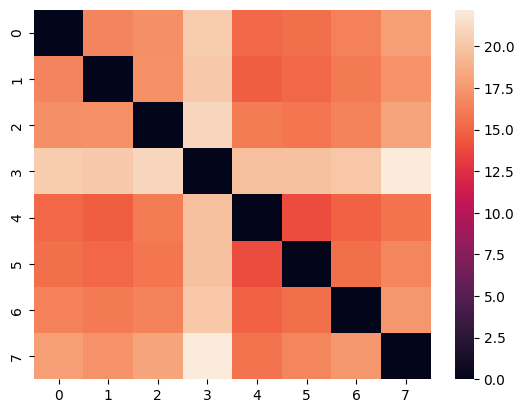

In [33]:
save_dir = './data/node_timeseries/simulation_202402_se/3_group/'
group_covariances = np.load(f'{save_dir}truth/group_state_covariances.npy')
seaborn.heatmap(twopair_riemannian_distance(group_covariances,group_covariances))
plt.show()

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 439.41it/s]


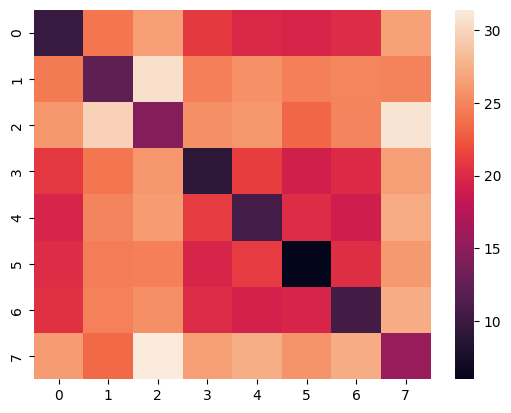

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 366.51it/s]


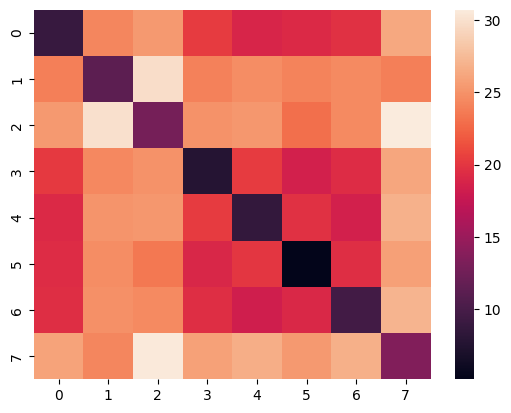

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 472.21it/s]


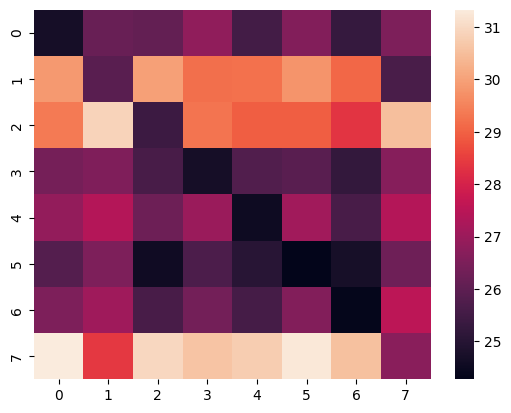

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 169.05it/s]


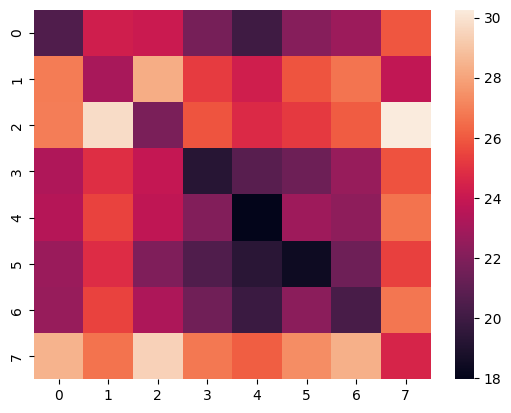

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 452.51it/s]


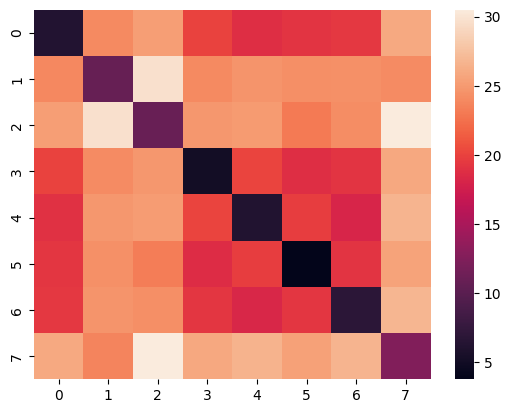

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 554.46it/s]


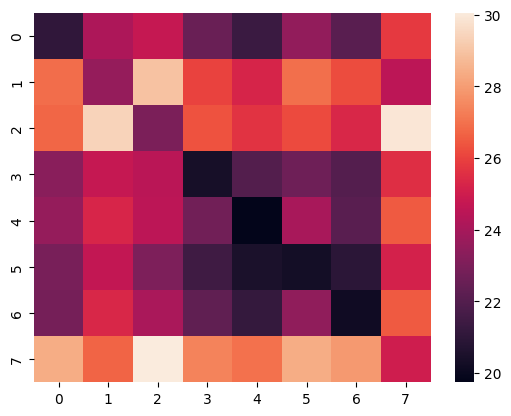

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 467.54it/s]


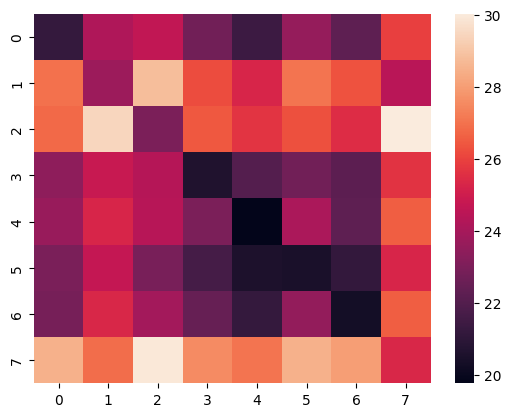

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 537.96it/s]


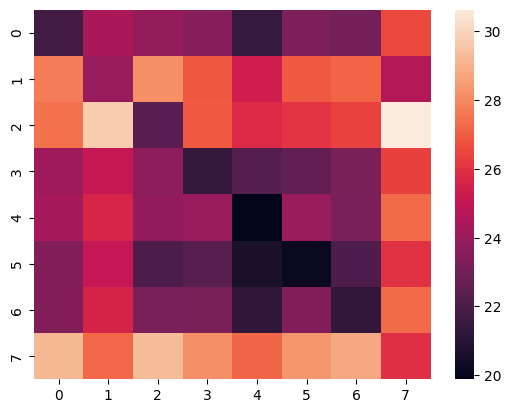

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 441.35it/s]


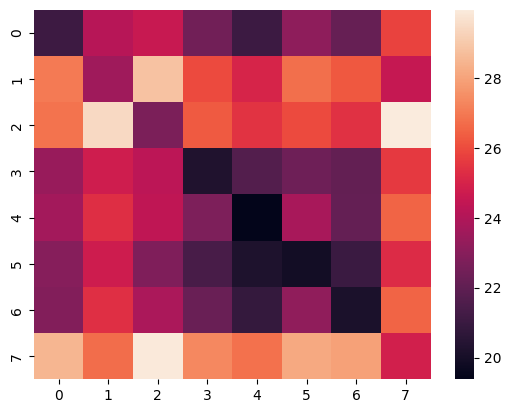

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 280.39it/s]


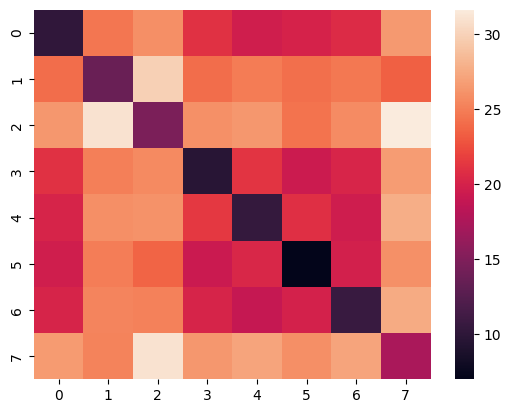

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 700.54it/s]


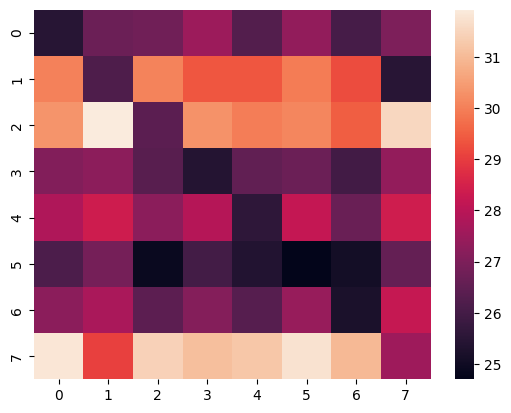

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 817.20it/s]


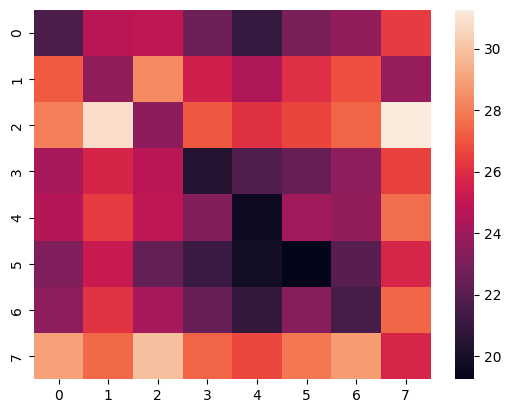

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 589.38it/s]


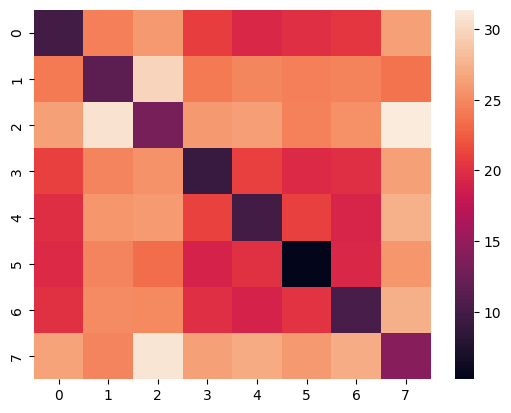

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 560.51it/s]


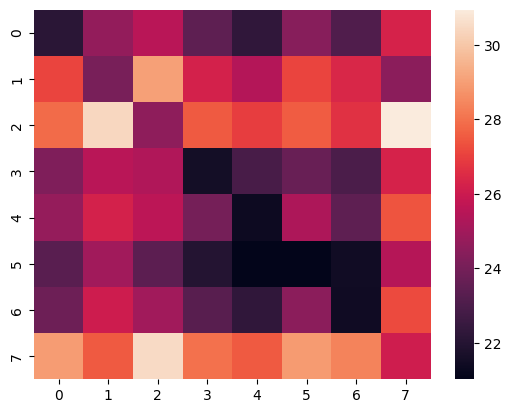

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 740.57it/s]


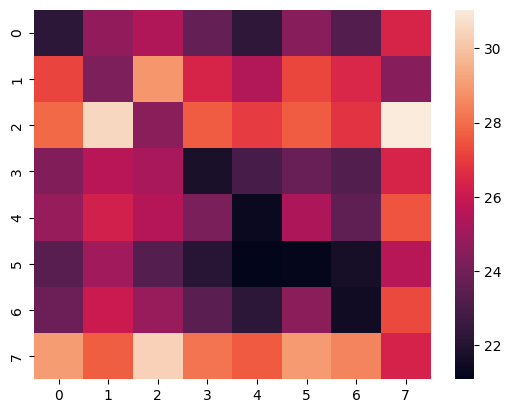

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 341.31it/s]


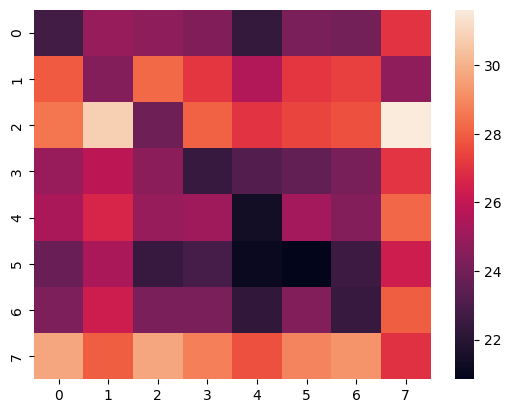

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 419.02it/s]


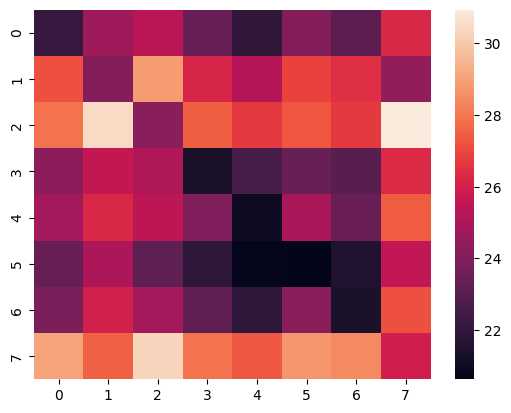

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 560.32it/s]


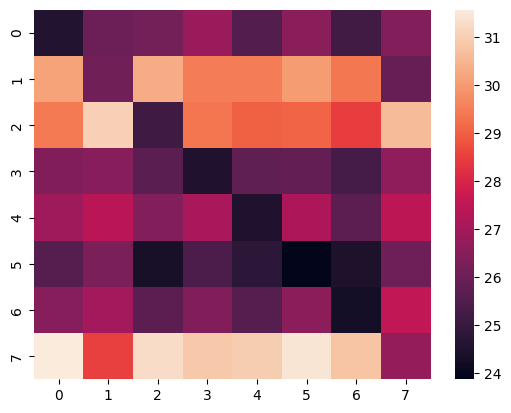

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 450.62it/s]


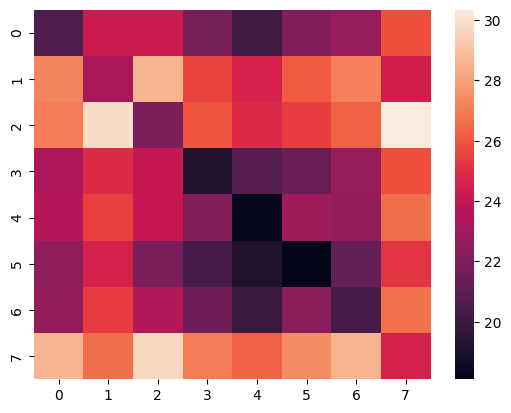

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 477.29it/s]


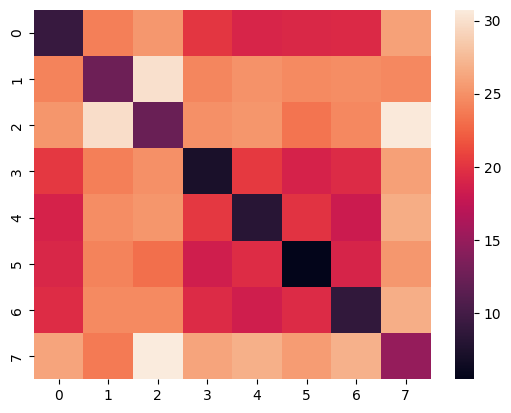

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 295.02it/s]


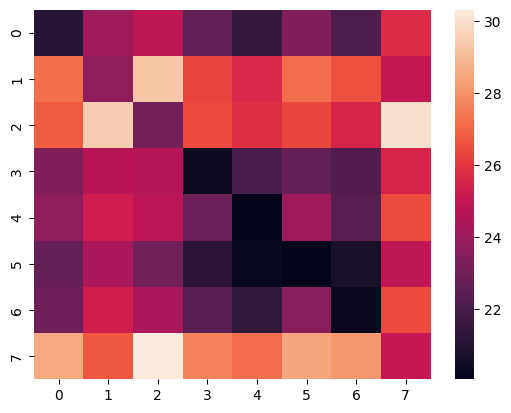

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 482.43it/s]


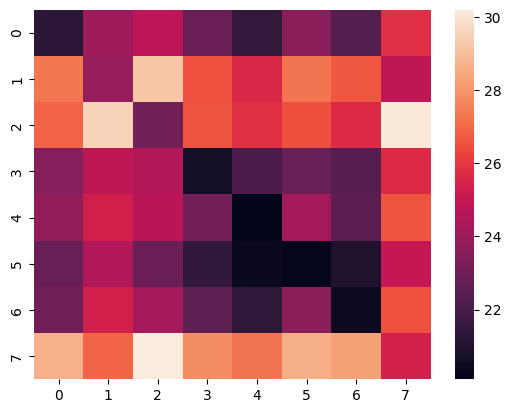

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 212.51it/s]


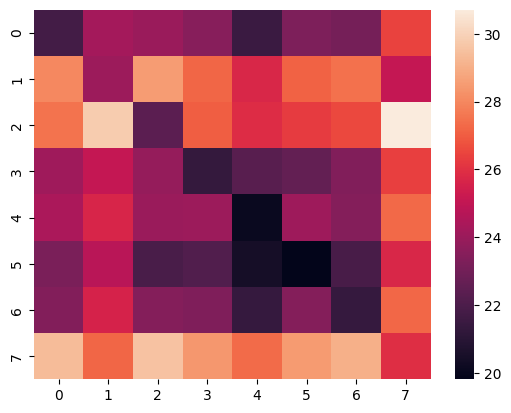

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 421.53it/s]


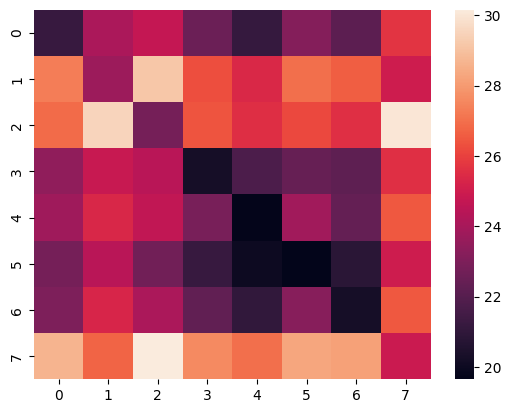

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 374.31it/s]


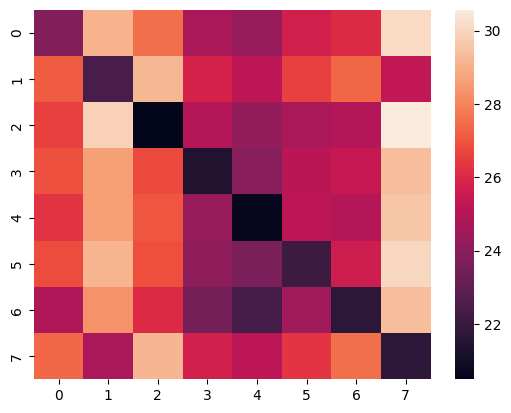

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 421.81it/s]


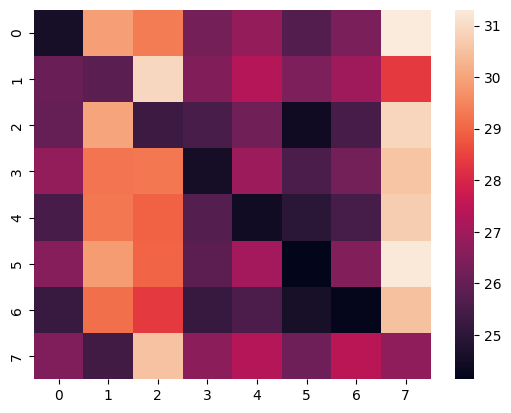

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 674.69it/s]


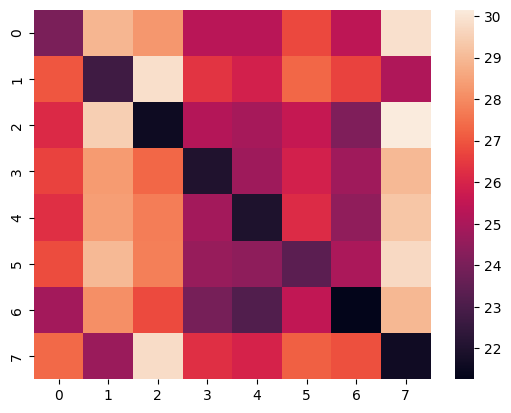

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 677.10it/s]


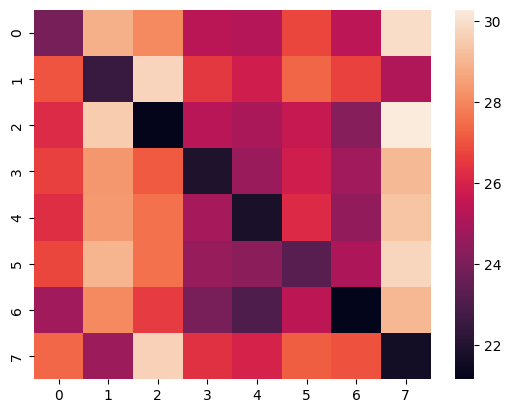

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 800.31it/s]


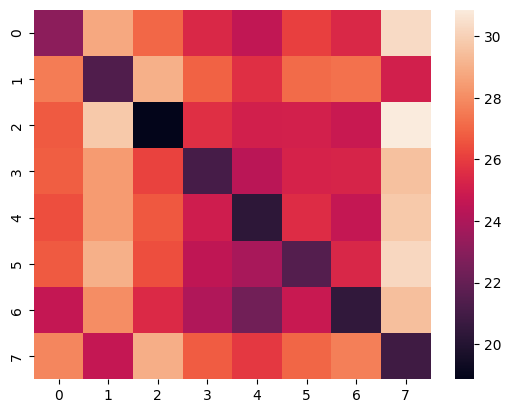

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 466.18it/s]


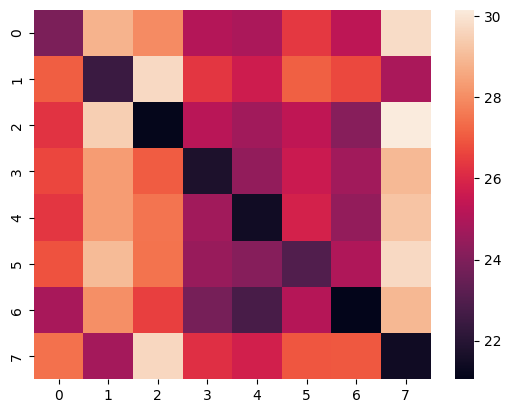

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 351.00it/s]


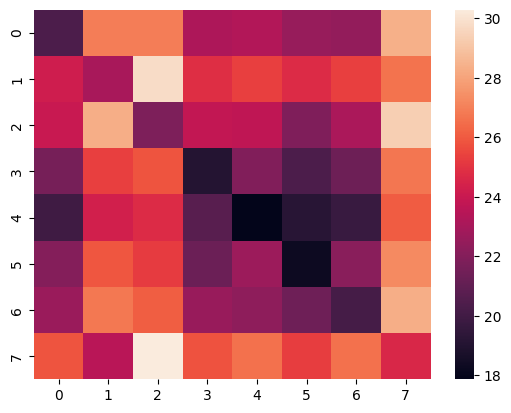

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 317.00it/s]


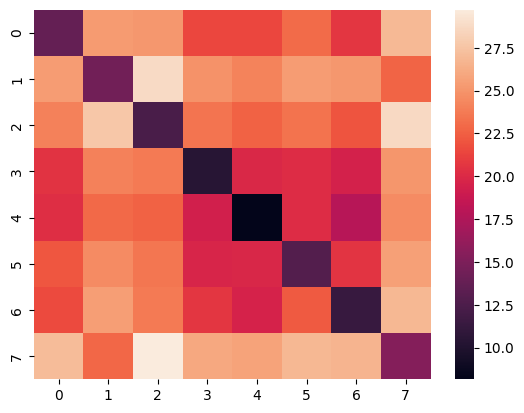

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 679.18it/s]


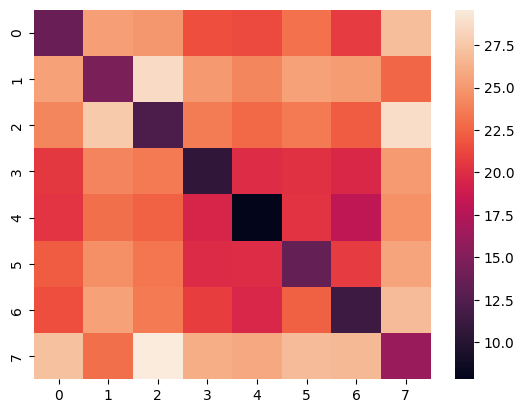

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 307.09it/s]


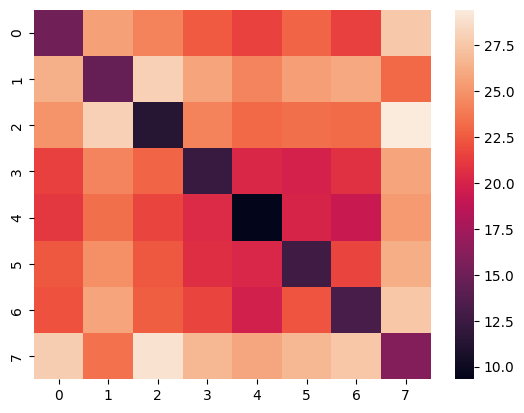

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 456.48it/s]


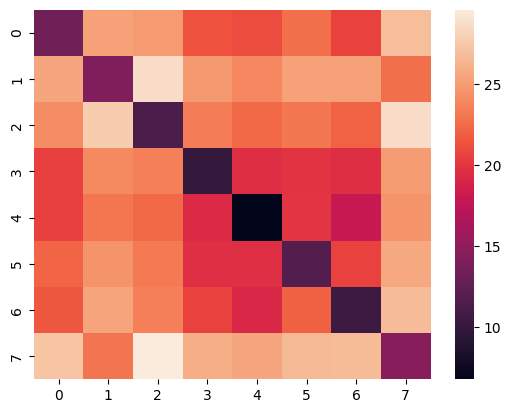

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 362.03it/s]


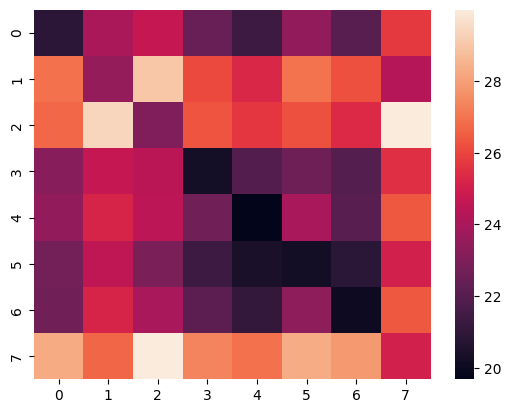

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 368.10it/s]


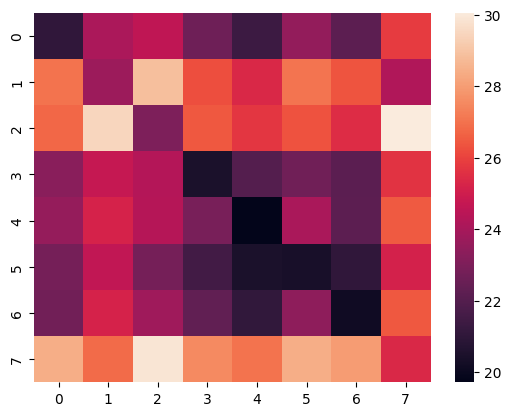

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 710.85it/s]


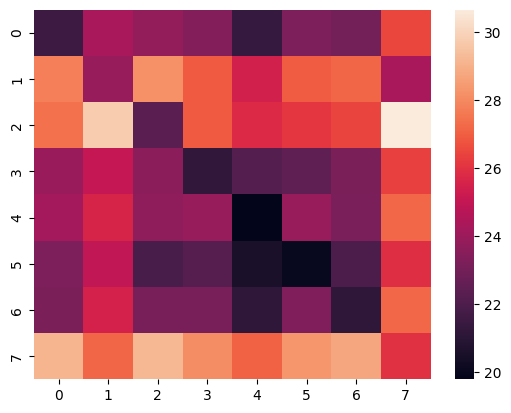

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 665.87it/s]


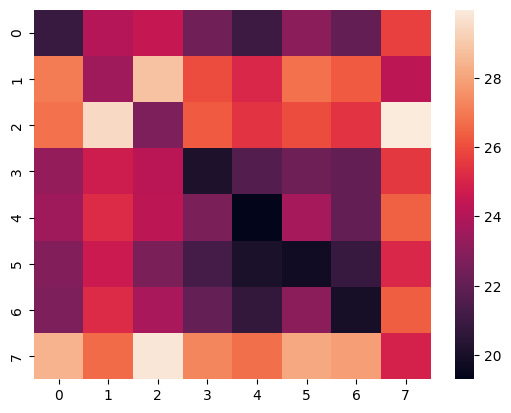

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 447.52it/s]


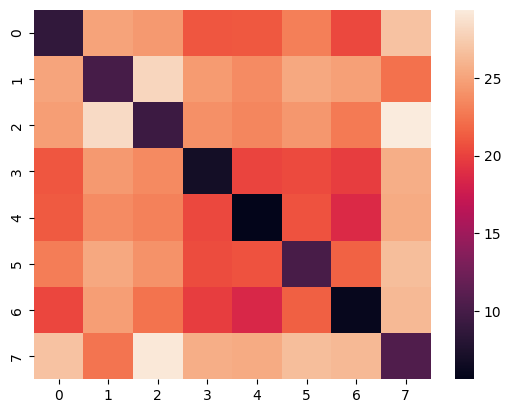

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 397.81it/s]


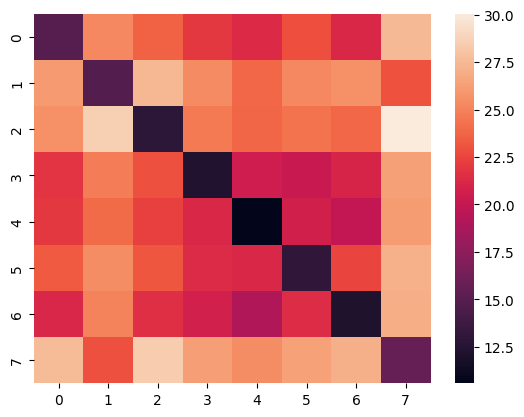

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 415.30it/s]


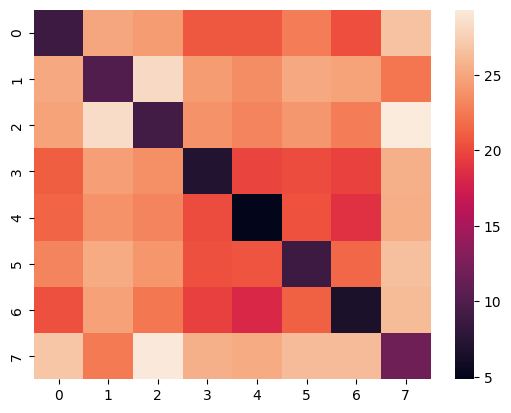

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 372.21it/s]


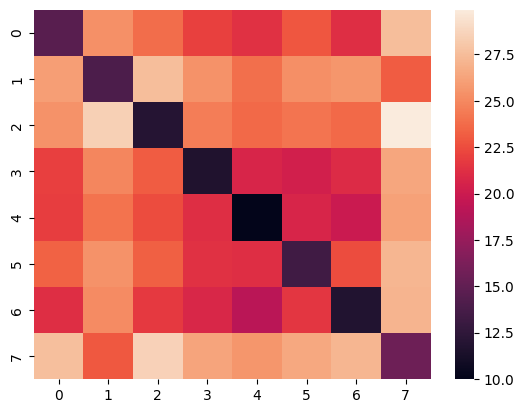

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 488.68it/s]


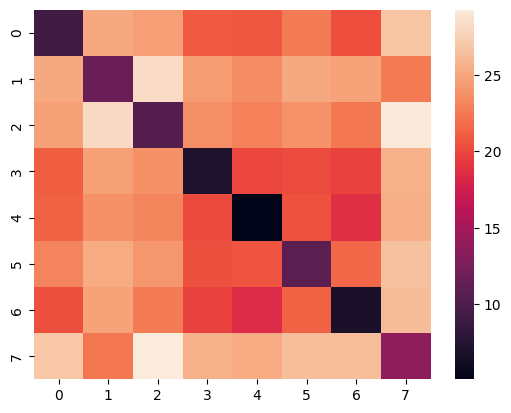

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 684.04it/s]


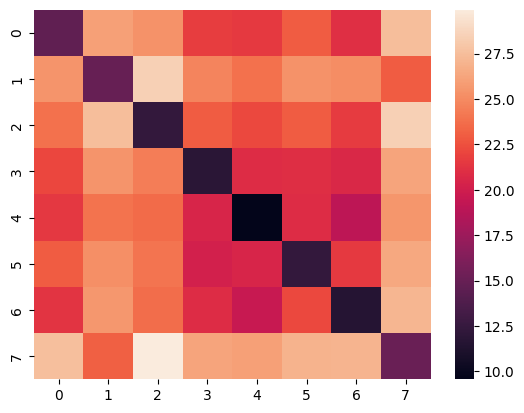

In [34]:
for i in range(10):
    for j in range(i+1,10):
        covariances_1 = np.load(f'{save_dir}truth/{10001+i}_state_covariances.npy')
        covariances_2 = np.load(f'{save_dir}truth/{10001+j}_state_covariances.npy')
        seaborn.heatmap(twopair_riemannian_distance(covariances_1,covariances_2))
        plt.show()

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 540.61it/s]


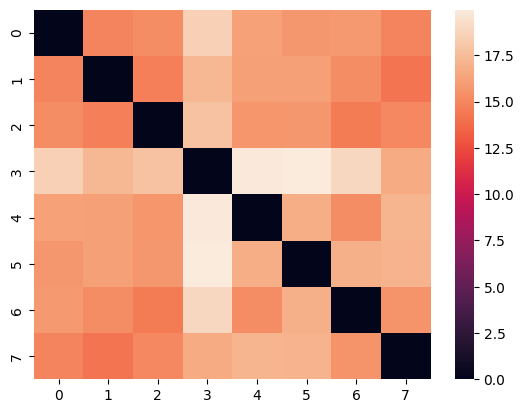

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 270.12it/s]


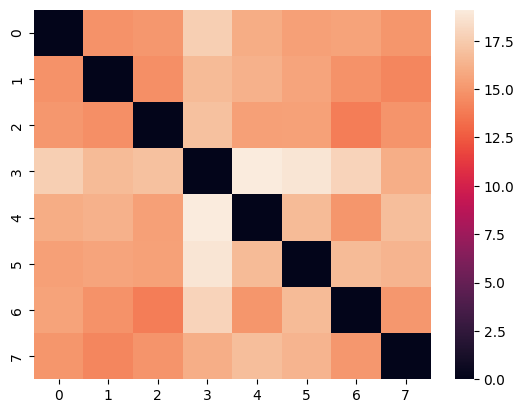

In [36]:
result_dir = './results_simulation_202402_se/small/HMM_ICA_25_state_8/'
state_covariances = np.load(f'{result_dir}state_covariances.npy')
state_correlations = np.load(f'{result_dir}state_correlations.npy')
seaborn.heatmap(twopair_riemannian_distance(state_covariances,state_covariances))
plt.show()
seaborn.heatmap(twopair_riemannian_distance(state_correlations,state_correlations))
plt.show()

In [1]:
from rotation.analysis import comparison_analysis

/well/win-fmrib-analysis/users/uap971/conda/skylake/envs/osld/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
models = ['HMM']
list_channels = [25,100,200]
list_states = list(range(2,36))
result_dir = './results_HCP_202402_single_session/'
save_dir = f'{result_dir}plot/'

comparison_analysis(models,list_channels,list_states,result_dir, save_dir)

## Update 13th February 2024

Plot the fisher-z transformed correlation between ground truth and states from the first-split and second split

In [5]:
import os
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn

In [10]:
ground_truth_dir = './results_HCP_202311_no_mean/HMM_ICA_25_state_8/'
first_half_dir = './results_simulation_202402/sigma_0/HMM_ICA_25_state_16/split_1/first_half/'
second_half_dir = './results_simulation_202402/sigma_0/HMM_ICA_25_state_16/split_1/second_half/'

In [11]:
FC_ground_truth = np.load(f'{ground_truth_dir}state_correlations.npy')
FC_first_half = np.load(f'{first_half_dir}state_correlations.npy')
FC_second_half = np.load(f'{second_half_dir}state_correlations.npy')

In [12]:
from rotation.utils import twopair_fisher_z_transformed_correlation

Compute twopair Fisher-z transformated correlation: 100%|█| 8/8 [00:00<00:00, 37


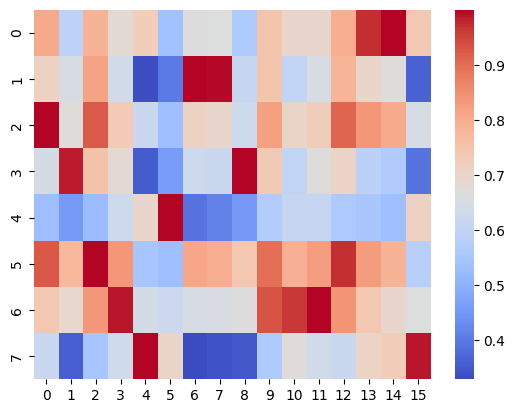

In [14]:
seaborn.heatmap(twopair_fisher_z_transformed_correlation(FC_ground_truth,FC_first_half),cmap="coolwarm")
plt.show()

Compute twopair Fisher-z transformated correlation: 100%|█| 16/16 [00:00<00:00, 


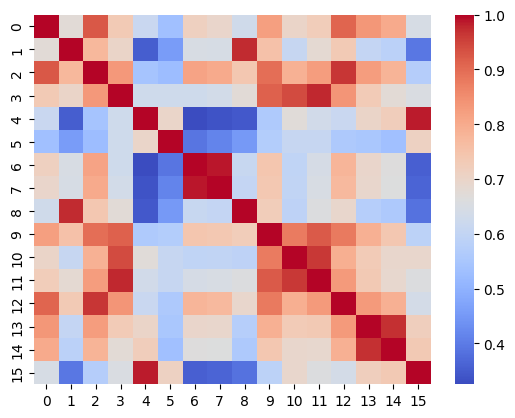

In [15]:
seaborn.heatmap(twopair_fisher_z_transformed_correlation(FC_first_half,FC_first_half),cmap="coolwarm")
plt.show()

Compute twopair Fisher-z transformated correlation: 100%|█| 8/8 [00:00<00:00, 38


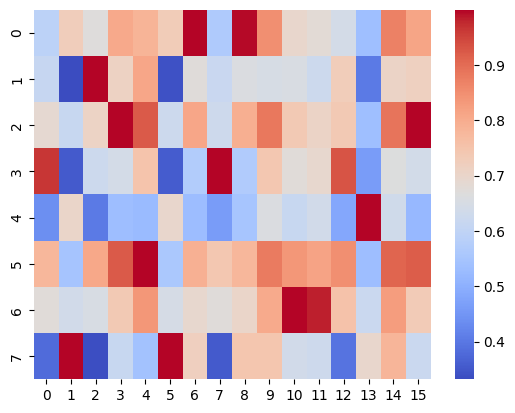

In [18]:
seaborn.heatmap(twopair_fisher_z_transformed_correlation(FC_ground_truth,FC_second_half),cmap="coolwarm")
plt.show()

Compute twopair Fisher-z transformated correlation: 100%|█| 16/16 [00:00<00:00, 


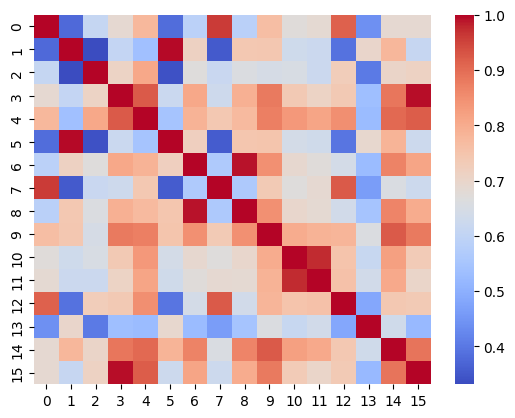

In [19]:
seaborn.heatmap(twopair_fisher_z_transformed_correlation(FC_second_half,FC_second_half),cmap="coolwarm")
plt.show()

In [21]:
first_half_HCP_dir = './results_HCP_202402_single_session/HMM_ICA_25_state_25/split_1/first_half/'
second_half_HCP_dir = './results_HCP_202402_single_session/HMM_ICA_25_state_25/split_1/second_half/'
FC_first_half_HCP = np.load(f'{first_half_HCP_dir}state_correlations.npy')
FC_second_half_HCP = np.load(f'{second_half_HCP_dir}state_correlations.npy')

Compute twopair Fisher-z transformated correlation: 100%|█| 25/25 [00:00<00:00, 


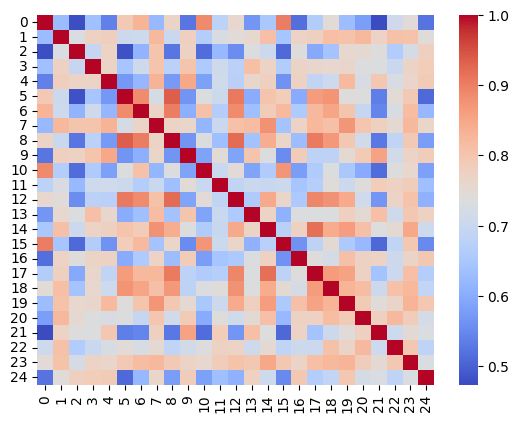

In [23]:
seaborn.heatmap(twopair_fisher_z_transformed_correlation(FC_second_half_HCP,FC_second_half_HCP),cmap="coolwarm")
plt.show()

## Update 19th February 2024

Now we explore the idea of: reproducibility of temporal dynamics. This is something we've never touched upon.

Steve has some thoughts that the uncertainty of temporal dynamics will be very high when you have very large number of states.
Maybe have a look at the perfect model first.

In [96]:
import os
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn
import pickle
from scipy.stats import multivariate_normal
from rotation.utils import twopair_riemannian_distance,twopair_fisher_z_transformed_correlation

In [63]:
save_dir = './results_simulation_202402/sigma_0.1/HMM_ICA_25_state_16/'
data_dir = './data/node_timeseries/simulation_202402/sigma_0.1/'

In [64]:
# Open the pickle file for reading
with open(f'{save_dir}alpha.pkl', 'rb') as f:
    # Load the object from the pickle file
    alpha = pickle.load(f)

In [65]:
len(alpha[0])

1200

In [66]:
ground_truth = np.load(f'{data_dir}truth/10001_state_time_course.npy')
print(ground_truth.shape)

(1200, 8)


In [67]:
posterior = alpha[0]

In [92]:
ground_truth[240:275,:]

array([[0, 0, 0, 1, 0, 0, 0, 0],
       [0, 0, 0, 1, 0, 0, 0, 0],
       [0, 0, 0, 1, 0, 0, 0, 0],
       [0, 0, 0, 1, 0, 0, 0, 0],
       [0, 0, 0, 1, 0, 0, 0, 0],
       [0, 0, 0, 1, 0, 0, 0, 0],
       [0, 0, 0, 1, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 1],
       [0, 0, 0, 0, 0, 0, 0, 1],
       [0, 0, 0, 0, 0, 0, 0, 1],
       [0, 0, 0, 0, 0, 0, 0, 1],
       [0, 0, 0, 0, 0, 0, 0, 1],
       [0, 0, 0, 0, 0, 0, 0, 1],
       [0, 0, 0, 0, 0, 0, 0, 1],
       [0, 0, 0, 0, 0, 0, 0, 1],
       [0, 0, 0, 0, 0, 0, 0, 1],
       [0, 0, 0, 0, 0, 0, 0, 1],
       [0, 0, 0, 0, 0, 0, 0, 1],
       [0, 0, 0, 0, 0, 0, 0, 1],
       [0, 0, 0, 0, 0, 0, 0, 1],
       [0, 0, 0, 0, 0, 0, 0, 1],
       [0, 0, 0, 0, 0, 0, 0, 1],
       [0, 0, 0, 0, 0, 0, 0, 1],
       [0, 0, 0, 0, 0, 0, 0, 1],
       [0, 0, 0, 0, 0, 0, 0, 1],
       [0, 0, 0, 0, 0, 0, 0, 1],
       [0, 0, 0, 0, 0, 0, 0, 1],
       [0,

In [69]:
posterior[240:300,:]

array([[1.90452789e-03, 1.97120294e-01, 1.21697588e-02, 5.86557342e-03,
        3.69402647e-01, 3.35632056e-01, 1.02244492e-03, 1.08124816e-03,
        6.90136757e-03, 4.54479086e-05, 5.16324528e-02, 8.61273205e-04,
        2.09734881e-05, 1.30941775e-02, 1.83959462e-04, 3.06179025e-03],
       [1.81984098e-03, 4.09528166e-02, 8.65738653e-03, 1.58991609e-02,
        8.15385282e-01, 4.44197468e-02, 1.48502353e-03, 7.22922443e-04,
        1.00297723e-02, 1.85489614e-06, 5.06994501e-02, 7.79489637e-04,
        2.05283985e-04, 5.64981066e-03, 2.67158437e-04, 3.02497018e-03],
       [3.95605862e-02, 2.58128205e-03, 1.35172915e-04, 1.78670064e-01,
        7.24519432e-01, 3.69007699e-03, 3.94140230e-03, 2.24808883e-03,
        3.98046104e-03, 1.58774346e-05, 1.67038795e-02, 4.90068167e-04,
        8.56826045e-06, 2.02719428e-04, 2.18406077e-02, 1.41172751e-03],
       [4.14431095e-02, 3.69072799e-03, 2.69429665e-03, 2.01504871e-01,
        5.94935954e-01, 5.17348433e-03, 8.09553545e-03, 7.958

In [70]:
covariance_fit = np.load(f'{save_dir}state_covariances.npy')
covariance_truth = np.load(f'{data_dir}truth/10001_state_covariances.npy')
covariance_fit = np.load(f'{save_dir}state_covariances.npy')
covariance_truth = np.load(f'{data_dir}truth/10001_state_covariances.npy')

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 216.18it/s]


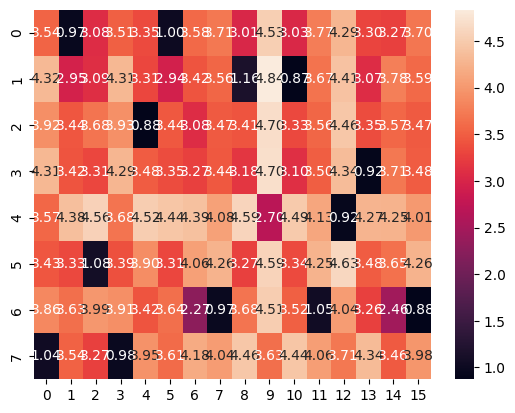

Compute twopair Fisher-z transformated correlation:   0%| | 0/8 [00:00<?, ?it/s]/gpfs3/well/win-fmrib-analysis/users/uap971/osl-dynamics/rotation/utils.py:244: RuntimeWarning: invalid value encountered in log
  return 0.5 * np.log((1 + v)/(1 - v))
Compute twopair Fisher-z transformated correlation: 100%|█| 8/8 [00:00<00:00, 22


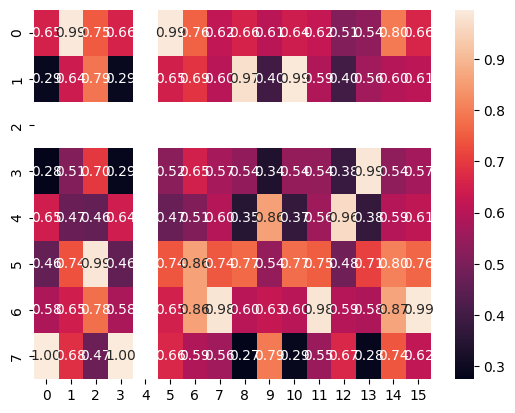

In [95]:
seaborn.heatmap(twopair_riemannian_distance(covariance_truth,covariance_fit),annot=True,fmt=".2f")
plt.show()
#seaborn.heatmap(twopair_fisher_z_transformed_correlation(covariance_truth,covariance_fit),annot=True,fmt=".2f")
#plt.show()

It seems to me that even the riemannian distance is very close, the model still have a preference over one state. Maybe look at your data to confirm that!

In [72]:
data = np.loadtxt(f'{data_dir}10001.txt')

(1200, 25)


In [80]:
logpdf_baseline = multivariate_normal(cov=covariance_truth[-1]).logpdf(data[250:275,:])

In [85]:
print(np.mean(logpdf_baseline))

-29.95887397038275


In [86]:
logpdf_0 = multivariate_normal(cov=covariance_fit[0]).logpdf(data[250:275,:])
print(np.mean(logpdf_0))

-30.533795785938437


In [87]:
logpdf_1 = multivariate_normal(cov=covariance_fit[1]).logpdf(data[250:275,:])
print(np.mean(logpdf_1))

-31.66624565540816


In [90]:
logpdf_3 = multivariate_normal(cov=covariance_fit[3]).logpdf(data[250:275,:])
print(np.mean(logpdf_3))

-30.447577862777038


In [91]:
logpdf_4 = multivariate_normal(cov=covariance_fit[4]).logpdf(data[250:275,:])
print(np.mean(logpdf_4))

-32.15634421065483


## Update 24th Feb 2024

Let's try to revise the Config so that the initial means and covariances could be read in from specific file.

In [10]:
from dataclasses import dataclass
from typing import Union

@dataclass
class Point:
    x: Union[float, str]
    #x: float
    y: float
    
    def __post_init__(self):
        # Check if x is a string, then convert it to float
        if isinstance(self.x, str):
            self.x = float(self.x)
    

In [12]:
# Test cases
point_float = Point(2.0, 3.5)  # Initialize with float
#print(point_float)  # Output: Point(x=2.0, y=3.5)

point_str = Point("2.5", 4.5)  # Initialize with str
print(type(point_str.x))  # Output: Point(x=2.5, y=4.5)
temp = None
print(f'Whether None is a instance of string?:{isinstance(temp,str)}')

<class 'str'>
Whether None is a instance of string?:False


The code shows that we can actually revise the config class so that a string can be passed in, i.e., read in that file to initialise the TPM/means/covariances

The training has finished. So let's check the results

In [120]:
import os
import numpy as np
import numpy.testing as npt
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn
from rotation.utils import *

In [121]:
save_dir = './results_simulation_202402_repeat/cov_0/sigma_0/hmm_ICA_25_state_16/'
repeats = ['train','repeat_1','repeat_2','repeat_3','repeat_4','repeat_5']
covariance_truth = np.load('./results_simulation_202402_repeat/fixed_covariances.npy')
# Check the mean activation are all zero, and covariance matrices are all identical.
for repeat in repeats:
    means = np.load(f'{save_dir}{repeat}/inf_params/means.npy')
    assert np.sum(np.abs(means)) == 0
    covariances = np.load(f'{save_dir}{repeat}/inf_params/covs.npy')
    npt.assert_almost_equal(covariances,covariance_truth,decimal=6)

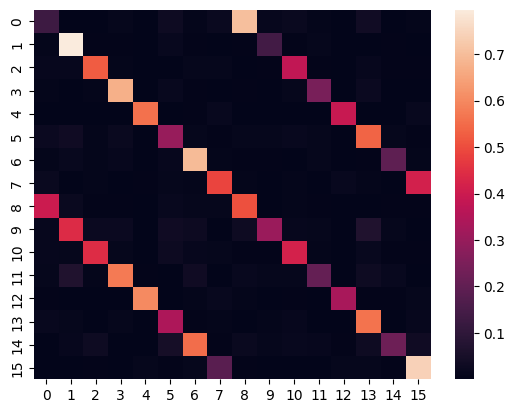

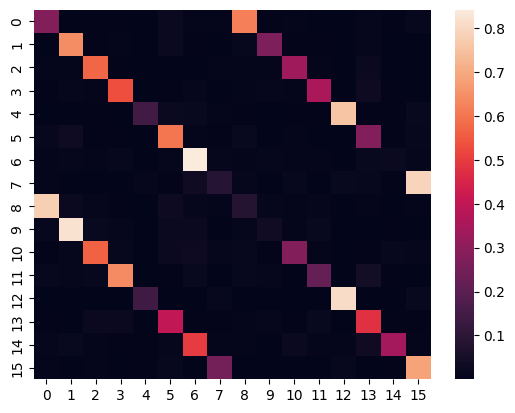

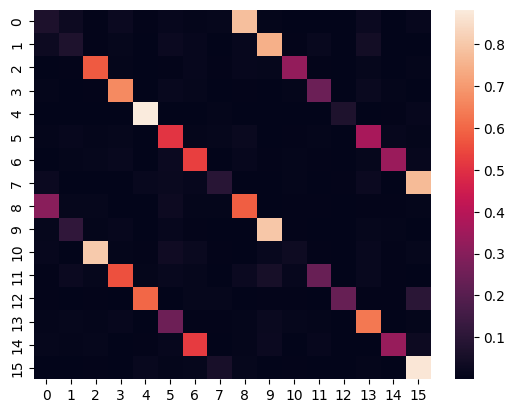

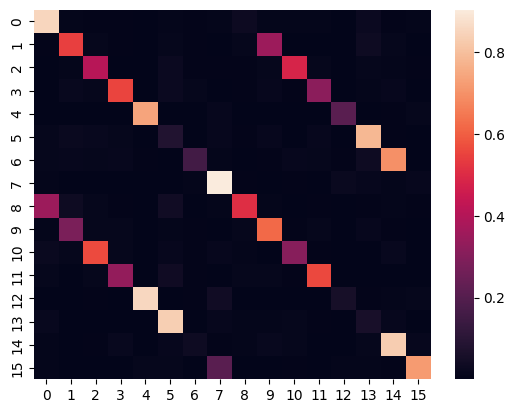

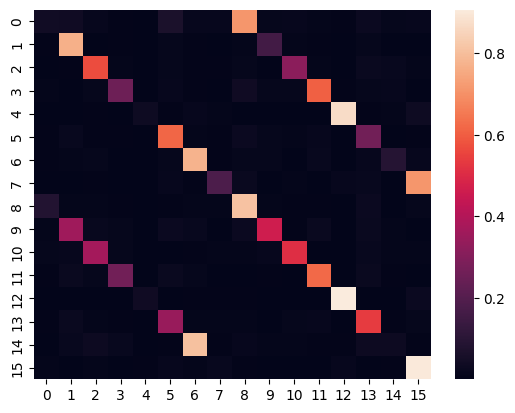

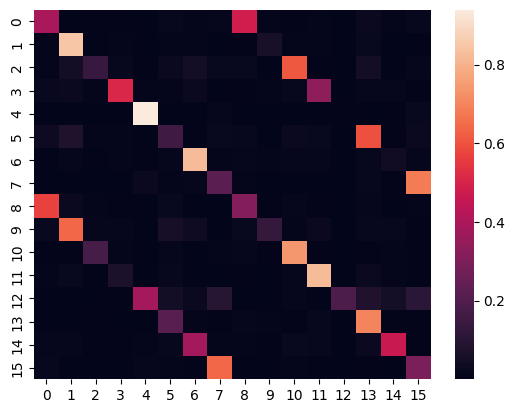

In [123]:
for repeat in repeats:
    tpm = np.load(f'{save_dir}{repeat}/model/trans_prob.npy')
    seaborn.heatmap(tpm)
    plt.show()

This is important. It tells us that with identical states, you will see the random switching between them. Now have a look at the alpha.

In [124]:
import pickle

In [125]:
with open(f'{save_dir}train/inf_params/alp.pkl','rb') as file:
    alpha = pickle.load(file)

In [126]:
with open(f'{save_dir}train/inf_params/alp.pkl','rb') as file:
    alpha = pickle.load(file)

In [127]:
print(type(alpha))

<class 'list'>


In [128]:
print(alpha[0])

[[4.81349826e-01 5.16284083e-04 3.40275379e-04 ... 8.43076705e-05
  3.41130544e-05 2.35170864e-05]
 [2.89944887e-01 4.54870635e-04 2.70671462e-05 ... 6.73804534e-05
  2.65584094e-05 1.54978716e-05]
 [3.55618507e-01 9.12061005e-05 1.09882035e-06 ... 1.80180173e-03
  9.72664384e-06 3.35799741e-05]
 ...
 [2.80968758e-04 1.73095271e-09 1.00545531e-05 ... 3.25659057e-05
  2.45787687e-05 6.99273944e-01]
 [2.19925332e-05 3.96189179e-08 1.20662498e-05 ... 1.09363555e-05
  1.02338972e-05 7.00931847e-01]
 [4.42815275e-04 7.30826832e-06 1.97023503e-04 ... 4.09335247e-04
  6.14416553e-04 6.67781532e-01]]


In [129]:
ground_truth = np.load('./data/node_timeseries/simulation_202402/sigma_0/truth/10001_state_time_course.npy')

In [130]:
print(ground_truth[:100])

[[1 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0]
 [0 0 0 0 0 1 0 0]
 [0 0 0 0 0 1 0 0]
 [0 0 0 0 0 1 0 0]
 [0 0 0 0 0 1 0 0]
 [0 0 0 0 0 1 0 0]
 [0 0 0 0 0 1 0 0]
 [0 0 0 0 0 1 0 0]
 [0 0 0 0 0 1 0 0]
 [0 0 1 0 0 0 0 0]
 [0 0 1 0 0 0 0 0]
 [0 0 1 0 0 0 0 0]
 [0 0 1 0 0 0 0 0]
 [0 0 1 0 0 0 0 0]
 [0 0 1 0 0 0 0 0]
 [0 0 1 0 0 0 0 0]
 [0 0 0 0 0 1 0 0]
 [0 0 0 0 0 1 0 0]
 [0 0 0 0 0 1 0 0]
 [0 0 0 0 0 1 0 0]
 [0 0 0 0 0 1 0 0]
 [0 0 0 0 0 1 0 0]
 [0 0 1 0 0 0 0 0]
 [0 0 1 0 0 0 0 0]
 [0 0 1 0 0 0 0 0]
 [0 0 1 0 0 0 0 0]
 [0 0 1 0 0 0 0 0]
 [0 0 1 0 0 0 0 0]
 [0 0 0 0 0 1 0 0]
 [0 0 0 0 0 1 0 0]
 [0 0 0 0 0 0 1 0]
 [0 0 0 0 0 

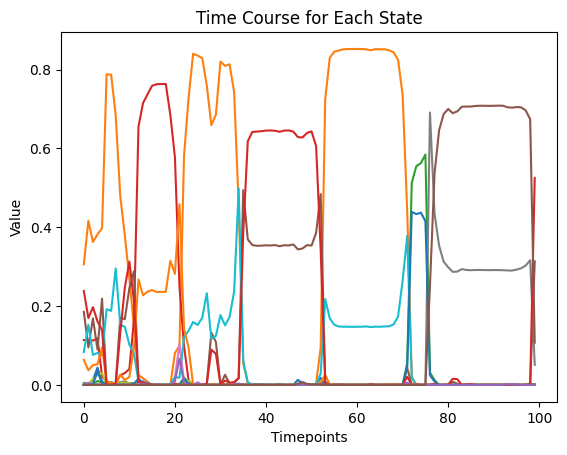

In [134]:
n_states = 16
# Plot the time course for each state
for state in range(n_states):
    plt.plot(alpha[0][100:200, state], label=f'State {state + 1}')

# Add labels and legend
plt.xlabel('Timepoints')
plt.ylabel('Value')
plt.title('Time Course for Each State')
#plt.legend()

# Add a caption
#plt.figtext(0.5, 0.01, 'Figure 1: Time course for each state in the data.', ha='center')

# Show the plot
plt.show()

This confirms Steve and Rukuang's guess that the "uncertainty" in the state time course will be high. But it's not necessarily in a "0.5-0.5" split.

What happens when there's subject variablity in the "ground truth"?

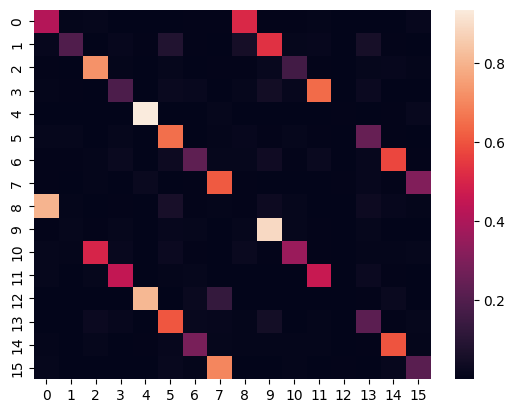

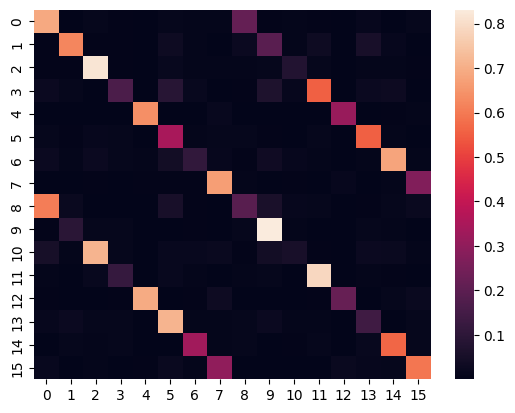

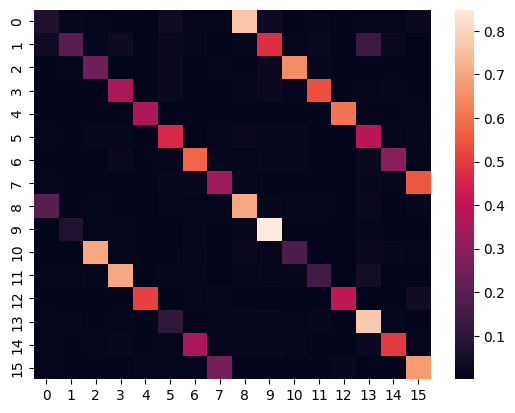

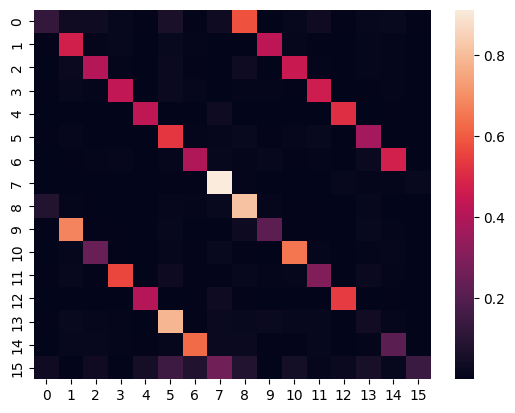

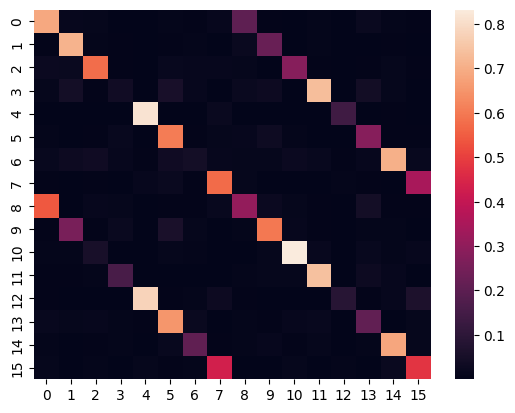

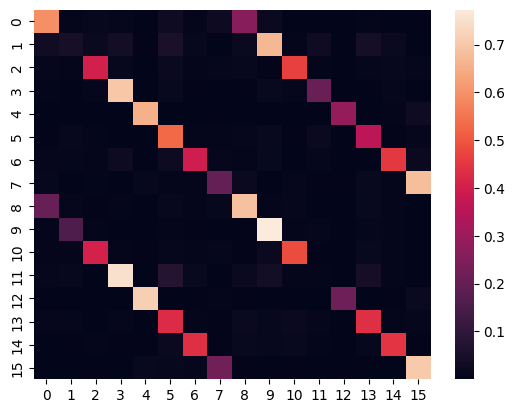

In [58]:
save_dir = './results_simulation_202402_repeat/cov_0/sigma_0.025/hmm_ICA_25_state_16/'
repeats = ['train','repeat_1','repeat_2','repeat_3','repeat_4','repeat_5']
covariance_truth = np.load('./results_simulation_202402_repeat/fixed_covariances.npy')
for repeat in repeats:
    tpm = np.load(f'{save_dir}{repeat}/model/trans_prob.npy')
    seaborn.heatmap(tpm)
    plt.show()

In [60]:
with open(f'{save_dir}train/inf_params/alp.pkl','rb') as file:
    alpha = pickle.load(file)

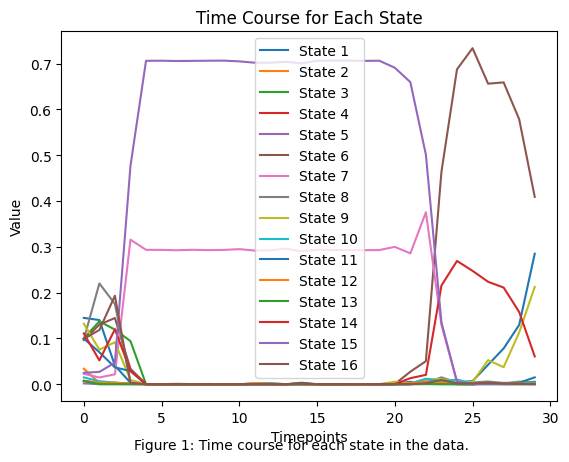

In [61]:
n_states = 16
# Plot the time course for each state
for state in range(n_states):
    plt.plot(alpha[0][:30, state], label=f'State {state + 1}')

# Add labels and legend
plt.xlabel('Timepoints')
plt.ylabel('Value')
plt.title('Time Course for Each State')
plt.legend()

# Add a caption
plt.figtext(0.5, 0.01, 'Figure 1: Time course for each state in the data.', ha='center')

# Show the plot
plt.show()

## Update 24th Feb 2024

Also, we're interested in giving some "perturbation" to the "fixed covariances"!

In [40]:
fixed_covariances = np.load('./results_simulation_202402_repeat/fixed_covariances.npy')

In [41]:
from rotation.simulation import perturb_covariances

2024-02-24 17:04:48.812257: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-02-24 17:04:48.817010: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2024-02-24 17:04:48.817026: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 731.16it/s]


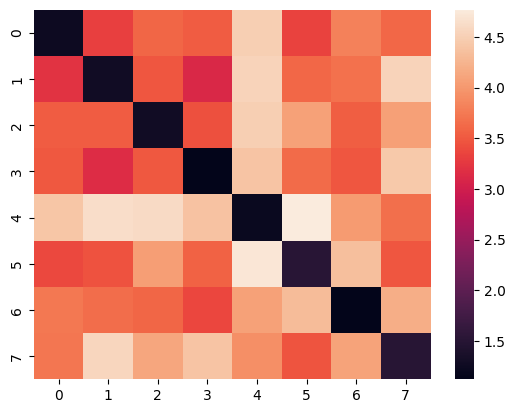

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 455.90it/s]


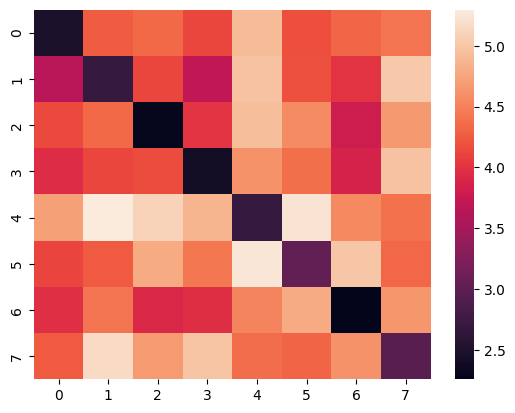

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 404.87it/s]


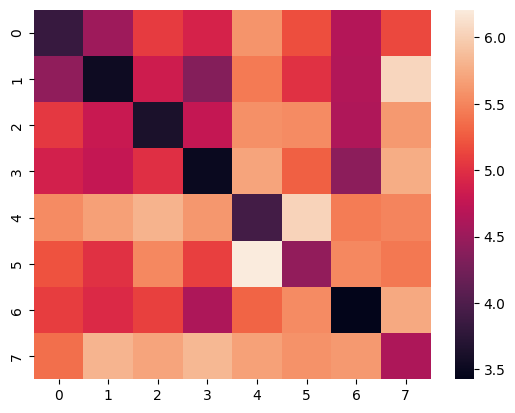

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 333.14it/s]


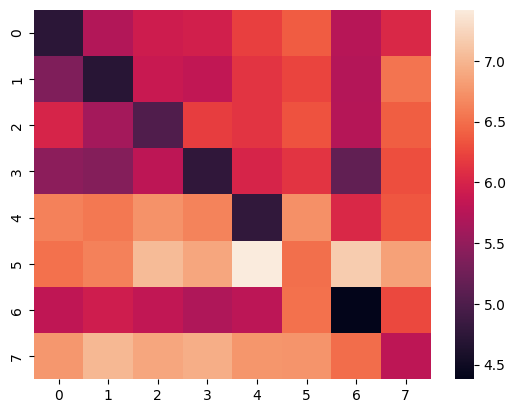

In [48]:
sigmas = [0.025,0.05,0.075,0.1]
for sigma in sigmas:
    covariances = np.concatenate((perturb_covariances(fixed_covariances[:8],perturbation_factor=sigma),
                                  perturb_covariances(fixed_covariances[:8],perturbation_factor=sigma)),axis=0)
    seaborn.heatmap(twopair_riemannian_distance(covariances[:8],covariances[8:]))
    plt.show()
    np.save(f'./results_simulation_202402_repeat/fixed_covariances_{sigma}.npy',covariances)

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 717.91it/s]


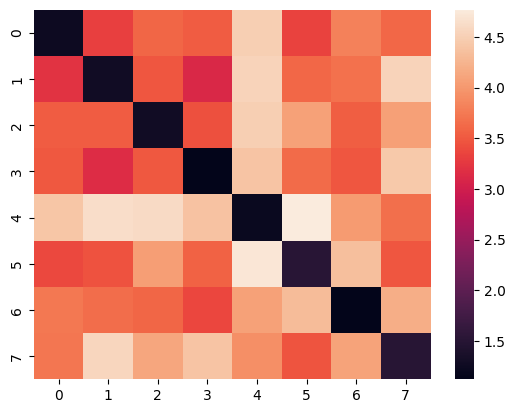

In [137]:
fixed_matrices = np.load(f'./results_simulation_202402_repeat/fixed_covariances_0.025.npy')
seaborn.heatmap(twopair_riemannian_distance(fixed_matrices[:8],fixed_matrices[8:]))
plt.show()

Now let's check the posterior "uncertainty" again.

In [140]:
import os
import pickle
import numpy as np
import numpy.testing as npt
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn

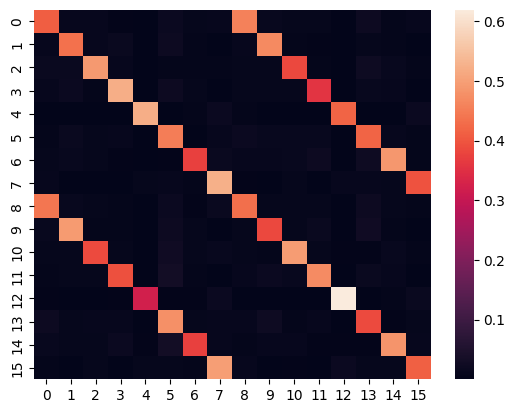

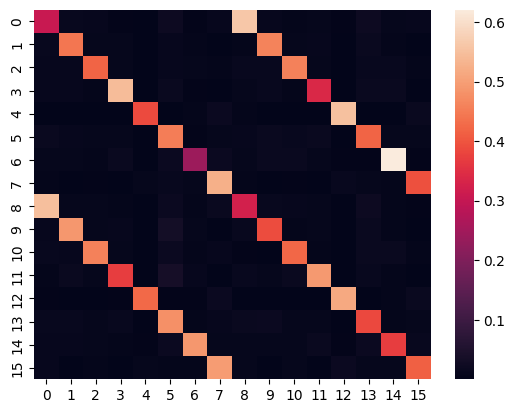

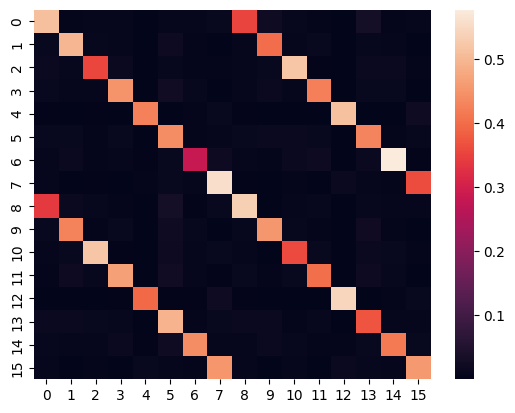

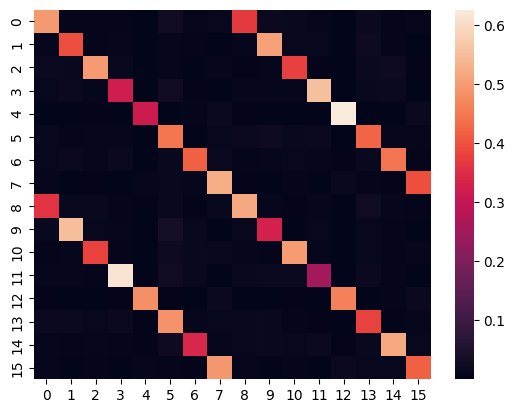

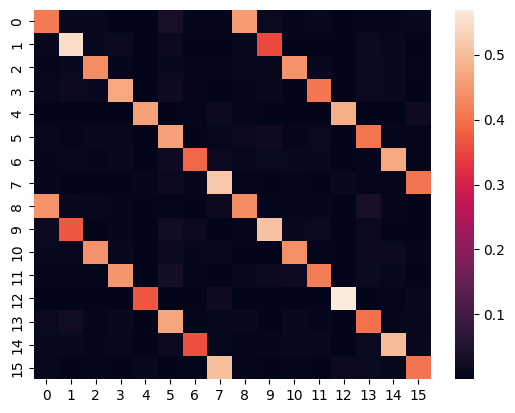

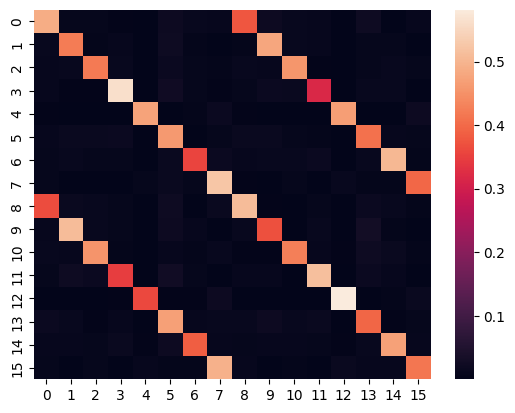

In [141]:
save_dir = './results_simulation_202402_repeat/cov_0.025/sigma_0/hmm_ICA_25_state_16/'
repeats = ['train','repeat_1','repeat_2','repeat_3','repeat_4','repeat_5']
covariance_truth = np.load('./results_simulation_202402_repeat/fixed_covariances_0.025.npy')
for repeat in repeats:
    tpm = np.load(f'{save_dir}{repeat}/model/trans_prob.npy')
    covariances = np.load(f'{save_dir}{repeat}/inf_params/covs.npy')
    means = np.load(f'{save_dir}{repeat}/inf_params/means.npy')
    npt.assert_almost_equal(means,0)
    npt.assert_almost_equal(covariance_truth,covariances,decimal=6)
    seaborn.heatmap(tpm)
    plt.show()

There are still structures in the transition probability matrix (which is good). And we still see run-to-run variability.

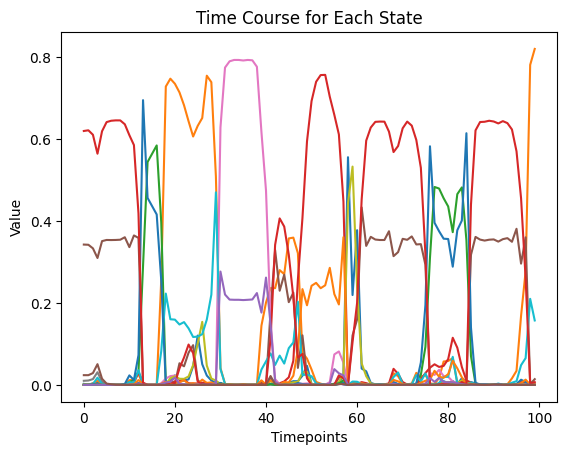

In [143]:
for repeat in ['train']:#repeats:
    with open(f'{save_dir}{repeat}/inf_params/alp.pkl','rb') as file:
        data = pickle.load(file)
        n_states = 16
        # Plot the time course for each state
        for state in range(n_states):
            plt.plot(alpha[0][200:300, state], label=f'State {state + 1}')

        # Add labels and legend
        plt.xlabel('Timepoints')
        plt.ylabel('Value')
        plt.title('Time Course for Each State')
        #plt.legend()

        # Add a caption
        #plt.figtext(0.5, 0.01, 'Figure 1: Time course for each state in the data.', ha='center')

        # Show the plot
        plt.show()

It's very clear that you can definitely see the "uncertainty" in the state time courses even when these repeated "states" are slightly different. What if when you have larger "fixed" state variability?

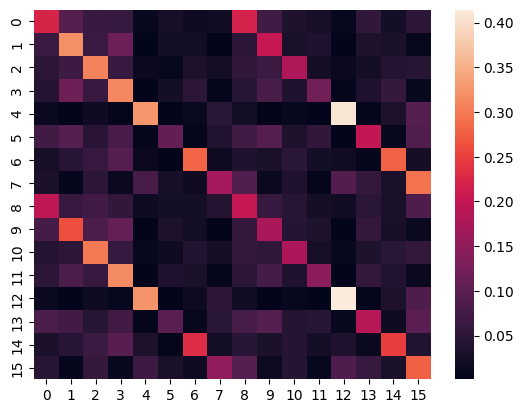

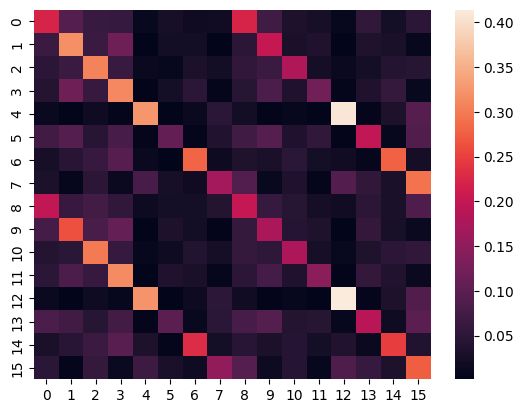

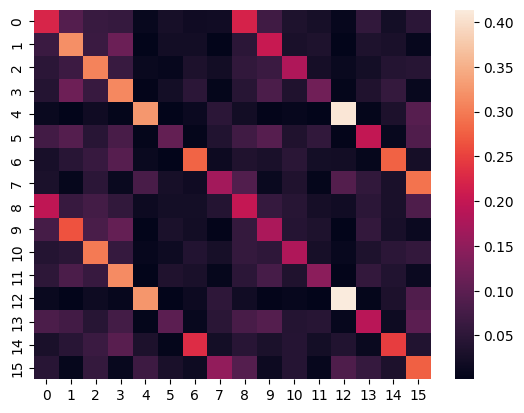

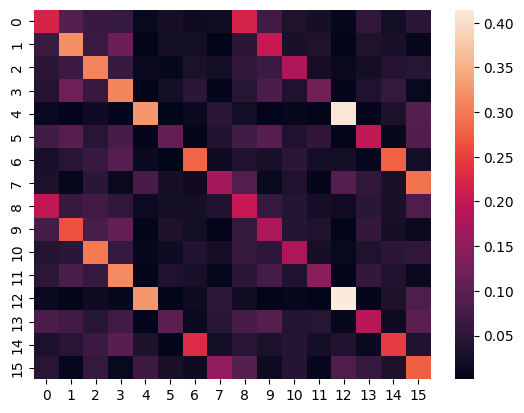

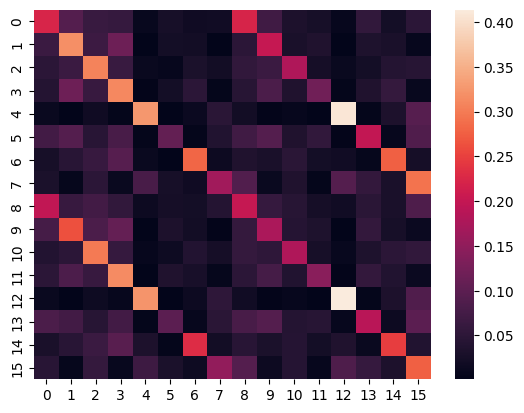

...

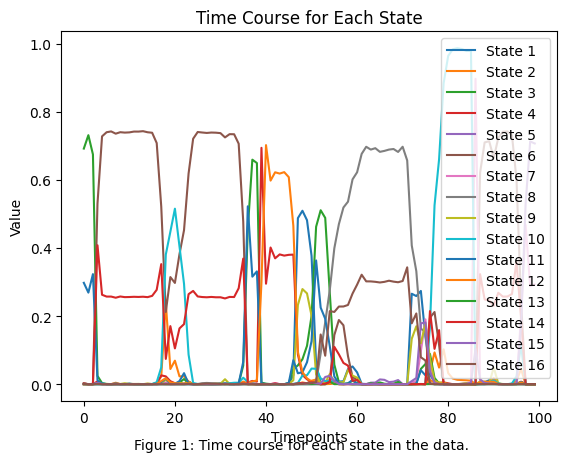

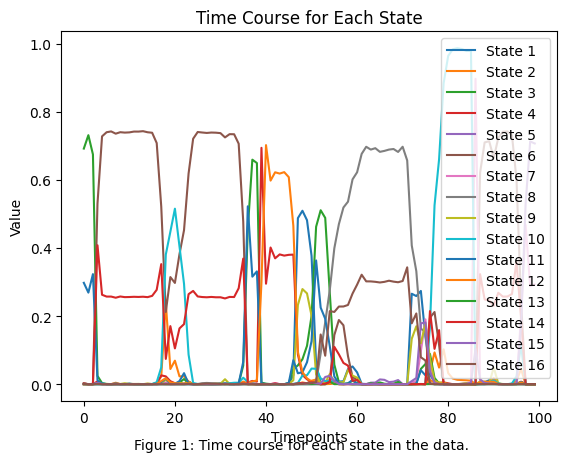

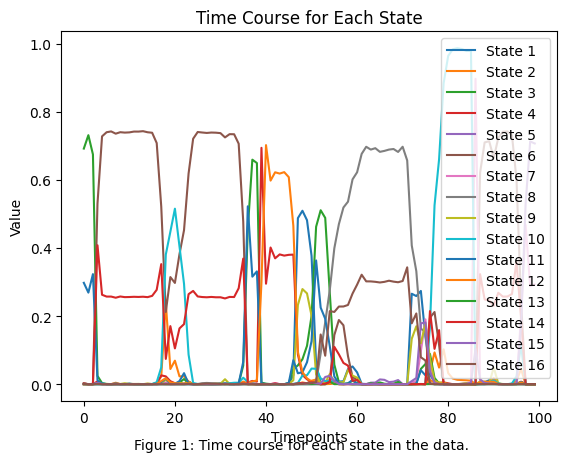

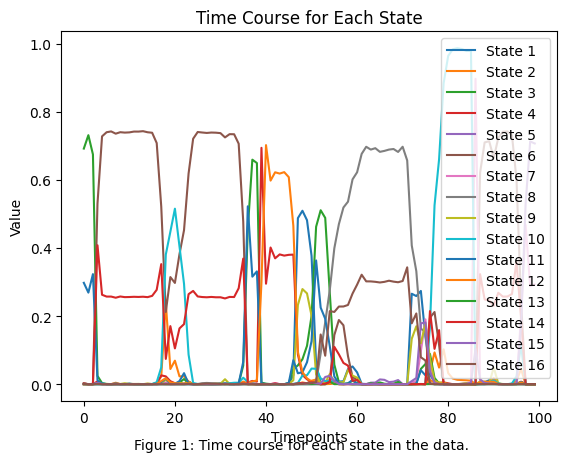

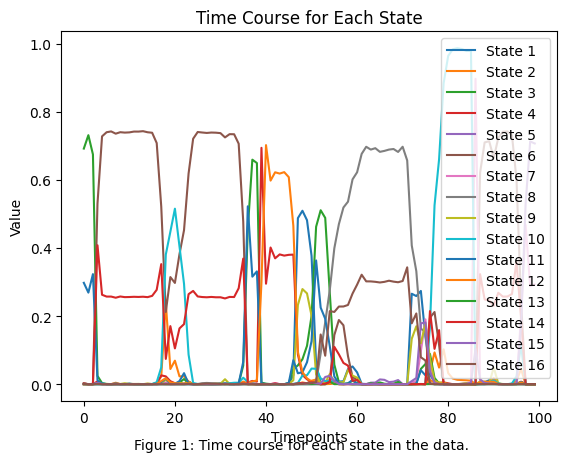

In [72]:
save_dir = './results_simulation_202402_repeat/cov_0.1/sigma_0/hmm_ICA_25_state_16/'
repeats = ['train','repeat_1','repeat_2','repeat_3','repeat_4','repeat_5']
covariance_truth = np.load('./results_simulation_202402_repeat/fixed_covariances_0.1.npy')
for repeat in repeats:
    tpm = np.load(f'{save_dir}{repeat}/model/trans_prob.npy')
    covariances = np.load(f'{save_dir}{repeat}/inf_params/covs.npy')
    means = np.load(f'{save_dir}{repeat}/inf_params/means.npy')
    npt.assert_almost_equal(means,0)
    npt.assert_almost_equal(covariance_truth,covariances,decimal=6)
    seaborn.heatmap(tpm)
    plt.show()

for repeat in repeats:
    with open(f'{save_dir}{repeat}/inf_params/alp.pkl','rb') as file:
        data = pickle.load(file)
        n_states = 16
        # Plot the time course for each state
        for state in range(n_states):
            plt.plot(alpha[0][200:300, state], label=f'State {state + 1}')

        # Add labels and legend
        plt.xlabel('Timepoints')
        plt.ylabel('Value')
        plt.title('Time Course for Each State')
        plt.legend()

        # Add a caption
        plt.figtext(0.5, 0.01, 'Figure 1: Time course for each state in the data.', ha='center')

        # Show the plot
        plt.show() 

So the same results still holds. What happens if you only perturb only the second eight states? While fix the first eight states?

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 492.74it/s]


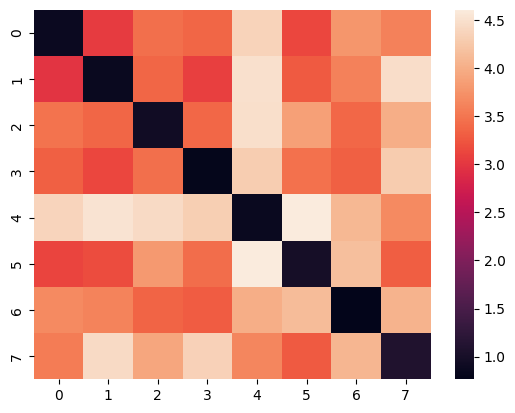

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 241.42it/s]


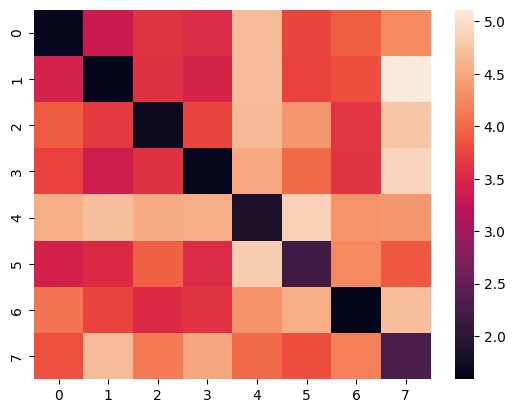

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 192.85it/s]


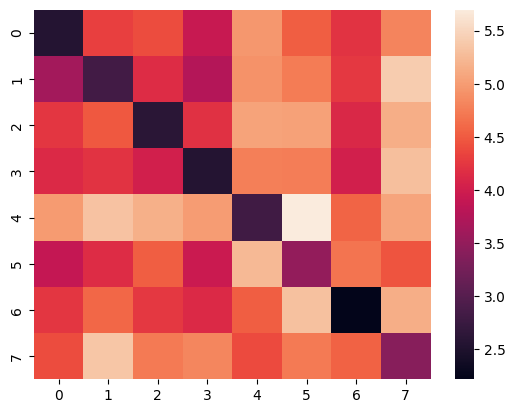

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 375.41it/s]


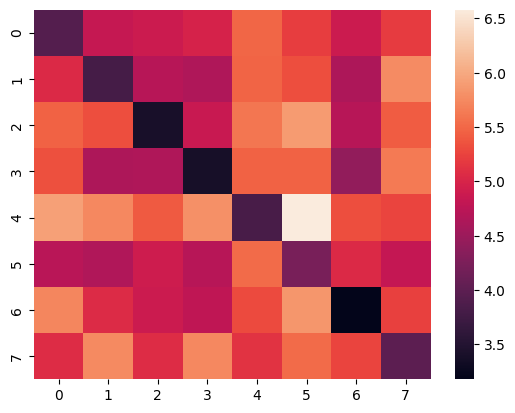

In [74]:
fixed_covariances = np.load('./results_simulation_202402_repeat/fixed_covariances.npy')
sigmas = [0.025,0.05,0.075,0.1]
for sigma in sigmas:
    covariances = np.concatenate((fixed_covariances[:8],
                                  perturb_covariances(fixed_covariances[:8],perturbation_factor=sigma)),axis=0)
    seaborn.heatmap(twopair_riemannian_distance(covariances[:8],covariances[8:]))
    plt.show()
    np.save(f'./results_simulation_202402_repeat/fixed_covariances_one_{sigma}.npy',covariances)

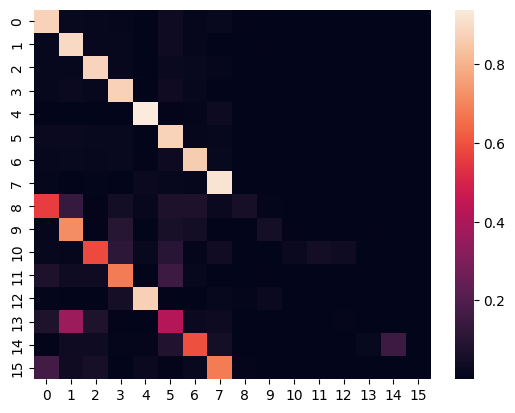

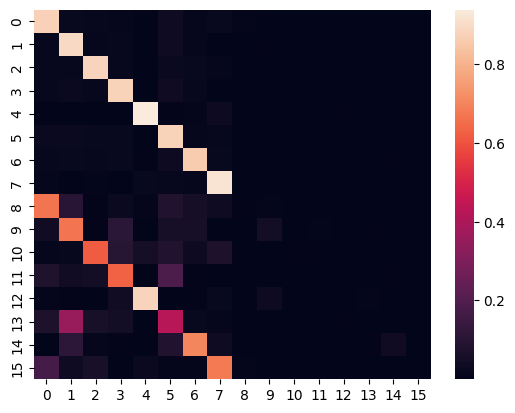

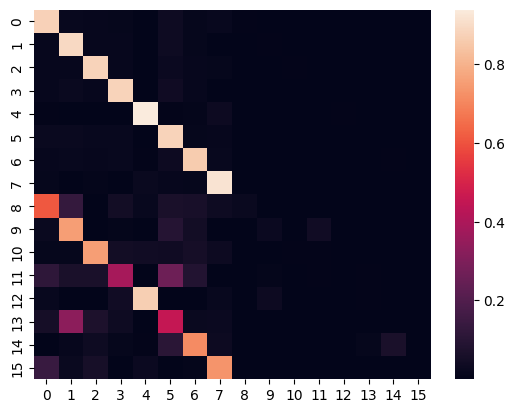

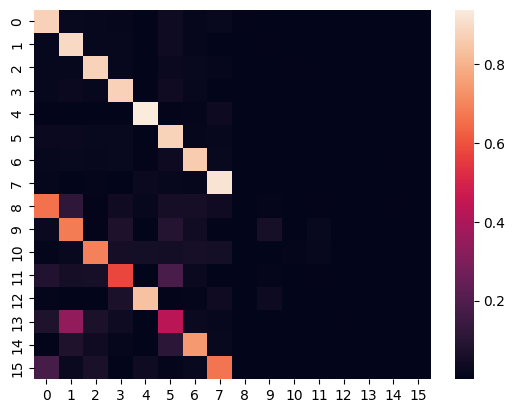

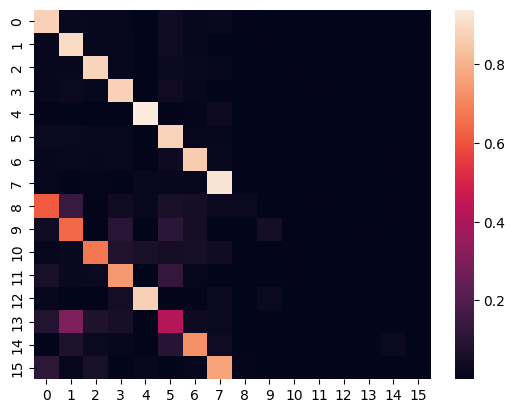

...

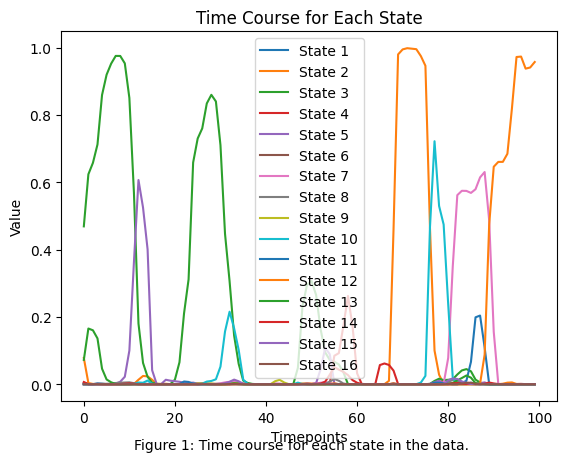

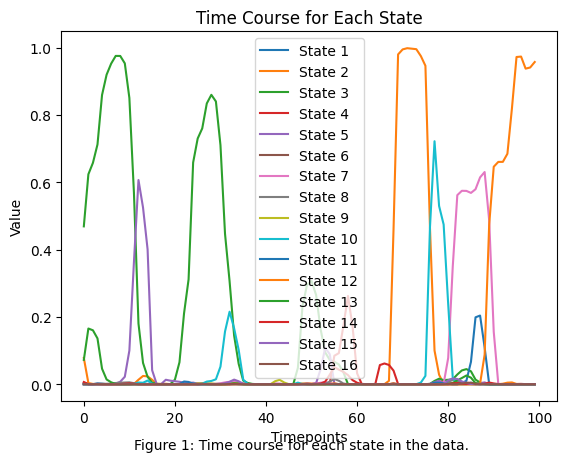

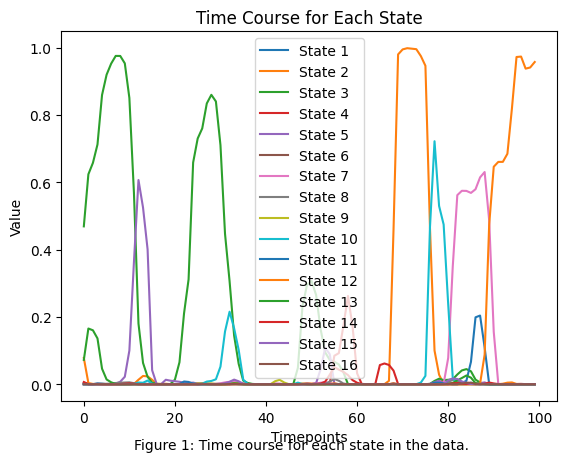

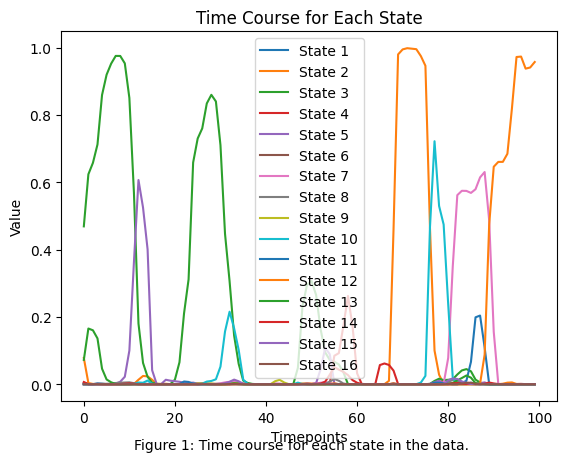

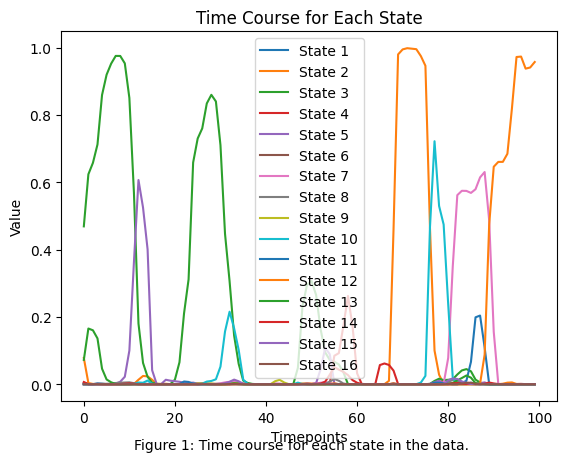

In [98]:
save_dir = './results_simulation_202402_repeat/cov_one_0.05/sigma_0/hmm_ICA_25_state_16/'
repeats = ['train','repeat_1','repeat_2','repeat_3','repeat_4','repeat_5']
covariance_truth = np.load('./results_simulation_202402_repeat/fixed_covariances_one_0.05.npy')
for repeat in repeats:
    tpm = np.load(f'{save_dir}{repeat}/model/trans_prob.npy')
    covariances = np.load(f'{save_dir}{repeat}/inf_params/covs.npy')
    means = np.load(f'{save_dir}{repeat}/inf_params/means.npy')
    npt.assert_almost_equal(means,0)
    npt.assert_almost_equal(covariance_truth,covariances,decimal=6)
    seaborn.heatmap(tpm)
    plt.show()

for repeat in repeats:
    with open(f'{save_dir}{repeat}/inf_params/alp.pkl','rb') as file:
        data = pickle.load(file)
        n_states = 16
        # Plot the time course for each state
        for state in range(n_states):
            plt.plot(alpha[0][300:400, state], label=f'State {state + 1}')

        # Add labels and legend
        plt.xlabel('Timepoints')
        plt.ylabel('Value')
        plt.title('Time Course for Each State')
        plt.legend()

        # Add a caption
        plt.figtext(0.5, 0.01, 'Figure 1: Time course for each state in the data.', ha='center')

        # Show the plot
        plt.show() 

But the question is: in real data, we never see identical states (at least states are slightly different). Is there large uncertainty of posterior on real data

In [152]:
save_dir = './results_HCP_202402_single_session/HMM_ICA_25_state_6/'
with open(f'{save_dir}alpha.pkl','rb') as file:
    alpha = pickle.load(file)

In [153]:
alpha[0].shape

(1200, 6)

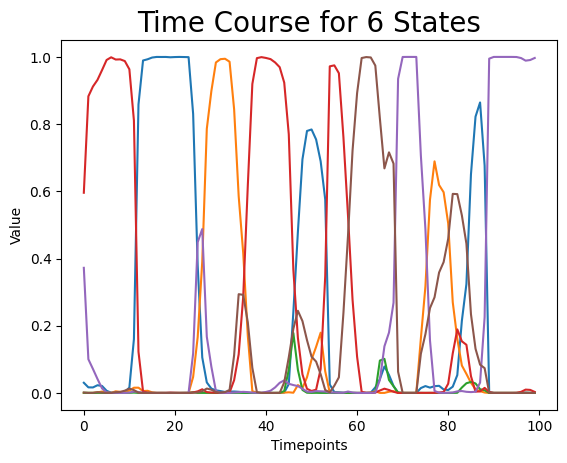

In [154]:
_,n_states = alpha[0].shape
# Plot the time course for each state
for state in range(n_states):
    plt.plot(alpha[0][300:400, state], label=f'State {state + 1}')

# Add labels and legend
plt.xlabel('Timepoints')
plt.ylabel('Value')
plt.title(f'Time Course for {n_states} States',fontsize=20)
#plt.legend()

# Add a caption
#plt.figtext(0.5, 0.01, 'Figure 1: Time course for each state in the data.', ha='center')

# Show the plot
plt.show() 

Maybe have a look at the free training on simulation data (with eight states as the ground truth, but you feed in 16 states)

In [167]:
save_dir = './results_simulation_202402/sigma_0/HMM_ICA_25_state_16/'
with open(f'{save_dir}alpha.pkl','rb') as file:
    alpha = pickle.load(file)

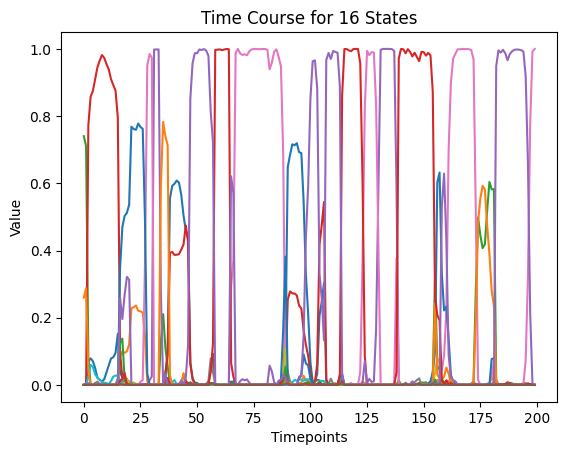

In [168]:
_,n_states = alpha[0].shape
# Plot the time course for each state
for state in range(n_states):
    plt.plot(alpha[0][500:700, state], label=f'State {state + 1}')

# Add labels and legend
plt.xlabel('Timepoints')
plt.ylabel('Value')
plt.title(f'Time Course for {n_states} States')
#plt.legend()

# Add a caption
#plt.figtext(0.5, 0.01, 'Figure 1: Time course for each state in the data.', ha='center')

# Show the plot
plt.show()

Now let's plot the temporal correlation of different models, which should be very interesting.

In [1]:
import os
import pickle
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn
from rotation.utils import calculate_temporal_correlation

/well/win-fmrib-analysis/users/uap971/conda/skylake/envs/osld/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
save_dir = './results_simulation_202402_repeat/cov_0/sigma_0/hmm_ICA_25_state_16/'

In [3]:
repeats = ['train','repeat_1','repeat_2','repeat_3','repeat_4','repeat_5']

0.9580851516103333


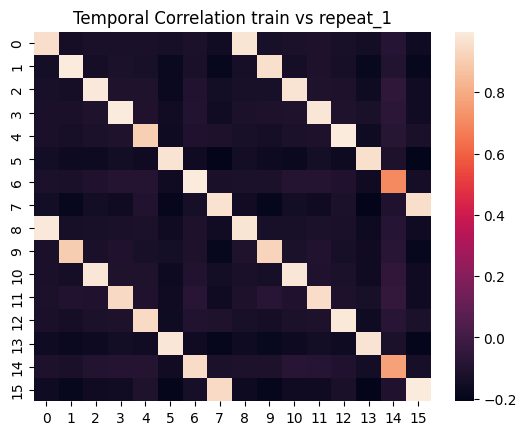

ValueError: 

In [8]:
for i in range(len(repeats)):
    with open(f'{save_dir}{repeats[i]}/inf_params/alp.pkl','rb') as file:
        alpha_1 = pickle.load(file)
    for j in range(i+1,len(repeats)):
        with open(f'{save_dir}{repeats[j]}/inf_params/alp.pkl','rb') as file:
            alpha_2 = pickle.load(file)
            correlation = calculate_temporal_correlation(alpha_1,alpha_2)
        seaborn.heatmap(correlation)
        print(np.mean(np.diagonal(correlation)))
        plt.title(f'Temporal Correlation {repeats[i]} vs {repeats[j]}')
        plt.show()
        raise ValueError('')

## Update 27th February 2024

Task1: Check the temporal reproducibility, does it give you any kind of information?

In [11]:
import os
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn
import pickle
from rotation.utils import *

In [12]:
save_dir = './results_HCP_yaml/'

In [13]:
N_states = list(range(2,37))

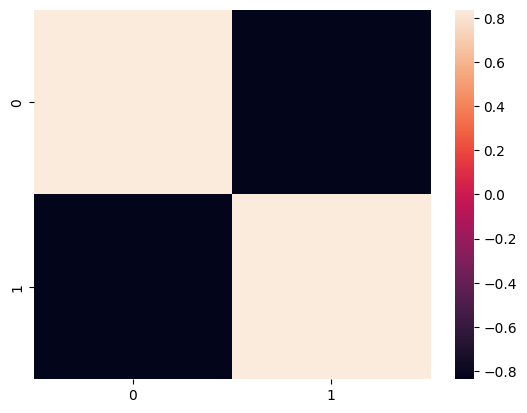

temporal_indice:{'row': [0, 1], 'col': [1, 0]}
temporal_correlation:0.8376270744223412


Computing Riemannian distances: 100%|███████████| 2/2 [00:00<00:00, 1133.29it/s]

spatial_indice:{'row': [0, 1], 'col': [1, 0]}
spatial_correlation:2.726120751824279


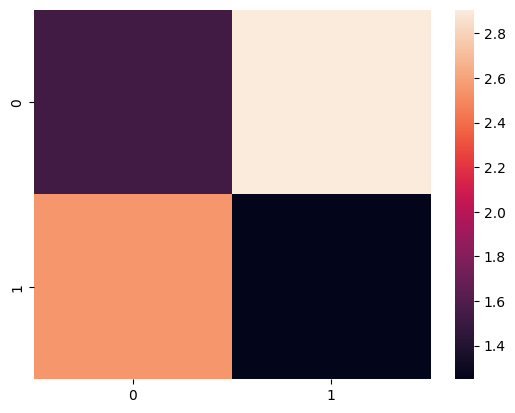

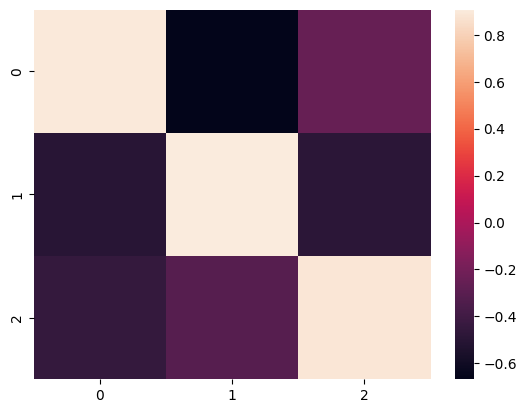

temporal_indice:{'row': [0, 1, 2], 'col': [0, 1, 2]}
temporal_correlation:0.8969399947484981


Computing Riemannian distances: 100%|████████████| 3/3 [00:00<00:00, 441.41it/s]

spatial_indice:{'row': [0, 1, 2], 'col': [2, 0, 1]}
spatial_correlation:3.3266567517521284


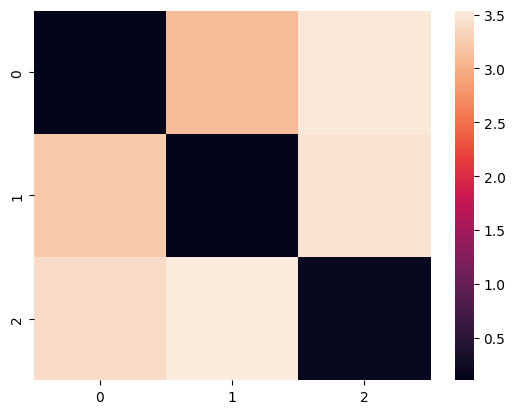

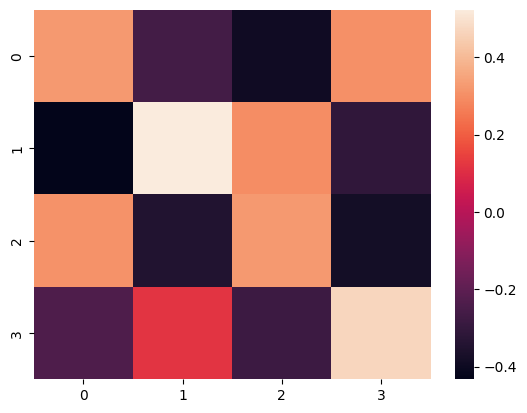

temporal_indice:{'row': [0, 1, 2, 3], 'col': [3, 1, 0, 2]}
temporal_correlation:0.4094449411653301


Computing Riemannian distances: 100%|████████████| 4/4 [00:00<00:00, 570.69it/s]

spatial_indice:{'row': [0, 1, 2, 3], 'col': [1, 0, 3, 2]}
spatial_correlation:3.1743475604337394


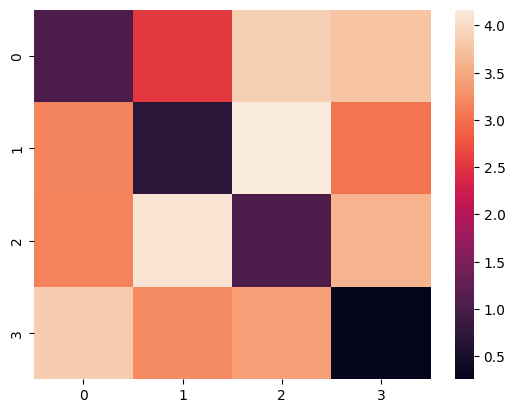

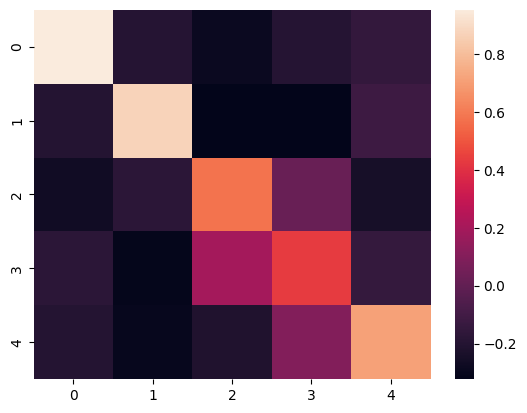

temporal_indice:{'row': [0, 1, 2, 3, 4], 'col': [1, 3, 2, 0, 4]}
temporal_correlation:0.7090019756185282


Computing Riemannian distances: 100%|████████████| 5/5 [00:00<00:00, 361.85it/s]

spatial_indice:{'row': [0, 1, 2, 3, 4], 'col': [1, 2, 3, 4, 0]}
spatial_correlation:3.446192127217877


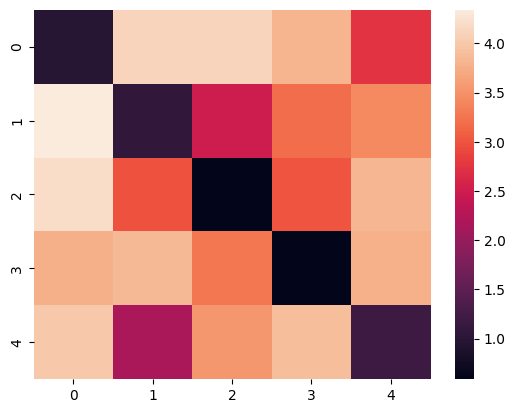

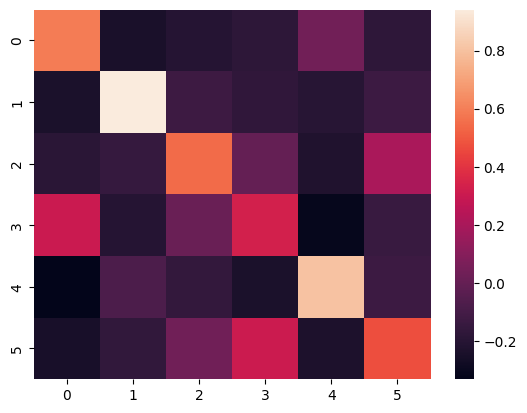

temporal_indice:{'row': [0, 1, 2, 3, 4, 5], 'col': [0, 5, 1, 3, 4, 2]}
temporal_correlation:0.6135764317385284


Computing Riemannian distances: 100%|████████████| 6/6 [00:00<00:00, 531.70it/s]

spatial_indice:{'row': [0, 1, 2, 3, 4, 5], 'col': [5, 2, 1, 3, 4, 0]}
spatial_correlation:3.0476257275804706


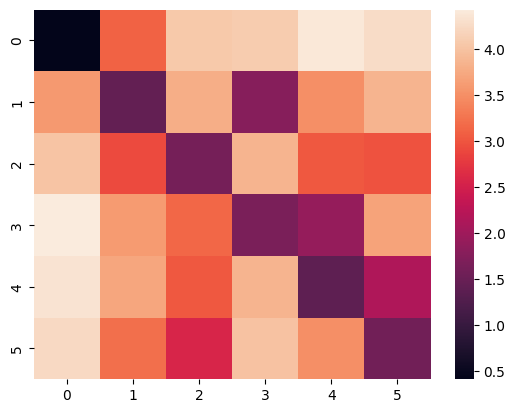

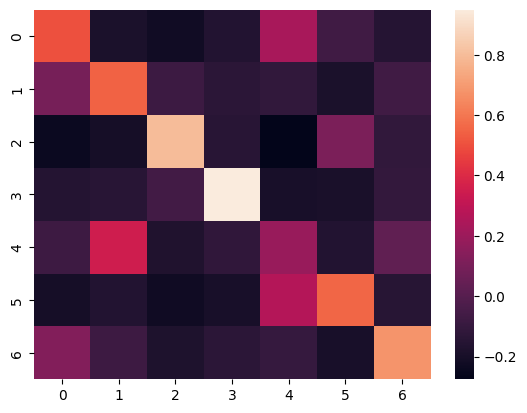

temporal_indice:{'row': [0, 1, 2, 3, 4, 5, 6], 'col': [5, 4, 2, 6, 0, 3, 1]}
temporal_correlation:0.6023831003740401


Computing Riemannian distances: 100%|████████████| 7/7 [00:00<00:00, 158.24it/s]

spatial_indice:{'row': [0, 1, 2, 3, 4, 5, 6], 'col': [0, 2, 4, 6, 3, 1, 5]}
spatial_correlation:3.4922319936827533


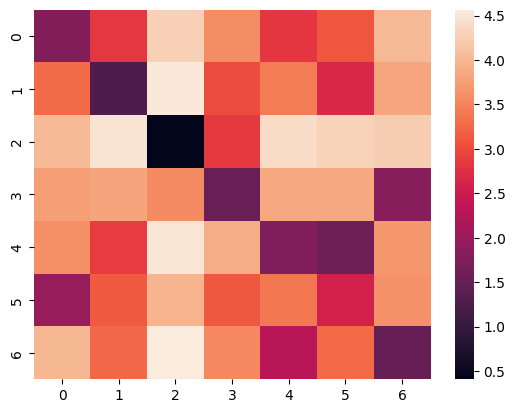

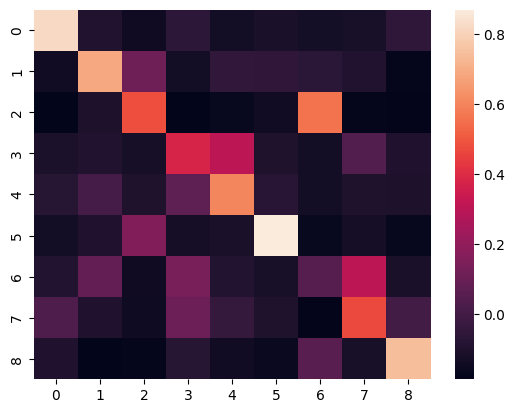

temporal_indice:{'row': [0, 1, 2, 3, 4, 5, 6, 7, 8], 'col': [4, 7, 0, 3, 5, 1, 6, 2, 8]}
temporal_correlation:0.5666194336670576


Computing Riemannian distances: 100%|████████████| 9/9 [00:00<00:00, 682.32it/s]

spatial_indice:{'row': [0, 1, 2, 3, 4, 5, 6, 7, 8], 'col': [3, 1, 2, 5, 8, 6, 0, 7, 4]}
spatial_correlation:2.7591610805691387


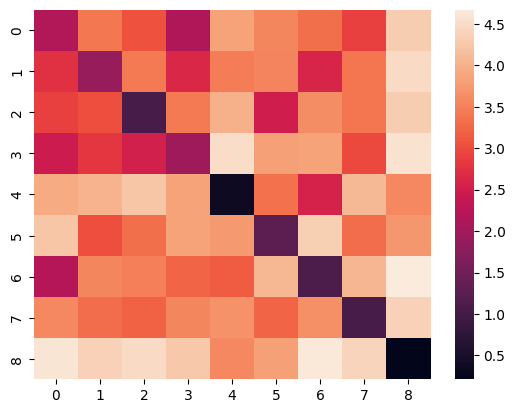

FileNotFoundError: [Errno 2] No such file or directory: './results_HCP_yaml/hmm_ICA_25_state_11/repeat_1/inf_params/alp.pkl'

In [24]:
for N_state in N_states:
    if (N_state == 8) or (N_state == 10):
        continue
    with open(f'{save_dir}hmm_ICA_25_state_{N_state}/repeat_1/inf_params/alp.pkl','rb') as file:
        alpha_1 = pickle.load(file)
    with open(f'{save_dir}hmm_ICA_25_state_{N_state}/repeat_2/inf_params/alp.pkl','rb') as file:
        alpha_2 = pickle.load(file)
    correlation = calculate_temporal_correlation(alpha_1,alpha_2)
    temporal_indice, correlation_pair = hungarian_pair(correlation)
    seaborn.heatmap(correlation_pair)
    plt.show()
    print(f'temporal_indice:{temporal_indice}')
    print(f'temporal_correlation:{np.mean(np.diagonal(correlation_pair))}')
    cov_1 = np.load(f'{save_dir}hmm_ICA_25_state_{N_state}/repeat_4/inf_params/covs.npy')
    cov_2 = np.load(f'{save_dir}hmm_ICA_25_state_{N_state}/repeat_5/inf_params/covs.npy')
    riem_distance = twopair_riemannian_distance(cov_1,cov_2)
    spatial_indice, riem_distance_pair = hungarian_pair(riem_distance,distance=True)
    print(f'spatial_indice:{spatial_indice}')
    print(f'spatial_correlation:{np.mean(np.diagonal(riem_distance))}')
    seaborn.heatmap(riem_distance_pair)
    plt.show()
          
    

## Update 4th March 2024

Now we're going to analysis the results obtained previously. There are three folders as follows:
- Simulation data with covariance fixed: `results_simulation_202402_repeat`
- Simulation data with free covariance: `results_simulation_202403`
- HCP data with free covariance: `results_HCP_yaml_202403`

In [18]:
import os
import yaml
import pickle

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from rotation.utils import *

### Question 1: When you have repeated states, there are run-to-run variability.

Does it impact the run-to-run variability? Maybe some states are silenced.

In [94]:
from osl_dynamics.utils.plotting import plot_matrices
from osl_dynamics.analysis.modes import fractional_occupancies
from osl_dynamics.utils.plotting import plot_violin

In [95]:
save_dir = './results_simulation_202402_repeat/cov_0/sigma_0/hmm_ICA_25_state_16/'
repeats = ['train','repeat_1','repeat_2','repeat_3','repeat_4','repeat_5']

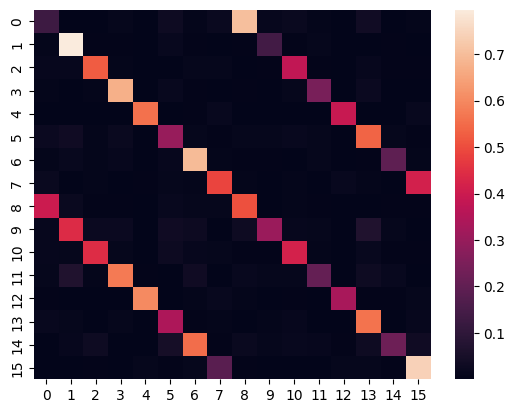

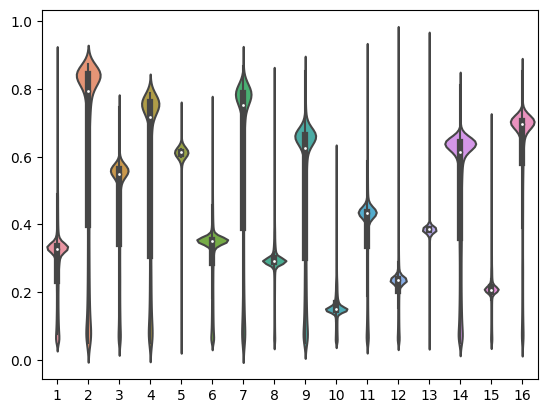

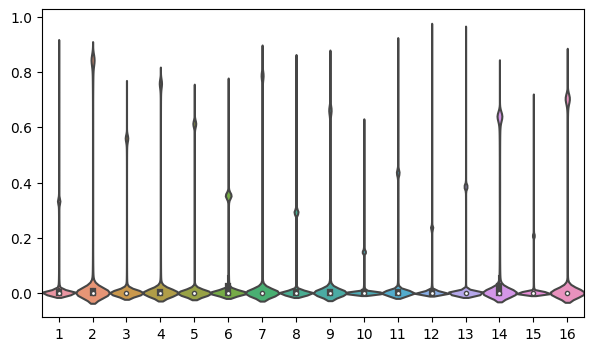

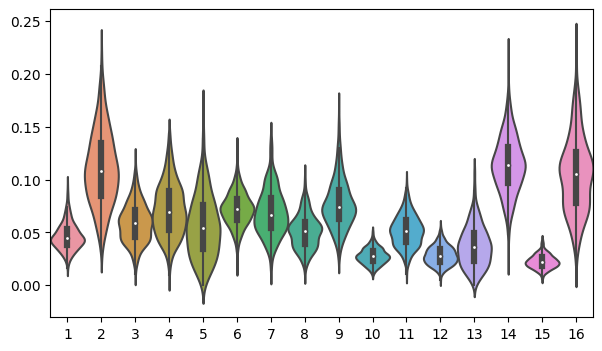

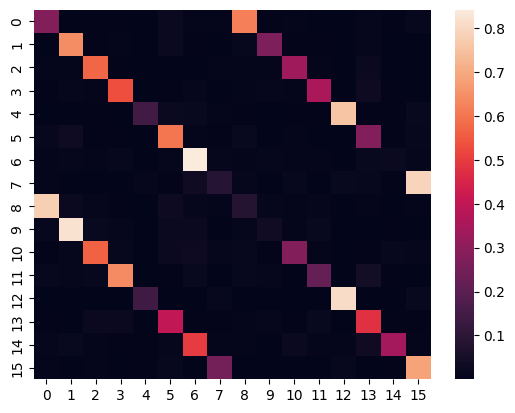

...

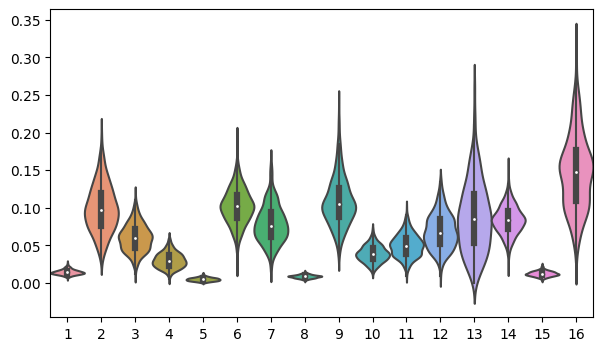

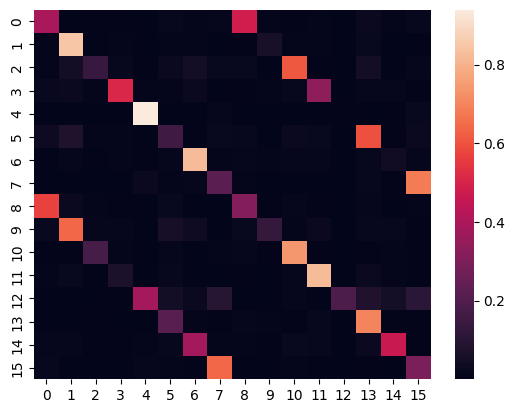

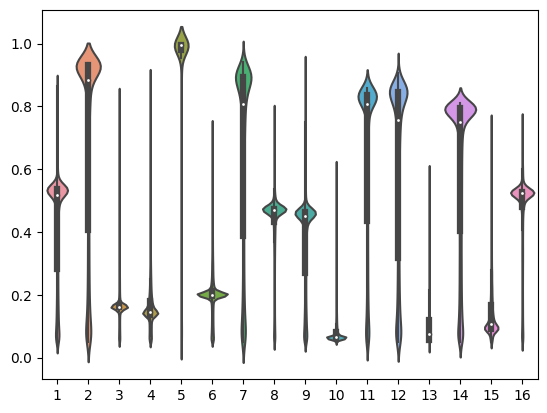

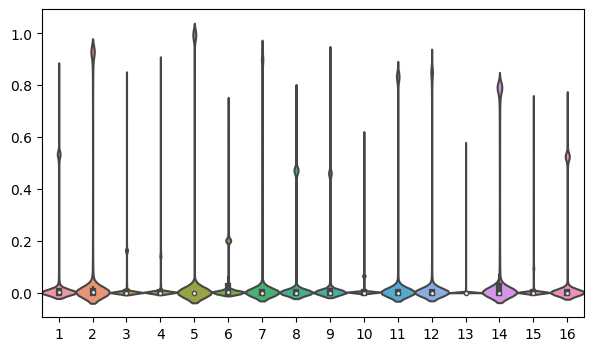

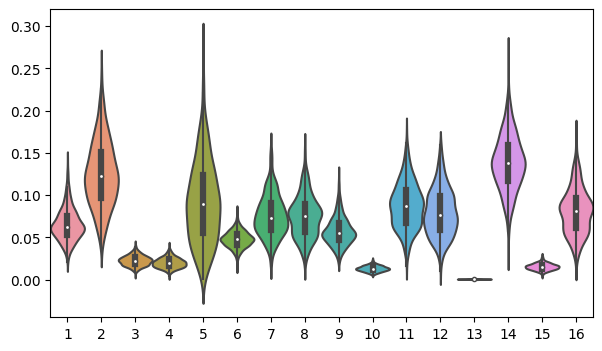

In [26]:
for repeat in repeats:
    tpm = np.load(f'{save_dir}{repeat}/model/trans_prob.npy')
    #fig,ax = plot_matrices(tpm)  
    seaborn.heatmap(tpm)
    plt.show()
    
    with open(f'{save_dir}{repeat}/inf_params/alp.pkl','rb') as file:
        alpha = pickle.load(file)
        
    fo = fractional_occupancies(alpha)
    
    alpha_plot = np.concatenate(alpha,axis=0).T
    
    x, y = [], []
    for i in range(len(alpha_plot)):
        alpha_state = alpha_plot[i]
        temp = alpha_state[alpha_state>0.05]
        x.append(np.ones(len(temp)) * (i+1))
        y.append(temp)
    
    x = np.concatenate(x,axis=0).astype(int)
    y = np.concatenate(y,axis=0)
    
    sns_kwargs = {'scale':'count','width': 1}
    sns.violinplot(x=x,y=y,**sns_kwargs)
    #np.concatenate(alpha,axis=0).T,fig_kwargs={'figsize': (10, 4)},sns_kwargs = {'scale':'count','width': 1})
    plt.show()
    
    fig,ax = plot_violin(alpha_plot,
                         #fig_kwargs={'figsize': (10, 4)},
                         sns_kwargs = {'scale':'count','width': 1})
    plt.show()
    
    fig,ax = plot_violin(fo.T,
                         #fig_kwargs={'figsize': (10, 4)},
                         sns_kwargs = {'scale':'count','width': 1})
    plt.show()
    
    


Conclusion: when states are "repeated", there are run-to-run variability in fractional occupancy. For example, you can see the state 5 and 13 has very different fo in the five runs.

Next, have a look at the temporal correlation of these states. Maybe have a look at repeat 2 and repeat 4 since state 5 is muted in repeat 2 while state 13 is muted in repeat 4.

In [96]:
from rotation.utils import calculate_temporal_correlation
from osl_dynamics.inference.modes import argmax_time_courses

In [97]:
with open(f'{save_dir}repeat_3/inf_params/alp.pkl','rb') as file:
    alpha_1 = pickle.load(file)
with open(f'{save_dir}repeat_4/inf_params/alp.pkl','rb') as file:
    alpha_2 = pickle.load(file)

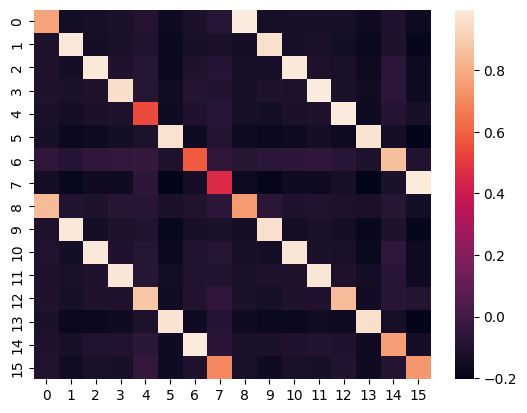

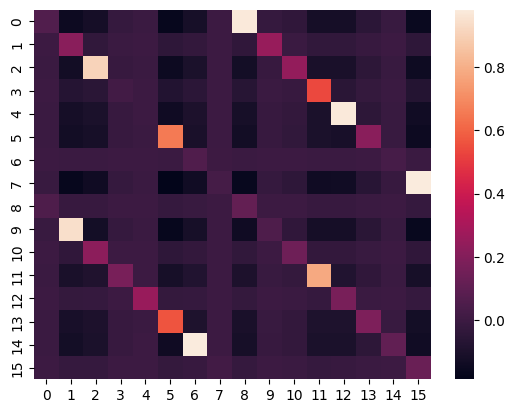

In [101]:
cor = calculate_temporal_correlation(alpha_1,alpha_2)
seaborn.heatmap(cor)
plt.show()
cor_argmax = calculate_temporal_correlation(argmax_time_courses(alpha_1),argmax_time_courses(alpha_2))
seaborn.heatmap(cor_argmax)
plt.show()

Conclusion: there is still decent correlation between state 5 and 13 in the temporal dynamics. It seems that when the model is very good, you can have run-to-run variability in fractional occupancy, but the temporal correlation is itself very high.
Fractional occupancy variability might be important.

## Question2: Is spatial correlation equivalent to temporal correlation 

Now let's work on the simulation data, where the covariance matrices are free to train. We are asking: is temporal correlation equivalent to spatial correlation? i.e. States are spatially paired should be temporally paired?

In [108]:
import os
import yaml
import pickle
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn

In [116]:
save_dir = './results_simulation_202403/sigma_0/'
N_states = list(range(2,17))
repeats = ['train','repeat_1','repeat_2','repeat_3','repeat_4','repeat_5']

First you need to extract the correlations.

In [117]:
from osl_dynamics.array_ops import cov2stdcorr

In [118]:
for N_state in N_states:
    for repeat in repeats:
        analysis_dir = f'{save_dir}hmm_ICA_25_state_{N_state}/{repeat}/analysis/'
        if not os.path.exists(analysis_dir):
            os.makedirs(analysis_dir)
        covs = np.load(f'{save_dir}hmm_ICA_25_state_{N_state}/{repeat}/inf_params/covs.npy')
        np.save(f'{analysis_dir}covs.npy',covs)
        stds,corrs =cov2stdcorr(covs)
        np.save(f'{analysis_dir}stds.npy',stds)
        np.save(f'{analysis_dir}corrs.npy',corrs)

In [119]:
from osl_dynamics.inference.metrics import twopair_fisher_z_correlations
from osl_dynamics.inference.modes import hungarian_pair
from osl_dynamics.utils.plotting import plot_mode_pairing

In [120]:
for N_state in N_states:
    analysis_dir = f'{save_dir}hmm_ICA_25_state_{N_state}/analysis/'
    if not os.path.exists(analysis_dir):
        os.makedirs(analysis_dir)
    for i in range(len(repeats)):
        for j in range(i+1,len(repeats)):
            corrs_1 = np.load(f'{save_dir}hmm_ICA_25_state_{N_state}/{repeats[i]}/analysis/corrs.npy')
            corrs_2 = np.load(f'{save_dir}hmm_ICA_25_state_{N_state}/{repeats[j]}/analysis/corrs.npy')
            indices, cor = hungarian_pair(twopair_fisher_z_correlations(corrs_1,corrs_2),distance=False)
            np.save(f'{analysis_dir}spatial_cor_{repeats[i]}_vs_{repeats[j]}.npy',cor)
            indices['mean'] = np.mean(np.diagonal(cor))
            # Open the file in binary write mode
            with open(f'{analysis_dir}spatial_pair_{repeats[i]}_vs_{repeats[j]}.pkl', "wb") as f:
                pickle.dump(indices, f)
            plot_mode_pairing(cor,
                              indices,
                              x_label=repeats[j],
                              y_label=repeats[i],
                              title=f'Spatial correlation {repeats[i]} vs {repeats[j]}',
                              filename=f'{analysis_dir}spatial_cor_{repeats[i]}_vs_{repeats[j]}.jpg')

Compute twopair Fisher-z transformated correlation: 100%|█| 2/2 [00:00<00:00, 16
2024-03-08 16:08:26 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_2/analysis/spatial_cor_train_vs_repeat_1.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 2/2 [00:00<00:00, 10
2024-03-08 16:08:26 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_2/analysis/spatial_cor_train_vs_repeat_2.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 2/2 [00:00<00:00, 10
2024-03-08 16:08:27 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_2/analysis/spatial_cor_train_vs_repeat_3.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 2/2 [00:00<00:00, 10
2024-03-08 16:08:27 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_2/analysis/spatial_cor_train_vs_repeat_4.jpg
Compute 

Compute twopair Fisher-z transformated correlation: 100%|█| 4/4 [00:00<00:00, 91
2024-03-08 16:08:32 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_4/analysis/spatial_cor_train_vs_repeat_4.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 4/4 [00:00<00:00, 88
2024-03-08 16:08:32 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_4/analysis/spatial_cor_train_vs_repeat_5.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 4/4 [00:00<00:00, 78
2024-03-08 16:08:32 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_4/analysis/spatial_cor_repeat_1_vs_repeat_2.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 4/4 [00:00<00:00, 99
2024-03-08 16:08:32 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_4/analysis/spatial_cor_repeat_1_vs_repeat_3.jpg
Co

Compute twopair Fisher-z transformated correlation: 100%|█| 6/6 [00:00<00:00, 86
2024-03-08 16:08:39 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_6/analysis/spatial_cor_repeat_1_vs_repeat_3.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 6/6 [00:00<00:00, 85
2024-03-08 16:08:39 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_6/analysis/spatial_cor_repeat_1_vs_repeat_4.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 6/6 [00:00<00:00, 97
2024-03-08 16:08:39 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_6/analysis/spatial_cor_repeat_1_vs_repeat_5.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 6/6 [00:00<00:00, 98
2024-03-08 16:08:39 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_6/analysis/spatial_cor_repeat_2_vs_repeat_3.

Compute twopair Fisher-z transformated correlation: 100%|█| 8/8 [00:00<00:00, 73
2024-03-08 16:08:44 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_8/analysis/spatial_cor_repeat_2_vs_repeat_3.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 8/8 [00:00<00:00, 69
2024-03-08 16:08:44 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_8/analysis/spatial_cor_repeat_2_vs_repeat_4.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 8/8 [00:00<00:00, 77
2024-03-08 16:08:44 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_8/analysis/spatial_cor_repeat_2_vs_repeat_5.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 8/8 [00:00<00:00, 77
2024-03-08 16:08:44 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_8/analysis/spatial_cor_repeat_3_vs_repeat_4.

Compute twopair Fisher-z transformated correlation: 100%|█| 10/10 [00:00<00:00, 
2024-03-08 16:08:50 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_10/analysis/spatial_cor_repeat_3_vs_repeat_4.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 10/10 [00:00<00:00, 
2024-03-08 16:08:50 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_10/analysis/spatial_cor_repeat_3_vs_repeat_5.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 10/10 [00:00<00:00, 
2024-03-08 16:08:50 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_10/analysis/spatial_cor_repeat_4_vs_repeat_5.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 11/11 [00:00<00:00, 
2024-03-08 16:08:50 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_11/analysis/spatial_cor_train_vs_repeat_1

Compute twopair Fisher-z transformated correlation: 100%|█| 13/13 [00:00<00:00, 
2024-03-08 16:08:57 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_13/analysis/spatial_cor_train_vs_repeat_1.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 13/13 [00:00<00:00, 
2024-03-08 16:08:57 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_13/analysis/spatial_cor_train_vs_repeat_2.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 13/13 [00:00<00:00, 
2024-03-08 16:08:57 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_13/analysis/spatial_cor_train_vs_repeat_3.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 13/13 [00:00<00:00, 
2024-03-08 16:08:57 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_13/analysis/spatial_cor_train_vs_repeat_4.jpg
Comp

Compute twopair Fisher-z transformated correlation: 100%|█| 15/15 [00:00<00:00, 
2024-03-08 16:09:04 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_15/analysis/spatial_cor_train_vs_repeat_4.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 15/15 [00:00<00:00, 
2024-03-08 16:09:04 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_15/analysis/spatial_cor_train_vs_repeat_5.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 15/15 [00:00<00:00, 
2024-03-08 16:09:04 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_15/analysis/spatial_cor_repeat_1_vs_repeat_2.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 15/15 [00:00<00:00, 
2024-03-08 16:09:04 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_15/analysis/spatial_cor_repeat_1_vs_repeat_3.jp

Spatial mapping has been finished. Now let's work on the temporal mapping

In [122]:
import pickle
from osl_dynamics.inference.metrics import alpha_correlation

In [123]:
for N_state in N_states:
    analysis_dir = f'{save_dir}hmm_ICA_25_state_{N_state}/analysis/'
    if not os.path.exists(analysis_dir):
        os.makedirs(analysis_dir)
    for i in range(len(repeats)):
        for j in range(i+1,len(repeats)):
            with open(f'{save_dir}hmm_ICA_25_state_{N_state}/{repeats[i]}/inf_params/alp.pkl','rb') as file:
                alpha_1 = pickle.load(file)
            with open(f'{save_dir}hmm_ICA_25_state_{N_state}/{repeats[j]}/inf_params/alp.pkl','rb') as file:
                alpha_2 = pickle.load(file)
            indices, cor = hungarian_pair(alpha_correlation(alpha_1,alpha_2,return_diagonal=False),distance=False)
            np.save(f'{analysis_dir}temp_cor_{repeats[i]}_vs_{repeats[j]}.npy',cor)
            indices['mean'] = np.mean(np.diagonal(cor))
            # Open the file in binary write mode
            with open(f'{analysis_dir}temp_pair_{repeats[i]}_vs_{repeats[j]}.pkl', "wb") as f:
                pickle.dump(indices, f)
            plot_mode_pairing(cor,
                              indices,
                              x_label=repeats[j],
                              y_label=repeats[i],
                              title=f'Temporal correlation {repeats[i]} vs {repeats[j]}',
                              filename=f'{analysis_dir}temp_cor_{repeats[i]}_vs_{repeats[j]}.jpg')
            
            indices_argmax, cor_argmax = hungarian_pair(alpha_correlation(argmax_time_courses(alpha_1),argmax_time_courses(alpha_2),return_diagonal=False),distance=False)
            np.save(f'{analysis_dir}temp_argmax_cor_{repeats[i]}_vs_{repeats[j]}.npy',cor_argmax)
            indices_argmax['mean'] = np.mean(np.diagonal(cor_argmax))
            # Open the file in binary write mode
            with open(f'{analysis_dir}temp_argmax_pair_{repeats[i]}_vs_{repeats[j]}.pkl', "wb") as f:
                pickle.dump(indices_argmax, f)
            plot_mode_pairing(cor_argmax,
                              indices_argmax,
                              x_label=repeats[j],
                              y_label=repeats[i],
                              title=f'Temporal argmax correlation {repeats[i]} vs {repeats[j]}',
                              filename=f'{analysis_dir}temp_argmax_cor_{repeats[i]}_vs_{repeats[j]}.jpg')

2024-03-08 16:09:10 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_2/analysis/temp_cor_train_vs_repeat_1.jpg
2024-03-08 16:09:11 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_2/analysis/temp_argmax_cor_train_vs_repeat_1.jpg
2024-03-08 16:09:11 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_2/analysis/temp_cor_train_vs_repeat_2.jpg
2024-03-08 16:09:11 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_2/analysis/temp_argmax_cor_train_vs_repeat_2.jpg
2024-03-08 16:09:11 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_2/analysis/temp_cor_train_vs_repeat_3.jpg
2024-03-08 16:09:11 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_2/analysis/temp_argmax_cor_train_vs_repeat_3

2024-03-08 16:09:19 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_3/analysis/temp_argmax_cor_repeat_2_vs_repeat_3.jpg
2024-03-08 16:09:19 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_3/analysis/temp_cor_repeat_2_vs_repeat_4.jpg
2024-03-08 16:09:21 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_3/analysis/temp_argmax_cor_repeat_2_vs_repeat_4.jpg
2024-03-08 16:09:21 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_3/analysis/temp_cor_repeat_2_vs_repeat_5.jpg
2024-03-08 16:09:21 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_3/analysis/temp_argmax_cor_repeat_2_vs_repeat_5.jpg
2024-03-08 16:09:21 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_3/analysis/temp_cor_re

2024-03-08 16:09:31 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_5/analysis/temp_cor_train_vs_repeat_5.jpg
2024-03-08 16:09:31 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_5/analysis/temp_argmax_cor_train_vs_repeat_5.jpg
2024-03-08 16:09:31 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_5/analysis/temp_cor_repeat_1_vs_repeat_2.jpg
2024-03-08 16:09:32 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_5/analysis/temp_argmax_cor_repeat_1_vs_repeat_2.jpg
2024-03-08 16:09:32 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_5/analysis/temp_cor_repeat_1_vs_repeat_3.jpg
2024-03-08 16:09:32 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_5/analysis/temp_argmax_cor_repeat_1

2024-03-08 16:09:43 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_6/analysis/temp_argmax_cor_repeat_3_vs_repeat_5.jpg
2024-03-08 16:09:43 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_6/analysis/temp_cor_repeat_4_vs_repeat_5.jpg
2024-03-08 16:09:43 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_6/analysis/temp_argmax_cor_repeat_4_vs_repeat_5.jpg
2024-03-08 16:09:44 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_7/analysis/temp_cor_train_vs_repeat_1.jpg
2024-03-08 16:09:44 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_7/analysis/temp_argmax_cor_train_vs_repeat_1.jpg
2024-03-08 16:09:44 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_7/analysis/temp_cor_train_vs

2024-03-08 16:09:57 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_8/analysis/temp_cor_repeat_1_vs_repeat_5.jpg
2024-03-08 16:09:57 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_8/analysis/temp_argmax_cor_repeat_1_vs_repeat_5.jpg
2024-03-08 16:09:58 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_8/analysis/temp_cor_repeat_2_vs_repeat_3.jpg
2024-03-08 16:09:58 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_8/analysis/temp_argmax_cor_repeat_2_vs_repeat_3.jpg
2024-03-08 16:09:58 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_8/analysis/temp_cor_repeat_2_vs_repeat_4.jpg
2024-03-08 16:09:59 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_8/analysis/temp_argmax_cor_re

2024-03-08 16:10:14 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_10/analysis/temp_argmax_cor_train_vs_repeat_3.jpg
2024-03-08 16:10:14 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_10/analysis/temp_cor_train_vs_repeat_4.jpg
2024-03-08 16:10:15 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_10/analysis/temp_argmax_cor_train_vs_repeat_4.jpg
2024-03-08 16:10:15 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_10/analysis/temp_cor_train_vs_repeat_5.jpg
2024-03-08 16:10:15 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_10/analysis/temp_argmax_cor_train_vs_repeat_5.jpg
2024-03-08 16:10:16 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_10/analysis/temp_cor_repeat_1_vs

2024-03-08 16:10:32 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_11/analysis/temp_cor_repeat_3_vs_repeat_4.jpg
2024-03-08 16:10:33 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_11/analysis/temp_argmax_cor_repeat_3_vs_repeat_4.jpg
2024-03-08 16:10:33 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_11/analysis/temp_cor_repeat_3_vs_repeat_5.jpg
2024-03-08 16:10:33 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_11/analysis/temp_argmax_cor_repeat_3_vs_repeat_5.jpg
2024-03-08 16:10:34 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_11/analysis/temp_cor_repeat_4_vs_repeat_5.jpg
2024-03-08 16:10:34 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_11/analysis/temp_argmax_

2024-03-08 16:10:53 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_13/analysis/temp_argmax_cor_repeat_1_vs_repeat_3.jpg
2024-03-08 16:10:54 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_13/analysis/temp_cor_repeat_1_vs_repeat_4.jpg
2024-03-08 16:10:54 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_13/analysis/temp_argmax_cor_repeat_1_vs_repeat_4.jpg
2024-03-08 16:10:54 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_13/analysis/temp_cor_repeat_1_vs_repeat_5.jpg
2024-03-08 16:10:55 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_13/analysis/temp_argmax_cor_repeat_1_vs_repeat_5.jpg
2024-03-08 16:10:55 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_13/analysis/temp_

2024-03-08 16:11:15 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_15/analysis/temp_argmax_cor_train_vs_repeat_1.jpg
2024-03-08 16:11:16 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_15/analysis/temp_cor_train_vs_repeat_2.jpg
2024-03-08 16:11:17 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_15/analysis/temp_argmax_cor_train_vs_repeat_2.jpg
2024-03-08 16:11:17 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_15/analysis/temp_cor_train_vs_repeat_3.jpg
2024-03-08 16:11:18 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_15/analysis/temp_argmax_cor_train_vs_repeat_3.jpg
2024-03-08 16:11:18 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_15/analysis/temp_cor_train_vs_re

2024-03-08 16:11:40 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_16/analysis/temp_cor_repeat_2_vs_repeat_4.jpg
2024-03-08 16:11:41 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_16/analysis/temp_argmax_cor_repeat_2_vs_repeat_4.jpg
2024-03-08 16:11:41 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_16/analysis/temp_cor_repeat_2_vs_repeat_5.jpg
2024-03-08 16:11:42 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_16/analysis/temp_argmax_cor_repeat_2_vs_repeat_5.jpg
2024-03-08 16:11:42 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_16/analysis/temp_cor_repeat_3_vs_repeat_4.jpg
2024-03-08 16:11:43 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_202403/sigma_0/hmm_ICA_25_state_16/analysis/temp_argmax_

Looking at the case on simulation data when N_states = 16. There are at least two claims we can obtain:
- Spatial pairing is very similar to temporal pairing, but not necessarily the same.
- Poor spatial pairing does not damage the mean diagonal value too much, but this is not the case if we calculate temporal pairing.

Hypothesis: Temporal pairing correlation is more sensitive to the optimal number of states.
This holds at least on simulation data. And you do not even need to "split-half". Train multiple models on the same dataset is enough.

In [124]:
save_dir = './results_simulation_202403/sigma_0/'
N_states = list(range(2,17))
repeats = ['train','repeat_1','repeat_2','repeat_3','repeat_4','repeat_5']

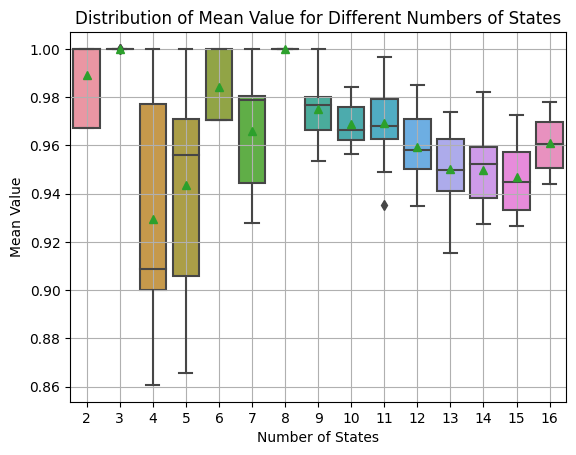

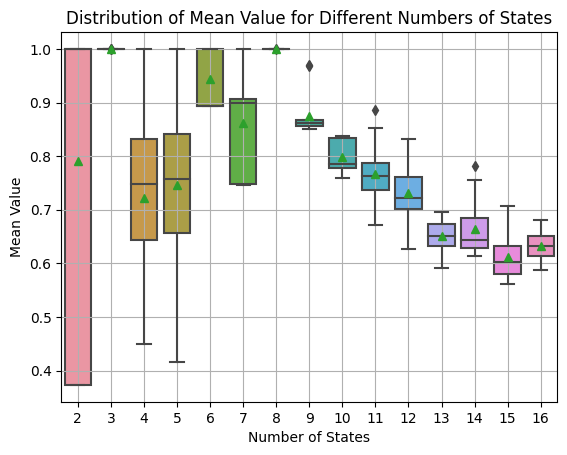

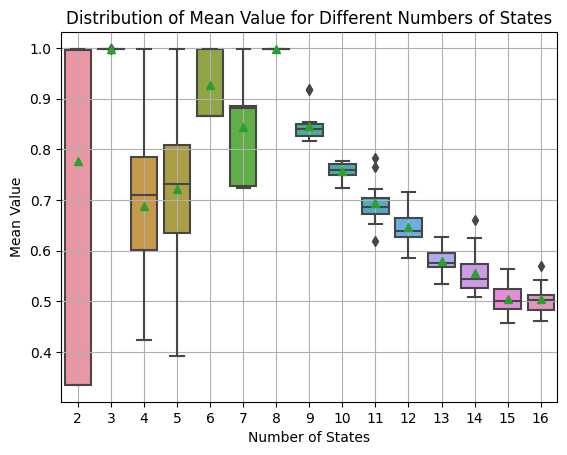

In [125]:
import seaborn as sns

summary_dir = f'{save_dir}summary/'
if not os.path.exists(summary_dir):
    os.makedirs(summary_dir)

for metric in ['spatial','temp','temp_argmax']:
    # Initialize a dictionary to store mean values for each number of states
    mean_values_dict = {N_state: [] for N_state in N_states}

    # Loop through each value of N_states
    for N_state in N_states:
        # Loop through each pair of repeats
        for i in range(len(repeats)):
            for j in range(i + 1, len(repeats)):
                # Define the path to the pickle file
                file_path = os.path.join(save_dir, f'hmm_ICA_25_state_{N_state}/analysis/{metric}_pair_{repeats[i]}_vs_{repeats[j]}.pkl')
                # Load the pickle file
                with open(file_path, 'rb') as f:
                    data = pickle.load(f)
                # Extract the 'mean' value and append it to the dictionary
                mean_value = data['mean']
                mean_values_dict[N_state].append(mean_value)

    # Plot boxplots of the mean values for each number of states
    sns.boxplot(data=list(mean_values_dict.values()), showmeans=True)
    plt.xlabel('Number of States')
    plt.ylabel('Mean Value')
    plt.title('Distribution of Mean Value for Different Numbers of States')
    plt.xticks(ticks=range(len(N_states)), labels=N_states)
    plt.grid(True)
    plt.show()

In [126]:
save_dir = './results_simulation_202403/sigma_0/'
N_states = list(range(2,17))
repeats = ['train','repeat_1','repeat_2','repeat_3','repeat_4','repeat_5']

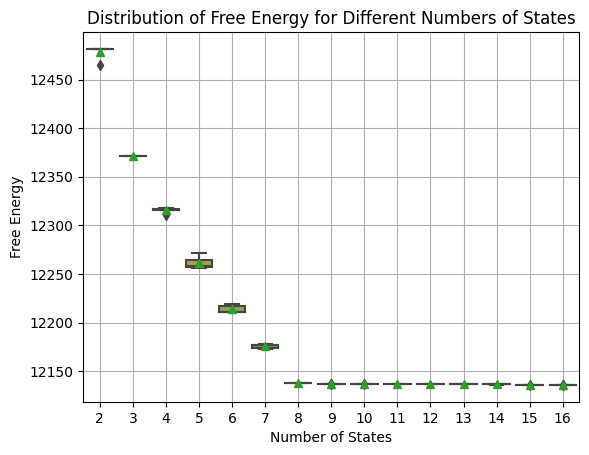

In [127]:
import json

# Initialize a dictionary to store free energy values for each number of states
free_energy_dict = {N_state: [] for N_state in N_states}

# Loop through each value of N_states
for N_state in N_states:
    # Loop through each repeat
    for repeat in repeats:
        # Define the path to the JSON file for the free energy
        file_path = os.path.join(save_dir, f'hmm_ICA_25_state_{N_state}/{repeat}/metrics/metrics.json')
        # Load the JSON file
        with open(file_path, 'r') as f:
            metrics = json.load(f)
        # Extract the 'free_energy' value and append it to the dictionary
        free_energy = metrics['free_energy']
        free_energy_dict[N_state].append(free_energy)

# Plot boxplots of the free energy values for each number of states
sns.boxplot(data=list(free_energy_dict.values()), showmeans=True)
plt.xlabel('Number of States')
plt.ylabel('Free Energy')
plt.title('Distribution of Free Energy for Different Numbers of States')
plt.xticks(ticks=range(len(N_states)), labels=N_states)
plt.grid(True)
plt.show()

In [35]:
save_dir = './results_simulation_202403/sigma_0/'
N_states = list(range(2,17))
repeats = ['train','repeat_1','repeat_2','repeat_3','repeat_4','repeat_5']

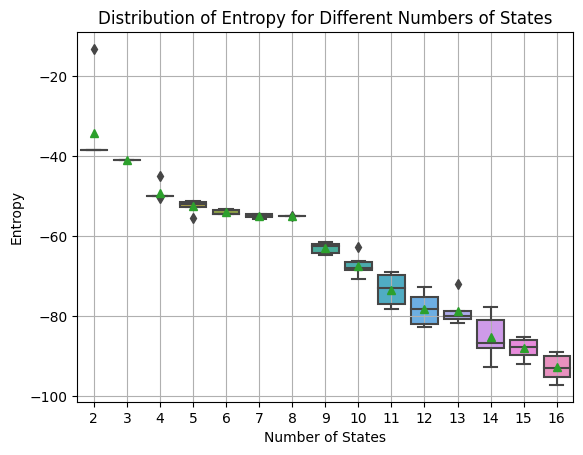

In [36]:
import json

# Initialize a dictionary to store free energy values for each number of states
entropy_dict = {N_state: [] for N_state in N_states}

# Loop through each value of N_states
for N_state in N_states:
    # Loop through each repeat
    for repeat in repeats:
        # Define the path to the JSON file for the free energy
        file_path = os.path.join(save_dir, f'hmm_ICA_25_state_{N_state}/{repeat}/metrics/metrics.json')
        # Load the JSON file
        with open(file_path, 'r') as f:
            metrics = json.load(f)
        # Extract the 'free_energy' value and append it to the dictionary
        entropy = metrics['entropy']
        entropy_dict[N_state].append(entropy)

# Plot boxplots of the free energy values for each number of states
sns.boxplot(data=list(entropy_dict.values()), showmeans=True)
plt.xlabel('Number of States')
plt.ylabel('Entropy')
plt.title('Distribution of Entropy for Different Numbers of States')
plt.xticks(ticks=range(len(N_states)), labels=N_states)
plt.grid(True)
plt.show()

In [39]:
save_dir = './results_simulation_202403/sigma_0/hmm_ICA_25_state_16/'
repeats = ['train','repeat_1','repeat_2','repeat_3','repeat_4','repeat_5']

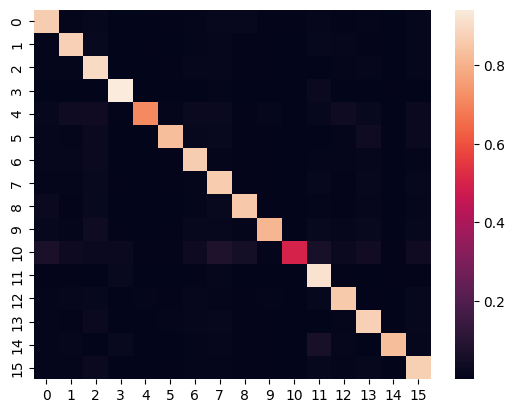

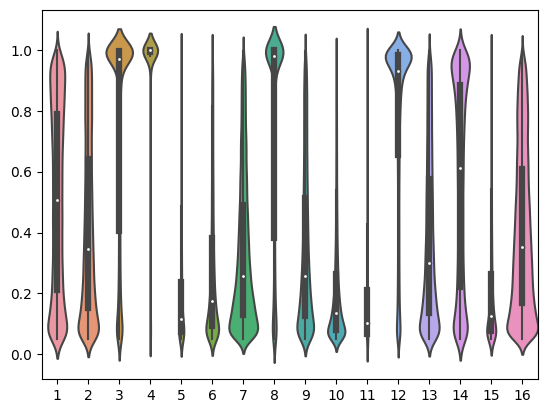

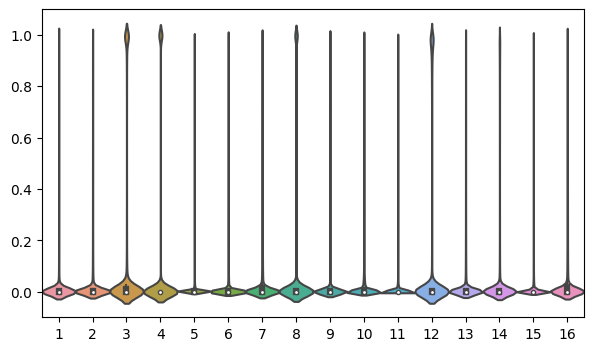

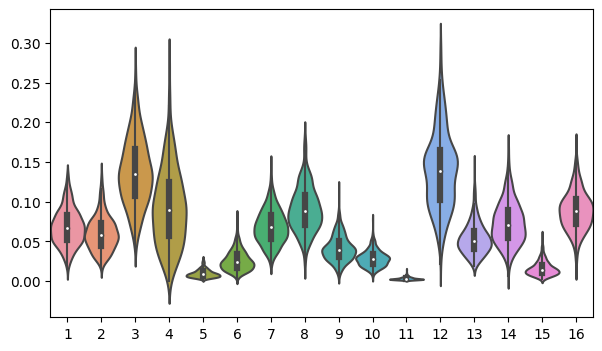

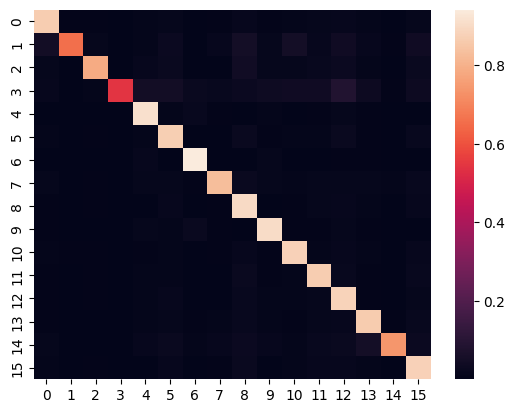

...

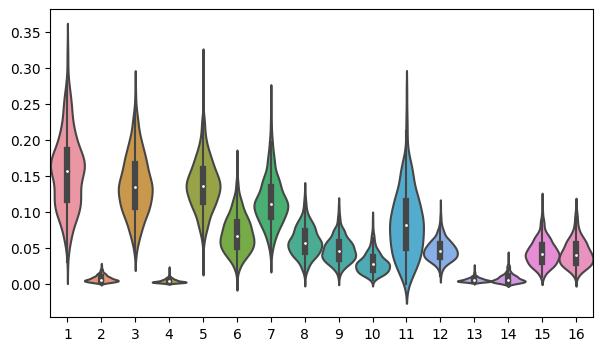

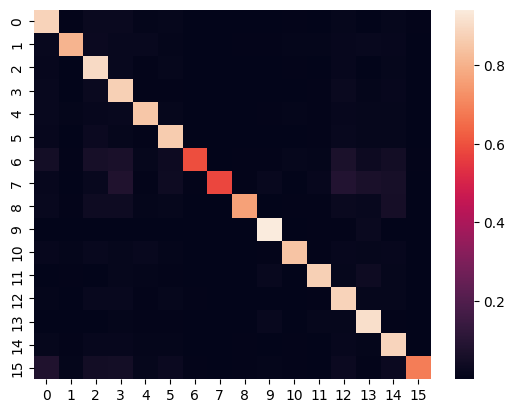

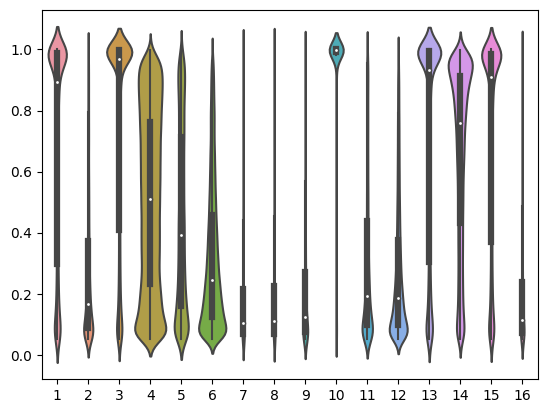

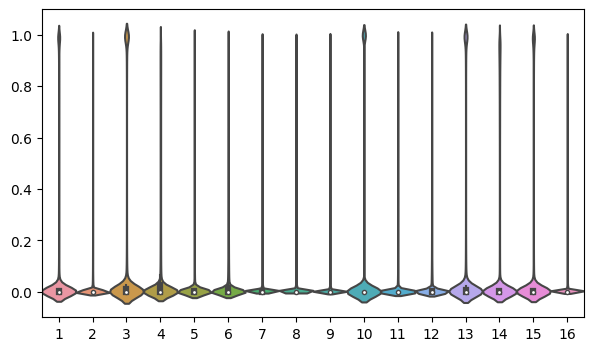

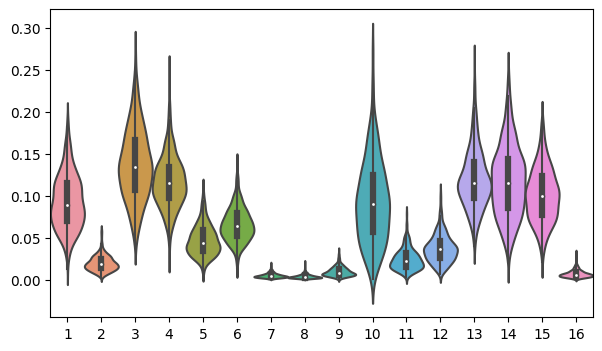

In [40]:
for repeat in repeats:
    tpm = np.load(f'{save_dir}{repeat}/model/trans_prob.npy')
    #fig,ax = plot_matrices(tpm)  
    seaborn.heatmap(tpm)
    plt.show()
    
    with open(f'{save_dir}{repeat}/inf_params/alp.pkl','rb') as file:
        alpha = pickle.load(file)
        
    fo = fractional_occupancies(alpha)
    
    alpha_plot = np.concatenate(alpha,axis=0).T
    
    x, y = [], []
    for i in range(len(alpha_plot)):
        alpha_state = alpha_plot[i]
        temp = alpha_state[alpha_state>0.05]
        x.append(np.ones(len(temp)) * (i+1))
        y.append(temp)
    
    x = np.concatenate(x,axis=0).astype(int)
    y = np.concatenate(y,axis=0)
    
    sns_kwargs = {'scale':'count','width': 1}
    sns.violinplot(x=x,y=y,**sns_kwargs)
    #np.concatenate(alpha,axis=0).T,fig_kwargs={'figsize': (10, 4)},sns_kwargs = {'scale':'count','width': 1})
    plt.show()
    
    fig,ax = plot_violin(alpha_plot,
                         #fig_kwargs={'figsize': (10, 4)},
                         sns_kwargs = {'scale':'count','width': 1})
    plt.show()
    
    fig,ax = plot_violin(fo.T,
                         #fig_kwargs={'figsize': (10, 4)},
                         sns_kwargs = {'scale':'count','width': 1})
    plt.show()

### Question 3: On real HCP data, what is the relationsihp between "spatial pairing" and "temporal pairing"

In [128]:
import os
import yaml
import pickle
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn

In [129]:
save_dir = './results_HCP_yaml_202403/'
N_states = list(range(2,37))
repeats = ['train','repeat_1','repeat_2','repeat_3','repeat_4','repeat_5']

In [130]:
from osl_dynamics.array_ops import cov2stdcorr

for N_state in N_states:
    for repeat in repeats:
        analysis_dir = f'{save_dir}hmm_ICA_25_state_{N_state}/{repeat}/analysis/'
        if not os.path.exists(analysis_dir):
            os.makedirs(analysis_dir)
        covs = np.load(f'{save_dir}hmm_ICA_25_state_{N_state}/{repeat}/inf_params/covs.npy')
        np.save(f'{analysis_dir}covs.npy',covs)
        stds,corrs =cov2stdcorr(covs)
        np.save(f'{analysis_dir}stds.npy',stds)
        np.save(f'{analysis_dir}corrs.npy',corrs)

In [146]:
from osl_dynamics.inference.metrics import twopair_fisher_z_correlations
from osl_dynamics.inference.modes import hungarian_pair
from osl_dynamics.utils.plotting import plot_mode_pairing

for N_state in N_states:
    analysis_dir = f'{save_dir}hmm_ICA_25_state_{N_state}/analysis/'
    if not os.path.exists(analysis_dir):
        os.makedirs(analysis_dir)
    for i in range(len(repeats)):
        for j in range(i+1,len(repeats)):
            corrs_1 = np.load(f'{save_dir}hmm_ICA_25_state_{N_state}/{repeats[i]}/analysis/corrs.npy')
            corrs_2 = np.load(f'{save_dir}hmm_ICA_25_state_{N_state}/{repeats[j]}/analysis/corrs.npy')
            indices, cor = hungarian_pair(twopair_fisher_z_correlations(corrs_1,corrs_2),distance=False)
            np.save(f'{analysis_dir}spatial_cor_{repeats[i]}_vs_{repeats[j]}.npy',cor)
            indices['mean'] = np.mean(np.diagonal(cor))
            # Open the file in binary write mode
            with open(f'{analysis_dir}spatial_pair_{repeats[i]}_vs_{repeats[j]}.pkl', "wb") as f:
                pickle.dump(indices, f)
            plot_mode_pairing(cor,
                              indices,
                              x_label=repeats[j],
                              y_label=repeats[i],
                              title=f'Spatial correlation {repeats[i]} vs {repeats[j]}',
                              filename=f'{analysis_dir}spatial_cor_{repeats[i]}_vs_{repeats[j]}.jpg')

Compute twopair Fisher-z transformated correlation: 100%|█| 2/2 [00:00<00:00, 16
2024-03-08 22:18:44 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_2/analysis/spatial_cor_train_vs_repeat_1.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 2/2 [00:00<00:00, 16
2024-03-08 22:18:44 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_2/analysis/spatial_cor_train_vs_repeat_2.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 2/2 [00:00<00:00, 16
2024-03-08 22:18:44 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_2/analysis/spatial_cor_train_vs_repeat_3.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 2/2 [00:00<00:00, 11
2024-03-08 22:18:44 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_2/analysis/spatial_cor_train_vs_repeat_4.jpg


Compute twopair Fisher-z transformated correlation: 100%|█| 4/4 [00:00<00:00, 11
2024-03-08 22:18:48 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_4/analysis/spatial_cor_train_vs_repeat_4.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 4/4 [00:00<00:00, 13
2024-03-08 22:18:48 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_4/analysis/spatial_cor_train_vs_repeat_5.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 4/4 [00:00<00:00, 13
2024-03-08 22:18:48 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_4/analysis/spatial_cor_repeat_1_vs_repeat_2.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 4/4 [00:00<00:00, 13
2024-03-08 22:18:48 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_4/analysis/spatial_cor_repeat_1_vs_repeat_

Compute twopair Fisher-z transformated correlation: 100%|█| 6/6 [00:00<00:00, 98
2024-03-08 22:18:52 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_6/analysis/spatial_cor_repeat_1_vs_repeat_3.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 6/6 [00:00<00:00, 92
2024-03-08 22:18:52 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_6/analysis/spatial_cor_repeat_1_vs_repeat_4.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 6/6 [00:00<00:00, 83
2024-03-08 22:18:52 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_6/analysis/spatial_cor_repeat_1_vs_repeat_5.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 6/6 [00:00<00:00, 87
2024-03-08 22:18:52 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_6/analysis/spatial_cor_repeat_2_vs_r

Compute twopair Fisher-z transformated correlation: 100%|█| 8/8 [00:00<00:00, 74
2024-03-08 22:19:04 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_8/analysis/spatial_cor_repeat_2_vs_repeat_3.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 8/8 [00:00<00:00, 74
2024-03-08 22:19:04 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_8/analysis/spatial_cor_repeat_2_vs_repeat_4.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 8/8 [00:00<00:00, 59
2024-03-08 22:19:04 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_8/analysis/spatial_cor_repeat_2_vs_repeat_5.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 8/8 [00:00<00:00, 74
2024-03-08 22:19:04 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_8/analysis/spatial_cor_repeat_3_vs_r

Compute twopair Fisher-z transformated correlation: 100%|█| 10/10 [00:00<00:00, 
2024-03-08 22:19:09 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_10/analysis/spatial_cor_repeat_3_vs_repeat_4.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 10/10 [00:00<00:00, 
2024-03-08 22:19:09 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_10/analysis/spatial_cor_repeat_3_vs_repeat_5.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 10/10 [00:00<00:00, 
2024-03-08 22:19:10 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_10/analysis/spatial_cor_repeat_4_vs_repeat_5.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 11/11 [00:00<00:00, 
2024-03-08 22:19:10 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_11/analysis/spatial_cor_train_vs_

Compute twopair Fisher-z transformated correlation: 100%|█| 13/13 [00:00<00:00, 
2024-03-08 22:19:17 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_13/analysis/spatial_cor_train_vs_repeat_1.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 13/13 [00:00<00:00, 
2024-03-08 22:19:17 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_13/analysis/spatial_cor_train_vs_repeat_2.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 13/13 [00:00<00:00, 
2024-03-08 22:19:17 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_13/analysis/spatial_cor_train_vs_repeat_3.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 13/13 [00:00<00:00, 
2024-03-08 22:19:17 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_13/analysis/spatial_cor_train_vs_repeat_4.

Compute twopair Fisher-z transformated correlation: 100%|█| 15/15 [00:00<00:00, 
2024-03-08 22:19:24 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_15/analysis/spatial_cor_train_vs_repeat_4.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 15/15 [00:00<00:00, 
2024-03-08 22:19:24 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_15/analysis/spatial_cor_train_vs_repeat_5.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 15/15 [00:00<00:00, 
2024-03-08 22:19:25 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_15/analysis/spatial_cor_repeat_1_vs_repeat_2.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 15/15 [00:00<00:00, 
2024-03-08 22:19:25 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_15/analysis/spatial_cor_repeat_1_vs_rep

Compute twopair Fisher-z transformated correlation: 100%|█| 17/17 [00:00<00:00, 
2024-03-08 22:19:32 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_17/analysis/spatial_cor_repeat_1_vs_repeat_3.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 17/17 [00:00<00:00, 
2024-03-08 22:19:32 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_17/analysis/spatial_cor_repeat_1_vs_repeat_4.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 17/17 [00:00<00:00, 
2024-03-08 22:19:33 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_17/analysis/spatial_cor_repeat_1_vs_repeat_5.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 17/17 [00:00<00:00, 
2024-03-08 22:19:33 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_17/analysis/spatial_cor_repeat_2_

Compute twopair Fisher-z transformated correlation: 100%|█| 19/19 [00:00<00:00, 
2024-03-08 22:19:42 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_19/analysis/spatial_cor_repeat_2_vs_repeat_3.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 19/19 [00:00<00:00, 
2024-03-08 22:19:43 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_19/analysis/spatial_cor_repeat_2_vs_repeat_4.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 19/19 [00:00<00:00, 
2024-03-08 22:19:43 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_19/analysis/spatial_cor_repeat_2_vs_repeat_5.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 19/19 [00:00<00:00, 
2024-03-08 22:19:43 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_19/analysis/spatial_cor_repeat_3_

Compute twopair Fisher-z transformated correlation: 100%|█| 21/21 [00:00<00:00, 
2024-03-08 22:19:53 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_21/analysis/spatial_cor_repeat_3_vs_repeat_4.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 21/21 [00:00<00:00, 
2024-03-08 22:19:53 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_21/analysis/spatial_cor_repeat_3_vs_repeat_5.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 21/21 [00:00<00:00, 
2024-03-08 22:19:54 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_21/analysis/spatial_cor_repeat_4_vs_repeat_5.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 22/22 [00:00<00:00, 
2024-03-08 22:19:55 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_22/analysis/spatial_cor_train_vs_

Compute twopair Fisher-z transformated correlation: 100%|█| 24/24 [00:00<00:00, 
2024-03-08 22:20:05 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_24/analysis/spatial_cor_train_vs_repeat_1.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 24/24 [00:00<00:00, 
2024-03-08 22:20:05 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_24/analysis/spatial_cor_train_vs_repeat_2.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 24/24 [00:00<00:00, 
2024-03-08 22:20:06 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_24/analysis/spatial_cor_train_vs_repeat_3.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 24/24 [00:00<00:00, 
2024-03-08 22:20:06 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_24/analysis/spatial_cor_train_vs_repeat_4.

Compute twopair Fisher-z transformated correlation: 100%|█| 26/26 [00:00<00:00, 
2024-03-08 22:20:17 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_26/analysis/spatial_cor_train_vs_repeat_4.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 26/26 [00:00<00:00, 
2024-03-08 22:20:17 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_26/analysis/spatial_cor_train_vs_repeat_5.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 26/26 [00:00<00:00, 
2024-03-08 22:20:18 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_26/analysis/spatial_cor_repeat_1_vs_repeat_2.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 26/26 [00:00<00:00, 
2024-03-08 22:20:19 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_26/analysis/spatial_cor_repeat_1_vs_rep

Compute twopair Fisher-z transformated correlation: 100%|█| 28/28 [00:00<00:00, 
2024-03-08 22:20:32 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_28/analysis/spatial_cor_repeat_1_vs_repeat_3.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 28/28 [00:00<00:00, 
2024-03-08 22:20:32 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_28/analysis/spatial_cor_repeat_1_vs_repeat_4.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 28/28 [00:00<00:00, 
2024-03-08 22:20:33 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_28/analysis/spatial_cor_repeat_1_vs_repeat_5.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 28/28 [00:00<00:00, 
2024-03-08 22:20:33 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_28/analysis/spatial_cor_repeat_2_

Compute twopair Fisher-z transformated correlation: 100%|█| 30/30 [00:00<00:00, 
2024-03-08 22:20:47 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_30/analysis/spatial_cor_repeat_2_vs_repeat_3.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 30/30 [00:00<00:00, 
2024-03-08 22:20:48 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_30/analysis/spatial_cor_repeat_2_vs_repeat_4.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 30/30 [00:00<00:00, 
2024-03-08 22:20:49 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_30/analysis/spatial_cor_repeat_2_vs_repeat_5.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 30/30 [00:00<00:00, 
2024-03-08 22:20:49 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_30/analysis/spatial_cor_repeat_3_

Compute twopair Fisher-z transformated correlation: 100%|█| 32/32 [00:00<00:00, 
2024-03-08 22:21:06 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_32/analysis/spatial_cor_repeat_3_vs_repeat_4.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 32/32 [00:00<00:00, 
2024-03-08 22:21:06 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_32/analysis/spatial_cor_repeat_3_vs_repeat_5.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 32/32 [00:00<00:00, 
2024-03-08 22:21:07 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_32/analysis/spatial_cor_repeat_4_vs_repeat_5.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 33/33 [00:00<00:00, 
2024-03-08 22:21:07 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_33/analysis/spatial_cor_train_vs_

Compute twopair Fisher-z transformated correlation: 100%|█| 35/35 [00:00<00:00, 
2024-03-08 22:21:22 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_35/analysis/spatial_cor_train_vs_repeat_1.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 35/35 [00:00<00:00, 
2024-03-08 22:21:22 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_35/analysis/spatial_cor_train_vs_repeat_2.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 35/35 [00:00<00:00, 
2024-03-08 22:21:23 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_35/analysis/spatial_cor_train_vs_repeat_3.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 35/35 [00:00<00:00, 
2024-03-08 22:21:23 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_40/hmm_ICA_25_state_35/analysis/spatial_cor_train_vs_repeat_4.

In [132]:
import pickle
from osl_dynamics.inference.metrics import alpha_correlation

for N_state in N_states:
    analysis_dir = f'{save_dir}hmm_ICA_25_state_{N_state}/analysis/'
    if not os.path.exists(analysis_dir):
        os.makedirs(analysis_dir)
    for i in range(len(repeats)):
        for j in range(i+1,len(repeats)):
            with open(f'{save_dir}hmm_ICA_25_state_{N_state}/{repeats[i]}/inf_params/alp.pkl','rb') as file:
                alpha_1 = pickle.load(file)
            with open(f'{save_dir}hmm_ICA_25_state_{N_state}/{repeats[j]}/inf_params/alp.pkl','rb') as file:
                alpha_2 = pickle.load(file)
            indices, cor = hungarian_pair(alpha_correlation(alpha_1,alpha_2,return_diagonal=False),distance=False)
            np.save(f'{analysis_dir}temp_cor_{repeats[i]}_vs_{repeats[j]}.npy',cor)
            indices['mean'] = np.mean(np.diagonal(cor))
            # Open the file in binary write mode
            with open(f'{analysis_dir}temp_pair_{repeats[i]}_vs_{repeats[j]}.pkl', "wb") as f:
                pickle.dump(indices, f)
            plot_mode_pairing(cor,
                              indices,
                              x_label=repeats[j],
                              y_label=repeats[i],
                              title=f'Temporal correlation {repeats[i]} vs {repeats[j]}',
                              filename=f'{analysis_dir}temp_cor_{repeats[i]}_vs_{repeats[j]}.jpg')
            
            indices_argmax, cor_argmax = hungarian_pair(alpha_correlation(argmax_time_courses(alpha_1),argmax_time_courses(alpha_2),return_diagonal=False),distance=False)
            np.save(f'{analysis_dir}temp_argmax_cor_{repeats[i]}_vs_{repeats[j]}.npy',cor_argmax)
            indices_argmax['mean'] = np.mean(np.diagonal(cor_argmax))
            # Open the file in binary write mode
            with open(f'{analysis_dir}temp_argmax_pair_{repeats[i]}_vs_{repeats[j]}.pkl', "wb") as f:
                pickle.dump(indices_argmax, f)
            plot_mode_pairing(cor_argmax,
                              indices_argmax,
                              x_label=repeats[j],
                              y_label=repeats[i],
                              title=f'Temporal argmax correlation {repeats[i]} vs {repeats[j]}',
                              filename=f'{analysis_dir}temp_argmax_cor_{repeats[i]}_vs_{repeats[j]}.jpg')

2024-03-08 16:17:31 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_2/analysis/temp_cor_train_vs_repeat_1.jpg
2024-03-08 16:17:31 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_2/analysis/temp_argmax_cor_train_vs_repeat_1.jpg
2024-03-08 16:17:32 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_2/analysis/temp_cor_train_vs_repeat_2.jpg
2024-03-08 16:17:32 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_2/analysis/temp_argmax_cor_train_vs_repeat_2.jpg
2024-03-08 16:17:32 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_2/analysis/temp_cor_train_vs_repeat_3.jpg
2024-03-08 16:17:32 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_2/analysis/temp_argmax_cor_train_vs_repeat_3.jpg
2024-03-08 16:17:33 INFO osl-dynamics [plotting.py:103:

2024-03-08 16:17:47 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_3/analysis/temp_cor_repeat_2_vs_repeat_5.jpg
2024-03-08 16:17:47 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_3/analysis/temp_argmax_cor_repeat_2_vs_repeat_5.jpg
2024-03-08 16:17:47 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_3/analysis/temp_cor_repeat_3_vs_repeat_4.jpg
2024-03-08 16:17:47 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_3/analysis/temp_argmax_cor_repeat_3_vs_repeat_4.jpg
2024-03-08 16:17:48 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_3/analysis/temp_cor_repeat_3_vs_repeat_5.jpg
2024-03-08 16:17:48 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_3/analysis/temp_argmax_cor_repeat_3_vs_repeat_5.jpg
2024-03-08 16:17:48 INFO osl-dynamics

2024-03-08 16:18:05 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_5/analysis/temp_cor_repeat_1_vs_repeat_4.jpg
2024-03-08 16:18:05 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_5/analysis/temp_argmax_cor_repeat_1_vs_repeat_4.jpg
2024-03-08 16:18:05 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_5/analysis/temp_cor_repeat_1_vs_repeat_5.jpg
2024-03-08 16:18:06 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_5/analysis/temp_argmax_cor_repeat_1_vs_repeat_5.jpg
2024-03-08 16:18:06 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_5/analysis/temp_cor_repeat_2_vs_repeat_3.jpg
2024-03-08 16:18:06 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_5/analysis/temp_argmax_cor_repeat_2_vs_repeat_3.jpg
2024-03-08 16:18:07 INFO osl-dynamics

2024-03-08 16:18:25 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_7/analysis/temp_cor_train_vs_repeat_4.jpg
2024-03-08 16:18:26 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_7/analysis/temp_argmax_cor_train_vs_repeat_4.jpg
2024-03-08 16:18:26 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_7/analysis/temp_cor_train_vs_repeat_5.jpg
2024-03-08 16:18:27 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_7/analysis/temp_argmax_cor_train_vs_repeat_5.jpg
2024-03-08 16:18:27 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_7/analysis/temp_cor_repeat_1_vs_repeat_2.jpg
2024-03-08 16:18:28 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_7/analysis/temp_argmax_cor_repeat_1_vs_repeat_2.jpg
2024-03-08 16:18:28 INFO osl-dynamics [plotting.p

2024-03-08 16:18:51 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_8/analysis/temp_cor_repeat_4_vs_repeat_5.jpg
2024-03-08 16:18:52 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_8/analysis/temp_argmax_cor_repeat_4_vs_repeat_5.jpg
2024-03-08 16:18:52 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_9/analysis/temp_cor_train_vs_repeat_1.jpg
2024-03-08 16:18:53 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_9/analysis/temp_argmax_cor_train_vs_repeat_1.jpg
2024-03-08 16:18:53 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_9/analysis/temp_cor_train_vs_repeat_2.jpg
2024-03-08 16:18:54 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_9/analysis/temp_argmax_cor_train_vs_repeat_2.jpg
2024-03-08 16:18:55 INFO osl-dynamics [plotting.p

2024-03-08 16:19:21 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_10/analysis/temp_cor_repeat_2_vs_repeat_4.jpg
2024-03-08 16:19:22 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_10/analysis/temp_argmax_cor_repeat_2_vs_repeat_4.jpg
2024-03-08 16:19:22 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_10/analysis/temp_cor_repeat_2_vs_repeat_5.jpg
2024-03-08 16:19:23 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_10/analysis/temp_argmax_cor_repeat_2_vs_repeat_5.jpg
2024-03-08 16:19:23 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_10/analysis/temp_cor_repeat_3_vs_repeat_4.jpg
2024-03-08 16:19:24 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_10/analysis/temp_argmax_cor_repeat_3_vs_repeat_4.jpg
2024-03-08 16:19:25 INFO osl-dy

2024-03-08 16:19:56 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_12/analysis/temp_cor_repeat_1_vs_repeat_3.jpg
2024-03-08 16:19:57 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_12/analysis/temp_argmax_cor_repeat_1_vs_repeat_3.jpg
2024-03-08 16:19:57 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_12/analysis/temp_cor_repeat_1_vs_repeat_4.jpg
2024-03-08 16:19:58 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_12/analysis/temp_argmax_cor_repeat_1_vs_repeat_4.jpg
2024-03-08 16:19:58 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_12/analysis/temp_cor_repeat_1_vs_repeat_5.jpg
2024-03-08 16:19:59 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_12/analysis/temp_argmax_cor_repeat_1_vs_repeat_5.jpg
2024-03-08 16:20:00 INFO osl-dy

2024-03-08 16:20:32 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_14/analysis/temp_argmax_cor_train_vs_repeat_2.jpg
2024-03-08 16:20:32 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_14/analysis/temp_cor_train_vs_repeat_3.jpg
2024-03-08 16:20:33 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_14/analysis/temp_argmax_cor_train_vs_repeat_3.jpg
2024-03-08 16:20:34 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_14/analysis/temp_cor_train_vs_repeat_4.jpg
2024-03-08 16:20:35 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_14/analysis/temp_argmax_cor_train_vs_repeat_4.jpg
2024-03-08 16:20:35 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_14/analysis/temp_cor_train_vs_repeat_5.jpg
2024-03-08 16:20:36 INFO osl-dynamics [plotting.p

2024-03-08 16:21:14 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_15/analysis/temp_argmax_cor_repeat_3_vs_repeat_4.jpg
2024-03-08 16:21:15 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_15/analysis/temp_cor_repeat_3_vs_repeat_5.jpg
2024-03-08 16:21:16 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_15/analysis/temp_argmax_cor_repeat_3_vs_repeat_5.jpg
2024-03-08 16:21:17 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_15/analysis/temp_cor_repeat_4_vs_repeat_5.jpg
2024-03-08 16:21:18 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_15/analysis/temp_argmax_cor_repeat_4_vs_repeat_5.jpg
2024-03-08 16:21:19 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_16/analysis/temp_cor_train_vs_repeat_1.jpg
2024-03-08 16:21:20 INFO osl-dynam

2024-03-08 16:22:03 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_17/analysis/temp_argmax_cor_repeat_1_vs_repeat_5.jpg
2024-03-08 16:22:04 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_17/analysis/temp_cor_repeat_2_vs_repeat_3.jpg
2024-03-08 16:22:05 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_17/analysis/temp_argmax_cor_repeat_2_vs_repeat_3.jpg
2024-03-08 16:22:06 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_17/analysis/temp_cor_repeat_2_vs_repeat_4.jpg
2024-03-08 16:22:07 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_17/analysis/temp_argmax_cor_repeat_2_vs_repeat_4.jpg
2024-03-08 16:22:08 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_17/analysis/temp_cor_repeat_2_vs_repeat_5.jpg
2024-03-08 16:22:09 INFO osl-dy

2024-03-08 16:22:57 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_19/analysis/temp_argmax_cor_train_vs_repeat_5.jpg
2024-03-08 16:22:57 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_19/analysis/temp_cor_repeat_1_vs_repeat_2.jpg
2024-03-08 16:22:59 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_19/analysis/temp_argmax_cor_repeat_1_vs_repeat_2.jpg
2024-03-08 16:23:00 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_19/analysis/temp_cor_repeat_1_vs_repeat_3.jpg
2024-03-08 16:23:01 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_19/analysis/temp_argmax_cor_repeat_1_vs_repeat_3.jpg
2024-03-08 16:23:02 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_19/analysis/temp_cor_repeat_1_vs_repeat_4.jpg
2024-03-08 16:23:03 INFO osl-dynam

2024-03-08 16:23:53 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_21/analysis/temp_cor_train_vs_repeat_1.jpg
2024-03-08 16:23:54 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_21/analysis/temp_argmax_cor_train_vs_repeat_1.jpg
2024-03-08 16:23:56 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_21/analysis/temp_cor_train_vs_repeat_2.jpg
2024-03-08 16:23:57 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_21/analysis/temp_argmax_cor_train_vs_repeat_2.jpg
2024-03-08 16:23:58 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_21/analysis/temp_cor_train_vs_repeat_3.jpg
2024-03-08 16:23:59 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_21/analysis/temp_argmax_cor_train_vs_repeat_3.jpg
2024-03-08 16:24:00 INFO osl-dynamics [plotting.p

2024-03-08 16:24:55 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_22/analysis/temp_cor_repeat_2_vs_repeat_5.jpg
2024-03-08 16:24:56 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_22/analysis/temp_argmax_cor_repeat_2_vs_repeat_5.jpg
2024-03-08 16:24:57 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_22/analysis/temp_cor_repeat_3_vs_repeat_4.jpg
2024-03-08 16:24:58 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_22/analysis/temp_argmax_cor_repeat_3_vs_repeat_4.jpg
2024-03-08 16:24:59 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_22/analysis/temp_cor_repeat_3_vs_repeat_5.jpg
2024-03-08 16:25:01 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_22/analysis/temp_argmax_cor_repeat_3_vs_repeat_5.jpg
2024-03-08 16:25:02 INFO osl-dy

2024-03-08 16:26:03 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_24/analysis/temp_cor_repeat_1_vs_repeat_4.jpg
2024-03-08 16:26:04 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_24/analysis/temp_argmax_cor_repeat_1_vs_repeat_4.jpg
2024-03-08 16:26:05 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_24/analysis/temp_cor_repeat_1_vs_repeat_5.jpg
2024-03-08 16:26:07 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_24/analysis/temp_argmax_cor_repeat_1_vs_repeat_5.jpg
2024-03-08 16:26:08 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_24/analysis/temp_cor_repeat_2_vs_repeat_3.jpg
2024-03-08 16:26:09 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_24/analysis/temp_argmax_cor_repeat_2_vs_repeat_3.jpg
2024-03-08 16:26:10 INFO osl-dy

2024-03-08 16:27:13 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_26/analysis/temp_cor_train_vs_repeat_4.jpg
2024-03-08 16:27:15 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_26/analysis/temp_argmax_cor_train_vs_repeat_4.jpg
2024-03-08 16:27:16 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_26/analysis/temp_cor_train_vs_repeat_5.jpg
2024-03-08 16:27:17 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_26/analysis/temp_argmax_cor_train_vs_repeat_5.jpg
2024-03-08 16:27:19 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_26/analysis/temp_cor_repeat_1_vs_repeat_2.jpg
2024-03-08 16:27:20 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_26/analysis/temp_argmax_cor_repeat_1_vs_repeat_2.jpg
2024-03-08 16:27:21 INFO osl-dynamics [plot

2024-03-08 16:28:30 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_27/analysis/temp_cor_repeat_4_vs_repeat_5.jpg
2024-03-08 16:28:31 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_27/analysis/temp_argmax_cor_repeat_4_vs_repeat_5.jpg
2024-03-08 16:28:33 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_28/analysis/temp_cor_train_vs_repeat_1.jpg
2024-03-08 16:28:35 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_28/analysis/temp_argmax_cor_train_vs_repeat_1.jpg
2024-03-08 16:28:36 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_28/analysis/temp_cor_train_vs_repeat_2.jpg
2024-03-08 16:28:38 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_28/analysis/temp_argmax_cor_train_vs_repeat_2.jpg
2024-03-08 16:28:39 INFO osl-dynamics [plot

2024-03-08 16:29:52 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_29/analysis/temp_cor_repeat_2_vs_repeat_4.jpg
2024-03-08 16:29:54 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_29/analysis/temp_argmax_cor_repeat_2_vs_repeat_4.jpg
2024-03-08 16:29:56 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_29/analysis/temp_cor_repeat_2_vs_repeat_5.jpg
2024-03-08 16:29:57 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_29/analysis/temp_argmax_cor_repeat_2_vs_repeat_5.jpg
2024-03-08 16:29:59 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_29/analysis/temp_cor_repeat_3_vs_repeat_4.jpg
2024-03-08 16:30:00 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_29/analysis/temp_argmax_cor_repeat_3_vs_repeat_4.jpg
2024-03-08 16:30:02 INFO osl-dy

2024-03-08 16:31:17 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_31/analysis/temp_cor_repeat_1_vs_repeat_3.jpg
2024-03-08 16:31:19 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_31/analysis/temp_argmax_cor_repeat_1_vs_repeat_3.jpg
2024-03-08 16:31:20 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_31/analysis/temp_cor_repeat_1_vs_repeat_4.jpg
2024-03-08 16:31:22 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_31/analysis/temp_argmax_cor_repeat_1_vs_repeat_4.jpg
2024-03-08 16:31:24 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_31/analysis/temp_cor_repeat_1_vs_repeat_5.jpg
2024-03-08 16:31:25 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_31/analysis/temp_argmax_cor_repeat_1_vs_repeat_5.jpg
2024-03-08 16:31:27 INFO osl-dy

2024-03-08 16:32:45 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_33/analysis/temp_argmax_cor_train_vs_repeat_2.jpg
2024-03-08 16:32:47 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_33/analysis/temp_cor_train_vs_repeat_3.jpg
2024-03-08 16:32:48 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_33/analysis/temp_argmax_cor_train_vs_repeat_3.jpg
2024-03-08 16:32:50 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_33/analysis/temp_cor_train_vs_repeat_4.jpg
2024-03-08 16:32:52 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_33/analysis/temp_argmax_cor_train_vs_repeat_4.jpg
2024-03-08 16:32:54 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_33/analysis/temp_cor_train_vs_repeat_5.jpg
2024-03-08 16:32:55 INFO osl-dynamics [plotting.p

2024-03-08 16:34:18 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_34/analysis/temp_argmax_cor_repeat_3_vs_repeat_4.jpg
2024-03-08 16:34:20 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_34/analysis/temp_cor_repeat_3_vs_repeat_5.jpg
2024-03-08 16:34:22 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_34/analysis/temp_argmax_cor_repeat_3_vs_repeat_5.jpg
2024-03-08 16:34:23 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_34/analysis/temp_cor_repeat_4_vs_repeat_5.jpg
2024-03-08 16:34:25 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_34/analysis/temp_argmax_cor_repeat_4_vs_repeat_5.jpg
2024-03-08 16:34:27 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_35/analysis/temp_cor_train_vs_repeat_1.jpg
2024-03-08 16:34:29 INFO osl-dynam

2024-03-08 16:35:54 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_36/analysis/temp_argmax_cor_repeat_1_vs_repeat_5.jpg
2024-03-08 16:35:56 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_36/analysis/temp_cor_repeat_2_vs_repeat_3.jpg
2024-03-08 16:35:58 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_36/analysis/temp_argmax_cor_repeat_2_vs_repeat_3.jpg
2024-03-08 16:35:59 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_36/analysis/temp_cor_repeat_2_vs_repeat_4.jpg
2024-03-08 16:36:02 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_36/analysis/temp_argmax_cor_repeat_2_vs_repeat_4.jpg
2024-03-08 16:36:03 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_HCP_yaml_202403/hmm_ICA_25_state_36/analysis/temp_cor_repeat_2_vs_repeat_5.jpg
2024-03-08 16:36:05 INFO osl-dy

In [133]:
save_dir = './results_HCP_yaml_202403/'
N_states = list(range(2,37))
repeats = ['train','repeat_1','repeat_2','repeat_3','repeat_4','repeat_5']

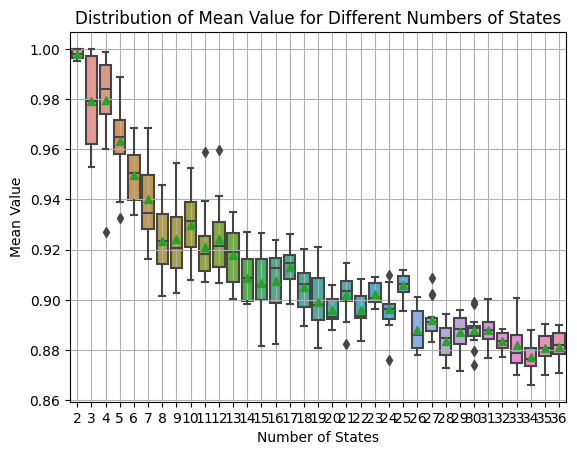

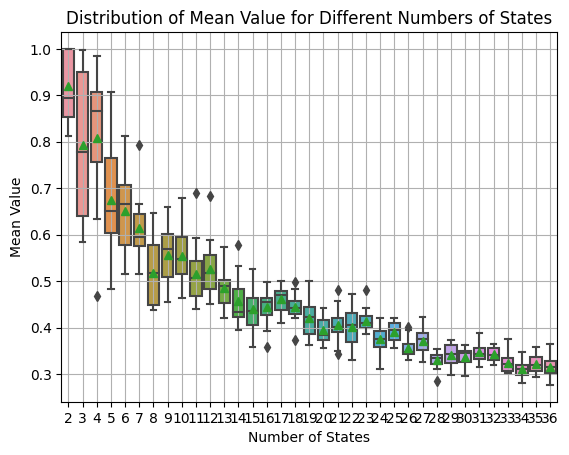

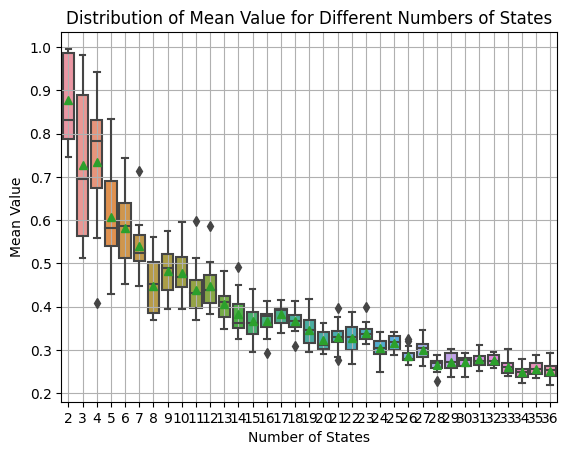

In [134]:
import seaborn as sns

summary_dir = f'{save_dir}summary/'
if not os.path.exists(summary_dir):
    os.makedirs(summary_dir)

for metric in ['spatial','temp','temp_argmax']:
    # Initialize a dictionary to store mean values for each number of states
    mean_values_dict = {N_state: [] for N_state in N_states}

    # Loop through each value of N_states
    for N_state in N_states:
        # Loop through each pair of repeats
        for i in range(len(repeats)):
            for j in range(i + 1, len(repeats)):
                # Define the path to the pickle file
                file_path = os.path.join(save_dir, f'hmm_ICA_25_state_{N_state}/analysis/{metric}_pair_{repeats[i]}_vs_{repeats[j]}.pkl')
                # Load the pickle file
                with open(file_path, 'rb') as f:
                    data = pickle.load(f)
                # Extract the 'mean' value and append it to the dictionary
                mean_value = data['mean']
                mean_values_dict[N_state].append(mean_value)

    # Plot boxplots of the mean values for each number of states
    sns.boxplot(data=list(mean_values_dict.values()), showmeans=True)
    plt.xlabel('Number of States')
    plt.ylabel('Mean Value')
    plt.title('Distribution of Mean Value for Different Numbers of States')
    plt.xticks(ticks=range(len(N_states)), labels=N_states)
    plt.grid(True)
    plt.show()

In [ ]:
save_dir = './results_HCP_yaml_202403/'
N_states = list(range(2,37))
repeats = ['train','repeat_1','repeat_2','repeat_3','repeat_4','repeat_5']

In [ ]:
import json

# Initialize a dictionary to store free energy values for each number of states
free_energy_dict = {N_state: [] for N_state in N_states}

# Loop through each value of N_states
for N_state in N_states:
    # Loop through each repeat
    for repeat in repeats:
        # Define the path to the JSON file for the free energy
        file_path = os.path.join(save_dir, f'hmm_ICA_25_state_{N_state}/{repeat}/metrics/metrics.json')
        # Load the JSON file
        with open(file_path, 'r') as f:
            metrics = json.load(f)
        # Extract the 'free_energy' value and append it to the dictionary
        free_energy = metrics['free_energy']
        free_energy_dict[N_state].append(free_energy)

# Plot boxplots of the free energy values for each number of states
sns.boxplot(data=list(free_energy_dict.values()), showmeans=True)
plt.xlabel('Number of States')
plt.ylabel('Free Energy')
plt.title('Distribution of Free Energy for Different Numbers of States')
plt.xticks(ticks=range(len(N_states)), labels=N_states)
plt.grid(True)
plt.show()

In [41]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [50]:
save_dir = './results_HCP_202311_no_mean/HMM_ICA_25_state_8/'
tpm = np.load(f'{save_dir}trans_prob.npy')
print(tpm)
'''
for i in range(8):
    tpm[i,i] = 0
'''

[[8.82521069e-01 2.13740600e-02 1.52935170e-02 1.21803307e-02
  1.98099072e-03 3.49631353e-02 1.20386795e-02 1.96482181e-02]
 [1.76062296e-02 9.01246462e-01 1.50009055e-02 1.71810770e-02
  1.27302422e-03 3.31416792e-02 1.42265414e-02 3.24081291e-04]
 [1.59852141e-02 1.97370388e-02 8.84493194e-01 1.60322338e-02
  2.53967001e-03 2.84117123e-02 1.79470784e-02 1.48538586e-02]
 [1.55426222e-02 2.46263272e-02 1.64949563e-02 8.81130626e-01
  2.09342288e-03 3.94360465e-02 1.78091003e-02 2.86689869e-03]
 [3.63360242e-03 2.33229981e-03 3.45188353e-03 2.92748779e-03
  9.44094777e-01 4.04464203e-03 7.64887558e-03 3.18664316e-02]
 [2.26098265e-02 2.54303603e-02 1.92685769e-02 1.97903561e-02
  1.91839506e-03 8.83179750e-01 1.21194136e-02 1.56833212e-02]
 [1.60295459e-02 2.07944100e-02 1.80880747e-02 2.17552933e-02
  5.00773792e-03 2.97738825e-02 8.67643099e-01 2.09079568e-02]
 [1.30011939e-02 1.93338443e-04 9.82194414e-03 1.58277207e-03
  2.11767333e-02 1.78431658e-02 1.47317818e-02 9.21649070e-01]]

'\nfor i in range(8):\n    tpm[i,i] = 0\n'

<Axes: >

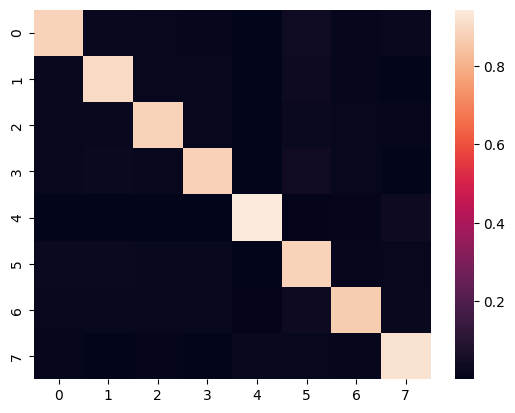

In [51]:
seaborn.heatmap(tpm)

## Update 8th March 2024

### Task 1: train the model on randomly generated covariance matrices (code provided by Chet and Rukuang)

My results and Rukuang's results do not agree with each other when it comes to the free energy trend. So let's have a look at it. Randomly generate these states and train the model on the data (n_subjects range from 2 to 36, but only train on repeat_1, repeat_2, repeat_3, repeat_4, repeat_5

In [61]:
import os
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [71]:
from osl_dynamics.inference.metrics import twopair_riemannian_distance

In [87]:
data_dir = 'data/node_timeseries/simulation_rukuang/state_100/truth/'

In [88]:
covariance = np.load(f'{data_dir}state_covariances.npy')

Computing Riemannian distances: 100%|█████████| 100/100 [00:01<00:00, 69.51it/s]


<Axes: >

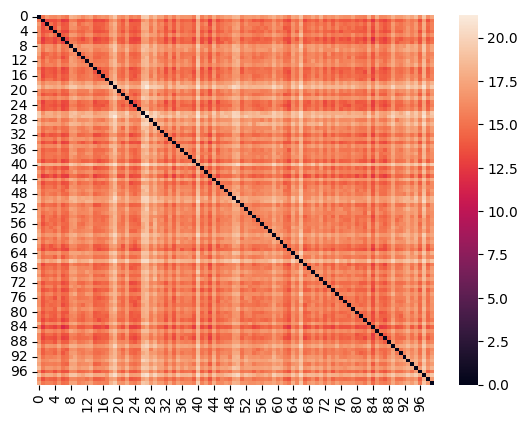

In [89]:
seaborn.heatmap(twopair_riemannian_distance(covariance,covariance))

### Check the model training results of Rukuang & Chet's covariance

The first step is to check free energy changes.

In [168]:
save_dir = './results_simulation_rukuang/state_5/'
N_states = list(range(2,37))
repeats = ['train','repeat_1','repeat_2','repeat_3','repeat_4','repeat_5']

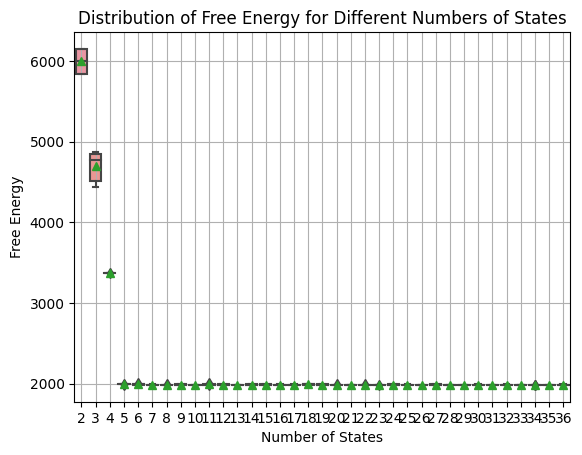

In [169]:
import json

# Initialize a dictionary to store free energy values for each number of states
free_energy_dict = {N_state: [] for N_state in N_states}

# Loop through each value of N_states
for N_state in N_states:
    # Loop through each repeat
    for repeat in repeats:
        # Define the path to the JSON file for the free energy
        file_path = os.path.join(save_dir, f'hmm_ICA_25_state_{N_state}/{repeat}/metrics/metrics.json')
        # Load the JSON file
        with open(file_path, 'r') as f:
            metrics = json.load(f)
        # Extract the 'free_energy' value and append it to the dictionary
        free_energy = metrics['free_energy']
        free_energy_dict[N_state].append(free_energy)

# Plot boxplots of the free energy values for each number of states
sns.boxplot(data=list(free_energy_dict.values()), showmeans=True)
plt.xlabel('Number of States')
plt.ylabel('Free Energy')
plt.title('Distribution of Free Energy for Different Numbers of States')
plt.xticks(ticks=range(len(N_states)), labels=N_states)
plt.grid(True)
plt.show()

Now check the spatial reproducibility and temporal reproducibility of state_40, state_100

In [170]:
from osl_dynamics.array_ops import cov2stdcorr

for N_state in N_states:
    for repeat in repeats:
        analysis_dir = f'{save_dir}hmm_ICA_25_state_{N_state}/{repeat}/analysis/'
        if not os.path.exists(analysis_dir):
            os.makedirs(analysis_dir)
        covs = np.load(f'{save_dir}hmm_ICA_25_state_{N_state}/{repeat}/inf_params/covs.npy')
        np.save(f'{analysis_dir}covs.npy',covs)
        stds,corrs =cov2stdcorr(covs)
        np.save(f'{analysis_dir}stds.npy',stds)
        np.save(f'{analysis_dir}corrs.npy',corrs)

In [171]:
from osl_dynamics.inference.metrics import twopair_fisher_z_correlations
from osl_dynamics.inference.modes import hungarian_pair
from osl_dynamics.utils.plotting import plot_mode_pairing

for N_state in N_states:
    analysis_dir = f'{save_dir}hmm_ICA_25_state_{N_state}/analysis/'
    if not os.path.exists(analysis_dir):
        os.makedirs(analysis_dir)
    for i in range(len(repeats)):
        for j in range(i+1,len(repeats)):
            corrs_1 = np.load(f'{save_dir}hmm_ICA_25_state_{N_state}/{repeats[i]}/analysis/corrs.npy')
            corrs_2 = np.load(f'{save_dir}hmm_ICA_25_state_{N_state}/{repeats[j]}/analysis/corrs.npy')
            indices, cor = hungarian_pair(twopair_fisher_z_correlations(corrs_1,corrs_2),distance=False)
            np.save(f'{analysis_dir}spatial_cor_{repeats[i]}_vs_{repeats[j]}.npy',cor)
            indices['mean'] = np.mean(np.diagonal(cor))
            # Open the file in binary write mode
            with open(f'{analysis_dir}spatial_pair_{repeats[i]}_vs_{repeats[j]}.pkl', "wb") as f:
                pickle.dump(indices, f)
            plot_mode_pairing(cor,
                              indices,
                              x_label=repeats[j],
                              y_label=repeats[i],
                              title=f'Spatial correlation {repeats[i]} vs {repeats[j]}',
                              filename=f'{analysis_dir}spatial_cor_{repeats[i]}_vs_{repeats[j]}.jpg')

Compute twopair Fisher-z transformated correlation: 100%|█| 2/2 [00:00<00:00, 10
2024-03-11 09:27:25 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_2/analysis/spatial_cor_train_vs_repeat_1.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 2/2 [00:00<00:00, 11
2024-03-11 09:27:25 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_2/analysis/spatial_cor_train_vs_repeat_2.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 2/2 [00:00<00:00, 15
2024-03-11 09:27:25 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_2/analysis/spatial_cor_train_vs_repeat_3.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 2/2 [00:00<00:00, 13
2024-03-11 09:27:25 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_2/analysis/spatial_cor_train_vs_repeat_4.jpg
Comp

Compute twopair Fisher-z transformated correlation: 100%|█| 4/4 [00:00<00:00, 10
2024-03-11 09:27:29 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_4/analysis/spatial_cor_train_vs_repeat_4.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 4/4 [00:00<00:00, 10
2024-03-11 09:27:29 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_4/analysis/spatial_cor_train_vs_repeat_5.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 4/4 [00:00<00:00, 97
2024-03-11 09:27:29 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_4/analysis/spatial_cor_repeat_1_vs_repeat_2.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 4/4 [00:00<00:00, 97
2024-03-11 09:27:29 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_4/analysis/spatial_cor_repeat_1_vs_repeat_3.jp

Compute twopair Fisher-z transformated correlation: 100%|█| 6/6 [00:00<00:00, 99
2024-03-11 09:27:33 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_6/analysis/spatial_cor_repeat_1_vs_repeat_3.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 6/6 [00:00<00:00, 87
2024-03-11 09:27:33 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_6/analysis/spatial_cor_repeat_1_vs_repeat_4.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 6/6 [00:00<00:00, 95
2024-03-11 09:27:33 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_6/analysis/spatial_cor_repeat_1_vs_repeat_5.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 6/6 [00:00<00:00, 93
2024-03-11 09:27:33 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_6/analysis/spatial_cor_repeat_2_vs_repea

Compute twopair Fisher-z transformated correlation: 100%|█| 8/8 [00:00<00:00, 79
2024-03-11 09:27:38 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_8/analysis/spatial_cor_repeat_2_vs_repeat_3.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 8/8 [00:00<00:00, 78
2024-03-11 09:27:38 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_8/analysis/spatial_cor_repeat_2_vs_repeat_4.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 8/8 [00:00<00:00, 79
2024-03-11 09:27:38 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_8/analysis/spatial_cor_repeat_2_vs_repeat_5.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 8/8 [00:00<00:00, 59
2024-03-11 09:27:38 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_8/analysis/spatial_cor_repeat_3_vs_repea

Compute twopair Fisher-z transformated correlation: 100%|█| 10/10 [00:00<00:00, 
2024-03-11 09:27:43 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_10/analysis/spatial_cor_repeat_3_vs_repeat_4.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 10/10 [00:00<00:00, 
2024-03-11 09:27:43 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_10/analysis/spatial_cor_repeat_3_vs_repeat_5.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 10/10 [00:00<00:00, 
2024-03-11 09:27:44 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_10/analysis/spatial_cor_repeat_4_vs_repeat_5.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 11/11 [00:00<00:00, 
2024-03-11 09:27:44 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_11/analysis/spatial_cor_train_vs_repe

Compute twopair Fisher-z transformated correlation: 100%|█| 13/13 [00:00<00:00, 
2024-03-11 09:27:49 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_13/analysis/spatial_cor_train_vs_repeat_1.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 13/13 [00:00<00:00, 
2024-03-11 09:27:50 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_13/analysis/spatial_cor_train_vs_repeat_2.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 13/13 [00:00<00:00, 
2024-03-11 09:27:50 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_13/analysis/spatial_cor_train_vs_repeat_3.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 13/13 [00:00<00:00, 
2024-03-11 09:27:50 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_13/analysis/spatial_cor_train_vs_repeat_4.jpg


Compute twopair Fisher-z transformated correlation: 100%|█| 15/15 [00:00<00:00, 
2024-03-11 09:28:04 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_15/analysis/spatial_cor_train_vs_repeat_4.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 15/15 [00:00<00:00, 
2024-03-11 09:28:04 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_15/analysis/spatial_cor_train_vs_repeat_5.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 15/15 [00:00<00:00, 
2024-03-11 09:28:05 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_15/analysis/spatial_cor_repeat_1_vs_repeat_2.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 15/15 [00:00<00:00, 
2024-03-11 09:28:05 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_15/analysis/spatial_cor_repeat_1_vs_repeat_

Compute twopair Fisher-z transformated correlation: 100%|█| 17/17 [00:00<00:00, 
2024-03-11 09:28:12 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_17/analysis/spatial_cor_repeat_1_vs_repeat_3.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 17/17 [00:00<00:00, 
2024-03-11 09:28:12 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_17/analysis/spatial_cor_repeat_1_vs_repeat_4.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 17/17 [00:00<00:00, 
2024-03-11 09:28:12 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_17/analysis/spatial_cor_repeat_1_vs_repeat_5.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 17/17 [00:00<00:00, 
2024-03-11 09:28:12 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_17/analysis/spatial_cor_repeat_2_vs_r

Compute twopair Fisher-z transformated correlation: 100%|█| 19/19 [00:00<00:00, 
2024-03-11 09:28:21 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_19/analysis/spatial_cor_repeat_2_vs_repeat_3.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 19/19 [00:00<00:00, 
2024-03-11 09:28:21 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_19/analysis/spatial_cor_repeat_2_vs_repeat_4.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 19/19 [00:00<00:00, 
2024-03-11 09:28:21 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_19/analysis/spatial_cor_repeat_2_vs_repeat_5.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 19/19 [00:00<00:00, 
2024-03-11 09:28:22 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_19/analysis/spatial_cor_repeat_3_vs_r

Compute twopair Fisher-z transformated correlation: 100%|█| 21/21 [00:00<00:00, 
2024-03-11 09:28:31 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_21/analysis/spatial_cor_repeat_3_vs_repeat_4.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 21/21 [00:00<00:00, 
2024-03-11 09:28:31 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_21/analysis/spatial_cor_repeat_3_vs_repeat_5.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 21/21 [00:00<00:00, 
2024-03-11 09:28:31 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_21/analysis/spatial_cor_repeat_4_vs_repeat_5.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 22/22 [00:00<00:00, 
2024-03-11 09:28:32 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_22/analysis/spatial_cor_train_vs_repe

Compute twopair Fisher-z transformated correlation: 100%|█| 24/24 [00:00<00:00, 
2024-03-11 09:28:41 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_24/analysis/spatial_cor_train_vs_repeat_1.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 24/24 [00:00<00:00, 
2024-03-11 09:28:41 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_24/analysis/spatial_cor_train_vs_repeat_2.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 24/24 [00:00<00:00, 
2024-03-11 09:28:42 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_24/analysis/spatial_cor_train_vs_repeat_3.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 24/24 [00:00<00:00, 
2024-03-11 09:28:42 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_24/analysis/spatial_cor_train_vs_repeat_4.jpg


Compute twopair Fisher-z transformated correlation: 100%|█| 26/26 [00:00<00:00, 
2024-03-11 09:28:54 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_26/analysis/spatial_cor_train_vs_repeat_4.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 26/26 [00:00<00:00, 
2024-03-11 09:28:54 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_26/analysis/spatial_cor_train_vs_repeat_5.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 26/26 [00:00<00:00, 
2024-03-11 09:28:54 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_26/analysis/spatial_cor_repeat_1_vs_repeat_2.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 26/26 [00:00<00:00, 
2024-03-11 09:28:55 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_26/analysis/spatial_cor_repeat_1_vs_repeat_

Compute twopair Fisher-z transformated correlation: 100%|█| 28/28 [00:00<00:00, 
2024-03-11 09:29:06 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_28/analysis/spatial_cor_repeat_1_vs_repeat_3.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 28/28 [00:00<00:00, 
2024-03-11 09:29:06 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_28/analysis/spatial_cor_repeat_1_vs_repeat_4.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 28/28 [00:00<00:00, 
2024-03-11 09:29:07 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_28/analysis/spatial_cor_repeat_1_vs_repeat_5.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 28/28 [00:00<00:00, 
2024-03-11 09:29:07 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_28/analysis/spatial_cor_repeat_2_vs_r

Compute twopair Fisher-z transformated correlation: 100%|█| 30/30 [00:00<00:00, 
2024-03-11 09:29:20 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_30/analysis/spatial_cor_repeat_2_vs_repeat_3.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 30/30 [00:00<00:00, 
2024-03-11 09:29:20 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_30/analysis/spatial_cor_repeat_2_vs_repeat_4.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 30/30 [00:00<00:00, 
2024-03-11 09:29:21 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_30/analysis/spatial_cor_repeat_2_vs_repeat_5.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 30/30 [00:00<00:00, 
2024-03-11 09:29:21 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_30/analysis/spatial_cor_repeat_3_vs_r

Compute twopair Fisher-z transformated correlation: 100%|█| 32/32 [00:00<00:00, 
2024-03-11 09:29:36 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_32/analysis/spatial_cor_repeat_3_vs_repeat_4.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 32/32 [00:00<00:00, 
2024-03-11 09:29:37 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_32/analysis/spatial_cor_repeat_3_vs_repeat_5.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 32/32 [00:00<00:00, 
2024-03-11 09:29:37 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_32/analysis/spatial_cor_repeat_4_vs_repeat_5.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 33/33 [00:00<00:00, 
2024-03-11 09:29:38 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_33/analysis/spatial_cor_train_vs_repe

Compute twopair Fisher-z transformated correlation: 100%|█| 35/35 [00:00<00:00, 
2024-03-11 09:29:52 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_35/analysis/spatial_cor_train_vs_repeat_1.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 35/35 [00:00<00:00, 
2024-03-11 09:29:53 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_35/analysis/spatial_cor_train_vs_repeat_2.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 35/35 [00:00<00:00, 
2024-03-11 09:29:53 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_35/analysis/spatial_cor_train_vs_repeat_3.jpg
Compute twopair Fisher-z transformated correlation: 100%|█| 35/35 [00:00<00:00, 
2024-03-11 09:29:54 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_35/analysis/spatial_cor_train_vs_repeat_4.jpg


In [173]:
import pickle
from osl_dynamics.inference.metrics import alpha_correlation

for N_state in N_states:
    analysis_dir = f'{save_dir}hmm_ICA_25_state_{N_state}/analysis/'
    if not os.path.exists(analysis_dir):
        os.makedirs(analysis_dir)
    for i in range(len(repeats)):
        for j in range(i+1,len(repeats)):
            with open(f'{save_dir}hmm_ICA_25_state_{N_state}/{repeats[i]}/inf_params/alp.pkl','rb') as file:
                alpha_1 = pickle.load(file)
            with open(f'{save_dir}hmm_ICA_25_state_{N_state}/{repeats[j]}/inf_params/alp.pkl','rb') as file:
                alpha_2 = pickle.load(file)
            indices, cor = hungarian_pair(alpha_correlation(alpha_1,alpha_2,return_diagonal=False),distance=False)
            np.save(f'{analysis_dir}temp_cor_{repeats[i]}_vs_{repeats[j]}.npy',cor)
            indices['mean'] = np.mean(np.diagonal(cor))
            # Open the file in binary write mode
            with open(f'{analysis_dir}temp_pair_{repeats[i]}_vs_{repeats[j]}.pkl', "wb") as f:
                pickle.dump(indices, f)
            plot_mode_pairing(cor,
                              indices,
                              x_label=repeats[j],
                              y_label=repeats[i],
                              title=f'Temporal correlation {repeats[i]} vs {repeats[j]}',
                              filename=f'{analysis_dir}temp_cor_{repeats[i]}_vs_{repeats[j]}.jpg')
            '''
            indices_argmax, cor_argmax = hungarian_pair(alpha_correlation(argmax_time_courses(alpha_1),argmax_time_courses(alpha_2),return_diagonal=False),distance=False)
            np.save(f'{analysis_dir}temp_argmax_cor_{repeats[i]}_vs_{repeats[j]}.npy',cor_argmax)
            indices_argmax['mean'] = np.mean(np.diagonal(cor_argmax))
            # Open the file in binary write mode
            with open(f'{analysis_dir}temp_argmax_pair_{repeats[i]}_vs_{repeats[j]}.pkl', "wb") as f:
                pickle.dump(indices_argmax, f)
            plot_mode_pairing(cor_argmax,
                              indices_argmax,
                              x_label=repeats[j],
                              y_label=repeats[i],
                              title=f'Temporal argmax correlation {repeats[i]} vs {repeats[j]}',
                              filename=f'{analysis_dir}temp_argmax_cor_{repeats[i]}_vs_{repeats[j]}.jpg')
            '''

2024-03-11 09:36:24 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_2/analysis/temp_cor_train_vs_repeat_1.jpg
2024-03-11 09:36:24 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_2/analysis/temp_cor_train_vs_repeat_2.jpg
2024-03-11 09:36:24 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_2/analysis/temp_cor_train_vs_repeat_3.jpg
2024-03-11 09:36:24 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_2/analysis/temp_cor_train_vs_repeat_4.jpg
2024-03-11 09:36:25 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_2/analysis/temp_cor_train_vs_repeat_5.jpg
2024-03-11 09:36:25 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_2/analysis/temp_cor_repeat_1_vs_repeat_2.jpg
2024-03

2024-03-11 09:36:37 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_5/analysis/temp_cor_repeat_1_vs_repeat_2.jpg
2024-03-11 09:36:37 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_5/analysis/temp_cor_repeat_1_vs_repeat_3.jpg
2024-03-11 09:36:37 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_5/analysis/temp_cor_repeat_1_vs_repeat_4.jpg
2024-03-11 09:36:38 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_5/analysis/temp_cor_repeat_1_vs_repeat_5.jpg
2024-03-11 09:36:38 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_5/analysis/temp_cor_repeat_2_vs_repeat_3.jpg
2024-03-11 09:36:38 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_5/analysis/temp_cor_repeat_2_vs_repea

2024-03-11 09:37:00 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_8/analysis/temp_cor_repeat_2_vs_repeat_4.jpg
2024-03-11 09:37:01 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_8/analysis/temp_cor_repeat_2_vs_repeat_5.jpg
2024-03-11 09:37:01 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_8/analysis/temp_cor_repeat_3_vs_repeat_4.jpg
2024-03-11 09:37:02 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_8/analysis/temp_cor_repeat_3_vs_repeat_5.jpg
2024-03-11 09:37:02 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_8/analysis/temp_cor_repeat_4_vs_repeat_5.jpg
2024-03-11 09:37:03 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_9/analysis/temp_cor_train_vs_repeat_1

2024-03-11 09:37:28 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_11/analysis/temp_cor_repeat_4_vs_repeat_5.jpg
2024-03-11 09:37:29 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_12/analysis/temp_cor_train_vs_repeat_1.jpg
2024-03-11 09:37:30 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_12/analysis/temp_cor_train_vs_repeat_2.jpg
2024-03-11 09:37:30 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_12/analysis/temp_cor_train_vs_repeat_3.jpg
2024-03-11 09:37:31 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_12/analysis/temp_cor_train_vs_repeat_4.jpg
2024-03-11 09:37:32 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_12/analysis/temp_cor_train_vs_repeat_5.jpg
2

2024-03-11 09:38:03 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_15/analysis/temp_cor_train_vs_repeat_4.jpg
2024-03-11 09:38:04 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_15/analysis/temp_cor_train_vs_repeat_5.jpg
2024-03-11 09:38:05 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_15/analysis/temp_cor_repeat_1_vs_repeat_2.jpg
2024-03-11 09:38:05 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_15/analysis/temp_cor_repeat_1_vs_repeat_3.jpg
2024-03-11 09:38:06 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_15/analysis/temp_cor_repeat_1_vs_repeat_4.jpg
2024-03-11 09:38:07 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_15/analysis/temp_cor_repeat_1_vs_repea

2024-03-11 09:38:45 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_18/analysis/temp_cor_repeat_1_vs_repeat_4.jpg
2024-03-11 09:38:46 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_18/analysis/temp_cor_repeat_1_vs_repeat_5.jpg
2024-03-11 09:38:46 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_18/analysis/temp_cor_repeat_2_vs_repeat_3.jpg
2024-03-11 09:38:47 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_18/analysis/temp_cor_repeat_2_vs_repeat_4.jpg
2024-03-11 09:38:48 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_18/analysis/temp_cor_repeat_2_vs_repeat_5.jpg
2024-03-11 09:38:49 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_18/analysis/temp_cor_repeat_3_vs

2024-03-11 09:39:33 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_21/analysis/temp_cor_repeat_2_vs_repeat_5.jpg
2024-03-11 09:39:34 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_21/analysis/temp_cor_repeat_3_vs_repeat_4.jpg
2024-03-11 09:39:35 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_21/analysis/temp_cor_repeat_3_vs_repeat_5.jpg
2024-03-11 09:39:36 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_21/analysis/temp_cor_repeat_4_vs_repeat_5.jpg
2024-03-11 09:39:38 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_22/analysis/temp_cor_train_vs_repeat_1.jpg
2024-03-11 09:39:39 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_22/analysis/temp_cor_train_vs_repea

2024-03-11 09:40:32 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_25/analysis/temp_cor_train_vs_repeat_1.jpg
2024-03-11 09:40:33 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_25/analysis/temp_cor_train_vs_repeat_2.jpg
2024-03-11 09:40:34 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_25/analysis/temp_cor_train_vs_repeat_3.jpg
2024-03-11 09:40:36 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_25/analysis/temp_cor_train_vs_repeat_4.jpg
2024-03-11 09:40:37 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_25/analysis/temp_cor_train_vs_repeat_5.jpg
2024-03-11 09:40:38 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_25/analysis/temp_cor_repeat_1_vs_repeat_2.jpg
2

2024-03-11 09:41:40 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_28/analysis/temp_cor_train_vs_repeat_5.jpg
2024-03-11 09:41:42 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_28/analysis/temp_cor_repeat_1_vs_repeat_2.jpg
2024-03-11 09:41:43 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_28/analysis/temp_cor_repeat_1_vs_repeat_3.jpg
2024-03-11 09:41:45 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_28/analysis/temp_cor_repeat_1_vs_repeat_4.jpg
2024-03-11 09:41:46 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_28/analysis/temp_cor_repeat_1_vs_repeat_5.jpg
2024-03-11 09:41:47 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_28/analysis/temp_cor_repeat_2_vs_re

2024-03-11 09:42:54 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_31/analysis/temp_cor_repeat_1_vs_repeat_5.jpg
2024-03-11 09:42:55 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_31/analysis/temp_cor_repeat_2_vs_repeat_3.jpg
2024-03-11 09:42:57 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_31/analysis/temp_cor_repeat_2_vs_repeat_4.jpg
2024-03-11 09:42:58 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_31/analysis/temp_cor_repeat_2_vs_repeat_5.jpg
2024-03-11 09:43:00 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_31/analysis/temp_cor_repeat_3_vs_repeat_4.jpg
2024-03-11 09:43:01 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_31/analysis/temp_cor_repeat_3_vs

2024-03-11 09:44:18 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_34/analysis/temp_cor_repeat_3_vs_repeat_4.jpg
2024-03-11 09:44:19 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_34/analysis/temp_cor_repeat_3_vs_repeat_5.jpg
2024-03-11 09:44:21 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_34/analysis/temp_cor_repeat_4_vs_repeat_5.jpg
2024-03-11 09:44:23 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_35/analysis/temp_cor_train_vs_repeat_1.jpg
2024-03-11 09:44:24 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_35/analysis/temp_cor_train_vs_repeat_2.jpg
2024-03-11 09:44:26 INFO osl-dynamics [plotting.py:103:save]: Saving ./results_simulation_rukuang/state_5/hmm_ICA_25_state_35/analysis/temp_cor_train_vs_repeat_3

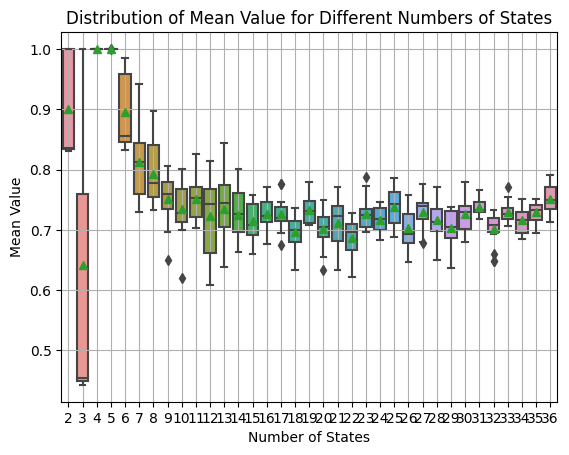

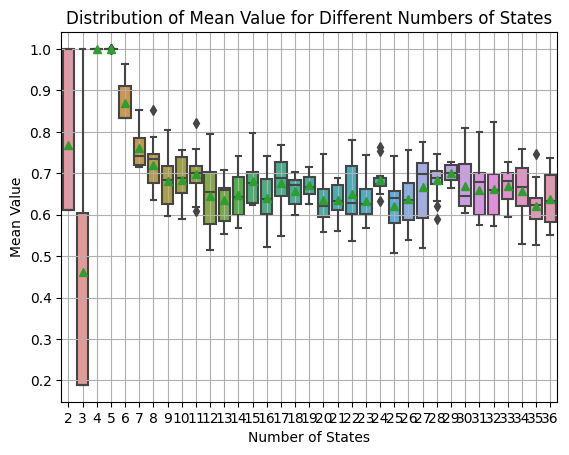

In [174]:
import seaborn as sns

summary_dir = f'{save_dir}summary/'
if not os.path.exists(summary_dir):
    os.makedirs(summary_dir)

for metric in ['spatial','temp']:#,'temp_argmax']:
    # Initialize a dictionary to store mean values for each number of states
    mean_values_dict = {N_state: [] for N_state in N_states}

    # Loop through each value of N_states
    for N_state in N_states:
        # Loop through each pair of repeats
        for i in range(len(repeats)):
            for j in range(i + 1, len(repeats)):
                # Define the path to the pickle file
                file_path = os.path.join(save_dir, f'hmm_ICA_25_state_{N_state}/analysis/{metric}_pair_{repeats[i]}_vs_{repeats[j]}.pkl')
                # Load the pickle file
                with open(file_path, 'rb') as f:
                    data = pickle.load(f)
                # Extract the 'mean' value and append it to the dictionary
                mean_value = data['mean']
                mean_values_dict[N_state].append(mean_value)

    # Plot boxplots of the mean values for each number of states
    sns.boxplot(data=list(mean_values_dict.values()), showmeans=True)
    plt.xlabel('Number of States')
    plt.ylabel('Mean Value')
    plt.title('Distribution of Mean Value for Different Numbers of States')
    plt.xticks(ticks=range(len(N_states)), labels=N_states)
    plt.grid(True)
    plt.show()

## Update 11th March 2024

We are trying to implement the ideas of cross validation. The following chunk of code is work-in-progress.

In [7]:
import os
import pickle

import numpy as np

from osl_dynamics.inference.metrics import alpha_correlation
from osl_dynamics.inference.modes import hungarian_pair
from osl_dynamics.models import load

In [8]:
save_dir= './results_HCP_yaml_202403/'
N_state = 8
N_split = 5

In [9]:
split_1_dir = f'{save_dir}hmm_ICA_25_state_{N_state}/split_{N_split}/half_1/'
split_2_dir = f'{save_dir}hmm_ICA_25_state_{N_state}/split_{N_split}/half_2/'
'''
with open(f'{split_1_dir}inf_params/alp.pkl','rb') as file:
    alpha_1 = pickle.load(file)
#with open(f'{split_2_dir}inf_params/alp.pkl','rb') as file:
#    alpha_2 = pickle.load(file)

#temp_corr = alpha_correlation(alpha_1,alpha_2)
model_2 = load(f'{split_2_dir}model')
'''
cov_1 = np.load(f'{split_1_dir}inf_params/covs.npy')
cov_2 = np.load(f'{split_2_dir}inf_params/covs.npy')

In [10]:
from osl_dynamics.array_ops import cov2corr

In [11]:
corr_1 = cov2corr(cov_1)
corr_2 = cov2corr(cov_2)

In [14]:
from osl_dynamics.inference.metrics import twopair_fisher_z_correlations
from osl_dynamics.inference.modes import hungarian_pair

In [16]:
indice,spatial_cor = hungarian_pair(twopair_fisher_z_correlations(corr_1,corr_2))

Compute twopair Fisher-z transformated correlation: 100%|█| 8/8 [00:00<00:00, 24


In [17]:
from osl_dynamics.utils.plotting import plot_mode_pairing

NameError: name 'plt' is not defined

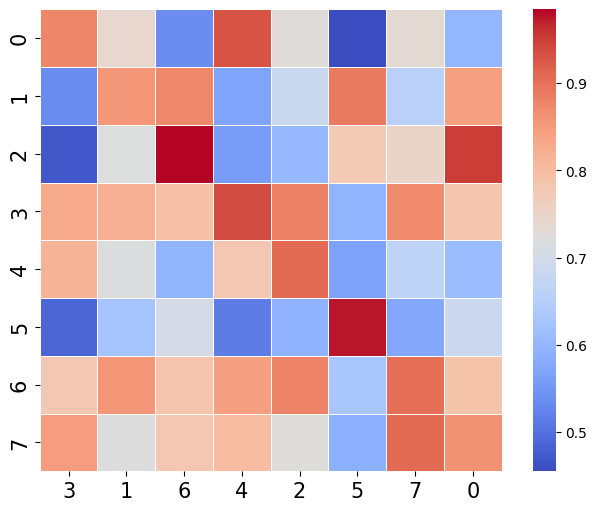

In [18]:
fig,ax = plot_mode_pairing(spatial_cor,indice)
plt.show()

So there should be some errors in the data split.Now fixed! It's time to have a look at the free energy.

In [35]:
save_dir = './results_HCP_yaml_202403/'
N_states = list(range(2,37))
N_splits = 5

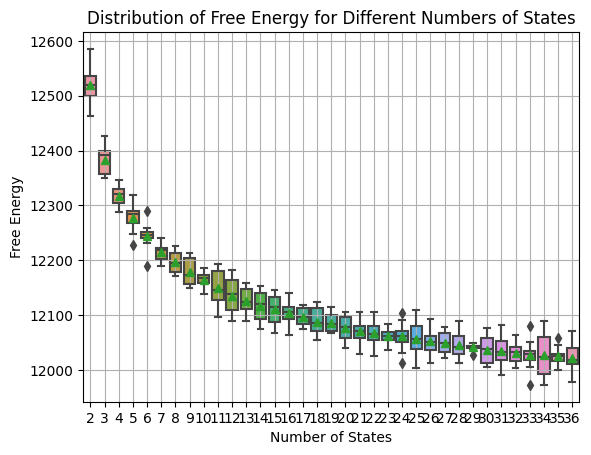

In [36]:
import json
import matplotlib.pyplot as plt
import seaborn as sns

# Initialize a dictionary to store free energy values for each number of states
free_energy_dict = {N_state: [] for N_state in N_states}

# Loop through each value of N_states
for N_state in N_states:
    # Loop through each repeat
    for i in range(1,N_splits+1):
        # Define the path to the JSON file for the free energy
        for j in range(2):
            file_path = os.path.join(save_dir, f'hmm_ICA_25_state_{N_state}/split_{i}/free_energy_cv_{j+1}.json')
            # Load the JSON file
            with open(file_path, 'r') as f:
                metrics = json.load(f)
            # Extract the 'free_energy' value and append it to the dictionary
            free_energy = metrics['free_energy']
            free_energy_dict[N_state].append(free_energy)

# Plot boxplots of the free energy values for each number of states
sns.boxplot(data=list(free_energy_dict.values()), showmeans=True)
plt.xlabel('Number of States')
plt.ylabel('Free Energy')
plt.title('Distribution of Free Energy for Different Numbers of States')
plt.xticks(ticks=range(len(N_states)), labels=N_states)
plt.grid(True)
plt.show()

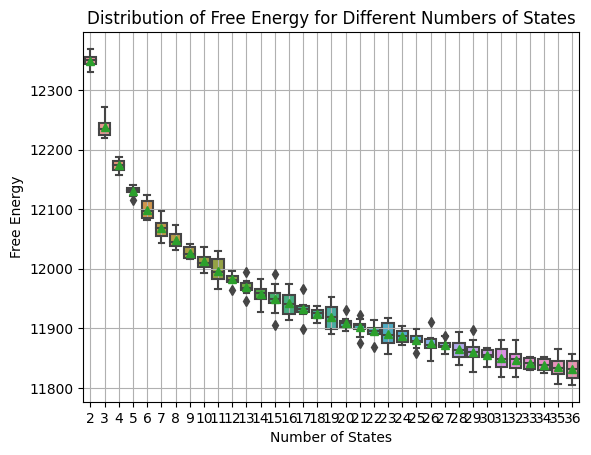

In [37]:
# Initialize a dictionary to store free energy values for each number of states
free_energy_dict = {N_state: [] for N_state in N_states}

# Loop through each value of N_states
for N_state in N_states:
    # Loop through each repeat
    for i in range(1,N_splits+1):
        # Define the path to the JSON file for the free energy
        for j in range(2):
            file_path = os.path.join(save_dir, f'hmm_ICA_25_state_{N_state}/split_{i}/half_{j+1}/metrics/metrics.json')
            # Load the JSON file
            with open(file_path, 'r') as f:
                metrics = json.load(f)
            # Extract the 'free_energy' value and append it to the dictionary
            free_energy = metrics['free_energy']
            free_energy_dict[N_state].append(free_energy)

# Plot boxplots of the free energy values for each number of states
sns.boxplot(data=list(free_energy_dict.values()), showmeans=True)
plt.xlabel('Number of States')
plt.ylabel('Free Energy')
plt.title('Distribution of Free Energy for Different Numbers of States')
plt.xticks(ticks=range(len(N_states)), labels=N_states)
plt.grid(True)
plt.show()

## The following codes are just for preparation of the meeting on 12th March 2024

In [44]:
import os
import json
import pickle
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [39]:
from osl_dynamics.inference.metrics import twopair_riemannian_distance

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 168.09it/s]


<Axes: >

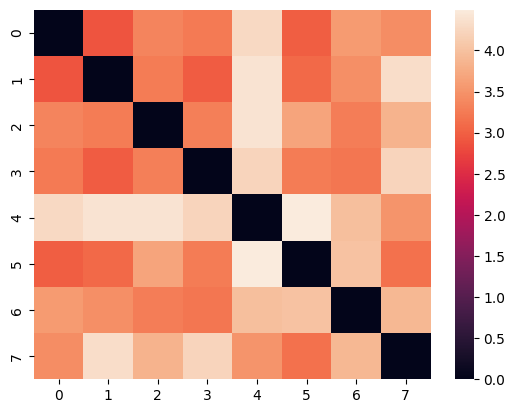

In [42]:
my_cov = np.load('results_HCP_202311_no_mean/HMM_ICA_25_state_8/state_covariances.npy')
sns.heatmap(twopair_riemannian_distance(my_cov,my_cov))

Computing Riemannian distances: 100%|████████████| 8/8 [00:00<00:00, 478.75it/s]


<Axes: >

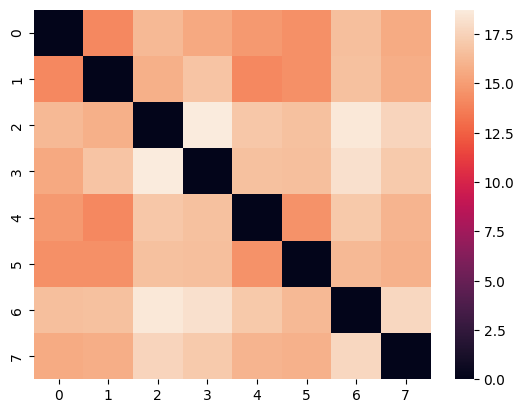

In [43]:
rukuang_cov = np.load('./data/node_timeseries/simulation_rukuang/state_8/truth/state_covariances.npy')
sns.heatmap(twopair_riemannian_distance(rukuang_cov,rukuang_cov))

In [49]:
save_dir = './results_simulation_rukuang/state_8/'
N_states = list(range(8,17))
repeats = ['train','repeat_1','repeat_2','repeat_3','repeat_4','repeat_5']

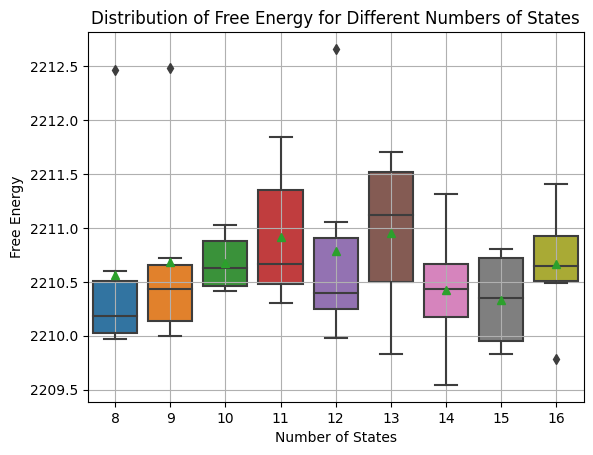

In [50]:
# Initialize a dictionary to store free energy values for each number of states
free_energy_dict = {N_state: [] for N_state in N_states}

# Loop through each value of N_states
for N_state in N_states:
    # Loop through each repeat
    for repeat in repeats:
        # Define the path to the JSON file for the free energy
        file_path = os.path.join(save_dir, f'hmm_ICA_25_state_{N_state}/{repeat}/metrics/metrics.json')
        # Load the JSON file
        with open(file_path, 'r') as f:
            metrics = json.load(f)
        # Extract the 'free_energy' value and append it to the dictionary
        free_energy = metrics['free_energy']
        free_energy_dict[N_state].append(free_energy)

# Plot boxplots of the free energy values for each number of states
sns.boxplot(data=list(free_energy_dict.values()), showmeans=True)
plt.xlabel('Number of States')
plt.ylabel('Free Energy')
plt.title('Distribution of Free Energy for Different Numbers of States')
plt.xticks(ticks=range(len(N_states)), labels=N_states)
plt.grid(True)
plt.show()

In [66]:
save_dir = './results_simulation_rukuang/state_100/'
N_states = list(range(2,36))
repeats = ['train','repeat_1','repeat_2','repeat_3','repeat_4','repeat_5']

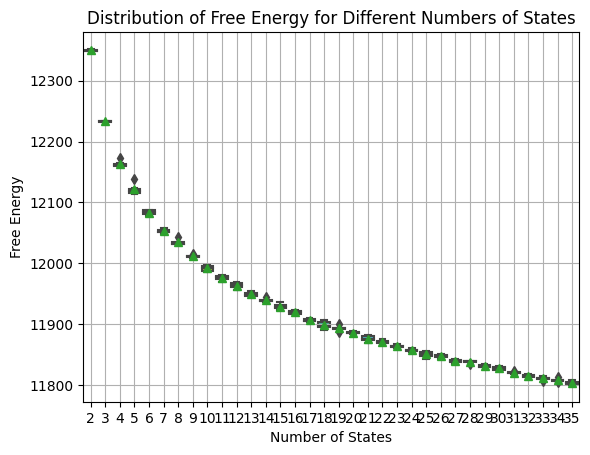

In [60]:
# Initialize a dictionary to store free energy values for each number of states
free_energy_dict = {N_state: [] for N_state in N_states}

# Loop through each value of N_states
for N_state in N_states:
    # Loop through each repeat
    for repeat in repeats:
        # Define the path to the JSON file for the free energy
        file_path = os.path.join(save_dir, f'hmm_ICA_25_state_{N_state}/{repeat}/metrics/metrics.json')
        # Load the JSON file
        with open(file_path, 'r') as f:
            metrics = json.load(f)
        # Extract the 'free_energy' value and append it to the dictionary
        free_energy = metrics['free_energy']
        free_energy_dict[N_state].append(free_energy)

# Plot boxplots of the free energy values for each number of states
sns.boxplot(data=list(free_energy_dict.values()), showmeans=True)
plt.xlabel('Number of States')
plt.ylabel('Free Energy')
plt.title('Distribution of Free Energy for Different Numbers of States')
plt.xticks(ticks=range(len(N_states)), labels=N_states)
plt.grid(True)
plt.show()

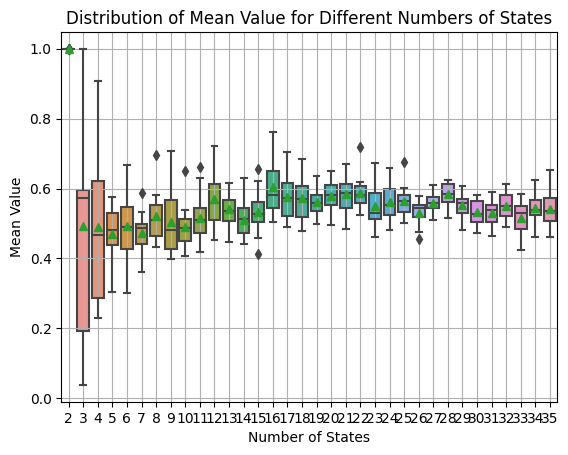

In [67]:
import seaborn as sns
'''
summary_dir = f'{save_dir}summary/'
if not os.path.exists(summary_dir):
    os.makedirs(summary_dir)
'''
for metric in ['temp']:#,'temp_argmax']:
    # Initialize a dictionary to store mean values for each number of states
    mean_values_dict = {N_state: [] for N_state in N_states}

    # Loop through each value of N_states
    for N_state in N_states:
        # Loop through each pair of repeats
        for i in range(len(repeats)):
            for j in range(i + 1, len(repeats)):
                # Define the path to the pickle file
                file_path = os.path.join(save_dir, f'hmm_ICA_25_state_{N_state}/analysis/{metric}_pair_{repeats[i]}_vs_{repeats[j]}.pkl')
                # Load the pickle file
                with open(file_path, 'rb') as f:
                    data = pickle.load(f)
                # Extract the 'mean' value and append it to the dictionary
                mean_value = data['mean']
                mean_values_dict[N_state].append(mean_value)

    # Plot boxplots of the mean values for each number of states
    sns.boxplot(data=list(mean_values_dict.values()), showmeans=True)
    plt.xlabel('Number of States')
    plt.ylabel('Mean Value')
    plt.title('Distribution of Mean Value for Different Numbers of States')
    plt.xticks(ticks=range(len(N_states)), labels=N_states)
    plt.grid(True)
    plt.show()

In [24]:
save_dir = './results_simulation_rukuang/state_5_fixed/tpm_3/'
repeats = ['train','repeat_1','repeat_2','repeat_3','repeat_4','repeat_5']

In [25]:
from osl_dynamics.inference.modes import fractional_occupancies
from osl_dynamics.utils.plotting import plot_violin

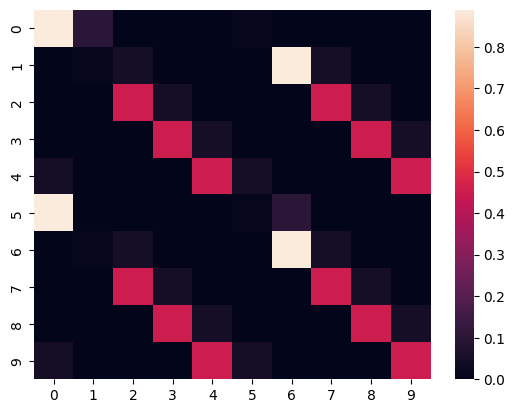

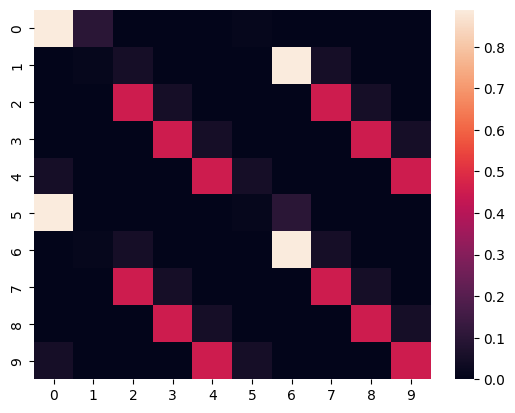

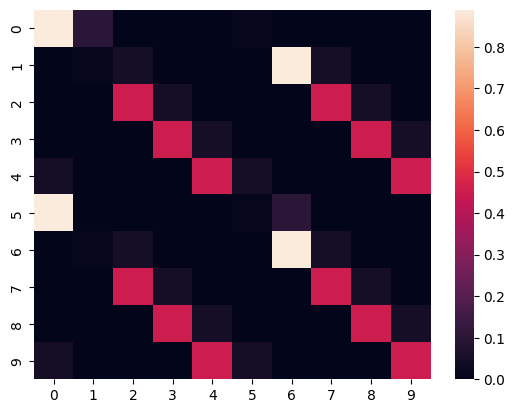

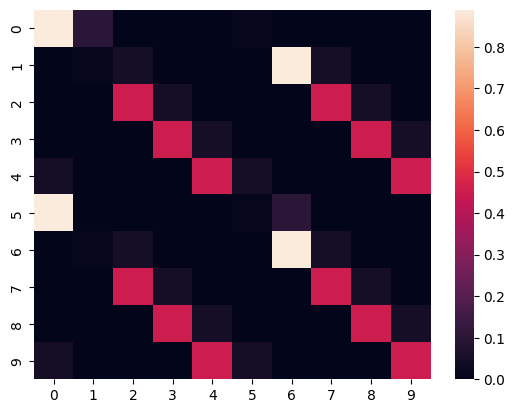

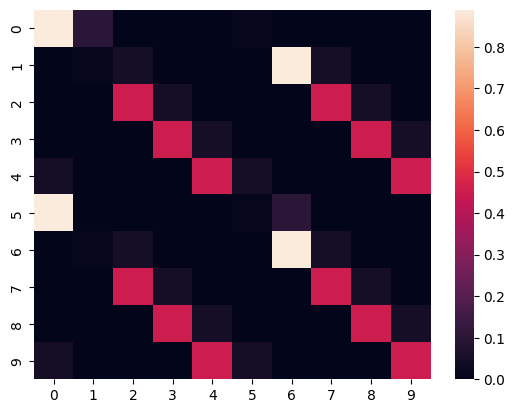

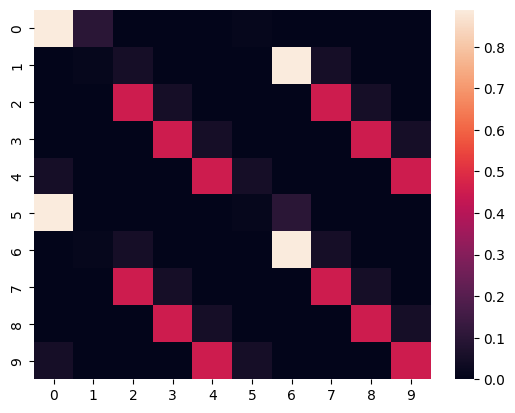

In [27]:
for repeat in repeats:
    tpm = np.load(f'{save_dir}hmm_ICA_25_state_10/{repeat}/model/trans_prob.npy')
    sns.heatmap(tpm)
    plt.show()

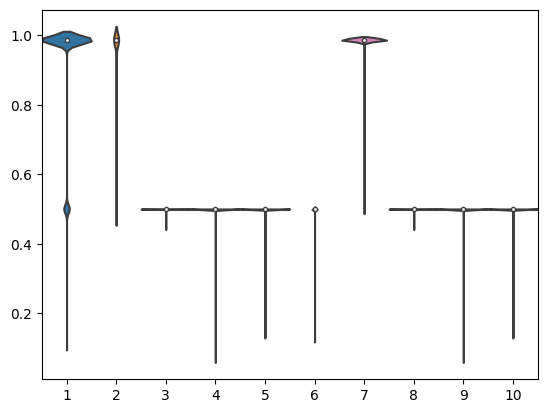

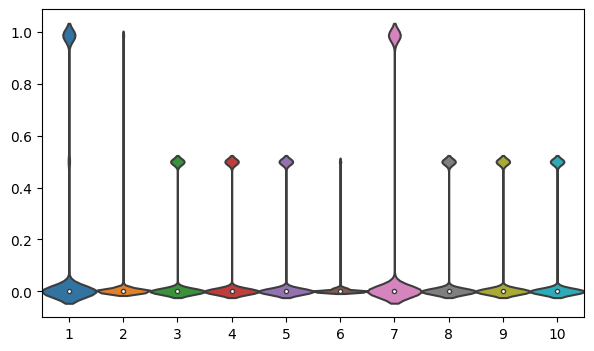

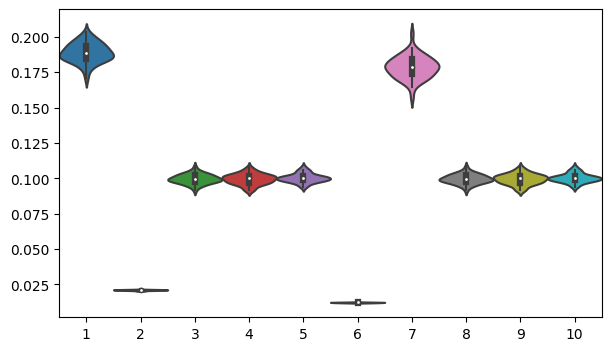

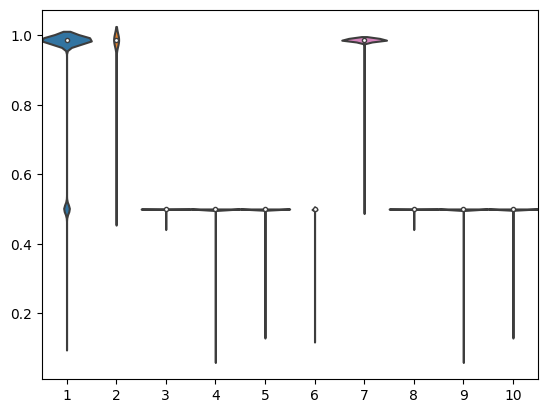

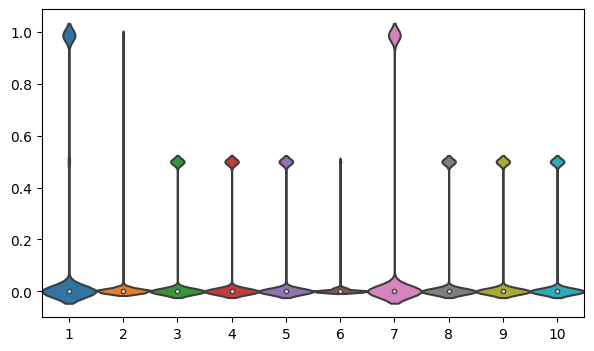

...

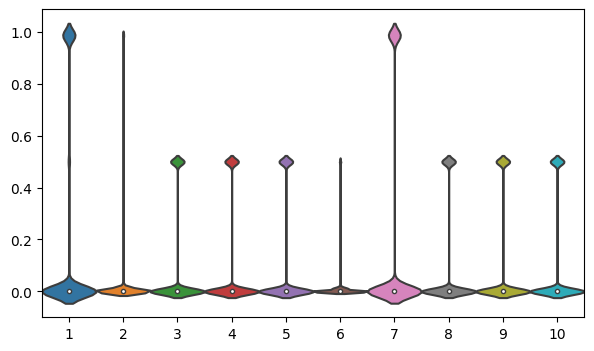

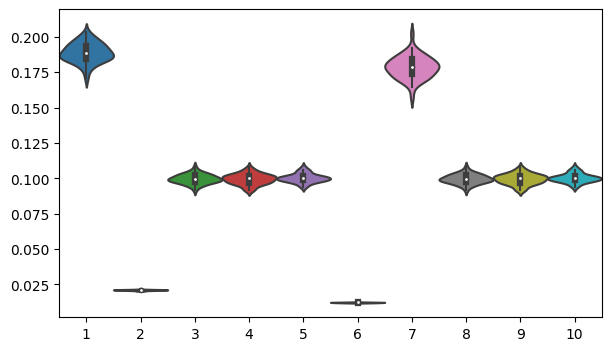

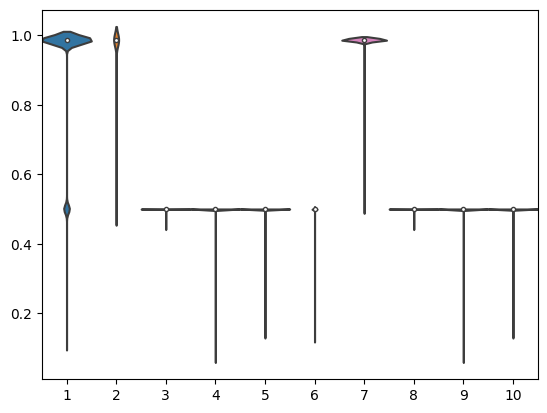

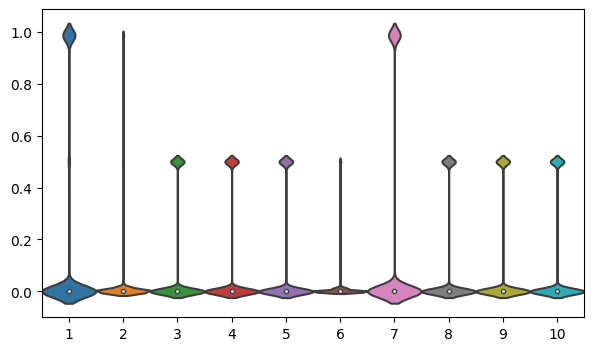

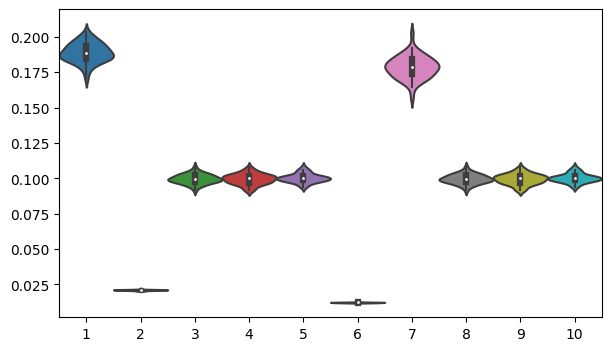

In [28]:
for repeat in repeats:
    
    with open(f'{save_dir}hmm_ICA_25_state_10/{repeat}/inf_params/alp.pkl','rb') as file:
        alpha = pickle.load(file)
        
    fo = fractional_occupancies(alpha)
    
    alpha_plot = np.concatenate(alpha,axis=0).T
    
    x, y = [], []
    for i in range(len(alpha_plot)):
        alpha_state = alpha_plot[i]
        temp = alpha_state[alpha_state>0.05]
        x.append(np.ones(len(temp)) * (i+1))
        y.append(temp)
    
    x = np.concatenate(x,axis=0).astype(int)
    y = np.concatenate(y,axis=0)
    
    sns_kwargs = {'scale':'count','width': 1}
    sns.violinplot(x=x,y=y,**sns_kwargs)
    #np.concatenate(alpha,axis=0).T,fig_kwargs={'figsize': (10, 4)},sns_kwargs = {'scale':'count','width': 1})
    plt.show()
    
    fig,ax = plot_violin(alpha_plot,
                         #fig_kwargs={'figsize': (10, 4)},
                         sns_kwargs = {'scale':'count','width': 1})
    plt.show()
    
    fig,ax = plot_violin(fo.T,
                         #fig_kwargs={'figsize': (10, 4)},
                         sns_kwargs = {'scale':'count','width': 1})
    plt.show()

## Update 14th March 2024

Today we try to implement the "cross validation"

In [4]:
import os
import json
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [10]:
save_dir = './results_HCP_cv/'
N_states = list(range(2,36))
N_splits = 10

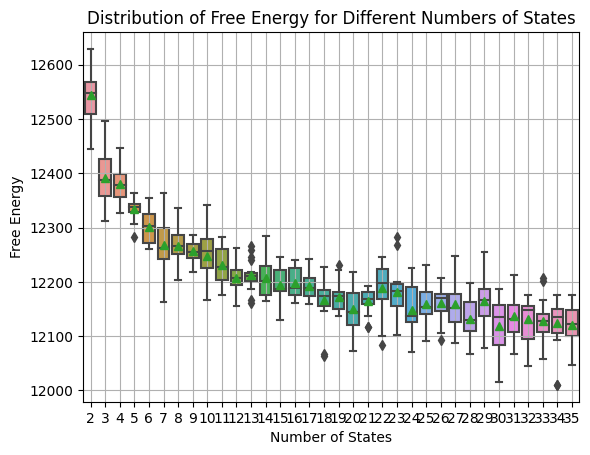

In [11]:
# Initialize a dictionary to store free energy values for each number of states
free_energy_dict = {N_state: [] for N_state in N_states}

# Loop through each value of N_states
for N_state in N_states:
    # Loop through each repeat
    for i in range(1,N_splits+1):
        # Define the path to the JSON file for the free energy
        for j in range(2):
            file_path = os.path.join(save_dir, f'hmm_ICA_25_state_{N_state}/cv_{i}/free_energy_cv_{j+1}.json')
            # Load the JSON file
            with open(file_path, 'r') as f:
                metrics = json.load(f)
            # Extract the 'free_energy' value and append it to the dictionary
            free_energy = metrics['free_energy']
            free_energy_dict[N_state].append(free_energy)

# Plot boxplots of the free energy values for each number of states
sns.boxplot(data=list(free_energy_dict.values()), showmeans=True)
plt.xlabel('Number of States')
plt.ylabel('Free Energy')
plt.title('Distribution of Free Energy for Different Numbers of States')
plt.xticks(ticks=range(len(N_states)), labels=N_states)
plt.grid(True)
plt.show()

## Update 18th March 2024

Now we try to implement bi-cross validation as Fu and Perry has done in the 2017 paper

In [1]:
import os
import json
import pickle
import numpy as np
import random
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [9]:
# Speicify the save directory
save_dir = './results_simulation_bicv/toy_gaussian/results_one_cluster/'
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

In [13]:
# Generate data
data_dir = f'./results_simulation_bicv/toy_gaussian/data/one_cluster/'
if not os.path.exists(data_dir):
    os.makedirs(data_dir)

In [14]:
rhos = [x / 5 for x in range(0, 5)]

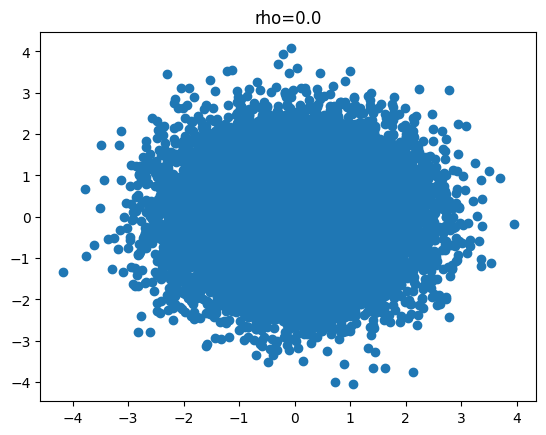

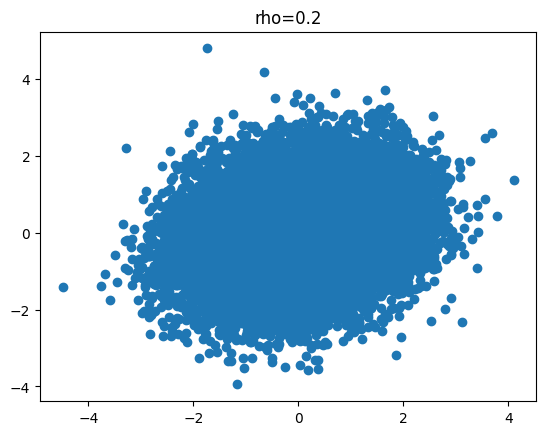

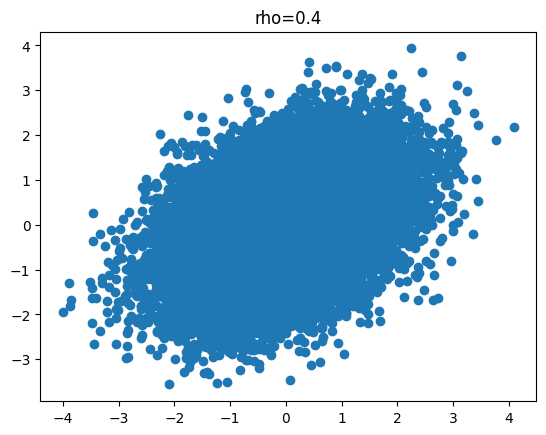

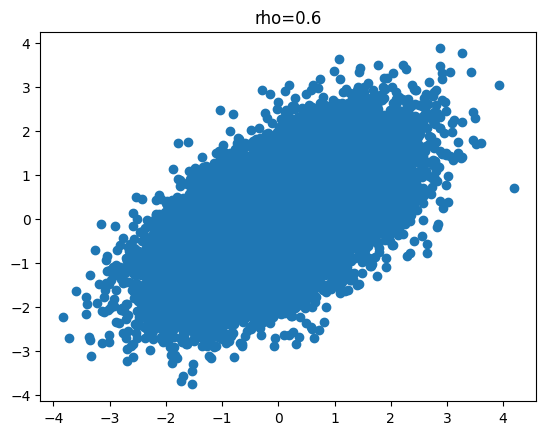

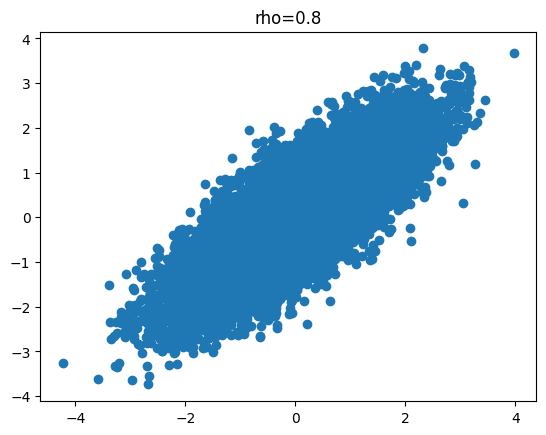

In [31]:
for rho in rhos:
    # Define the covariance matrix
    cov = np.array([[1, rho], [rho, 1]])
    observations = np.random.multivariate_normal(mean=[0, 0], cov=cov, size=20000)
    plt.scatter(observations.T[0,:],observations.T[1,:])
    plt.title(f'rho={rho}')
    plt.show()
    np.save(f'{data_dir}rho_{rho}.npy',observations)

In [4]:
from osl_dynamics.evaluate.cross_validation import BICVkmeans

/well/win-fmrib-analysis/users/uap971/conda/skylake/envs/osld/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [19]:
for rho in rhos:
    data = np.load(f'{data_dir}rho_{rho}.npy')
    n_samples, n_channels = data.shape
    for k in range(1,6): 
        cv = BICVkmeans(n_clusters=k,n_samples=n_samples,n_channels=n_channels)
        new_save_dir = os.path.join(save_dir,f'rho_{rho}_k_{k}')
        if not os.path.exists(new_save_dir):
            os.makedirs(new_save_dir)
        metrics = cv.validate(data,new_save_dir)
        # Save list to JSON file
        with open(os.path.join(save_dir,f'rho_{rho}_k_{k}.json'), 'w') as f:
            json.dump(metrics, f)

/well/win-fmrib-analysis/users/uap971/conda/skylake/envs/osld/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/well/win-fmrib-analysis/users/uap971/conda/skylake/envs/osld/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/well/win-fmrib-analysis/users/uap971/conda/skylake/envs/osld/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/well/win-fmrib-analysis/users/uap971/conda/skylake/envs/osld/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The defaul

/well/win-fmrib-analysis/users/uap971/conda/skylake/envs/osld/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/well/win-fmrib-analysis/users/uap971/conda/skylake/envs/osld/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/well/win-fmrib-analysis/users/uap971/conda/skylake/envs/osld/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/well/win-fmrib-analysis/users/uap971/conda/skylake/envs/osld/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The defaul

/well/win-fmrib-analysis/users/uap971/conda/skylake/envs/osld/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/well/win-fmrib-analysis/users/uap971/conda/skylake/envs/osld/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/well/win-fmrib-analysis/users/uap971/conda/skylake/envs/osld/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/well/win-fmrib-analysis/users/uap971/conda/skylake/envs/osld/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The defaul

/well/win-fmrib-analysis/users/uap971/conda/skylake/envs/osld/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/well/win-fmrib-analysis/users/uap971/conda/skylake/envs/osld/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/well/win-fmrib-analysis/users/uap971/conda/skylake/envs/osld/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/well/win-fmrib-analysis/users/uap971/conda/skylake/envs/osld/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The defaul

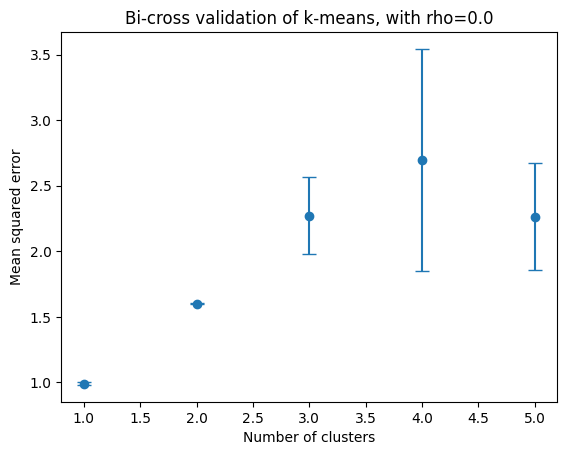

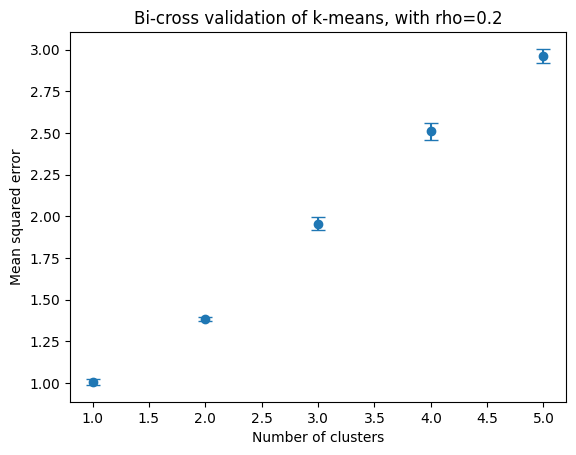

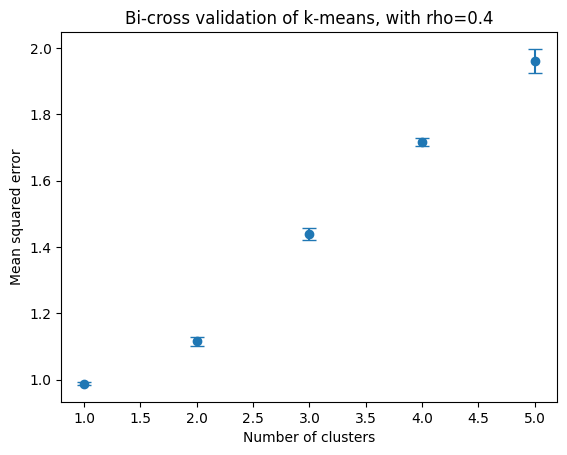

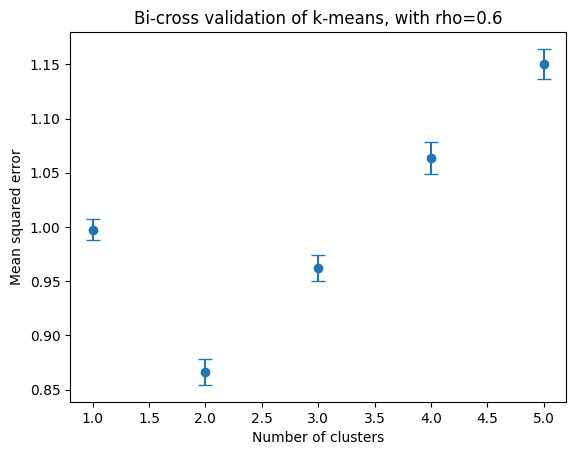

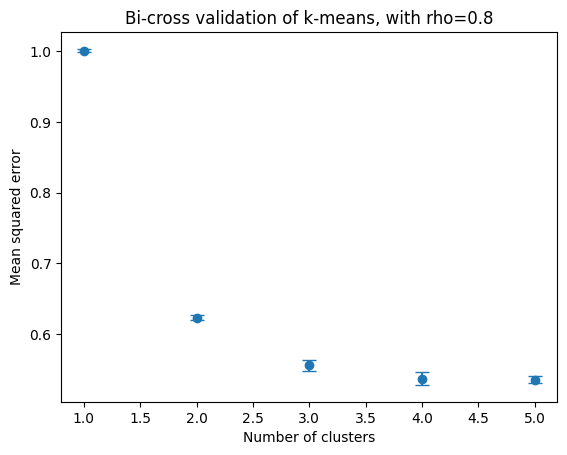

In [20]:
for rho in rhos:
    k_values = []
    mean_values = []
    std_values = []
    for k in range(1,6):
        # Load the JSON file
        with open(os.path.join(save_dir,f'rho_{rho}_k_{k}.json'), 'r') as file:
            values = json.load(file)
        
        # Calculate mean and standard deviation
        mean_k = np.mean(values)
        std_k = np.std(values)

        # Store values
        k_values.append(k)
        mean_values.append(mean_k)
        std_values.append(std_k)

    # Plot mean values with error bars
    plt.errorbar(k_values, mean_values, yerr=std_values, fmt='o', capsize=5)
    plt.xlabel('Number of clusters')
    plt.ylabel('Mean squared error')
    plt.title(f'Bi-cross validation of k-means, with rho={rho}')
    plt.show()

## The second example

There are four clusters in 10-dimensional space

The shape of X:  (8000, 10)


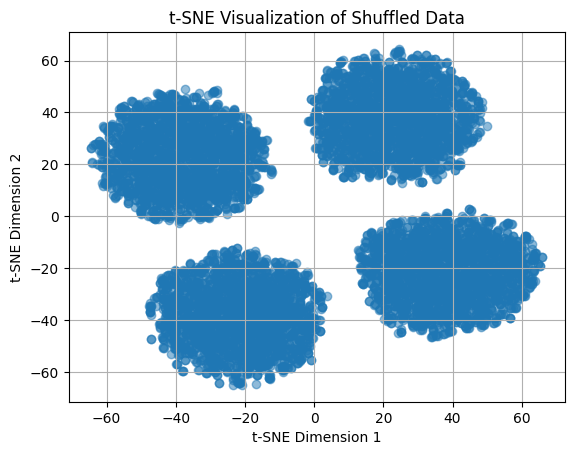

In [17]:
import numpy as np
from sklearn.datasets import make_blobs
from sklearn.utils import shuffle
from sklearn.manifold import TSNE

# Set random seed for reproducibility
np.random.seed(42)

# Generate four clusters of Gaussian random variables
X, y = make_blobs(n_samples=8000, n_features=10, centers=4, cluster_std=1.0, random_state=42)
print('The shape of X: ',X.shape)

# Shuffle the data
X_shuffled, y_shuffled = shuffle(X, y, random_state=42)


# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X_shuffled)

# Plot the reduced data
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], alpha=0.5)
plt.title('t-SNE Visualization of Shuffled Data')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.grid(True)
plt.show()
np.save(os.path.join(data_dir,'four_clusters_10D.npy'),X_shuffled)

In [18]:
new_save_dir = os.path.join(save_dir,'results_four_clusters_10D/')
if not os.path.exists(new_save_dir):
    os.makedirs(new_save_dir)
    
data = np.load(os.path.join(data_dir,'four_clusters_10D.npy'))
n_samples, n_channels = data.shape
for k in range(1,10): 
    cv = BICVkmeans(n_clusters=k,n_samples=n_samples,n_channels=n_channels)
    metrics = cv.validate(data)
    # Save list to JSON file
    with open(os.path.join(new_save_dir,f'rho_{rho}_k_{k}.json'), 'w') as f:
        json.dump(metrics, f)

/well/win-fmrib-analysis/users/uap971/conda/skylake/envs/osld/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/well/win-fmrib-analysis/users/uap971/conda/skylake/envs/osld/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/well/win-fmrib-analysis/users/uap971/conda/skylake/envs/osld/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/well/win-fmrib-analysis/users/uap971/conda/skylake/envs/osld/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The defaul

/well/win-fmrib-analysis/users/uap971/conda/skylake/envs/osld/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/well/win-fmrib-analysis/users/uap971/conda/skylake/envs/osld/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/well/win-fmrib-analysis/users/uap971/conda/skylake/envs/osld/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/well/win-fmrib-analysis/users/uap971/conda/skylake/envs/osld/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The defaul

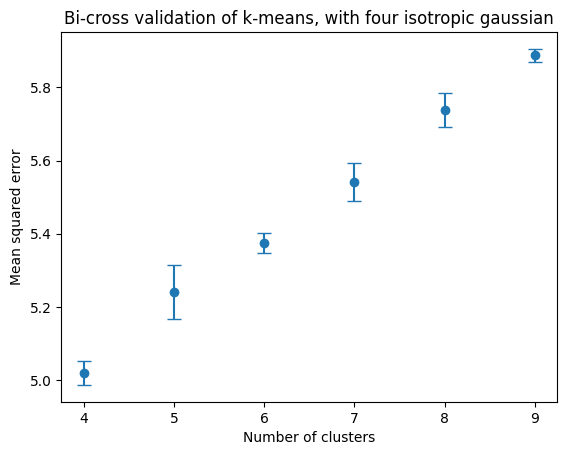

In [23]:
k_values = []
mean_values = []
std_values = []
for k in range(4,10):
    # Load the JSON file
    with open(os.path.join(new_save_dir,f'rho_{rho}_k_{k}.json'), 'r') as file:
        values = json.load(file)
        
    # Calculate mean and standard deviation
    mean_k = np.mean(values)
    std_k = np.std(values)

    # Store values
    k_values.append(k)
    mean_values.append(mean_k)
    std_values.append(std_k)

# Plot mean values with error bars
plt.errorbar(k_values, mean_values, yerr=std_values, fmt='o', capsize=5)
plt.xlabel('Number of clusters')
plt.ylabel('Mean squared error')
plt.title(f'Bi-cross validation of k-means, with four isotropic gaussian')
plt.show()

## Update 22nd March 2024

Check the log-likelihood result on bi-cross validation

In [16]:
import os
import json
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [62]:
save_dir = './results_HCP_bicv_confirm/'
N_states = list(range(2,13))
N_cv = 10

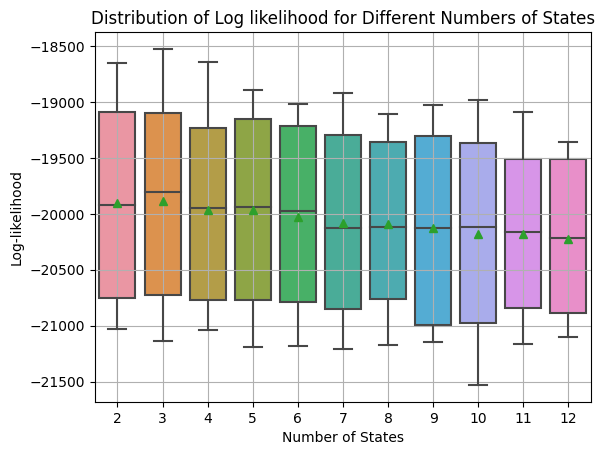

In [63]:
# Initialize a dictionary to store free energy values for each number of states
metric_dict = {N_state: [] for N_state in N_states}

# Loop through each value of N_states
for N_state in N_states:
    # Loop through each repeat
    for i in range(1,N_cv+1):
        try:
            file_path = os.path.join(save_dir, f'hmm_ICA_25_state_{N_state}/cv_{i}/metrics.json')
            # Load the JSON file
            with open(file_path, 'r') as f:
                metrics = json.load(f)
            # Extract the 'free_energy' value and append it to the dictionary
            metric_dict[N_state].extend(metrics)
        except Exception as e:
            print(f'N_state={N_state},i={i} not successful!')

# Plot boxplots of the free energy values for each number of states
sns.boxplot(data=list(metric_dict.values()), showmeans=True)
plt.xlabel('Number of States')
plt.ylabel('Log-likelihood')
plt.title('Distribution of Log likelihood for Different Numbers of States')
plt.xticks(ticks=range(len(N_states)), labels=N_states)
plt.grid(True)
plt.show()

### Update 27th March 2024

This part is to replicate Steve's bi-cross validation on SVD.

In [78]:
import numpy as np
from numpy.linalg import svd
import matplotlib.pyplot as plt
%matplotlib inline

In [170]:
N_1 = 100
N_2 = 100
D = 10
E = 20.0

In [171]:
U = np.random.randn(N_1, D) ** 3
V = np.random.randn(N_2, D) ** 3
Z = np.dot(U, V.T)
print(Z.shape)
Z += E * np.random.randn(*Z.shape)

(100, 100)


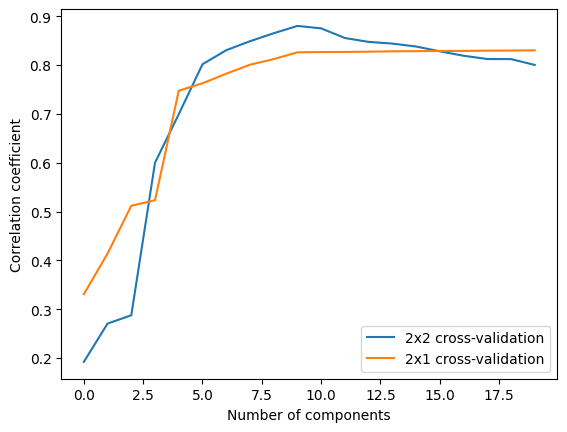

In [172]:
SCORES = np.zeros((20, 2))
for d in range(1, 21):
    # 2x2 cross-validation
    Xtrain = Z[:N_1//2, :N_2//2]
    Ytrain = Z[:N_1//2, N_2//2:]
    Xtest = Z[N_1//2:, :N_2//2]
    Ytest = Z[N_1//2:, N_2//2:]

    YtrainU, YtrainS, YtrainVt = svd(Ytrain, full_matrices=False)
    YtrainU = YtrainU[:,:d]
    YtrainS = YtrainS[:d]
    YtrainVt = YtrainVt[:d,:]
    XtrainVt = np.linalg.pinv(YtrainU) @ Xtrain
    XtestU = Xtest @ np.linalg.pinv(XtrainVt)
    YtestUV = XtestU @ np.diag(YtrainS) @ YtrainVt
    SCORES[d-1, 0] = np.corrcoef(Ytest.ravel(), YtestUV.ravel())[0, 1]
    
    # 2x1 cross-validation
    XYtrain = np.hstack((Xtrain, Ytrain))
    XYtest = np.hstack((Xtest, Ytest))
    XYtrainU, XYtrainS, XYtrainVt = svd(XYtrain, full_matrices=False)
    XYtrainU = XYtrainU[:,:d]
    XYtrainS = XYtrainS[:d]
    XYtrainVt = XYtrainVt[:d,:]
    XYtestU = XYtest @ np.linalg.pinv(XYtrainVt)
    XYtestUV = XYtestU @ np.diag(XYtrainS) @ XYtrainVt
    SCORES[d-1, 1] = np.corrcoef(XYtest.ravel(), XYtestUV.ravel())[0, 1]
    

plt.plot(SCORES)
plt.xlabel('Number of components')
plt.ylabel('Correlation coefficient')
plt.legend(['2x2 cross-validation', '2x1 cross-validation'])
plt.show()

In [106]:
U, S, Vt = svd(Z, full_matrices=False)
Z_recover = U @ np.diag(S) @ Vt
print(np.corrcoef(Z.ravel(), Z_recover.ravel())[0, 1])

1.0
